# Multi-class Sentiment Classification of customer text in Customer Support

### Overview:

Customer Support across the globe face multiple challenges when try to
solve customer queries. Very often customer support agents face a lot of
issues identifying sentiments and the intent of the customer at hand. We will
build a sub-system which will identify the customer’s emotion. To build a
system which can understand the text given by a user, and identify the
underlying emotions expressed by the user our text data has words which
reflect very close to Greetings, Backstory, Justification, Gratitude, Rants, or
Expressing Emotions. Identifying emotion beforehand and proceeding with
the customer cautiously can elevate the customer’s mood, as well as help us
in resolving their query.

### ML Formulation of Business Problem:
Customer Support across the globe is trying to resolve customer issues.
Identifying such issues, and solving them can be tricky. One needs to have
subject expertise, but very often subject expertise isn’t enough if customers
aren’t handled well enough emotionally. We will try to build a sub-system
which can identify the customer emotion before a particular response is sent
to the customer. Depending on the emotional state of the customer, we will
carefully use a sentence that can address the emotions of the customer and
then send them a first response as the emotion is identified. This type of a
system can also be used on forums, when customers sometimes express
their grievances on a forum.

Tourism industry is something that needs to handle their customers more
courteously as the industry solely depends on how a customer is being
treated. Customers who are willing to pay, want the services that they pay
for, and are typically in rush and excited. We want to address these
customers with care.

### Business Constraints:
1. Time constraint is not a constraint as we want to take a minimum of
half hour to address the customer.
2. Incorrect response will affect the travel agency


### Dataset Column Analysis:

Text - Consists of texts by the customer. This can be a query, or a grievance
or issues related to flight/train/bus booking.
One-Hot Encoded Labels:

Greeting - If the text contains e.g. “Good morning”, “Good evening” etc such
emotions it is marked with ‘1’ else ‘0’.

Backstory - If a customer gives us some background of what they are saying
e.g. “..My son’s graduation..”, “..husband likes to complain..”

Justification - If the customer gives a reason for taking some actions or
booking or any related things. “..the booking was created by mistake in
rush..”, “..cancel booking..”

Gratitude - If a customer appreciated the services or response. E.g “thank
you!”, “god bless”

Ranting - expressing dissatisfaction, negative emotions

Expressing emotions - Expressions not covered by rant like “ugh!”, ‘aah’, ‘i
love that’

Other - Repetitive statements, dates and time, not relational.

### Performance Metrics:
1. Micro-Averaged F1-Score (Mean F Score) :
   * The F1 score can be interpreted as a weighted average of the
precision and recall, where an F1 score reaches its best value at 1 and
worst score at 0. The relative contribution of precision and recall to the
F1 score are equal.
   * The formula for the F1 score is:
_F1_ = _2_ * (precision * _recall_) / (_precision_ + _recall_)
   * In the multi-class and multi-label case, this is the weighted average of
the F1 score of each class.
   * _Micro f1 score_: Calculate metrics globally by counting the total true
positives, false negatives and false positives. This is a better metric
when we have class imbalance.
   * _Macro f1 score_: Calculate metrics for each label, and find their
unweighted mean. This does not take label imbalance into account.

2. Hamming loss: The Hamming loss is the fraction of labels that are
incorrectly predicted.

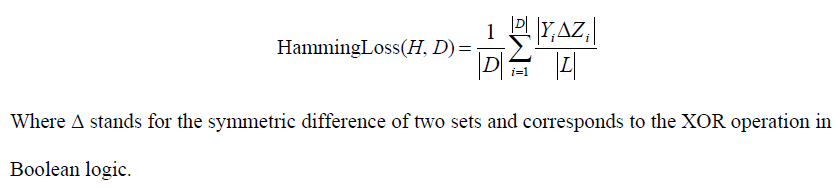

In [ ]:
#!pip install -U nltk
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
!pip install chart-studio
!pip install plotly
!pip install catboost
!pip install optuna
!pip install hyperopt
!pip install vaderSentiment
!pip install nlpaug

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
     |████████████████████████████████| 64 kB 2.1 MB/s 
     |████████████████████████████████| 67.4 MB 44 kB/s 
     |████████████████████████████████| 302 kB 12.5 MB/s 
     |████████████████████████████████| 80 kB 7.5 MB/s 
     |████████████████████████████████| 164 kB 45.0 MB/s 
     |████████████████████████████████| 75 kB 4.5 MB/s 
     |████████████████████████████████| 49 kB 5.9 MB/s 
     |████████████████████████████████| 141 kB 68.8 MB/s 
     |████████████████████████████████| 111 kB 61.5 MB/s 
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11137 sha256=5d84f118ffdfeb0461

In [ ]:
!pip install transformers

     |████████████████████████████████| 2.6 MB 10.8 MB/s 
     |████████████████████████████████| 636 kB 47.8 MB/s 
     |████████████████████████████████| 3.3 MB 35.2 MB/s 
     |████████████████████████████████| 895 kB 44.2 MB/s 
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
%matplotlib inline
import warnings
 
 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
import joblib
import os
import pickle
from tqdm.notebook import tqdm
from chart_studio.plotly import plot, iplot
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter
warnings.filterwarnings("ignore")
plt.style.use('seaborn')

In [ ]:
!gdown --id 13VXNiG3d98apB7L8f3luF-L4wyF3mxxx

Downloading...
From: https://drive.google.com/uc?id=13VXNiG3d98apB7L8f3luF-L4wyF3mxxx
To: /content/text_corpus.csv
3.60MB [00:00, 112MB/s]


In [ ]:
!gdown --id 1J-OjqQy7YThTbxFhqa_bVYiNc25N9FPf

Downloading...
From: https://drive.google.com/uc?id=1J-OjqQy7YThTbxFhqa_bVYiNc25N9FPf
To: /content/archive (1).zip
11.9MB [00:00, 45.0MB/s]


In [ ]:
!unzip 'archive (1).zip'

Archive:  archive (1).zip
  inflating: rsics_dataset/1_1_align.csv  
  inflating: rsics_dataset/1_2_align.csv  
  inflating: rsics_dataset/1_3_align.csv  
  inflating: rsics_dataset/1_4_align.csv  
  inflating: rsics_dataset/2_1_align.csv  
  inflating: rsics_dataset/2_2_align.csv  
  inflating: rsics_dataset/2_3_align.csv  
  inflating: rsics_dataset/2_4_align.csv  
  inflating: rsics_dataset/3_1_align.csv  
  inflating: rsics_dataset/3_2_align.csv  
  inflating: rsics_dataset/3_3_align.csv  
  inflating: rsics_dataset/3_4_align.csv  
  inflating: rsics_dataset/4_1_align.csv  
  inflating: rsics_dataset/4_2_align.csv  
  inflating: rsics_dataset/4_3_align.csv  
  inflating: rsics_dataset/4_4_align.csv  
  inflating: rsics_dataset/5_1_align.csv  
  inflating: rsics_dataset/5_2_align.csv  
  inflating: rsics_dataset/5_3_align.csv  
  inflating: rsics_dataset/5_4_align.csv  
  inflating: rsics_dataset/6_1_align.csv  
  inflating: rsics_dataset/6_2_align.csv  
  inflating: rsics_dataset/6

In [ ]:
from os import listdir
from os.path import isfile, join

my_path = "rsics_dataset/"

onlyfiles = [f for f in listdir(my_path) if isfile(join(my_path, f))]

In [ ]:
onlyfiles[0]

'all_multi_intent.csv'

In [ ]:
import re

def get_data(file_list):
    
    sentence_id = []
    text_data = []
    # loop through the list to get all file names
    for i in tqdm(range(len(file_list))):
        
        # if file name has align in it get the data
        if re.findall('align', file_list[i]) == ['align']:
            
            data = pd.read_csv(f'rsics_dataset/{file_list[i]}')
            
            for j in range(data.shape[0]-5):
                
                sent_id = data['Sentence ID'].values[j]
                
                text = data['Text'].values[j]
                
                if sent_id not in sentence_id:
                    
                    sentence_id.append(int(sent_id))
                
                    text_data.append(text)
                
    return sentence_id, text_data

In [ ]:
sentence_id, text_ = get_data(onlyfiles)

In [ ]:
df_emotions = pd.read_csv("rsics_dataset/tagged_selections_by_sentence.csv")

In [ ]:
df_emotions[(df_emotions['Greeting']==0) & (df_emotions['Backstory']==0) & (df_emotions['Justification']==0) & (df_emotions['Rant']==0) & (df_emotions['Gratitude']==0) & (df_emotions['Other']==0) & (df_emotions['Express Emotion']==0)]

,Dataset,Partition,SentenceID,Threshold,MergedSelections,Unselected,Selected,Greeting,Backstory,Justification,Rant,Gratitude,Other,Express Emotion
2,1,1,2191,2,BA has won their case in the High Court attack...,BA has won their case in the High Court attack...,NaN,0,0,0,0,0,0,0
4,1,1,2198,2,I have been advised that the best seating is i...,I have been advised that the best seating is i...,NaN,0,0,0,0,0,0,0
34,1,1,2141,2,Does anyone know if easyjet is withdrawing fli...,Does anyone know if easyjet is withdrawing fli...,NaN,0,0,0,0,0,0,0
45,1,1,1971,2,We have to travel to Sevilla and Bilbao from I...,We have to travel to Sevilla and Bilbao from I...,NaN,0,0,0,0,0,0,0
53,1,1,2170,2,Flying on United Airlines - Have one child age...,Flying on United Airlines - Have one child age...,NaN,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6750,4,2,10355,2,How do I get my e-mail messages to ead in rich...,How do I get my e-mail messages to ead in rich...,NaN,0,0,0,0,0,0,0
6751,4,2,10371,2,I am moving and want to have my service transf...,I am moving and want to have my service transf...,NaN,0,0,0,0,0,0,0
6754,4,2,10337,2,how can get my new credit card shipped to a di...,how can get my new credit card shipped to a di...,NaN,0,0,0,0,0,0,0
6757,4,2,10340,2,How can i upgrade my tv package to include the...,How can i upgrade my tv package to include the...,NaN,0,0,0,0,0,0,0


In [ ]:
rows = []
for i in range(len(sentence_id)):
    rows.append([sentence_id[i], text_[i]])

In [ ]:
df = pd.DataFrame(rows, columns=['SentenceID', 'Text'])

In [ ]:
df.head()

,SentenceID,Text
0,4001,want to fly to GSP from SMF then to tampa and ...
1,4002,I will be traveling in May and would like to u...
2,4003,The email said I was changed to a flight 3 hou...
3,4004,I flew in December and I attempted to move pre...
4,4005,I paid for upgrade but doesn't show on my chec...


In [ ]:
df[df['SentenceID']==10396]

,SentenceID,Text
6653,10396,I am a Bresnan customer and need help getting ...


In [ ]:
df = df.set_index('SentenceID').join(df_emotions.set_index('SentenceID'))

In [ ]:
df.head()

,Text,Dataset,Partition,Threshold,MergedSelections,Unselected,Selected,Greeting,Backstory,Justification,Rant,Gratitude,Other,Express Emotion
SentenceID,,,,,,,,,,,,,,
4001,want to fly to GSP from SMF then to tampa and ...,3,1,2,want to fly to GSP from SMF then to tampa and ...,want to fly to GSP from SMF then to tampa and ...,NaN,0,0,0,0,0,0,0
4002,I will be traveling in May and would like to u...,3,1,2,[I will be traveling in May and would like to ...,I don't have any information regarding how man...,I will be traveling in May and would like to u...,0,1,0,0,0,1,0
4003,The email said I was changed to a flight 3 hou...,3,1,2,The email said I was changed to a flight 3 hou...,The email said I was changed to a flight 3 hou...,"-- 4137 departs at 10:17am, the new flight dep...",0,1,0,0,0,0,0
4004,I flew in December and I attempted to move pre...,3,1,2,[I flew in December and ]I attempted to move p...,I attempted to move previous reservation to my...,I flew in December and and I thought I was su...,0,1,0,0,0,0,0
4005,I paid for upgrade but doesn't show on my chec...,3,1,2,I paid for upgrade but doesn't show on my chec...,I paid for upgrade but doesn't show on my chec...,NaN,0,0,0,0,0,0,0


In [ ]:
df.drop(['Dataset', 'Partition', 'MergedSelections','Threshold', 'Unselected', 'Selected'], axis=1, inplace=True)

In [ ]:
df.head()

,Text,Greeting,Backstory,Justification,Rant,Gratitude,Other,Express Emotion
SentenceID,,,,,,,,
4001,want to fly to GSP from SMF then to tampa and ...,0,0,0,0,0,0,0
4002,I will be traveling in May and would like to u...,0,1,0,0,0,1,0
4003,The email said I was changed to a flight 3 hou...,0,1,0,0,0,0,0
4004,I flew in December and I attempted to move pre...,0,1,0,0,0,0,0
4005,I paid for upgrade but doesn't show on my chec...,0,0,0,0,0,0,0


In [ ]:
df.to_csv('text_corpus.csv')

In [ ]:
df = pd.read_csv('text_corpus.csv')

In [ ]:
df.head()

,SentenceID,Text,Threshold,MergedSelections,Unselected,Selected,Greeting,Backstory,Justification,Rant,Gratitude,Other,Express Emotion
0,6507,What advantage is there in booking directly wi...,2,What advantage is there in booking directly wi...,What advantage is there in booking directly wi...,I have almost always booked with the airline b...,0,1,0,0,0,0,0
1,6508,"Hi, Could someone please confirm if CX 884 - H...",2,"Hi, Could someone please confirm if CX 884 - H...","Hi, Could someone please confirm if CX 884 - H...","The aircraft code shows 773, travel agent says...",0,0,1,0,1,0,0
2,6509,I will be transiting Dubai soon en route to Oz...,2,[I will be transiting Dubai soon en route to O...,If I buy a bottle after security screening at ...,I will be transiting Dubai soon en route to Oz...,0,1,0,0,0,0,1
3,6514,Does anyone know where I'd find estimated pric...,2,Does anyone know where I'd find estimated pric...,Does anyone know where I'd find estimated pric...,My vacation destination is up in the air at th...,0,1,0,0,1,0,0
4,6518,It's from BA and finds the cheapest BA flight ...,2,It's from BA and finds the cheapest BA flight ...,It's from BA and finds the cheapest BA flight ...,NaN,0,0,0,0,0,0,0


## Data Preprocessing

In [ ]:
import string
import re
from collections import Counter
from collections import defaultdict

In [ ]:
def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [ ]:
for i in tqdm(range(df.shape[0])):
    
    df.at[i, 'Text'] = decontracted(df['Text'].values[i])

In [ ]:
def Find(string):
  
    # findall() has been used 
    # with valid conditions for urls in string
    regex = r"(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:'\".,<>?«»“”‘’]))"
    url = re.findall(regex,string) 
    temp = ''
    for x in url:
      temp+=''.join(x[0])
    return temp

In [ ]:
def clean_text(df, feature):
    
    cleaned_text = []
    
    for i in tqdm(range(df.shape[0])):
        
        doc = df[feature].values[i]
        
        url = Find(doc)
        
        doc = re.sub(url, '', doc)
        
        doc = re.findall(r'\w+', doc)
        
        table = str.maketrans('', '', string.punctuation)
        
        stripped = [w.translate(table) for w in doc]
        
        doc = ' '.join(stripped)
        
        doc = doc.lower()

        # remove text followed by numbers
        doc = re.sub('[^A-Za-z0-9]+', ' ', doc)

        # remove text which appears inside < > or text preceeding or suceeding <, >
        doc = re.sub(r'< >|<.*?>|<>|\>|\<', ' ', doc)

        # remove anything inside brackets
        doc = re.sub(r'\(.*?\)', ' ', doc)
        
        # remove digits
        doc = re.sub(r'\d+', ' ', doc)
        cleaned_text.append(doc)
        
    return cleaned_text

In [ ]:
df.drop(['MergedSelections','Unselected','Selected','Threshold','SentenceID'], axis=1, inplace=True)

In [ ]:
df.head()

,Text,Greeting,Backstory,Justification,Rant,Gratitude,Other,Express Emotion
0,What advantage is there in booking directly wi...,0,1,0,0,0,0,0
1,"Hi, Could someone please confirm if CX 884 - H...",0,0,1,0,1,0,0
2,I will be transiting Dubai soon en route to Oz...,0,1,0,0,0,0,1
3,Does anyone know where I would find estimated ...,0,1,0,0,1,0,0
4,It is from BA and finds the cheapest BA flight...,0,0,0,0,0,0,0


In [ ]:
df['clean_text'] = clean_text(df, 'Text')

In [ ]:
temp = 0
for i in range(df.shape[0]):
  url = Find(df['Text'].values[i])
  if url==type(str):
    temp+=1

if temp>0:
  print('URL Found')
else:
  print('URL removed')

URL removed


In [ ]:
df.head()

,Text,Greeting,Backstory,Justification,Rant,Gratitude,Other,Express Emotion,clean_text
0,What advantage is there in booking directly wi...,0,1,0,0,0,0,0,what advantage is there in booking directly wi...
1,"Hi, Could someone please confirm if CX 884 - H...",0,0,1,0,1,0,0,hi could someone please confirm if cx hkg la...
2,I will be transiting Dubai soon en route to Oz...,0,1,0,0,0,0,1,i will be transiting dubai soon en route to oz...
3,Does anyone know where I would find estimated ...,0,1,0,0,1,0,0,does anyone know where i would find estimated ...
4,It is from BA and finds the cheapest BA flight...,0,0,0,0,0,0,0,it is from ba and finds the cheapest ba flight...


## Exploratory Data Analysis

How many sentences per sentiment we have in the dataset?

In [ ]:
emotions = ['Greeting', 'Backstory', 'Justification', 'Rant', 'Gratitude', 'Other', 'Express Emotion']
sent_dict = dict()

for i in range(len(emotions)):
  sent_dict[emotions[i]] = df[df[emotions[i]]==1].shape[0]
  sent_dict[emotions[i] + ' ' + '&' + ' ' + emotions[i-1]] = df[(df[emotions[i]]==1) & (df[emotions[i-1]]==1)].shape[0]
  sent_dict[emotions[i] + ' ' + '&' + ' ' + emotions[i-1] + ' ' + '&' + ' ' + emotions[i-2]] = df[(df[emotions[i]]==1) & (df[emotions[i-1]]==1) & (df[emotions[i-2]]==1)].shape[0]
  sent_dict[emotions[i] + ' ' + '&' + ' ' + emotions[i-1] + ' ' + '&' + ' ' + emotions[i-2] + ' ' + '&' + ' ' + emotions[i-3]] = df[(df[emotions[i]]==1) & (df[emotions[i-1]]==1) & 
                                                                                                                                                               (df[emotions[i-2]]==1)
                                                                                                                                                               & (df[emotions[i-3]]==1)].shape[0]
  sent_dict[emotions[i] + ' ' + '&' + ' ' + emotions[i-1] + ' ' + '&' + ' ' + emotions[i-2] + ' ' + '&' + ' ' + emotions[i-3]  + ' ' + '&' + ' ' + emotions[i-4]] = df[(df[emotions[i]]==1) & 
                                                                                                                                                                       (df[emotions[i-1]]==1) & 
                                                                                                                                                               (df[emotions[i-2]]==1)
                                                                                                                                                               & (df[emotions[i-3]]==1)
                                                                                                                                                               & (df[emotions[i-4]]==1)].shape[0]
  sent_dict[emotions[i] + ' ' + '&' + ' ' + emotions[i-1] + ' ' + '&' + ' ' + emotions[i-2] + ' ' + '&' + ' ' + emotions[i-3] + ' ' + '&' + ' ' + emotions[i-4] + ' ' + '&' + ' ' + emotions[i-5]] = df[(df[emotions[i]]==1) & 
                                                                                                                                                                       (df[emotions[i-1]]==1) & 
                                                                                                                                                               (df[emotions[i-2]]==1)
                                                                                                                                                               & (df[emotions[i-3]]==1)
                                                                                                                                                               & (df[emotions[i-4]]==1)
                                                                                                                                                               & (df[emotions[i-5]]==1)].shape[0]
  sent_dict[emotions[i] + ' ' + '&' + ' ' + emotions[i-1] + ' ' + '&' + ' ' + emotions[i-2] + ' ' + '&' + ' ' + emotions[i-3] + ' ' + '&' + ' ' + emotions[i-4] + ' ' + '&' + ' ' + emotions[i-5] + ' ' + '&' + ' ' + emotions[i-6]] = df[(df[emotions[i]]==1) & 
                                                                                                                                                                       (df[emotions[i-1]]==1) & 
                                                                                                                                                               (df[emotions[i-2]]==1)
                                                                                                                                                               & (df[emotions[i-3]]==1)
                                                                                                                                                               & (df[emotions[i-4]]==1)
                                                                                                                                                               & (df[emotions[i-5]]==1)
                                                                                                                                                               & (df[emotions[i-6]]==1)].shape[0]
                                                                                                                                                                                                                                                                                                         

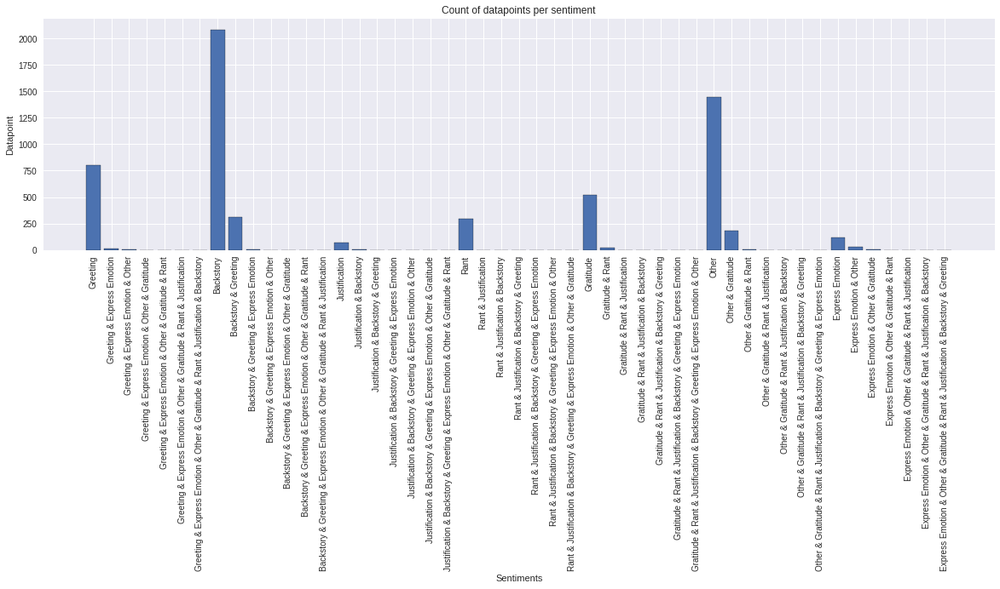

In [ ]:
keys = sent_dict.keys()
vals = sent_dict.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Sentiments')
plt.ylabel('Datapoint')
plt.xticks(rotation=90)
plt.title('Count of datapoints per sentiment')
plt.show()

It is evident that people love to talk, and give a back story in tourism. Of course, they need the services, so its important that the customer representative understand where they're coming from, and how important it is for them to put their point forward in a very descriptive way. 

We see that they are quite some ranting, and other, which is a mix of emotions.

We also see very few people being thankful for the services or query resolution.

Quite a lot of people do greet during the query, which is good, although it will be interesting to see which of the datapoints have multiple sentiments associated with it.

#### How many punctuations are used in each sentiment?

In [ ]:
greeting = df[df['Greeting']==1]

#### Get Punctuations per text, punctuation counts

In [ ]:
def get_punctuations(data, feature):
    
    # get unique punctuations into the list
    # We are adding one to each punctuation since we want to find ratio of punc
    # we may encounter divide by zero error 
    p_dict = dict([(i,1) for i in string.punctuation])
    
    # Get all the punctuations from text and count them
    for i in tqdm(range(data.shape[0])):
        
        text = data[feature].values[i]
        
        pattern = r'\~|\!|\@|\#|\$|\%|\^|\&|\*|\(|\)|\-\+|\,|\"|\?|\.|\:|\;|\=|\[|\]|\{|\}|\_|\\|\/'
        
        punctuations = re.findall(pattern, text)
        
        for p in punctuations:
            
            if p in p_dict.keys():
                
                p_dict[p] +=1           
    
    # https://stackoverflow.com/a/26367880/10632473
    punc_per_text = defaultdict(list)
    
    for i in tqdm(range(data.shape[0])):
            
        text = data[feature].values[i]
            
        punc = re.findall(pattern, text)
        
        counts = Counter(punc)
        
        for punctuation in p_dict:
                
            if counts.get(punctuation)==None:
                    
                punc_per_text[punctuation].append(1)
                
            if counts.get(punctuation)!=None:
                
                punc_per_text[punctuation].append(counts.get(punctuation))
            
    return p_dict, punc_per_text

In [ ]:
punc_dict_greeting, _ = get_punctuations(greeting, 'Text')

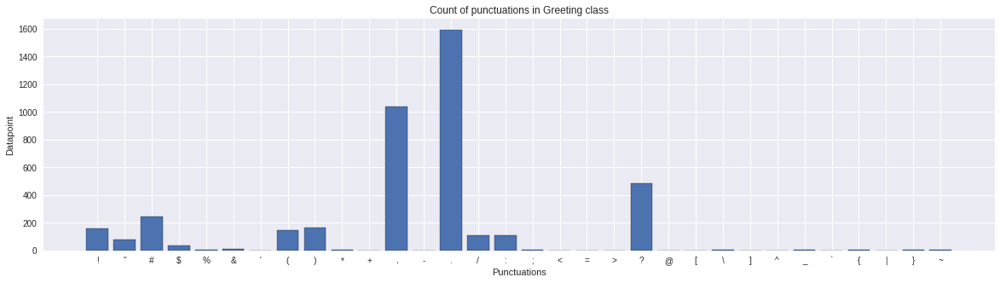

In [ ]:
keys = punc_dict_greeting.keys()
vals = punc_dict_greeting.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Punctuations')
plt.ylabel('Datapoint')
plt.title('Count of punctuations in Greeting class')
plt.show()

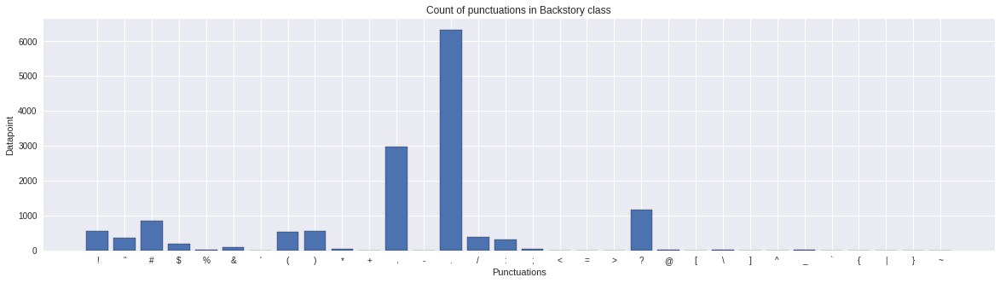

In [ ]:
backstory = df[df['Backstory']==1]
punc_dict_backstory, _ = get_punctuations(backstory, 'Text')

keys = punc_dict_backstory.keys()
vals = punc_dict_backstory.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Punctuations')
plt.ylabel('Datapoint')
plt.title('Count of punctuations in Backstory class')
plt.show()

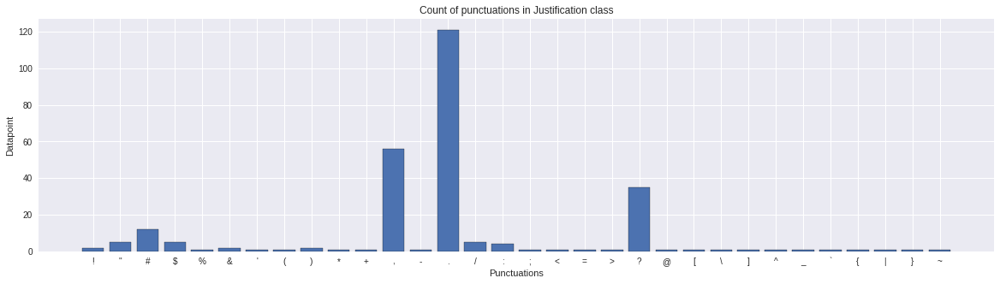

In [ ]:
justifn = df[df['Justification']==1]
punc_dict_justifn, _ = get_punctuations(justifn, 'Text')

keys = punc_dict_justifn.keys()
vals = punc_dict_justifn.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Punctuations')
plt.ylabel('Datapoint')
plt.title('Count of punctuations in Justification class')
plt.show()

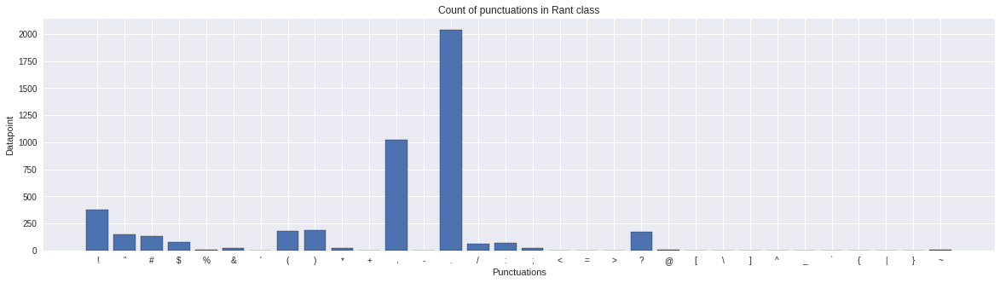

In [ ]:
rant = df[df['Rant']==1]
punc_dict_rant, _ = get_punctuations(rant, 'Text')

keys = punc_dict_rant.keys()
vals = punc_dict_rant.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Punctuations')
plt.ylabel('Datapoint')
plt.title('Count of punctuations in Rant class')
plt.show()

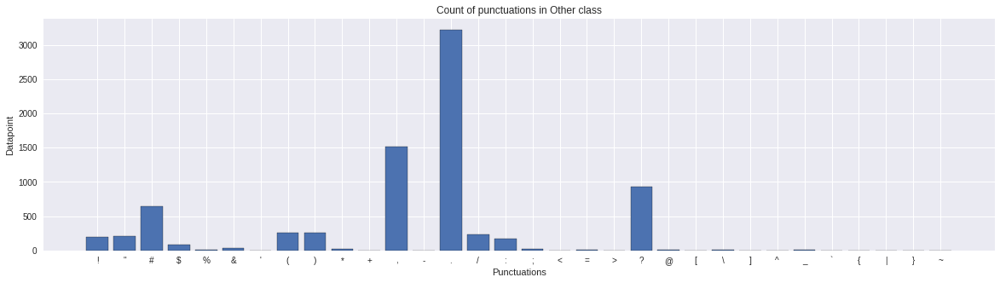

In [ ]:
other = df[df['Other']==1]
punc_dict_other, _ = get_punctuations(other, 'Text')

keys = punc_dict_other.keys()
vals = punc_dict_other.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Punctuations')
plt.ylabel('Datapoint')
plt.title('Count of punctuations in Other class')
plt.show()

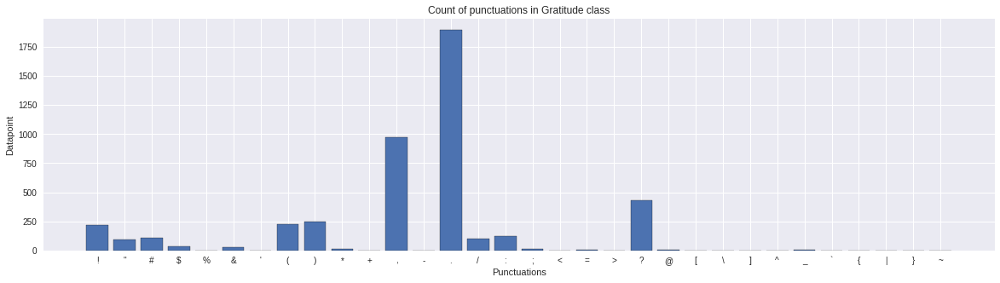

In [ ]:
gratitude = df[df['Gratitude']==1]
punc_dict_gratitude, _ = get_punctuations(gratitude, 'Text')

keys = punc_dict_gratitude.keys()
vals = punc_dict_gratitude.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Punctuations')
plt.ylabel('Datapoint')
plt.title('Count of punctuations in Gratitude class')
plt.show()

The gratitude type of sentences have lot periods, commas, question mark, and exclamation. Although we can see similar distribution across all sentiment classes

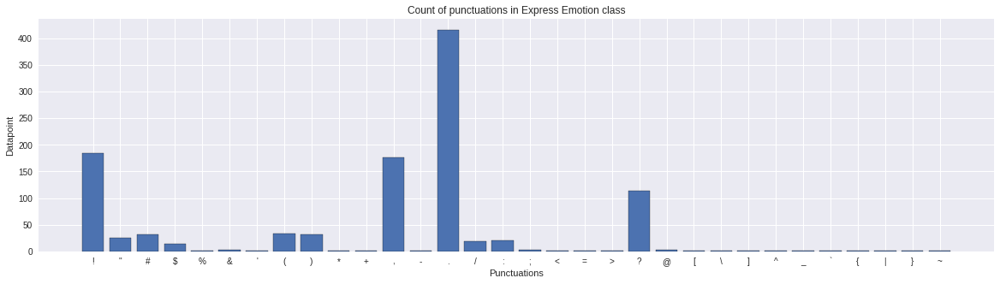

In [ ]:
expemo = df[df['Express Emotion']==1]
punc_dict_expemo, _ = get_punctuations(expemo, 'Text')

keys = punc_dict_expemo.keys()
vals = punc_dict_expemo.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Punctuations')
plt.ylabel('Datapoint')
plt.title('Count of punctuations in Express Emotion class')
plt.show()

As we can say that when people express emotions, they use lot of punctuations. Lot of periods. While expressing emotions, people do often ask questions as well, so we can see quite some question marks.

### Statistics of words in each sentiment

In [ ]:
word_length = []

for i in range(greeting.shape[0]):
  sent = greeting['clean_text'].values[i]

  words = re.findall(r'\w+', sent)

  word_length.append(len(words))

min_dict = dict()
max_dict = dict()
mean_dict = dict()

min_words = np.min(word_length)
max_words = np.max(word_length)
mean_words = np.mean(word_length)

min_dict['Greeting'] = min_words
max_dict['Greeting'] = max_words
mean_dict['Greeting'] = mean_words

print(f'Min number of words in sentence of Greeting class: {min_words}')
print('\n')
print(f'Max number of words in sentence of Greeting class: {max_words}')
print('\n')
print(f'Mean of words in sentence of Greeting class: {mean_words}')

Min number of words in sentence of Greeting class: 9


Max number of words in sentence of Greeting class: 301


Mean of words in sentence of Greeting class: 39.19077306733167


In [ ]:
word_length = []

for i in range(backstory.shape[0]):
  sent = backstory['clean_text'].values[i]

  words = re.findall(r'\w+', sent)

  word_length.append(len(words))

min_words = np.min(word_length)
max_words = np.max(word_length)
mean_words = np.mean(word_length)

min_dict['Backstory'] = min_words
max_dict['Backstory'] = max_words
mean_dict['Backstory'] = mean_words

print(f'Min number of words in sentence of Backstory class: {min_words}')
print('\n')
print(f'Max number of words in sentence of Backstory class: {max_words}')
print('\n')
print(f'Mean of words in sentence of Backstory class: {mean_words}')

Min number of words in sentence of Backstory class: 7


Max number of words in sentence of Backstory class: 861


Mean of words in sentence of Backstory class: 54.68072866730585


In [ ]:
word_length = []

for i in range(justifn.shape[0]):
  sent = justifn['clean_text'].values[i]

  words = re.findall(r'\w+', sent)

  word_length.append(len(words))


min_words = np.min(word_length)
max_words = np.max(word_length)
mean_words = np.mean(word_length)

min_dict['Justification'] = min_words
max_dict['Justification'] = max_words
mean_dict['Justification'] = mean_words

print(f'Min number of words in sentence of Justification class: {min_words}')
print('\n')
print(f'Max number of words in sentence of Justification class: {max_words}')
print('\n')
print(f'Mean of words in sentence of Justification class: {mean_words}')

Min number of words in sentence of Justification class: 12


Max number of words in sentence of Justification class: 141


Mean of words in sentence of Justification class: 30.458333333333332


In [ ]:
word_length = []

for i in range(rant.shape[0]):
  sent = rant['clean_text'].values[i]

  words = re.findall(r'\w+', sent)

  word_length.append(len(words))

min_words = np.min(word_length)
max_words = np.max(word_length)
mean_words = np.mean(word_length)

min_dict['Rant'] = min_words
max_dict['Rant'] = max_words
mean_dict['Rant'] = mean_words

print(f'Min number of words in sentence of Rant class: {min_words}')
print('\n')
print(f'Max number of words in sentence of Rant class: {max_words}')
print('\n')
print(f'Mean of words in sentence of Rant class: {mean_words}')

Min number of words in sentence of Rant class: 12


Max number of words in sentence of Rant class: 861


Mean of words in sentence of Rant class: 119.92150170648465


In [ ]:
word_length = []

for i in range(gratitude.shape[0]):
  sent = gratitude['clean_text'].values[i]

  words = re.findall(r'\w+', sent)

  word_length.append(len(words))

min_words = np.min(word_length)
max_words = np.max(word_length)
mean_words = np.mean(word_length)

min_dict['Gratitude'] = min_words
max_dict['Gratitude'] = max_words
mean_dict['Gratitude'] = mean_words

print(f'Min number of words in sentence of Gratitude class: {min_words}')
print('\n')
print(f'Max number of words in sentence of Gratitude class: {max_words}')
print('\n')
print(f'Mean of words in sentence of Gratitude class: {mean_words}')

Min number of words in sentence of Gratitude class: 8


Max number of words in sentence of Gratitude class: 416


Mean of words in sentence of Gratitude class: 66.33976833976834


In [ ]:
word_length = []

for i in range(other.shape[0]):
  sent = other['clean_text'].values[i]

  words = re.findall(r'\w+', sent)

  word_length.append(len(words))

min_words = np.min(word_length)
max_words = np.max(word_length)
mean_words = np.mean(word_length)

min_dict['Other'] = min_words
max_dict['Other'] = max_words
mean_dict['Other'] = mean_words

print(f'Min number of words in sentence of Other class: {min_words}')
print('\n')
print(f'Max number of words in sentence of Other class: {max_words}')
print('\n')
print(f'Mean of words in sentence of Other class: {mean_words}')

Min number of words in sentence of Other class: 8


Max number of words in sentence of Other class: 538


Mean of words in sentence of Other class: 38.94529085872576


In [ ]:
word_length = []

for i in range(expemo.shape[0]):
  sent = expemo['clean_text'].values[i]

  words = re.findall(r'\w+', sent)

  word_length.append(len(words))

min_words = np.min(word_length)
max_words = np.max(word_length)
mean_words = np.mean(word_length)

min_dict['Express Emotion'] = min_words
max_dict['Express Emotion'] = max_words
mean_dict['Express Emotion'] = mean_words

print(f'Min number of words in sentence of Express Emotion class: {min_words}')
print('\n')
print(f'Max number of words in sentence of Express Emotion class: {max_words}')
print('\n')
print(f'Mean of words in sentence of Express Emotion class: {mean_words}')

Min number of words in sentence of Express Emotion class: 11


Max number of words in sentence of Express Emotion class: 390


Mean of words in sentence of Express Emotion class: 60.516666666666666


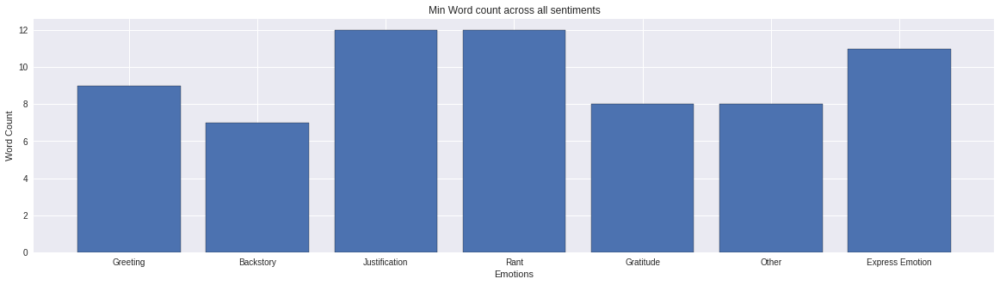

In [ ]:
keys = min_dict.keys()
vals = min_dict.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Emotions')
plt.ylabel('Word Count')
plt.title('Min Word count across all sentiments')
plt.show()

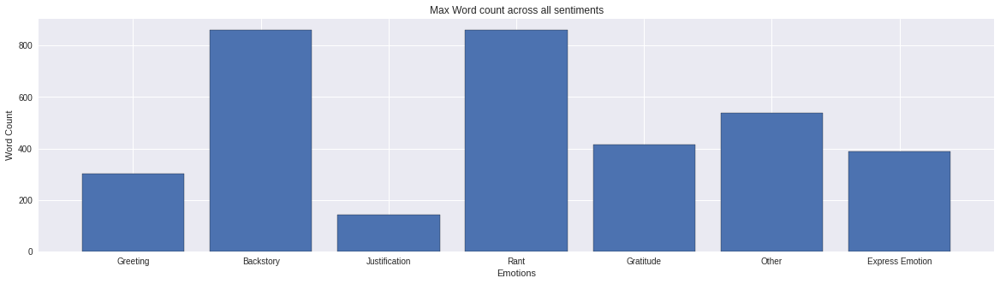

In [ ]:
keys = max_dict.keys()
vals = max_dict.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Emotions')
plt.ylabel('Word Count')
plt.title('Max Word count across all sentiments')
plt.show()

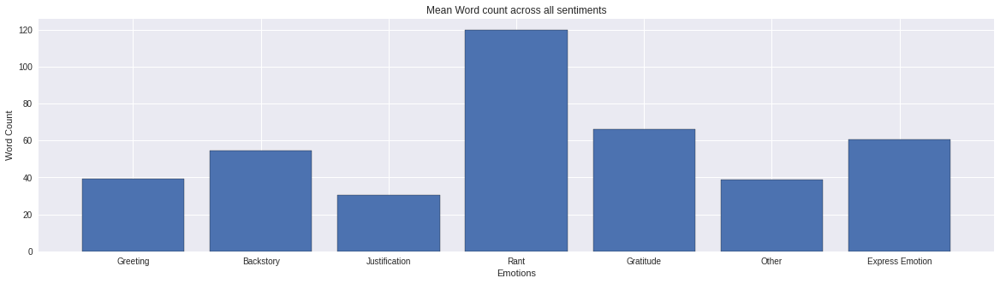

In [ ]:
keys = mean_dict.keys()
vals = mean_dict.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Emotions')
plt.ylabel('Word Count')
plt.title('Mean Word count across all sentiments')
plt.show()

Its evident from the above graphs that Rant, Gratitude and Express Emotions are the sentiments are the classes having longer sentences. Surprisingly backstory has less number of sentences, even justification has less number of words. 

## How many parts of speech exist per class?

| POS | Description |
| - | - |
| CC | coordinating conjunction|
|CD |cardinal digit|
|DT |determiner|
|EX |existential there (like: “there is” … think of it like “there exists”)|
|FW |foreign word|
|IN |preposition/subordinating conjunction|
|JJ| adjective ‘big’|
|JJR |adjective, comparative ‘bigger’|
|JJS |adjective, superlative ‘biggest’|
|LS| list marker 1)|
|MD |modal could, will|
|NN| noun, singular ‘desk’|
|NNS| noun plural ‘desks’|
|NNP |proper noun, singular ‘Harrison’|
|NNPS |proper noun, plural ‘Americans’|
|PDT |predeterminer ‘all the kids’|
|POS |possessive ending parent‘s|
|PRP| personal pronoun I, he, she|
|PRPS |possessive pronoun my, his, hers|
|RB |adverb very, silently,|
|RBR| adverb, comparative better|
|RBS |adverb, superlative best|
|RP| particle give up|
|TO |to go ‘to‘ the store.|
|UH |interjection errrrrrrrm|
|VB |verb, base form take|
|VBD| verb, past tense took|
|VBG |verb, gerund/present participle taking|
|VBN| verb, past participle taken|
|VBP |verb, sing. present, non-3d take|
|VBZ| verb, 3rd person sing. present takes|
|WDT| wh-determiner which|
|WP| wh-pronoun who, what|
|WP$ |possessive wh pronoun whose|
|WRB |wh-abverb where, when|

In [ ]:
from nltk.corpus import stopwords
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
def pos_vec(df):

  pos_vector = []

  for i in tqdm(range(df.shape[0])):

    doc = df['Text'].values[i]

    tokenized = sent_tokenize(doc)
    for i in tokenized:

      # Word tokenizers is used to find the words 
      # and punctuation in a string
      wordsList = nltk.word_tokenize(i)
  
      # removing stop words from wordList
      wordsList = [w for w in wordsList if not w in stop_words] 
  
      #  Using a Tagger. Which is part-of-speech 
      # tagger or POS-tagger. 
      tagged = nltk.pos_tag(wordsList)
  
      for tag in tagged:
        pos_vector.append(tag[1])
    
  return pos_vector



In [ ]:
pos_vector = pos_vec(greeting)

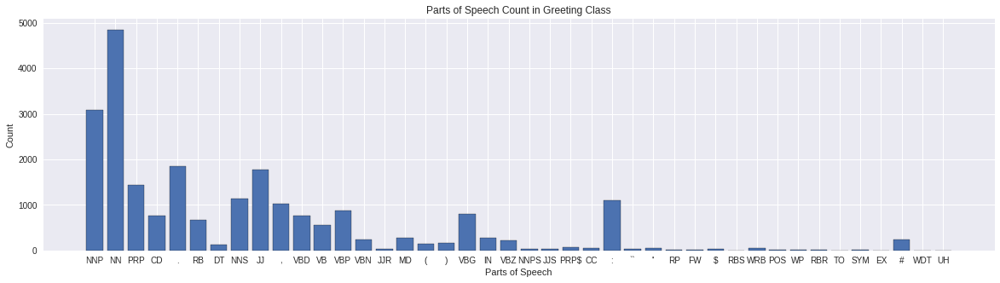

In [ ]:
greeting_pos = dict(Counter(pos_vector))

keys = greeting_pos.keys()
vals = greeting_pos.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Parts of Speech')
plt.ylabel('Count')
plt.title('Parts of Speech Count in Greeting Class')
plt.show()

In [ ]:
pos_vector = pos_vec(justifn)

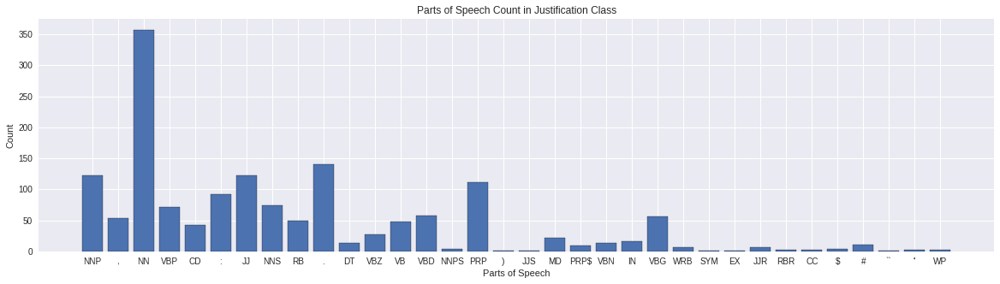

In [ ]:
justifn_pos = dict(Counter(pos_vector))

keys = justifn_pos.keys()
vals = justifn_pos.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Parts of Speech')
plt.ylabel('Count')
plt.title('Parts of Speech Count in Justification Class')
plt.show()

In [ ]:
pos_vector = pos_vec(rant)

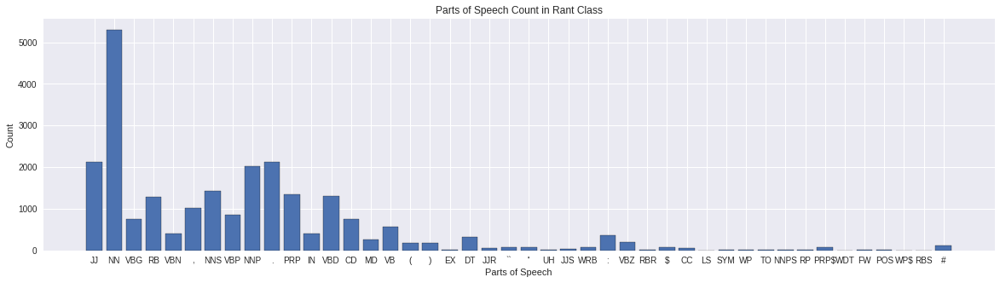

In [ ]:
rant_pos = dict(Counter(pos_vector))

keys = rant_pos.keys()
vals = rant_pos.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Parts of Speech')
plt.ylabel('Count')
plt.title('Parts of Speech Count in Rant Class')
plt.show()

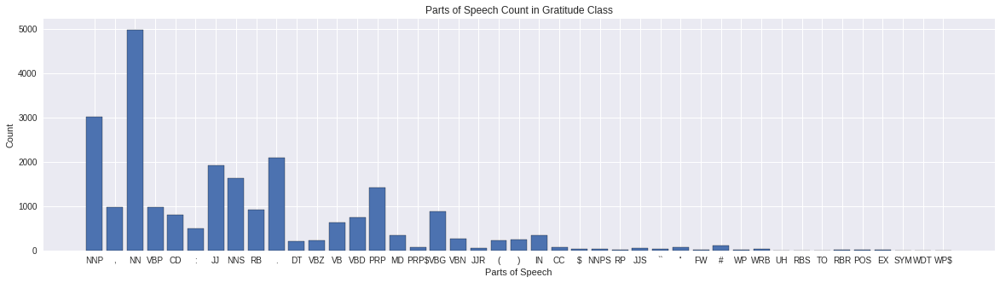

In [ ]:
pos_vector = pos_vec(gratitude)

gratitude_pos = dict(Counter(pos_vector))

keys = gratitude_pos.keys()
vals = gratitude_pos.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Parts of Speech')
plt.ylabel('Count')
plt.title('Parts of Speech Count in Gratitude Class')
plt.show()

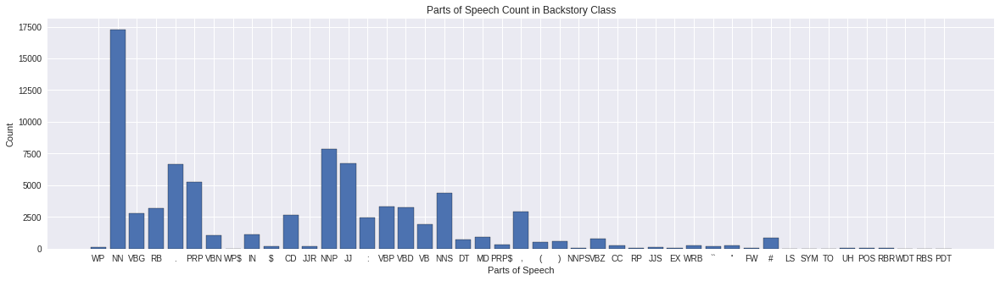

In [ ]:
pos_vector = pos_vec(backstory)

backstory_pos = dict(Counter(pos_vector))

keys = backstory_pos.keys()
vals = backstory_pos.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Parts of Speech')
plt.ylabel('Count')
plt.title('Parts of Speech Count in Backstory Class')
plt.show()

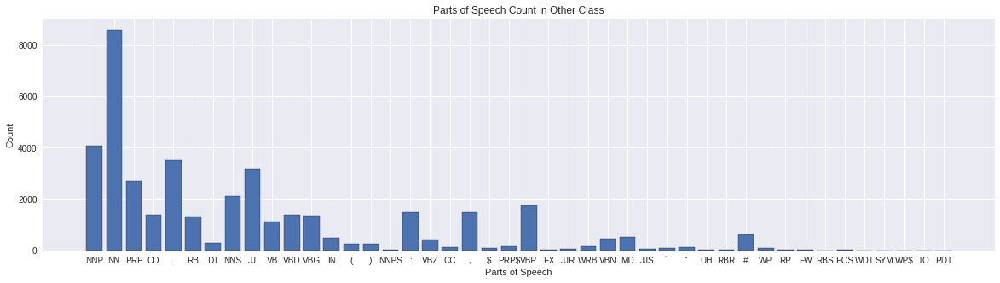

In [ ]:
pos_vector = pos_vec(other)

other_pos = dict(Counter(pos_vector))

keys = other_pos.keys()
vals = other_pos.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Parts of Speech')
plt.ylabel('Count')
plt.title('Parts of Speech Count in Other Class')
plt.show()

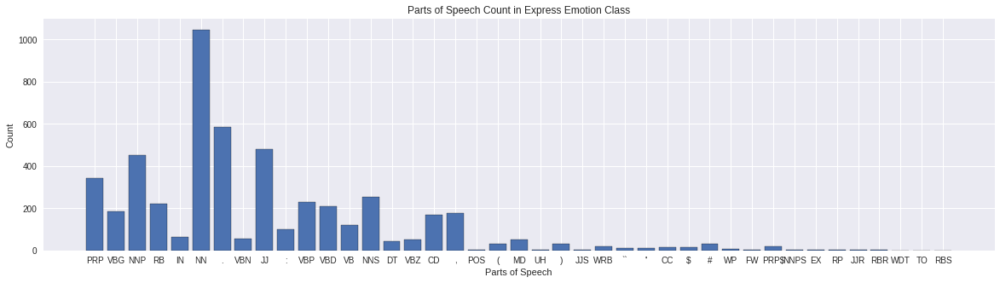

In [ ]:
pos_vector = pos_vec(expemo)

expemo_pos = dict(Counter(pos_vector))

keys = expemo_pos.keys()
vals = expemo_pos.values()

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')
plt.xlabel('Parts of Speech')
plt.ylabel('Count')
plt.title('Parts of Speech Count in Express Emotion Class')
plt.show()

#### Plotting WordCloud to get the most frequent words for each Sentiment

In [ ]:
from wordcloud import WordCloud, STOPWORDS
from PIL import Image

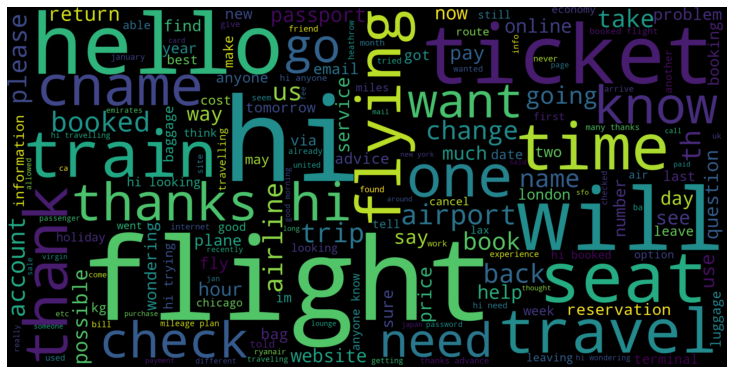

In [ ]:
comment_words_greetings = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(greeting['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words_greetings += " ".join(tokens)+" "

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words_greetings)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

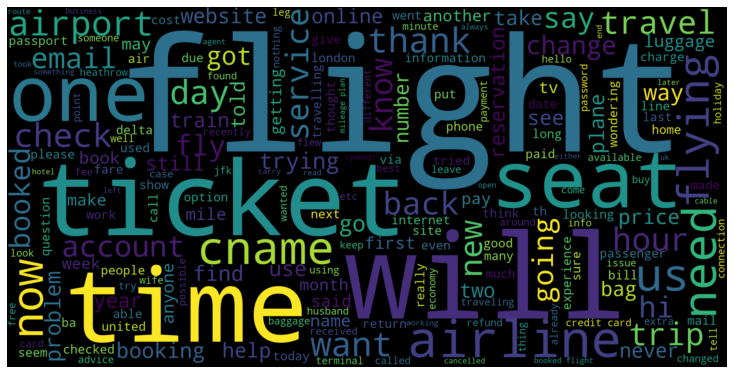

In [ ]:
comment_words_backstory = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(backstory['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words_backstory += " ".join(tokens)+" "

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words_backstory)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

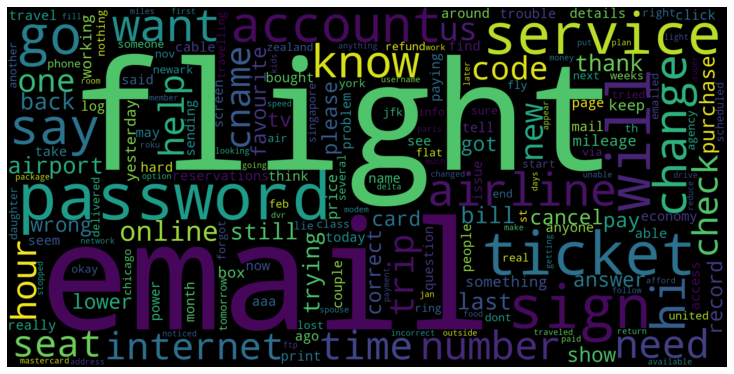

In [ ]:
comment_words_justifn = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(justifn['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words_justifn += " ".join(tokens)+" "

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words_justifn)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

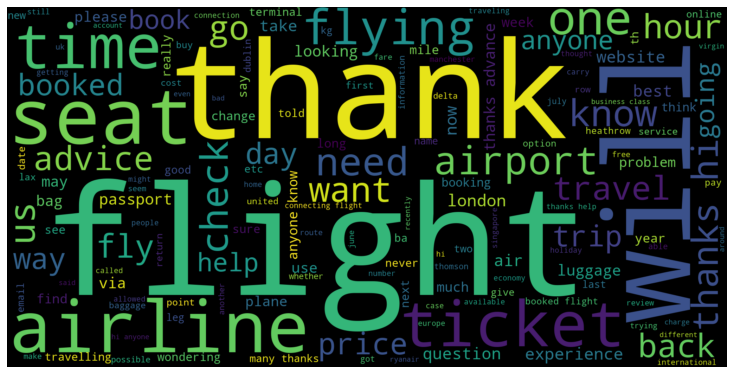

In [ ]:
comment_words_gratitude = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(gratitude['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words_gratitude += " ".join(tokens)+" "

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words_gratitude)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

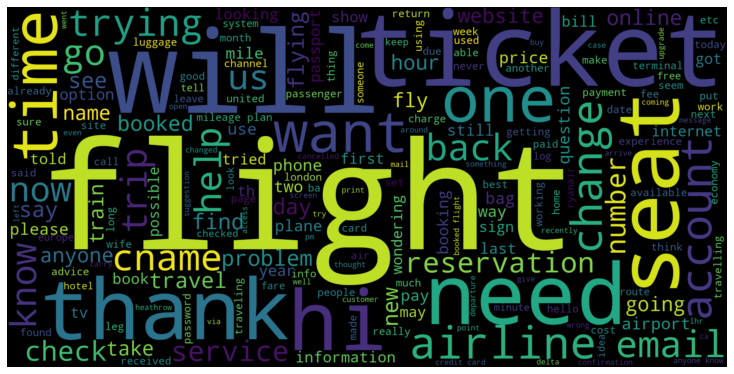

In [ ]:
comment_words_other = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(other['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words_other += " ".join(tokens)+" "

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words_other)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

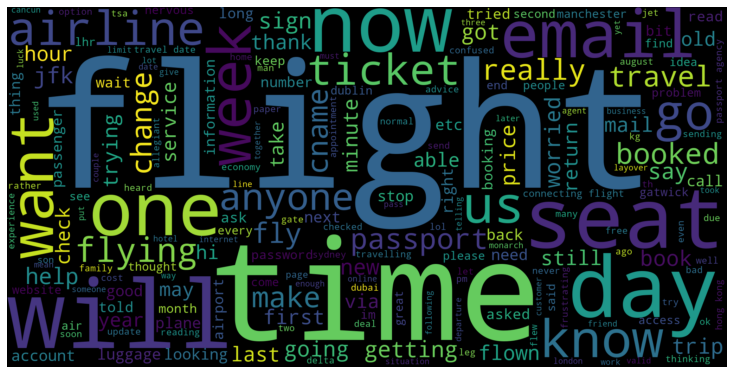

In [ ]:
comment_words_expemo = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(expemo['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words_expemo += " ".join(tokens)+" "
 
wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words_expemo)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

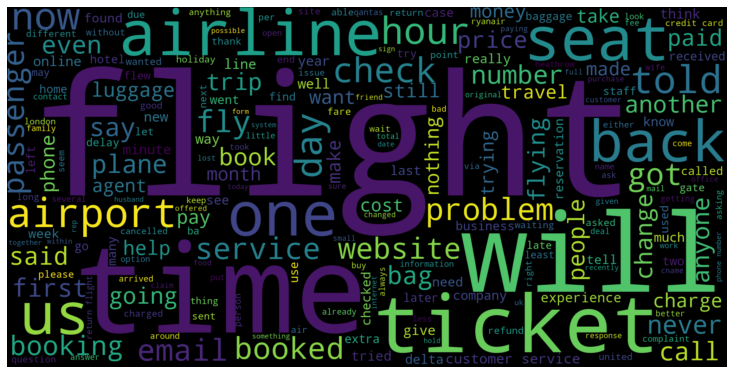

In [ ]:
comment_words_rant = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(rant['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words_rant += " ".join(tokens)+" "

wordcloud = WordCloud(width = 2048, height = 1024,max_words=2000,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words_rant)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

## Feature Engineering

In [ ]:
index_list = list(df[(df['Greeting']==0) & (df['Backstory']==0) & (df['Justification']==0) & (df['Rant']==0) & (df['Gratitude']==0) & (df['Other']==0) & (df['Express Emotion']==0)].index)

In [ ]:
# Ref: https://stackoverflow.com/a/43421391/10632473
indexes_to_keep = set(range(df.shape[0])) - set(index_list)
df_sliced_multi = df.take(list(indexes_to_keep))

In [ ]:
try:
    df_sliced_multi.loc[index_list]
except KeyError:
    print('Indexes doesnt not exist')
    print('Indexes from index lists removed')

Indexes doesnt not exist
Indexes from index lists removed


In [ ]:
df_sliced_multi

,Text,Greeting,Backstory,Justification,Rant,Gratitude,Other,Express Emotion,clean_text
0,What advantage is there in booking directly wi...,0,1,0,0,0,0,0,what advantage is there in booking directly wi...
1,"Hi, Could someone please confirm if CX 884 - H...",0,0,1,0,1,0,0,hi could someone please confirm if cx hkg la...
2,I will be transiting Dubai soon en route to Oz...,0,1,0,0,0,0,1,i will be transiting dubai soon en route to oz...
3,Does anyone know where I would find estimated ...,0,1,0,0,1,0,0,does anyone know where i would find estimated ...
5,Hi My daughter and I will have a 14 hour stopo...,1,1,0,0,1,1,0,hi my daughter and i will have a hour stopov...
...,...,...,...,...,...,...,...,...,...
6746,Our DVR-HD receiver has been giving an error m...,0,1,0,0,0,0,0,our dvr hd receiver has been giving an error m...
6747,I am the New Property manager at -------------...,0,1,0,0,0,0,0,i am the new property manager at apartments i ...
6751,"I need an address to mail my payment, my debit...",0,1,0,0,0,0,0,i need an address to mail my payment my debit ...
6754,I received a 20 credit for my bill but can not...,0,0,0,0,0,1,0,i received a credit for my bill but can not ...


In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_multi = df_sliced_multi[[df_sliced_multi.columns[0]]]
y_multi = df_sliced_multi[df_sliced_multi.columns[1:-1]]

In [ ]:
X_train_multi, X_test_multi, y_train_multi, y_test_multi = train_test_split(X_multi, y_multi, test_size=0.33, random_state=42)
X_train_multi, X_cv_multi, y_train_multi, y_cv_multi = train_test_split(X_train_multi, y_train_multi, test_size=0.33, random_state=42)

In [ ]:
# Ref: http://lpis.csd.auth.gr/publications/tsoumakas-ijdwm.pdf

def convert_to_multiclass(data):
  new_labels = []
  texts = []
  for i in tqdm(range(data.shape[0])):
    arr = data.values[i][1:]
    for j in range(len(arr)):
      if j==0:
        if arr[j]==0:
          texts.append(data.values[i][0])
          new_labels.append(0)
        else:
          texts.append(data.values[i][0])
          new_labels.append(1)
      if j==1:
        if arr[j]==0:
          texts.append(data.values[i][0])
          new_labels.append(0)
        else:
          texts.append(data.values[i][0])
          new_labels.append(2)
      if j==2:
        if arr[j]==0:
          texts.append(data.values[i][0])
          new_labels.append(0)
        else:
          texts.append(data.values[i][0])
          new_labels.append(3)
      if j==3:
        if arr[j]==0:
          texts.append(data.values[i][0])
          new_labels.append(0)
        else:
          texts.append(data.values[i][0])
          new_labels.append(4)
      if j==4:
        if arr[j]==0:
          texts.append(data.values[i][0])
          new_labels.append(0)
        else:
          texts.append(data.values[i][0])
          new_labels.append(5)
      if j==5:
        if arr[j]==0:
          texts.append(data.values[i][0])
          new_labels.append(0)
        else:
          texts.append(data.values[i][0])
          new_labels.append(6)
      if j==6:
        if arr[j]==0:
          texts.append(data.values[i][0])
          new_labels.append(0)
        else:
          texts.append(data.values[i][0])
          new_labels.append(7)
  return texts, new_labels

In [ ]:
texts, new_ys = convert_to_multiclass(df_sliced_multi.drop('clean_text', axis=1))

In [ ]:
data_dict = {'Text':texts, 'Targets':new_ys}
df_sliced = pd.DataFrame(data_dict)

In [ ]:
# We are aremoving all the targets which are 0's as they dont hold any value for our model. 
# That being said, we tried including this in the model and model only detected 0's and considered all the
# other classes as minority class couldnt detect them

df_sliced.drop(df_sliced.index[[np.where(df_sliced['Targets'].values==0.)[0]]], inplace=True)

In [ ]:
X = df_sliced[['Text']]
y = df_sliced[['Targets']]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.33, random_state=42)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train,stratify=y_train, test_size=0.33, random_state=42)

In [ ]:
print(f'Shape of training data: {X_train.shape}')
print(f'Shape of cross validation data: {X_cv.shape}')
print(f'Shape of test data: {X_test.shape}')

Shape of training data: (2394, 1)
Shape of cross validation data: (1180, 1)
Shape of test data: (1761, 1)


## Data Augmentation on Text data

In [ ]:
!pip install nlpaug
!pip install transformers

In [ ]:
import nlpaug.augmenter.char as nac
import nlpaug.augmenter.word as naw
import nlpaug.augmenter.sentence as nas
import nlpaug.flow as nafc

from nlpaug.util import Action


In [ ]:

text = df_sliced_multi['Text'].values[20]
con_aug = naw.ContextualWordEmbsAug(model_path='bert-large-uncased', action="insert", device='cuda')
augmented_text = con_aug.augment(text)
print("Original:")
print(text)
print("Augmented Text:")
print(augmented_text)


Original:
Does anyone know if there is a particular time of year when airlines tend to have good prices on airfare? We are going on a Carnival Cruise in June 2007 and want to find the best deal on airfare. Thanks!
Augmented Text:
does anyone know if there is a particular time of year when european airlines tend to quite have good prices on airfare? they we present are going her on a carnival cruise in her june with 2007 and want congratulations to find possibly the best deal on their airfare. thanks!


In [ ]:
import nltk
nltk.download('wordnet')
syn_aug = naw.SynonymAug(aug_src='wordnet')
augmented_text = syn_aug.augment(text)
augmented1 = syn_aug.augment(augmented_text)
print("Original:")
print(text)
print("Augmented Text:")
print(augmented_text)
print(augmented1)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
Original:
Does anyone know if there is a particular time of year when airlines tend to have good prices on airfare? We are going on a Carnival Cruise in June 2007 and want to find the best deal on airfare. Thanks!
Augmented Text:
Does anyone have it away if at that place is a special time of year when airlines tend to hold salutary terms on airfare? We are going on a Carnival Cruise in June 2007 and want to find the best deal on airfare. Thanks!
Does anyone ingest it away if at that station be a special time of twelvemonth when airlines tend to bear salutary footing on airfare? We are going on a Carnival Cruise in June 2007 and want to find the best deal on airfare. Thanks!


In [ ]:
aug = nas.ContextualWordEmbsForSentenceAug(model_path='xlnet-base-cased')
augmented_text = aug.augment(text)
print("Original:")
print(text)
print("Augmented Text:")
print(augmented_text)


Original:
Does anyone know if there is a particular time of year when airlines tend to have good prices on airfare? We are going on a Carnival Cruise in June 2007 and want to find the best deal on airfare. Thanks!
Augmented Text:
Does anyone know if there is a particular time of year when airlines tend to have good prices on airfare? We are going on a Carnival Cruise in June 2007 and want to find the best deal on airfare. Thanks! <eop> Thanks, the great articles and suggestions!


We can see from the above results that xlnet based augmentation didnt provide much of a different sentence which we were expecting. Hence we wont be using this as we dont want an unnecessary data which wouldnt provide some amount of variablility

In [ ]:
X_train.head()

In [ ]:
print('-'*400,'|')
print(f'Augmentation Depth 1:-')
augmented_text = con_aug.augment(text)
print(augmented_text)
print('-'*400,'|')
print(f'Augmentation Depth 2:-')
augmented1 = con_aug.augment(augmented_text)
print(augmented1)
print('-'*400,'|')
print(f'Augmentation Depth 3:-')
augmented1 = syn_aug.augment(augmented1)
print(augmented1)
print('-'*400,'|')
print(f'Syn Augmentation Depth 1:-')
syn_aug1 = syn_aug.augment(text)
print(syn_aug1)
print('-'*400,'|')
print(f'Syn Augmentation Depth 2:-')
syn_aug2 = syn_aug.augment(syn_aug1)
print(syn_aug2)
print('-'*400,'|')
print(f'Syn Augmentation Depth 3:-')
syn_aug3 = syn_aug.augment(augmented_text)
print(syn_aug3)
print('-'*400,'|')
print(f'Syn Augmentation Depth 4:-')
syn_aug4 = syn_aug.augment(augmented1)
print(syn_aug4)
print('-'*100,'|')

---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
Augmentation Depth 1:-
does anyone know if there is a particular time " of year when airlines who tend to have good prices up on european airfare? we are on going on their a small carnival cruise in his june 2007 worldwide and obviously want to find the best deal on airfare. thanks!
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

We had poor data till now. But we can see above that applying the concept of synsets and hyponyms to augmentation we are getting more data. We can now construct good amount of dataset with the above approach

In [ ]:
def con_aug_text(df, feature, labels):
  new_text = []
  new_labels = []
  con_aug = naw.ContextualWordEmbsAug(model_path='bert-large-uncased', action="insert", device='cuda')
  for i in tqdm(range(df.shape[0])):

    text = df[feature].values[i]

    aug_text = con_aug.augment(text)
    aug_text1 = con_aug.augment(aug_text)
    aug_text2 = con_aug.augment(aug_text1)
    aug_text3 = con_aug.augment(aug_text2)
    aug_text4 = con_aug.augment(aug_text3)
    aug_text5 = con_aug.augment(aug_text4)

    new_text.append(aug_text)
    new_text.append(aug_text1)
    new_text.append(aug_text2)
    new_text.append(aug_text3)
    new_text.append(aug_text4)
    new_text.append(aug_text5)
    
    for j in range(6):
      new_labels.append(labels.values[i])

    if i%1000==0:
      print(f'{i+1} Docs augmented')
  print('Doc Augmentation Complete!')
  return np.asarray(new_text), np.asarray(new_labels)

In [ ]:
def syn_aug_text(df, feature, labels):
  
  new_text = []
  new_labels = []
  
  syn_aug = naw.SynonymAug(aug_src='wordnet')
  for i in tqdm(range(df.shape[0])):

    text = df[feature].values[i]

    syn_aug1 = syn_aug.augment(text)

    syn_aug2 = syn_aug.augment(syn_aug1)

    new_text.append(syn_aug1)
    new_text.append(syn_aug2)
    
    for j in range(2):
      new_labels.append(labels.values[i])

    if i%1000==0:
      print(f'{i+1} Docs augmented')
  print('Doc Augmentation Complete!')
  return np.asarray(new_text), np.asarray(new_labels)

In [ ]:
text_multi, labels_multi = con_aug_text(X_train_multi, 'Text', y_train_multi)

In [ ]:
text, labels = con_aug_text(X_train, 'Text', y_train)

1 Docs augmented
1001 Docs augmented
2001 Docs augmented

Doc Augmentation Complete!


In [ ]:
syn_text_multi, syn_labels_multi = syn_aug_text(X_train_multi, 'Text', y_train_multi)

In [ ]:
syn_text, syn_labels = syn_aug_text(X_train, 'Text', y_train)

1 Docs augmented
1001 Docs augmented
2001 Docs augmented

Doc Augmentation Complete!


In [ ]:
import pickle

In [ ]:
pickle.dump(text, open("text.pkl", "wb")) 
pickle.dump(labels, open("labels.pkl", "wb")) 

In [ ]:
pickle.dump(text_multi, open("text_multi.pkl", "wb")) 
pickle.dump(labels_multi, open("labels_multi.pkl", "wb")) 

In [ ]:
pickle.dump(syn_text_multi, open("syn_text_multi.pkl", "wb")) 
pickle.dump(syn_labels_multi, open("syn_labels_multi.pkl", "wb")) 

In [ ]:
pickle.dump(syn_text, open("syn_text.pkl", "wb")) 
pickle.dump(syn_labels, open("syn_labels.pkl", "wb")) 

In [ ]:
from google.colab import files
files.download('text.pkl')
files.download('labels.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download('text_multi.pkl')
files.download('labels_multi.pkl') 

files.download('syn_text_multi.pkl')
files.download('syn_labels_multi.pkl') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download('syn_text.pkl')
files.download('syn_labels.pkl') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
text_multi = pickle.load(open("text_multi.pkl", "rb"))
labels_multi = pickle.load(open("labels_multi.pkl", "rb"))

syn_text_multi = pickle.load(open("syn_text_multi.pkl", "rb"))
syn_labels_multi = pickle.load(open("syn_labels_multi.pkl", "rb"))

In [ ]:
cols = y_train_multi.columns

In [ ]:
y_dict = {cols[0]: syn_labels_multi[:,0], cols[1]:syn_labels_multi[:,1], cols[2]:syn_labels_multi[:,2], cols[3]:syn_labels_multi[:,3],
          cols[4]:syn_labels_multi[:,4], cols[5]:syn_labels_multi[:,5], cols[6]:syn_labels_multi[:,6]}

y_aug_dict = {cols[0]: labels_multi[:,0], cols[1]:labels_multi[:,1], cols[2]:labels_multi[:,2], cols[3]:labels_multi[:,3],
          cols[4]:labels_multi[:,4], cols[5]:labels_multi[:,5], cols[6]:labels_multi[:,6]}

In [ ]:
y_syn_train = pd.DataFrame(y_dict, columns=cols)
y_new_train = pd.DataFrame(y_aug_dict, columns=cols)

y_new_train = y_new_train.append(y_syn_train)

In [ ]:
y_train_multi = y_train_multi.append(y_new_train)

In [ ]:
syn_dict_multi = {'Text':syn_text_multi}

syn_df_multi = pd.DataFrame(syn_dict_multi.get('Text'))
syn_df_multi.rename(columns={0:'Text'}, inplace=True)

In [ ]:
text_dict_multi = {'Text':text_multi}
aug_df_multi = pd.DataFrame(text_dict_multi.get('Text'))
aug_df_multi.rename(columns={0:'Text'}, inplace=True)

In [ ]:
X_train_multi = X_train_multi.append(aug_df_multi)
X_train_multi = X_train_multi.append(syn_df_multi)

In [ ]:
syn_dict = {'Text':syn_text}
syn_label_dict= {'Target':syn_labels}

In [ ]:
syn_df = pd.DataFrame(syn_dict.get('Text'))
syn_label_df = pd.DataFrame(syn_label_dict.get('Target'))
syn_df.rename(columns={0:'Text'}, inplace=True)
syn_label_df.rename(columns={0:'Targets'}, inplace=True)

In [ ]:
X_train = X_train.append(syn_df)
y_train = y_train.append(syn_label_df)

In [ ]:
text_dict = {'Text':text}
label_dict= {'Target':labels}

In [ ]:
aug_df = pd.DataFrame(text_dict.get('Text'))
aug_label_df = pd.DataFrame(label_dict.get('Target'))
aug_df.rename(columns={0:'Text'}, inplace=True)
aug_label_df.rename(columns={0:'Targets'}, inplace=True)

In [ ]:
X_train = X_train.append(aug_df)
y_train = y_train.append(aug_label_df)

In [ ]:
X_train.shape

(21546, 1)

In [ ]:
y_train.shape

(21546, 1)

In [ ]:
X_train_multi.shape

(15156, 1)

In [ ]:
y_train_multi.shape

(15156, 7)

### Get word count in dataset

In [ ]:
def get_word_count(data, feature):
    
    counts = []
    
    for i in tqdm(range(data[feature].shape[0])):
        
        text = data[feature].values[i]
        pattern = r'[a-zA-Z]+'
        
        words = re.findall(pattern, text)
        
        counts.append(len(words))
        
    return counts

In [ ]:
word_counts_train = get_word_count(X_train, 'Text')
word_counts_cv = get_word_count(X_cv, 'Text')
word_counts_test = get_word_count(X_test, 'Text')

X_train['word_counts'] = word_counts_train
X_cv['word_counts'] = word_counts_cv
X_test['word_counts'] = word_counts_test

In [ ]:
word_counts_train_multi = get_word_count(X_train_multi, 'Text')
word_counts_cv_multi = get_word_count(X_cv_multi, 'Text')
word_counts_test_multi = get_word_count(X_test_multi, 'Text')

X_train_multi['word_counts'] = word_counts_train_multi
X_cv_multi['word_counts'] = word_counts_cv_multi
X_test_multi['word_counts'] = word_counts_test_multi

#### Get Number of particles, interjections, verbs, noun, pronoun, adverb, adjective

| POS | Description |
| - | - |
| CC | coordinating conjunction|
|CD |cardinal digit|
|DT |determiner|
|EX |existential there (like: “there is” … think of it like “there exists”)|
|FW |foreign word|
|IN |preposition/subordinating conjunction|
|JJ| adjective ‘big’|
|JJR |adjective, comparative ‘bigger’|
|JJS |adjective, superlative ‘biggest’|
|LS| list marker 1)|
|MD |modal could, will|
|NN| noun, singular ‘desk’|
|NNS| noun plural ‘desks’|
|NNP |proper noun, singular ‘Harrison’|
|NNPS |proper noun, plural ‘Americans’|
|PDT |predeterminer ‘all the kids’|
|POS |possessive ending parent‘s|
|PRP| personal pronoun I, he, she|
|PRPS |possessive pronoun my, his, hers|
|RB |adverb very, silently,|
|RBR| adverb, comparative better|
|RBS |adverb, superlative best|
|RP| particle give up|
|TO |to go ‘to‘ the store.|
|UH |interjection errrrrrrrm|
|VB |verb, base form take|
|VBD| verb, past tense took|
|VBG |verb, gerund/present participle taking|
|VBN| verb, past participle taken|
|VBP |verb, sing. present, non-3d take|
|VBZ| verb, 3rd person sing. present takes|
|WDT| wh-determiner which|
|WP| wh-pronoun who, what|
|WP$ |possessive wh pronoun whose|
|WRB |wh-abverb where, when|

We will count these and add these as our features

In [ ]:
import itertools

In [ ]:
def pos_count(data, feature):

  POS_List = ['JJ', 'JJR', 'JJS', 'NN', 'NNS', 'PRP', 'PRPS', 'RB', 'RBR', 'RP', 'UH', 'VB', 'VBD', 'VBG', 'VBN', 'VBP','VBZ', 'WP', 'WP$']

  pos_per_text = defaultdict(list)

  for i in tqdm(range(data.shape[0])):

    doc = data['Text'].values[i]

    info =[]
    tokenized = sent_tokenize(doc)
    for i in tokenized:

      # Word tokenizers is used to find the words 
      # and punctuation in a string
      wordsList = nltk.word_tokenize(i)
  
      # removing stop words from wordList
      wordsList = [w for w in wordsList if not w in stop_words] 
  
      #  Using a Tagger. Which is part-of-speech 
      # tagger or POS-tagger. 
      tagged = nltk.pos_tag(wordsList)
    info=[tag[1] for tag in tagged]
    #print(info)
    
    
    counts = Counter(info)
    
    keys = dict(counts).keys()
    #print(list(keys))
    #break
    for pos in POS_List:
      
      if pos in list(keys):
        
        pos_per_text[pos].append(counts.get(pos))
            
      else:
        pos_per_text[pos].append(0)
      
  return pos_per_text

In [ ]:
parts_of_speech_counts_train = pos_count(X_train, 'Text')
parts_of_speech_counts_cv = pos_count(X_cv, 'Text')
parts_of_speech_counts_test = pos_count(X_test, 'Text')

In [ ]:
parts_of_speech_counts_train_multi = pos_count(X_train_multi, 'Text')
parts_of_speech_counts_cv_multi = pos_count(X_cv_multi, 'Text')
parts_of_speech_counts_test_multi = pos_count(X_test_multi, 'Text')

In [ ]:
from google.colab import files
pickle.dump(parts_of_speech_counts_train_multi, open('pos_train.pkl','wb'))
files.download('pos_train.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
POS_List = ['JJ', 'JJR', 'JJS', 'NN', 'NNS', 'PRP', 'PRPS', 'RB', 'RBR', 'RP', 'UH', 'VB', 'VBD', 'VBG', 'VBN', 'VBP','VBZ', 'WP', 'WP$']

for pos in POS_List:
  X_train[pos] = parts_of_speech_counts_train.get(pos)
  X_cv[pos] = parts_of_speech_counts_cv.get(pos)
  X_test[pos] = parts_of_speech_counts_test.get(pos)

In [ ]:
POS_List = ['JJ', 'JJR', 'JJS', 'NN', 'NNS', 'PRP', 'PRPS', 'RB', 'RBR', 'RP', 'UH', 'VB', 'VBD', 'VBG', 'VBN', 'VBP','VBZ', 'WP', 'WP$']

for pos in POS_List:
  X_train_multi[pos] = parts_of_speech_counts_train_multi.get(pos)
  X_cv_multi[pos] = parts_of_speech_counts_cv_multi.get(pos)
  X_test_multi[pos] = parts_of_speech_counts_test_multi.get(pos)

In [ ]:
def check_negation(df):
    
    negex_ = []
    
    for i in tqdm(range(df.shape[0])):
        sent = df['Text'].values[i].split()
        if ('not' in sent) or ('never' in sent):
            negex_.append(1)
        else:
            negex_.append(0)
    return negex_

In [ ]:
X_train['Negation'] = check_negation(X_train)
X_cv['Negation'] = check_negation(X_cv)
X_test['Negation'] = check_negation(X_test)

In [ ]:
X_train_multi['Negation'] = check_negation(X_train_multi)
X_cv_multi['Negation'] = check_negation(X_cv_multi)
X_test_multi['Negation'] = check_negation(X_test_multi)

### Getting unigrams from Synonyms, Hyponyms, WordNet

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
from nltk.corpus import wordnet as wn

In [ ]:
train_clean = clean_text(X_train, 'Text')
cv_clean = clean_text(X_cv, 'Text')
test_clean = clean_text(X_test, 'Text')

X_train['clean_text'] = train_clean
X_cv['clean_text'] = cv_clean
X_test['clean_text'] = test_clean

In [ ]:
train_clean_multi = clean_text(X_train_multi, 'Text')
cv_clean_multi = clean_text(X_cv_multi, 'Text')
test_clean_multi = clean_text(X_test_multi, 'Text')

X_train_multi['clean_text'] = train_clean_multi
X_cv_multi['clean_text'] = cv_clean_multi
X_test_multi['clean_text'] = test_clean_multi

In [ ]:
def get_seed_words(data, feature):
    
    pos_type = ['NN', 'NNS', 'PRP', 'PRPS', 'RB', 'RBR','RBS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP','VBZ']
    
    seed_words = []
    
    for i in tqdm(range(data.shape[0])):
        
        doc = data[feature].values[i]
        info =[]
        tokenized = sent_tokenize(doc)
        for i in tokenized:

          # Word tokenizers is used to find the words 
          # and punctuation in a string
          wordsList = nltk.word_tokenize(i)
  
          # removing stop words from wordList
          wordsList = [w for w in wordsList if not w in stop_words] 
  
          #  Using a Tagger. Which is part-of-speech 
          # tagger or POS-tagger. 
          tagged = nltk.pos_tag(wordsList)
        
        for tag in tagged:

          if tag[1] in pos_type:

            seed_words.append(tag[0])
    return seed_words

In [ ]:
seed_words = get_seed_words(X_train, 'clean_text')

In [ ]:
seed_words_multi = get_seed_words(X_train_multi, 'clean_text')

In [ ]:
!pip install vaderSentiment

In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [ ]:
def get_words_based_on_prob(words):
    
    word_list = set()
    sid_obj = SentimentIntensityAnalyzer()
    
    for i in range(len(words)):
        
        scores = sid_obj.polarity_scores(words[i])
        
        if scores.get('compound')>0.5 or scores.get('compound')<-0.5:
            
            word_list.add(words[i])
    return word_list

In [ ]:
seed_words_prob = get_words_based_on_prob(seed_words)

In [ ]:
seed_words_prob_multi = get_words_based_on_prob(seed_words_multi)

In [ ]:
print(f'Number of seed words: {len(seed_words_prob_multi)}')

Number of seed words: 166


In [ ]:
print(f'Number of seed words: {len(seed_words_prob)}')

Number of seed words: 217


In [ ]:
def depth_1_syn(words):
    
    synsets = []
    for word in words:
        for s in wn.synsets(word):
            synsets.append(s.hyponyms())
    
    words = []
    for s in synsets:
        t1 = re.findall(r"\b([a-zA-Z]+)\b", str(s))
        for temp in t1:
            if len(temp)>1 and temp!='Synset':
                words.append(temp)
    return set(words)

In [ ]:
synsets_d1_multi = depth_1_syn(seed_words_prob_multi)
print(f'Number of words in synsets of depth 1: {len(synsets_d1_multi)}')

Number of words in synsets of depth 1: 817


In [ ]:
synsets_d1 = depth_1_syn(seed_words_prob)
print(f'Number of words in synsets of depth 1: {len(synsets_d1)}')

In [ ]:
synsets_d2_multi = depth_1_syn(synsets_d1_multi)
print(f'Number of words in synsets of depth 2: {len(synsets_d2_multi)}')

Number of words in synsets of depth 2: 4457


In [ ]:
synsets_d2 = depth_1_syn(synsets_d1)
print(f'Number of words in synsets of depth 2: {len(synsets_d2)}')

Number of words in synsets of depth 2: 4878


In [ ]:
synsets_d3_multi = depth_1_syn(synsets_d2_multi)
print(f'Number of words in synsets of depth 3: {len(synsets_d3_multi)}')

Number of words in synsets of depth 3: 13434


In [ ]:
synsets_d3 = depth_1_syn(synsets_d2)
print(f'Number of words in synsets of depth 3: {len(synsets_d3)}')

Number of words in synsets of depth 3: 14206


In [ ]:
synsets_d4_multi = depth_1_syn(synsets_d3_multi)
print(f'Number of words in synsets of depth 4: {len(synsets_d4_multi)}')

Number of words in synsets of depth 4: 21548


In [ ]:
synsets_d4 = depth_1_syn(synsets_d3)
print(f'Number of words in synsets of depth 4: {len(synsets_d4)}')

Number of words in synsets of depth 4: 22240


In [ ]:
def count_dup(list1, list2):
    dup = 0
    for word in tqdm(list1):
        if word in list2:
            dup+1
    return dup

In [ ]:
print(f'Duplicate words in synset of depth1 and synsets of depth2: {count_dup(synsets_d1_multi, synsets_d2_multi)}')


Duplicate words in synset of depth1 and synsets of depth2: 0


In [ ]:
print(f'Duplicate words in synset of depth1 and synsets of depth2: {count_dup(synsets_d1, synsets_d2)}')


Duplicate words in synset of depth1 and synsets of depth2: 0


In [ ]:
print(f'Duplicate words in synset of depth2 and synsets of depth3: {count_dup(synsets_d2_multi, synsets_d3_multi)}')


Duplicate words in synset of depth2 and synsets of depth3: 0


In [ ]:
print(f'Duplicate words in synset of depth2 and synsets of depth3: {count_dup(synsets_d2, synsets_d3)}')


Duplicate words in synset of depth2 and synsets of depth3: 0


In [ ]:
print(f'Duplicate words in synset of depth3 and synsets of depth4: {count_dup(synsets_d3_multi, synsets_d4_multi)}')


Duplicate words in synset of depth3 and synsets of depth4: 0


In [ ]:
print(f'Duplicate words in synset of depth3 and synsets of depth4: {count_dup(synsets_d3, synsets_d4)}')


Duplicate words in synset of depth3 and synsets of depth4: 0


In [ ]:
print(f'Duplicate words in synset of depth1 and synsets of depth4: {count_dup(synsets_d1_multi, synsets_d4_multi)}')


Duplicate words in synset of depth1 and synsets of depth4: 0


In [ ]:
print(f'Duplicate words in synset of depth1 and synsets of depth4: {count_dup(synsets_d1, synsets_d4)}')


Duplicate words in synset of depth1 and synsets of depth4: 0


In [ ]:
print(f'Duplicate words in synset of depth1 and synsets of depth3: {count_dup(synsets_d1_multi, synsets_d3_multi)}')


Duplicate words in synset of depth1 and synsets of depth3: 0


In [ ]:
print(f'Duplicate words in synset of depth1 and synsets of depth3: {count_dup(synsets_d1, synsets_d3)}')


Duplicate words in synset of depth1 and synsets of depth3: 0


In [ ]:
print(f'Duplicate words in synset of depth2 and synsets of depth4: {count_dup(synsets_d2_multi, synsets_d4_multi)}')


Duplicate words in synset of depth2 and synsets of depth4: 0


In [ ]:
print(f'Duplicate words in synset of depth2 and synsets of depth4: {count_dup(synsets_d2, synsets_d4)}')


Duplicate words in synset of depth2 and synsets of depth4: 0


In [ ]:
word_depth = dict()

word_depth['Seed Words']       = len(seed_words_prob)
word_depth['Synsets Depth 1']  = len(synsets_d1)
word_depth['Synsets Depth 2']  = len(synsets_d2)
word_depth['Synsets Depth 3']  = len(synsets_d3)
word_depth['Synsets Depth 4']  = len(synsets_d4)

In [ ]:
word_depth_multi = dict()

word_depth_multi['Seed Words']       = len(seed_words_prob_multi)
word_depth_multi['Synsets Depth 1']  = len(synsets_d1_multi)
word_depth_multi['Synsets Depth 2']  = len(synsets_d2_multi)
word_depth_multi['Synsets Depth 3']  = len(synsets_d3_multi)
word_depth_multi['Synsets Depth 4']  = len(synsets_d4_multi)

In [ ]:
temp_multi = pd.DataFrame()
temp_multi['Unigram Type'] = word_depth_multi.keys()
temp_multi['Word Count'] = word_depth_multi.values()

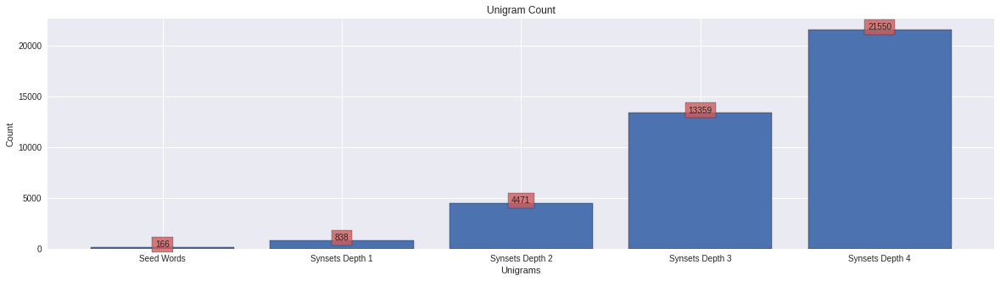

In [ ]:
# https://www.geeksforgeeks.org/adding-value-labels-on-a-matplotlib-bar-chart/

keys_multi = list(word_depth_multi.keys())
vals_multi = list(word_depth_multi.values())

plt.figure(figsize=(20,5))
plt.bar(keys_multi, vals_multi, align='center', edgecolor='black')

for i in range(len(vals_multi)):
  plt.text(i, vals_multi[i], vals_multi[i], ha='center', Bbox = dict(facecolor = 'indianred', alpha =.8))
plt.xlabel('Unigrams')
plt.ylabel('Count')
plt.title('Unigram Count')
plt.show()

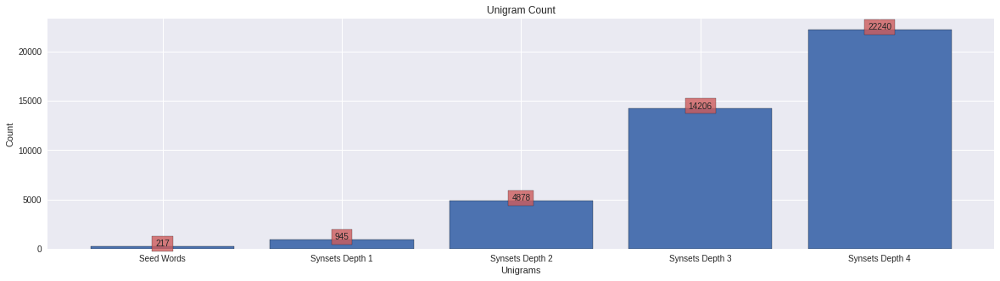

In [ ]:
# https://www.geeksforgeeks.org/adding-value-labels-on-a-matplotlib-bar-chart/

keys = list(word_depth.keys())
vals = list(word_depth.values())

plt.figure(figsize=(20,5))
plt.bar(keys, vals, align='center', edgecolor='black')

for i in range(len(vals)):
  plt.text(i, vals[i], vals[i], ha='center', Bbox = dict(facecolor = 'indianred', alpha =.8))
plt.xlabel('Unigrams')
plt.ylabel('Count')
plt.title('Unigram Count')
plt.show()

We can see from this wordcloud that the words __flight__, __will__, __ticket__, __time__, __service__, __account__ and more such words which are quite bold and bigger in font, which means that they are used more and are consistent accross train, cv, test set.

#### Building Dictionary

In [ ]:
wordcloud_backstory = set(comment_words_backstory.split())
wordcloud_expemo = set(comment_words_expemo.split())
wordcloud_gratitude = set(comment_words_gratitude.split())
wordcloud_greetings = set(comment_words_greetings.split())
wordcloud_justifn = set(comment_words_justifn.split())
wordcloud_rant = set(comment_words_rant.split())
wordcloud_other = set(comment_words_other.split())

In [ ]:
vocab_multi = synsets_d1_multi.union(synsets_d2_multi.union(synsets_d3_multi.union(synsets_d4_multi)))

In [ ]:
vocab = synsets_d1.union(synsets_d2.union(synsets_d3.union(synsets_d4)))

In [ ]:
wordclouds = {'backstory':wordcloud_backstory, 'Express Emotion':wordcloud_expemo,'Gratitude':wordcloud_gratitude,
              'Greeting':wordcloud_gratitude, 'Justification':wordcloud_justifn,'Rant':wordcloud_rant,
              'Other':wordcloud_other}
synset_dict={'synsets_d1':synsets_d1, 'synsets_d2':synsets_d2,'synsets_d3':synsets_d3,'synsets_d4':synsets_d4}

In [ ]:
wordclouds = {'backstory':wordcloud_backstory, 'Express Emotion':wordcloud_expemo,'Gratitude':wordcloud_gratitude,
              'Greeting':wordcloud_gratitude, 'Justification':wordcloud_justifn,'Rant':wordcloud_rant,
              'Other':wordcloud_other}
synset_dict_multi={'synsets_d1':synsets_d1_multi, 'synsets_d2':synsets_d2_multi,'synsets_d3':synsets_d3_multi,'synsets_d4':synsets_d4_multi}

In [ ]:
def get_unigram_features(voc, sentiments_cloud,synsets, df):

  int1 = voc.intersection(sentiments_cloud.get('backstory'))
  int2 = voc.intersection(sentiments_cloud.get('Express Emotion'))
  int3 = voc.intersection(sentiments_cloud.get('Greeting'))
  int4 = voc.intersection(sentiments_cloud.get('Justification'))
  int5 = voc.intersection(sentiments_cloud.get('Rant'))
  int6 = voc.intersection(sentiments_cloud.get('Gratitude'))
  int7 = voc.intersection(sentiments_cloud.get('Other'))
  unigrams = set()
  for row in tqdm(range(df.shape[0])):

    doc = df['clean_text'].values[row].split()

    for word in doc:

      if word in voc:

        if (word in int1) or (word in int2) or (word in int3) or (word in int4) or (word in int5) or (word in int6) or (word in int7):

          unigrams.add(word)

  return unigrams

In [ ]:
unigram_feat_multi = get_unigram_features(vocab_multi, wordclouds, synset_dict_multi, X_train_multi)

In [ ]:
pickle.dump(unigram_feat_multi, open('unigram_feat_multi.pkl','wb'))

files.download('unigram_feat_multi.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
unigram_feat = get_unigram_features(vocab, wordclouds, synset_dict, X_train)

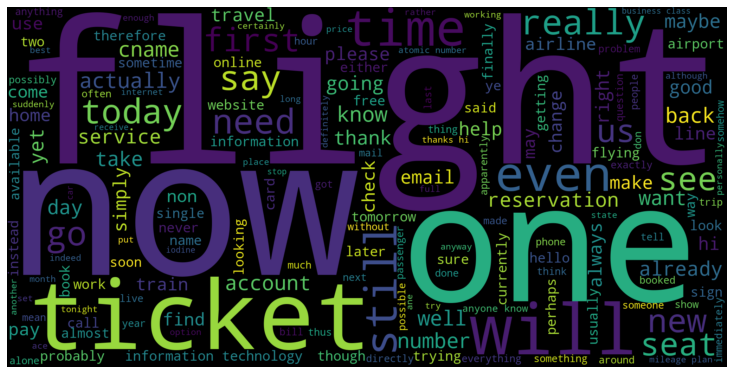

In [ ]:
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(X_train_multi['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

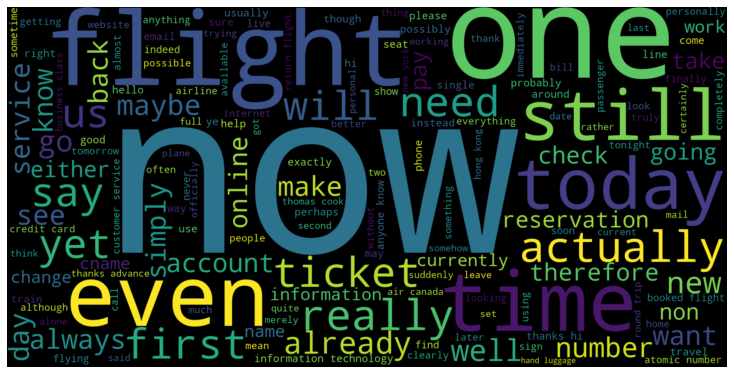

In [ ]:
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(X_train['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

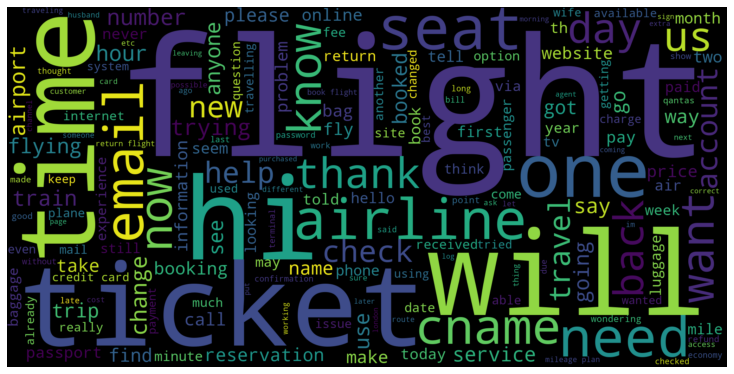

In [ ]:
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(X_cv_multi['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "
  

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words)

  
# plot the WordCloud image                       
plt.figure(figsize = (10,8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

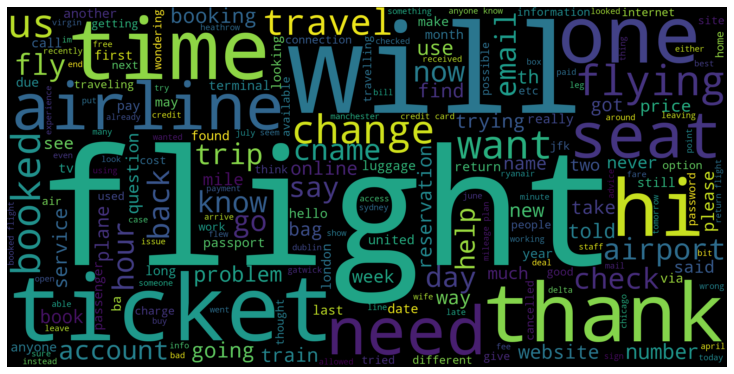

In [ ]:
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(X_cv['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "
  

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words)

  
# plot the WordCloud image                       
plt.figure(figsize = (10,8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

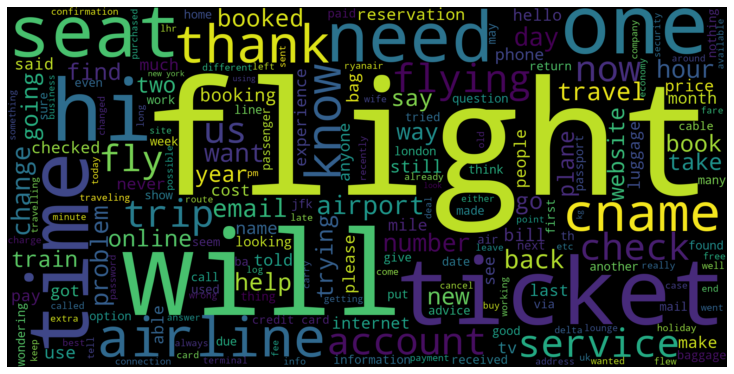

In [ ]:
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(X_test_multi['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "
  

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

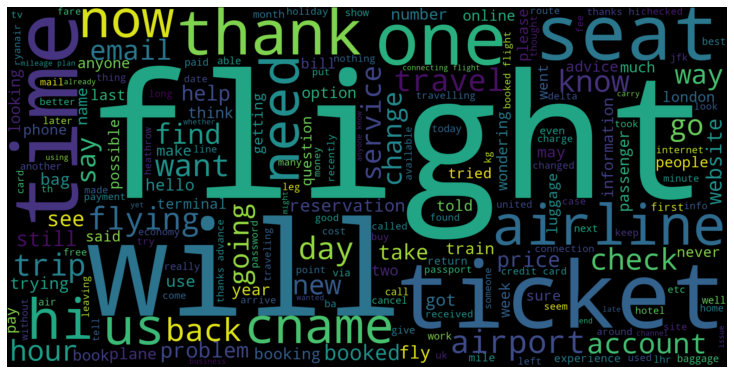

In [ ]:
comment_words = ''
stopwords = set(STOPWORDS)
  
# iterate through the csv file
for val in tqdm(X_test['clean_text']):
      
    # typecaste each val to string
    val = str(val)
  
    # split the value
    tokens = val.split()
      
    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()
      
    comment_words += " ".join(tokens)+" "
  

wordcloud = WordCloud(width = 2048, height = 1024,
                background_color ='black',
                stopwords = stopwords,
                min_font_size = 20).generate(comment_words)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

#### Pattern-based features: 

The idea of our pattern-related
features in which
we proposed an approach that relies on Part of Speech tags
(PoS-tags) to extract sarcastic patterns. We rely on PoS-Tag of words to extract similar patterns. However,
instead of dividing words into two categories, we divide them
into three: 

1. Referred to as EI, containing words
which might have emotional content.
2. A second one, referred
to as “CI”, containing non emotional words whose content is
important
3. And a third one, referred to as “GFI”, containing
the words whose grammatical function is important. 

If a word
belongs to the first category, it is replaced by the corresponding
expression shown in TABLE II along with its polarity (e.g.,
the word “good” would be replaced by POS-ADJECTIVE);
if it belongs to the second, it is lemmatized and replaced by
its lemma; and if it belongs to the third, it is replaced by the
corresponding expression shown in TABLE II.

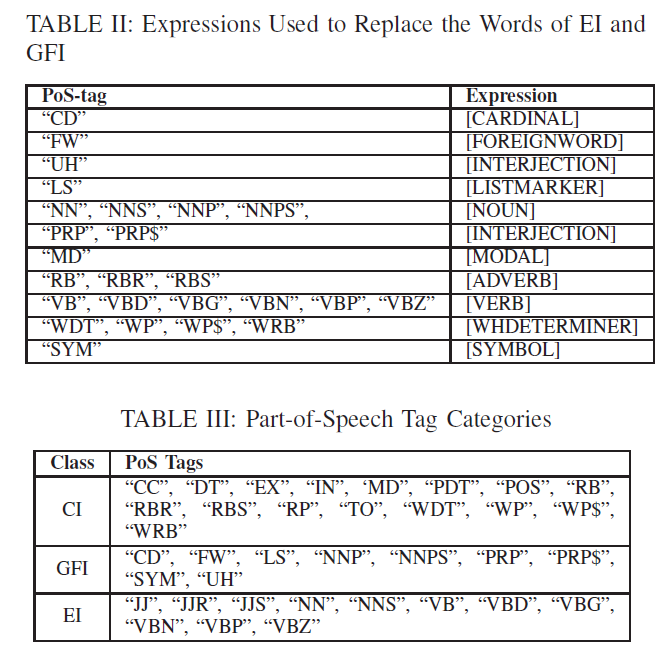

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize


| POS | Description |
| - | - |
| CC | coordinating conjunction|
|CD |cardinal digit|
|DT |determiner|
|EX |existential there (like: “there is” … think of it like “there exists”)|
|FW |foreign word|
|IN |preposition/subordinating conjunction|
|JJ| adjective ‘big’|
|JJR |adjective, comparative ‘bigger’|
|JJS |adjective, superlative ‘biggest’|
|LS| list marker 1)|
|MD |modal could, will|
|NN| noun, singular ‘desk’|
|NNS| noun plural ‘desks’|
|NNP |proper noun, singular ‘Harrison’|
|NNPS |proper noun, plural ‘Americans’|
|PDT |predeterminer ‘all the kids’|
|POS |possessive ending parent‘s|
|PRP| personal pronoun I, he, she|
|PRPS |possessive pronoun my, his, hers|
|RB |adverb very, silently,|
|RBR| adverb, comparative better|
|RBS |adverb, superlative best|
|RP| particle give up|
|TO |to go ‘to‘ the store.|
|UH |interjection errrrrrrrm|
|VB |verb, base form take|
|VBD| verb, past tense took|
|VBG |verb, gerund/present participle taking|
|VBN| verb, past participle taken|
|VBP |verb, sing. present, non-3d take|
|VBZ| verb, 3rd person sing. present takes|
|WDT| wh-determiner which|
|WP| wh-pronoun who, what|
|WP$ |possessive wh pronoun whose|
|WRB |wh-abverb where, when|

In [ ]:
def get_pos_vec(df, feature):
  ci = ['CC', 'DT', 'EX', 'IN', 'MD', 'PDT', 'POS', 'RB', 'RBR', 'RBS', 'RP', 'TO', 'WDT', 'WP', 'WP$', 'WRB']
  gfi = ['CD', 'FW', 'LS', 'NNP', 'NNPS', 'PRP', 'PRP$', 'SYM', 'UH']
  ei = ['JJ', 'JJR','JJS','NN','NNS','VB','VBD','VBD','VBG','VBN','VBP','VBZ']
  pos_cat = defaultdict(list)
  
  for i in tqdm(range(df.shape[0])):

    doc = df[feature].values[i]
    info =[]
    tokenized = sent_tokenize(doc)
    for i in tokenized:

      # Word tokenizers is used to find the words 
      # and punctuation in a string
      wordsList = nltk.word_tokenize(i)
  
      # removing stop words from wordList
      wordsList = [w for w in wordsList if not w in stop_words] 
  
      #  Using a Tagger. Which is part-of-speech 
      # tagger or POS-tagger. 
      tagged = nltk.pos_tag(wordsList)

    pattern = [tag[1] for tag in tagged]
    
    
    pat_check_ci = [pat for pat in pattern if pat in ci]
    pat_check_ei = [pat for pat in pattern if pat in ei]
    pat_check_gfi = [pat for pat in pattern if pat in gfi]
    #print('-----')
    #print(pat_check_ci, 'ci')
    #print(pat_check_gfi, 'gfi')
    #print(pat_check_ei, 'ei')
    
    if (len(pat_check_ci)!=0) and (len(pat_check_ei)!=0) and (len(pat_check_gfi)!=0):
      pos_cat['CI'].append(1)
      pos_cat['EI'].append(1)
      pos_cat['GFI'].append(1)
    elif (len(pat_check_ci)==0) and (len(pat_check_ei)!=0) and (len(pat_check_gfi)!=0):
      pos_cat['CI'].append(0)
      pos_cat['EI'].append(1)
      pos_cat['GFI'].append(1)
    elif (len(pat_check_ci)!=0) and (len(pat_check_ei)==0) and (len(pat_check_gfi)!=0):
      pos_cat['CI'].append(1)
      pos_cat['EI'].append(0)
      pos_cat['GFI'].append(1)
    elif (len(pat_check_ci)!=0) and (len(pat_check_ei)!=0) and (len(pat_check_gfi)==0):
      pos_cat['CI'].append(1)
      pos_cat['EI'].append(1)
      pos_cat['GFI'].append(0)
    elif (len(pat_check_ci)!=0) and (len(pat_check_ei)==0) and (len(pat_check_gfi)==0):
      pos_cat['CI'].append(1)
      pos_cat['EI'].append(0)
      pos_cat['GFI'].append(0)
    elif (len(pat_check_ci)==0) and (len(pat_check_ei)==0) and (len(pat_check_gfi)!=0):
      pos_cat['CI'].append(0)
      pos_cat['EI'].append(0)
      pos_cat['GFI'].append(1)
    else:
      pos_cat['CI'].append(0)
      pos_cat['EI'].append(1)
      pos_cat['GFI'].append(0)

  return pos_cat
    

In [ ]:
train_pos_cat = get_pos_vec(X_train, 'Text')
X_train['CI'] = train_pos_cat.get('CI')
X_train['GFI'] = train_pos_cat.get('GFI')
X_train['EI'] = train_pos_cat.get('EI')

In [ ]:
train_pos_cat_multi = get_pos_vec(X_train_multi, 'Text')
X_train_multi['CI'] = train_pos_cat_multi.get('CI')
X_train_multi['GFI'] = train_pos_cat_multi.get('GFI')
X_train_multi['EI'] = train_pos_cat_multi.get('EI')

In [ ]:
cv_pos_cat_multi = get_pos_vec(X_cv_multi, 'Text')
X_cv_multi['CI'] = cv_pos_cat_multi.get('CI')
X_cv_multi['GFI'] = cv_pos_cat_multi.get('GFI')
X_cv_multi['EI'] = cv_pos_cat_multi.get('EI')

In [ ]:
cv_pos_cat = get_pos_vec(X_cv, 'Text')
X_cv['CI'] = cv_pos_cat.get('CI')
X_cv['GFI'] = cv_pos_cat.get('GFI')
X_cv['EI'] = cv_pos_cat.get('EI')

In [ ]:
test_pos_cat_multi = get_pos_vec(X_test_multi, 'Text')
X_test_multi['CI'] = test_pos_cat_multi.get('CI')
X_test_multi['GFI'] = test_pos_cat_multi.get('GFI')
X_test_multi['EI'] = test_pos_cat_multi.get('EI')

In [ ]:
test_pos_cat = get_pos_vec(X_test, 'Text')
X_test['CI'] = test_pos_cat.get('CI')
X_test['GFI'] = test_pos_cat.get('GFI')
X_test['EI'] = test_pos_cat.get('EI')

In [ ]:
puncs = [i for i in string.punctuation]
unigram_feat_multi = puncs + list(unigram_feat_multi)

In [ ]:
puncs = [i for i in string.punctuation]
unigram_feat = puncs + list(unigram_feat)

In [ ]:
dictionary = list(unigram_feat)

word_index = dict()

for i in tqdm(range(len(dictionary))):
    if i==0:
       word_index['OOV'] = 1
    else:
        word_index[dictionary[i]]=i+1

In [ ]:
dictionary_multi = list(unigram_feat_multi)

word_index_multi= dict()

for i in tqdm(range(len(dictionary_multi))):
    if i==0:
       word_index_multi['OOV'] = 1
    else:
        word_index_multi[dictionary_multi[i]]=i+1

In [ ]:
pickle.dump(dictionary_multi, open('dictionary_multi.pkl', 'wb'))

files.download('dictionary_multi.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
def find_max_len(df):
  length = []
  for i in tqdm(range(df.shape[0])):
    text = re.findall(r'[a-zA-Z]+', df['clean_text'].values[i])

    length.append(len(text))

  return length

In [ ]:
length_words = find_max_len(X_train)

In [ ]:
length_words_multi = find_max_len(X_train_multi)

In [ ]:
print(f'Max number of words in corpus: {np.max(length_words_multi)}')

Max number of words in corpus: 588


In [ ]:
print(f'Max number of words in corpus: {np.max(length_words)}')

Max number of words in corpus: 867


In [ ]:
print(f'Median of word length in corpus: {np.median(length_words_multi)}')

Median of word length in corpus: 48.0


In [ ]:
print(f'Median of word length in corpus: {np.median(length_words)}')

Median of word length in corpus: 57.0


In [ ]:
print(f'Min number of words in corpus:  {np.min(length_words_multi)}')

Min number of words in corpus:  7


In [ ]:
print(f'Min number of words in corpus:  {np.min(length_words)}')

Min number of words in corpus:  10


In [ ]:
print(f'Word length at 60th percentile: {np.percentile(length_words, 60)}')

Word length at 60th percentile: 67.0


In [ ]:
print(f'Word length at 60th percentile in multi: {np.percentile(length_words_multi, 60)}')

Word length at 60th percentile in multi: 57.0


In [ ]:
print(f'Word length at 70th percentile: {np.percentile(length_words, 70)}')

Word length at 70th percentile: 79.0


In [ ]:
print(f'Word length at 70th percentile: {np.percentile(length_words_multi, 70)}')

Word length at 70th percentile: 67.0


In [ ]:
print(f'Word length at 80th percentile: {np.percentile(length_words, 80)}')

Word length at 80th percentile: 97.0


In [ ]:
print(f'Word length at 80th percentile: {np.percentile(length_words_multi, 80)}')

Word length at 80th percentile: 80.0


In [ ]:
print(f'Word length at 90th percentile: {np.percentile(length_words, 90)}')

Word length at 90th percentile: 142.0


In [ ]:
print(f'Word length at 90th percentile: {np.percentile(length_words_multi, 90)}')

Word length at 90th percentile: 108.0


In [ ]:
print(f'Word length at 91st percentile: {np.percentile(length_words_multi, 91)}')
print(f'Word length at 92nd percentile: {np.percentile(length_words_multi, 92)}')
print(f'Word length at 93rd percentile: {np.percentile(length_words_multi, 93)}')
print(f'Word length at 94th percentile: {np.percentile(length_words_multi, 94)}')
print(f'Word length at 95th percentile: {np.percentile(length_words_multi, 95)}')
print(f'Word length at 96th percentile: {np.percentile(length_words_multi, 96)}')
print(f'Word length at 97th percentile: {round(np.percentile(length_words_multi, 97))}')
print(f'Word length at 98th percentile: {round(np.percentile(length_words_multi, 98))}')
print(f'Word length at 99th percentile: {round(np.percentile(length_words_multi, 99))}')

Word length at 91st percentile: 113.0
Word length at 92nd percentile: 120.0
Word length at 93rd percentile: 128.0
Word length at 94th percentile: 136.0
Word length at 95th percentile: 145.0
Word length at 96th percentile: 158.0
Word length at 97th percentile: 175
Word length at 98th percentile: 200
Word length at 99th percentile: 265


In [ ]:
print(f'Word length at 91st percentile: {np.percentile(length_words, 91)}')
print(f'Word length at 92nd percentile: {np.percentile(length_words, 92)}')
print(f'Word length at 93rd percentile: {np.percentile(length_words, 93)}')
print(f'Word length at 94th percentile: {np.percentile(length_words, 94)}')
print(f'Word length at 95th percentile: {np.percentile(length_words, 95)}')
print(f'Word length at 96th percentile: {np.percentile(length_words, 96)}')
print(f'Word length at 97th percentile: {round(np.percentile(length_words, 97))}')
print(f'Word length at 98th percentile: {round(np.percentile(length_words, 98))}')
print(f'Word length at 99th percentile: {round(np.percentile(length_words, 99))}')

Word length at 91st percentile: 150.0
Word length at 92nd percentile: 158.0
Word length at 93rd percentile: 169.0
Word length at 94th percentile: 183.0
Word length at 95th percentile: 198.0
Word length at 96th percentile: 222.0
Word length at 97th percentile: 254
Word length at 98th percentile: 297
Word length at 99th percentile: 384


In [ ]:
print(f'Word length at 99.1th percentile: {round(np.percentile(length_words_multi, 99.1))}')
print(f'Word length at 99.2th percentile: {round(np.percentile(length_words_multi, 99.2))}')
print(f'Word length at 99.3th percentile: {round(np.percentile(length_words_multi, 99.3))}')
print(f'Word length at 99.4th percentile: {round(np.percentile(length_words_multi, 99.4))}')
print(f'Word length at 99.5th percentile: {round(np.percentile(length_words_multi, 99.5))}')
print(f'Word length at 99.6th percentile: {round(np.percentile(length_words_multi, 99.6))}')
print(f'Word length at 99.7th percentile: {round(np.percentile(length_words_multi, 99.7))}')
print(f'Word length at 99.8th percentile: {round(np.percentile(length_words_multi, 99.8))}')
print(f'Word length at 99.9th percentile: {round(np.percentile(length_words_multi, 99.9))}')

Word length at 99.1th percentile: 277
Word length at 99.2th percentile: 287
Word length at 99.3th percentile: 296
Word length at 99.4th percentile: 312
Word length at 99.5th percentile: 337
Word length at 99.6th percentile: 382
Word length at 99.7th percentile: 411
Word length at 99.8th percentile: 428
Word length at 99.9th percentile: 539


In [ ]:
print(f'Word length at 99.1th percentile: {round(np.percentile(length_words, 99.1))}')
print(f'Word length at 99.2th percentile: {round(np.percentile(length_words, 99.2))}')
print(f'Word length at 99.3th percentile: {round(np.percentile(length_words, 99.3))}')
print(f'Word length at 99.4th percentile: {round(np.percentile(length_words, 99.4))}')
print(f'Word length at 99.5th percentile: {round(np.percentile(length_words, 99.5))}')
print(f'Word length at 99.6th percentile: {round(np.percentile(length_words, 99.6))}')
print(f'Word length at 99.7th percentile: {round(np.percentile(length_words, 99.7))}')
print(f'Word length at 99.8th percentile: {round(np.percentile(length_words, 99.8))}')
print(f'Word length at 99.9th percentile: {round(np.percentile(length_words, 99.9))}')

Word length at 99.1th percentile: 393
Word length at 99.2th percentile: 401
Word length at 99.3th percentile: 410
Word length at 99.4th percentile: 417
Word length at 99.5th percentile: 430
Word length at 99.6th percentile: 452
Word length at 99.7th percentile: 492
Word length at 99.8th percentile: 508
Word length at 99.9th percentile: 584


In [ ]:
def text_to_seq(vocab, data):

  sequences = []
  for i in tqdm(range(data.shape[0])):
    text = re.findall(r'[a-zA-Z]+|\~|\!|\@|\#|\$|\%|\^|\&|\*|\(|\)|\-\+|\,|\"|\?|\.|\:|\;|\=|\[|\]|\{|\}|\_|\\|\/', data['Text'].values[i])
    seq = []
    for i in text:
      if vocab.get(i)==None:
        seq.append(1)
      else:
        seq.append(vocab.get(i))
    sequences.append(seq)

  return np.array(sequences)

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences

In [ ]:
maxlen = int(np.percentile(length_words_multi, 99))
maxlen

264

In [ ]:
maxlen = int(np.percentile(length_words_multi, 99))

train_array = text_to_seq(word_index, X_train)
train_array = pad_sequences(train_array, maxlen=maxlen, dtype='int32', padding='pre',truncating='post')

cv_array = text_to_seq(word_index, X_cv)
cv_array = pad_sequences(cv_array, maxlen=maxlen, dtype='int32', padding='pre',truncating='post')

test_array = text_to_seq(word_index, X_test)
test_array = pad_sequences(test_array, maxlen=maxlen, dtype='int32', padding='pre',truncating='post')

In [ ]:
maxlen = int(np.percentile(length_words_multi, 99))

train_array_multi = text_to_seq(word_index_multi, X_train_multi)
train_array_multi = pad_sequences(train_array_multi, maxlen=maxlen, dtype='int32', padding='pre',truncating='post')

cv_array_multi = text_to_seq(word_index_multi, X_cv_multi)
cv_array_multi = pad_sequences(cv_array_multi, maxlen=maxlen, dtype='int32', padding='pre',truncating='post')

test_array_multi = text_to_seq(word_index_multi, X_test_multi)
test_array_multi = pad_sequences(test_array_multi, maxlen=maxlen, dtype='int32', padding='pre',truncating='post')

In [ ]:
X_train.head()

,Text,word_counts,JJ,JJR,JJS,NN,NNS,PRP,PRPS,RB,RBR,RP,UH,VB,VBD,VBG,VBN,VBP,VBZ,WP,WP$,Negation,clean_text,CI,GFI,EI
15779,"Hi everyone, A quick question - we have booked...",183,0,0,0,3,0,1,0,0,0,0,0,3,0,0,0,0,0,0,0,1,hi everyone a quick question we have booked th...,1,1,1
13906,"Hi there, I am needing to change the date of b...",38,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,hi there i am needing to change the date of bi...,0,0,1
23862,I cannot get access to my account. I am being ...,33,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,i cannot get access to my account i am being t...,0,0,1
16087,"2 seniors flying to the uk from melbourne aus,...",128,1,0,0,2,3,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,seniors flying to the uk from melbourne aus ...,0,1,1
19363,I can not get into my email to get my ticket. ...,19,0,0,0,2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,i can not get into my email to get my ticket c...,1,1,1


In [ ]:
X_train_multi.head()

,Text,word_counts,JJ,JJR,JJS,NN,NNS,PRP,PRPS,RB,RBR,RP,UH,VB,VBD,VBG,VBN,VBP,VBZ,WP,WP$,Negation,clean_text,CI,GFI,EI
3935,Hi We are looking at this airline company as i...,34,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,hi we are looking at this airline company as i...,0,0,1
462,My wife and I are looking at travelling from C...,35,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,my wife and i are looking at travelling from c...,0,0,1
2631,hi i signed up for auto pay it still hasent ta...,14,1,0,0,4,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,hi i signed up for auto pay it still hasent ta...,1,0,1
5341,My boarding pass says ------/------------ It u...,13,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,my boarding pass says it usually just says wil...,1,0,1
1730,My wife and I are flying together to Europe. S...,40,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,my wife and i are flying together to europe sh...,1,1,1


In [ ]:
X_train.drop('clean_text', axis=1, inplace=True)
X_cv.drop('clean_text', axis=1, inplace=True)
X_test.drop('clean_text', axis=1, inplace=True)
keep_columns = list(X_train.columns[1:])

In [ ]:
X_train_multi.drop('clean_text', axis=1, inplace=True)
X_cv_multi.drop('clean_text', axis=1, inplace=True)
X_test_multi.drop('clean_text', axis=1, inplace=True)
keep_columns = list(X_train_multi.columns[1:])

In [ ]:
train_cols = X_train[keep_columns].values
cv_cols = X_cv[keep_columns].values
test_cols = X_test[keep_columns].values

In [ ]:
train_cols_multi = X_train_multi[keep_columns].values
cv_cols_multi = X_cv_multi[keep_columns].values
test_cols_multi = X_test_multi[keep_columns].values

In [ ]:
train_multi = np.hstack((train_array_multi, train_cols_multi))
cv_multi = np.hstack((cv_array_multi, cv_cols_multi))
test_multi = np.hstack((test_array_multi, test_cols_multi))

In [ ]:
train = np.hstack((train_array, train_cols))
cv = np.hstack((cv_array, cv_cols))
test = np.hstack((test_array, test_cols))

In [ ]:
pickle.dump(train, open('train.pkl', 'wb'))
pickle.dump(cv, open('cv.pkl', 'wb'))
pickle.dump(test, open('test.pkl', 'wb'))
pickle.dump(y_train, open('y_train.pkl', 'wb'))
pickle.dump(y_cv, open('y_cv.pkl', 'wb'))
pickle.dump(y_test, open('y_test.pkl', 'wb'))

In [ ]:
pickle.dump(train_multi, open('train_multi.pkl', 'wb'))
pickle.dump(cv_multi, open('cv_multi.pkl', 'wb'))
pickle.dump(test_multi, open('test_multi.pkl', 'wb'))
pickle.dump(y_train_multi, open('y_train_multi.pkl', 'wb'))
pickle.dump(y_cv_multi, open('y_cv_multi.pkl', 'wb'))
pickle.dump(y_test_multi, open('y_test_multi.pkl', 'wb'))

In [ ]:
from google.colab import files
files.download('train.pkl')
files.download('cv.pkl')
files.download('test.pkl')
files.download('y_train.pkl')
files.download('y_cv.pkl')
files.download('y_test.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download('train_multi.pkl')
files.download('cv_multi.pkl')
files.download('test_multi.pkl')
files.download('y_train_multi.pkl')
files.download('y_cv_multi.pkl')
files.download('y_test_multi.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!gdown --id '1J8clAkWnV5PcrRJ3FSisK7AOhRPmaAb2'  # train
!gdown --id '1m-cRVLSHALUFKak6Zs9bswCHMI6GxtzI'  # cv
!gdown --id '1-cbCPAmbGWPB0dXvpV6s7tWmm41wt9HT'  # test
!gdown --id '1s_C5_Jchlzr6nyWMgPQeqfRaeRqryflU'  # y_train
!gdown --id '1uUFzzsOft2JHe65G1bNBaivA0DbQ2mN3'  # y_cv
!gdown --id '1uDMXuOEAKix1Smbc-DNQhkM_n4AlpBrd'  # y_test

Downloading...
From: https://drive.google.com/uc?id=1J8clAkWnV5PcrRJ3FSisK7AOhRPmaAb2
To: /content/train.pkl
115MB [00:01, 113MB/s]
Downloading...
From: https://drive.google.com/uc?id=1m-cRVLSHALUFKak6Zs9bswCHMI6GxtzI
To: /content/test.pkl
5.76MB [00:00, 90.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-cbCPAmbGWPB0dXvpV6s7tWmm41wt9HT
To: /content/cv.pkl
14.3MB [00:00, 126MB/s]
Downloading...
From: https://drive.google.com/uc?id=1s_C5_Jchlzr6nyWMgPQeqfRaeRqryflU
To: /content/y_train.pkl
100% 756k/756k [00:00<00:00, 50.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=1uUFzzsOft2JHe65G1bNBaivA0DbQ2mN3
To: /content/y_cv.pkl
100% 47.3k/47.3k [00:00<00:00, 17.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=1uDMXuOEAKix1Smbc-DNQhkM_n4AlpBrd
To: /content/y_test.pkl
100% 70.2k/70.2k [00:00<00:00, 24.7MB/s]


In [ ]:
!gdown --id '1TzLipfmJdA6-irNwGygaJ2pFowuiTpaC'
!unzip '/content/main data.zip' -d '/content/'

Downloading...
From: https://drive.google.com/uc?id=1TzLipfmJdA6-irNwGygaJ2pFowuiTpaC
To: /content/main data.zip
9.54MB [00:00, 84.1MB/s]
Archive:  /content/main data.zip
  inflating: /content/cv.pkl         
  inflating: /content/cv_multi.pkl   
  inflating: /content/labels.pkl     
  inflating: /content/labels_multi.pkl  
  inflating: /content/syn_labels.pkl  
  inflating: /content/syn_labels_multi.pkl  
  inflating: /content/syn_text.pkl   
  inflating: /content/syn_text_multi.pkl  
  inflating: /content/test.pkl       
  inflating: /content/test_multi.pkl  
  inflating: /content/text.pkl       
  inflating: /content/text_multi.pkl  
  inflating: /content/train.pkl      
  inflating: /content/train_multi.pkl  
  inflating: /content/y_cv.pkl       
  inflating: /content/y_cv_multi.pkl  
  inflating: /content/y_test.pkl     
  inflating: /content/y_test_multi.pkl  
  inflating: /content/y_train.pkl    
  inflating: /content/y_train_multi.pkl  


In [ ]:
train = pickle.load(open("train.pkl", "rb"))
cv = pickle.load(open("cv.pkl", "rb"))
test = pickle.load(open("test.pkl", "rb"))
y_train = pickle.load(open('y_train.pkl', 'rb'))
y_cv = pickle.load(open('y_cv.pkl', 'rb'))
y_test = pickle.load(open('y_test.pkl', 'rb'))

In [ ]:
train_multi = pickle.load(open("train_multi.pkl", "rb"))
cv_multi = pickle.load(open("cv_multi.pkl", "rb"))
test_multi = pickle.load(open("test_multi.pkl", "rb"))
y_train_multi = pickle.load(open('y_train_multi.pkl', 'rb'))
y_cv_multi = pickle.load(open('y_cv_multi.pkl', 'rb'))
y_test_multi = pickle.load(open('y_test_multi.pkl', 'rb'))

## Building ML Model

Step 1: Normalise the data

In [ ]:
from sklearn.preprocessing import Normalizer

transformer = Normalizer().fit(train)
train_norm = transformer.transform(train)
cv_norm = transformer.transform(cv)
test_norm = transformer.transform(test)

In [ ]:
from sklearn.preprocessing import Normalizer
 
transformer_multi = Normalizer().fit(train_multi)
train_norm_multi = transformer_multi.transform(train_multi)
cv_norm_multi = transformer_multi.transform(cv_multi)
test_norm_multi = transformer_multi.transform(test_multi)

Step 2: Detect outliers

In [ ]:
from sklearn.neighbors import LocalOutlierFactor

clf = LocalOutlierFactor(n_neighbors=20, novelty=True, algorithm='kd_tree',contamination='auto', n_jobs=-1)

clf.fit(train_norm)
y_pred_train = clf.predict(train_norm)
n_error_train = y_pred_train[y_pred_train == -1].size
train_outliers = np.where(y_pred_train==-1)[0]
print(f'Number of outliers in train: {len(train_outliers)}')

In [ ]:
from sklearn.neighbors import LocalOutlierFactor

clf = LocalOutlierFactor(n_neighbors=20, novelty=True, algorithm='kd_tree',contamination='auto', n_jobs=-1)

clf.fit(train_norm_multi)
y_pred_train = clf.predict(train_norm_multi)
n_error_train = y_pred_train[y_pred_train == -1].size
train_outliers = np.where(y_pred_train==-1)[0]
print(f'Number of outliers in train: {n_error_train}')

Number of outliers in train: 0


In [ ]:
y_pred_cv = clf.predict(cv_norm_multi)
n_error_cv = y_pred_cv[y_pred_cv == -1].size
cv_outliers = np.where(y_pred_cv==-1)[0]
print(f'Number of outliers in cv: {n_error_cv}')

Number of outliers in cv: 0


In [ ]:
y_pred_cv = clf.predict(cv_norm)
n_error_cv = y_pred_cv[y_pred_cv == -1].size
cv_outliers = np.where(y_pred_cv==-1)[0]
print(f'Number of outliers in cv: {len(cv_outliers)}')

Number of outliers in cv: 0


In [ ]:
y_pred_test = clf.predict(test_norm_multi)
n_error_test = y_pred_test[y_pred_test == -1].size
test_outliers = np.where(y_pred_test==-1)[0]
print(f'Number of outliers in test: {n_error_test}')

Number of outliers in test: 0


In [ ]:
y_pred_test = clf.predict(test_norm)
n_error_test = y_pred_test[y_pred_test == -1].size
test_outliers = np.where(y_pred_test==-1)[0]
print(f'Number of outliers in test: {len(test_outliers)}')

## Building ML Model - MultiClass Multi-Ouput Classification

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import make_scorer, f1_score, hamming_loss, roc_auc_score
from sklearn.metrics import accuracy_score
from prettytable import PrettyTable 
from sklearn.metrics import brier_score_loss

In [ ]:
rf = RandomForestClassifier(n_jobs=-1)

In [ ]:
random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230],
               'criterion': ['gini', 'entropy']}

In [ ]:


hamming = make_scorer(hamming_loss)
f1_weighted = make_scorer(f1_score, average='weighted')
f1_micro = make_scorer(f1_score, average='micro')
f1_samples = make_scorer(f1_score, average='samples')

scores = {'f1_weighted':f1_weighted}

In [ ]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,
                               n_iter = 50, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(train_multi, y_train_multi)

In [ ]:
rf_random.best_params_

In [ ]:
best_params_={'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': 20,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 130}

In [ ]:
rf_ = RandomForestClassifier(**best_params_)

In [ ]:
rf_.fit(train_multi, y_train_multi)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=20, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=130,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
y_pred_train = rf_.predict(train_multi)
y_pred_cv = rf_.predict(cv_multi)
y_pred_test = rf_.predict(test_multi)
cols = y_train_multi.columns

In [ ]:
rf_f1_greet_train = f1_score(y_train_multi[cols[0]], y_pred_train[:,0], average='micro')
rf_f1_greet_cv = f1_score(y_cv_multi[cols[0]], y_pred_cv[:,0], average='micro')
rf_f1_greet_test = f1_score(y_test_multi[cols[0]], y_pred_test[:,0], average='micro')

rf_f1_back_train = f1_score(y_train_multi[cols[1]], y_pred_train[:,1], average='micro')
rf_f1_back_cv = f1_score(y_cv_multi[cols[1]], y_pred_cv[:,1], average='micro')
rf_f1_back_test = f1_score(y_test_multi[cols[1]], y_pred_test[:,1], average='micro')

rf_f1_justfn_train = f1_score(y_train_multi[cols[2]], y_pred_train[:,2], average='micro')
rf_f1_justfn_cv = f1_score(y_cv_multi[cols[2]], y_pred_cv[:,2], average='micro')
rf_f1_justfn_test = f1_score(y_test_multi[cols[2]], y_pred_test[:,2], average='micro')

rf_f1_rant_train = f1_score(y_train_multi[cols[3]], y_pred_train[:,3], average='micro')
rf_f1_rant_cv = f1_score(y_cv_multi[cols[3]], y_pred_cv[:,3], average='micro')
rf_f1_rant_test = f1_score(y_test_multi[cols[3]], y_pred_test[:,3], average='micro')

rf_f1_grat_train = f1_score(y_train_multi[cols[4]], y_pred_train[:,4], average='micro')
rf_f1_grat_cv = f1_score(y_cv_multi[cols[4]], y_pred_cv[:,4], average='micro')
rf_f1_grat_test = f1_score(y_test_multi[cols[4]], y_pred_test[:,4], average='micro')

rf_f1_other_train = f1_score(y_train_multi[cols[5]], y_pred_train[:,5], average='micro')
rf_f1_other_cv = f1_score(y_cv_multi[cols[5]], y_pred_cv[:,5], average='micro')
rf_f1_other_test = f1_score(y_test_multi[cols[5]], y_pred_test[:,5], average='micro')

rf_f1_expemo_train = f1_score(y_train_multi[cols[6]], y_pred_train[:,6], average='micro')
rf_f1_expemo_cv = f1_score(y_cv_multi[cols[6]], y_pred_cv[:,6], average='micro')
rf_f1_expemo_test = f1_score(y_test_multi[cols[6]], y_pred_test[:,6], average='micro')

f1_table = PrettyTable()
f1_table.field_names = ['Class', 'Train', 'CV', 'Test']
f1_table.add_row([cols[0], rf_f1_greet_train, rf_f1_greet_cv, rf_f1_greet_test])
f1_table.add_row([cols[1], rf_f1_back_train,rf_f1_back_cv, rf_f1_back_test])
f1_table.add_row([cols[2], rf_f1_justfn_train,rf_f1_justfn_cv, rf_f1_justfn_test])
f1_table.add_row([cols[3], rf_f1_rant_train,rf_f1_rant_cv, rf_f1_rant_test])
f1_table.add_row([cols[4], rf_f1_grat_train,rf_f1_grat_cv, rf_f1_grat_test])
f1_table.add_row([cols[5], rf_f1_other_train,rf_f1_other_cv, rf_f1_other_test])
f1_table.add_row([cols[6], rf_f1_expemo_train,rf_f1_expemo_cv, rf_f1_expemo_test])
print('F1 Score of each class:-')
print(f1_table)

F1 Score of each class:-
+-----------------+--------------------+--------------------+--------------------+
|      Class      |       Train        |         CV         |        Test        |
+-----------------+--------------------+--------------------+--------------------+
|     Greeting    |        1.0         | 0.7795180722891566 | 0.7804681194511703 |
|    Backstory    | 0.9999340195302191 | 0.6277108433734939 | 0.6311541565778854 |
|  Justification  |        1.0         | 0.9783132530120482 | 0.9846650524616626 |
|       Rant      |        1.0         | 0.9349397590361446 | 0.9176755447941889 |
|    Gratitude    |        1.0         | 0.9072289156626506 | 0.8991121872477804 |
|      Other      | 0.9998680390604381 | 0.6518072289156627 | 0.6472962066182405 |
| Express Emotion |        1.0         | 0.963855421686747  | 0.9693301049233253 |
+-----------------+--------------------+--------------------+--------------------+


In [ ]:
rf_roc_greet_train = roc_auc_score(y_train_multi[cols[0]], y_pred_train[:,0], average='micro')
rf_roc_greet_cv = roc_auc_score(y_cv_multi[cols[0]], y_pred_cv[:,0], average='micro')
rf_roc_greet_test = roc_auc_score(y_test_multi[cols[0]], y_pred_test[:,0], average='micro')

rf_roc_back_train = roc_auc_score(y_train_multi[cols[1]], y_pred_train[:,1], average='micro')
rf_roc_back_cv = roc_auc_score(y_cv_multi[cols[1]], y_pred_cv[:,1], average='micro')
rf_roc_back_test = roc_auc_score(y_test_multi[cols[1]], y_pred_test[:,1], average='micro')

rf_roc_justfn_train = roc_auc_score(y_train_multi[cols[2]], y_pred_train[:,2], average='micro')
rf_roc_justfn_cv = roc_auc_score(y_cv_multi[cols[2]], y_pred_cv[:,2], average='micro')
rf_roc_justfn_test = roc_auc_score(y_test_multi[cols[2]], y_pred_test[:,2], average='micro')

rf_roc_rant_train = roc_auc_score(y_train_multi[cols[3]], y_pred_train[:,3], average='micro')
rf_roc_rant_cv = roc_auc_score(y_cv_multi[cols[3]], y_pred_cv[:,3], average='micro')
rf_roc_rant_test = roc_auc_score(y_test_multi[cols[3]], y_pred_test[:,3], average='micro')

rf_roc_grat_train = roc_auc_score(y_train_multi[cols[4]], y_pred_train[:,4], average='micro')
rf_roc_grat_cv = roc_auc_score(y_cv_multi[cols[4]], y_pred_cv[:,4], average='micro')
rf_roc_grat_test = roc_auc_score(y_test_multi[cols[4]], y_pred_test[:,4], average='micro')

rf_roc_other_train = roc_auc_score(y_train_multi[cols[5]], y_pred_train[:,5], average='micro')
rf_roc_other_cv = roc_auc_score(y_cv_multi[cols[5]], y_pred_cv[:,5], average='micro')
rf_roc_other_test = roc_auc_score(y_test_multi[cols[5]], y_pred_test[:,5], average='micro')

rf_roc_expemo_train = roc_auc_score(y_train_multi[cols[6]], y_pred_train[:,6], average='micro')
rf_roc_expemo_cv = roc_auc_score(y_cv_multi[cols[6]], y_pred_cv[:,6], average='micro')
rf_roc_expemo_test = roc_auc_score(y_test_multi[cols[6]], y_pred_test[:,6], average='micro')

roc_table = PrettyTable()
roc_table.field_names = ['Class', 'Train', 'CV', 'Test']
roc_table.add_row([cols[0], rf_roc_greet_train, rf_roc_greet_cv, rf_roc_greet_test])
roc_table.add_row([cols[1], rf_roc_back_train,rf_roc_back_cv, rf_roc_back_test])
roc_table.add_row([cols[2], rf_roc_justfn_train,rf_roc_justfn_cv, rf_roc_justfn_test])
roc_table.add_row([cols[3], rf_roc_rant_train,rf_roc_rant_cv, rf_roc_rant_test])
roc_table.add_row([cols[4], rf_roc_grat_train,rf_roc_grat_cv, rf_roc_grat_test])
roc_table.add_row([cols[5], rf_roc_other_train,rf_roc_other_cv, rf_roc_other_test])
roc_table.add_row([cols[6], rf_roc_expemo_train,rf_roc_expemo_cv, rf_roc_expemo_test])
print('ROC AUC Score of each class:-')
print(roc_table)

ROC AUC Score of each class:-
+-----------------+--------------------+--------------------+--------------------+
|      Class      |       Train        |         CV         |        Test        |
+-----------------+--------------------+--------------------+--------------------+
|     Greeting    |        1.0         | 0.5080645161290323 | 0.5085387602149082 |
|    Backstory    |  0.99993921711646  | 0.6339428853302327 | 0.6411296988571825 |
|  Justification  |        1.0         |        0.5         |        0.5         |
|       Rant      |        1.0         | 0.5913165838269672 | 0.5973190348525469 |
|    Gratitude    |        1.0         | 0.7064804721272038 | 0.6849858983575734 |
|      Other      | 0.9998628354422792 | 0.5774188764128265 | 0.5700335338624607 |
| Express Emotion |        1.0         | 0.5161290322580645 |        0.5         |
+-----------------+--------------------+--------------------+--------------------+


In [ ]:
from sklearn.metrics import auc, precision_recall_curve

In [ ]:
cols=y_train_multi.columns

rf_hamm_greet_train = hamming_loss(y_train_multi['Greeting'].values, y_pred_train[:,0])
rf_hamm_back_train = hamming_loss(y_train_multi['Backstory'].values, y_pred_train[:,1])
rf_hamm_justfn_train = hamming_loss(y_train_multi['Justification'].values, y_pred_train[:,2])
rf_hamm_rant_train = hamming_loss(y_train_multi['Rant'].values, y_pred_train[:,3])
rf_hamm_grat_train = hamming_loss(y_train_multi['Gratitude'].values, y_pred_train[:,4])
rf_hamm_other_train = hamming_loss(y_train_multi['Other'].values, y_pred_train[:,5])
rf_hamm_expemo_train = hamming_loss(y_train_multi['Express Emotion'].values, y_pred_train[:,6])

rf_hamm_greet_cv = hamming_loss(y_cv_multi['Greeting'].values, y_pred_cv[:,0])
rf_hamm_back_cv = hamming_loss(y_cv_multi['Backstory'].values, y_pred_cv[:,1])
rf_hamm_justfn_cv = hamming_loss(y_cv_multi['Justification'].values, y_pred_cv[:,2])
rf_hamm_rant_cv = hamming_loss(y_cv_multi['Rant'].values, y_pred_cv[:,3])
rf_hamm_grat_cv = hamming_loss(y_cv_multi['Gratitude'].values, y_pred_cv[:,4])
rf_hamm_other_cv = hamming_loss(y_cv_multi['Other'].values, y_pred_cv[:,5])
rf_hamm_expemo_cv = hamming_loss(y_cv_multi['Express Emotion'].values, y_pred_cv[:,6])

rf_hamm_greet_test = hamming_loss(y_test_multi['Greeting'].values, y_pred_test[:,0])
rf_hamm_back_test = hamming_loss(y_test_multi['Backstory'].values, y_pred_test[:,1])
rf_hamm_justfn_test = hamming_loss(y_test_multi['Justification'].values, y_pred_test[:,2])
rf_hamm_rant_test = hamming_loss(y_test_multi['Rant'].values, y_pred_test[:,3])
rf_hamm_grat_test = hamming_loss(y_test_multi['Gratitude'].values, y_pred_test[:,4])
rf_hamm_other_test = hamming_loss(y_test_multi['Other'].values, y_pred_test[:,5])
rf_hamm_expemo_test = hamming_loss(y_test_multi['Express Emotion'].values, y_pred_test[:,6])

hamm_tab = PrettyTable()
hamm_tab.field_names = ['Class', 'Train','CV', 'Test']
hamm_tab.add_row([cols[0], rf_hamm_greet_train,rf_hamm_greet_cv, rf_hamm_greet_test])
hamm_tab.add_row([cols[1], rf_hamm_back_train,rf_hamm_back_cv, rf_hamm_back_test])
hamm_tab.add_row([cols[2],rf_hamm_justfn_train,rf_hamm_justfn_cv, rf_hamm_justfn_test])
hamm_tab.add_row([cols[3],rf_hamm_rant_train,rf_hamm_rant_cv, rf_hamm_rant_test])
hamm_tab.add_row([cols[4], rf_hamm_grat_train,rf_hamm_grat_cv, rf_hamm_grat_test])
hamm_tab.add_row([cols[5], rf_hamm_other_train,rf_hamm_other_cv, rf_hamm_other_test])
hamm_tab.add_row([cols[6], rf_hamm_expemo_train,rf_hamm_expemo_cv, rf_hamm_expemo_test])
print('Hamming Loss on CV and Test:')
print(hamm_tab)

Hamming Loss on CV and Test:
+-----------------+-----------------------+----------------------+---------------------+
|      Class      |         Train         |          CV          |         Test        |
+-----------------+-----------------------+----------------------+---------------------+
|     Greeting    |          0.0          | 0.22048192771084338  |  0.2195318805488297 |
|    Backstory    | 6.598046978094485e-05 |  0.372289156626506   |  0.3688458434221146 |
|  Justification  |          0.0          | 0.021686746987951807 | 0.01533494753833737 |
|       Rant      |          0.0          | 0.06506024096385542  | 0.08232445520581114 |
|    Gratitude    |          0.0          |  0.0927710843373494  | 0.10088781275221953 |
|      Other      | 0.0001319609395618897 |  0.3481927710843373  |  0.3527037933817595 |
| Express Emotion |          0.0          | 0.03614457831325301  | 0.03066989507667474 |
+-----------------+-----------------------+----------------------+---------------

In [ ]:
rf_br_greet_train = brier_score_loss(y_train_multi['Greeting'].values, y_pred_train[:,0])
rf_br_back_train = brier_score_loss(y_train_multi['Backstory'].values, y_pred_train[:,1])
rf_br_justfn_train = brier_score_loss(y_train_multi['Justification'].values, y_pred_train[:,2])
rf_br_rant_train = brier_score_loss(y_train_multi['Rant'].values, y_pred_train[:,3])
rf_br_grat_train = brier_score_loss(y_train_multi['Gratitude'].values, y_pred_train[:,4])
rf_br_other_train = brier_score_loss(y_train_multi['Other'].values, y_pred_train[:,5])
rf_br_expemo_train = brier_score_loss(y_train_multi['Express Emotion'].values, y_pred_train[:,6])

rf_br_greet_cv = brier_score_loss(y_cv_multi['Greeting'].values, y_pred_cv[:,0])
rf_br_back_cv =  brier_score_loss(y_cv_multi['Backstory'].values, y_pred_cv[:,1])
rf_br_justfn_cv = brier_score_loss(y_cv_multi['Justification'].values, y_pred_cv[:,2])
rf_br_rant_cv = brier_score_loss(y_cv_multi['Rant'].values, y_pred_cv[:,3])
rf_br_grat_cv = brier_score_loss(y_cv_multi['Gratitude'].values, y_pred_cv[:,4])
rf_br_other_cv = brier_score_loss(y_cv_multi['Other'].values, y_pred_cv[:,5])
rf_br_expemo_cv = brier_score_loss(y_cv_multi['Express Emotion'].values, y_pred_cv[:,6])


rf_br_greet_test =brier_score_loss(y_test_multi['Greeting'].values, y_pred_test[:,0])
rf_br_back_test =  brier_score_loss(y_test_multi['Backstory'].values, y_pred_test[:,1])
rf_br_justfn_test = brier_score_loss(y_test_multi['Justification'].values, y_pred_test[:,2])
rf_br_rant_test  = brier_score_loss(y_test_multi['Rant'].values, y_pred_test[:,3])
rf_br_grat_test = brier_score_loss(y_test_multi['Gratitude'].values, y_pred_test[:,4])
rf_br_other_test = brier_score_loss(y_test_multi['Other'].values, y_pred_test[:,5])
rf_br_expemo_test = brier_score_loss(y_test_multi['Express Emotion'].values, y_pred_test[:,6])

br_tab = PrettyTable()
br_tab.field_names = ['Class', 'Train', 'CV', 'Test']
br_tab.add_row([cols[0], rf_br_greet_train, rf_br_greet_cv, rf_br_greet_test])
br_tab.add_row([cols[1], rf_br_back_train,rf_br_back_cv,rf_br_back_test])
br_tab.add_row([cols[2], rf_br_justfn_train,rf_br_justfn_cv,rf_br_justfn_test])
br_tab.add_row([cols[3],  rf_br_rant_train, rf_br_rant_cv, rf_br_rant_test])
br_tab.add_row([cols[4], rf_br_grat_train,rf_br_grat_cv,rf_br_grat_test])
br_tab.add_row([cols[5], rf_br_other_train, rf_br_other_cv, rf_br_other_test])
br_tab.add_row([cols[6], rf_br_expemo_train, rf_br_expemo_cv, rf_br_expemo_test])
print('Brier Score loss on Train, CV, Test Data')
print(br_tab)

Brier Score loss on Train, CV, Test Data
+-----------------+-----------------------+----------------------+---------------------+
|      Class      |         Train         |          CV          |         Test        |
+-----------------+-----------------------+----------------------+---------------------+
|     Greeting    |          0.0          | 0.22048192771084338  |  0.2195318805488297 |
|    Backstory    | 6.598046978094485e-05 |  0.372289156626506   |  0.3688458434221146 |
|  Justification  |          0.0          | 0.021686746987951807 | 0.01533494753833737 |
|       Rant      |          0.0          | 0.06506024096385542  | 0.08232445520581114 |
|    Gratitude    |          0.0          |  0.0927710843373494  | 0.10088781275221953 |
|      Other      | 0.0001319609395618897 |  0.3481927710843373  |  0.3527037933817595 |
| Express Emotion |          0.0          | 0.03614457831325301  | 0.03066989507667474 |
+-----------------+-----------------------+----------------------+---

## Lets Train Our Model on each class and check how they perform

In [ ]:
from sklearn.calibration import CalibratedClassifierCV

In [ ]:
rf_ = RandomForestClassifier(n_jobs=-1)

In [ ]:
# Checking the majority class

print(f'{cols[0]} Class: {np.count_nonzero(y_train_multi[cols[0]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[1]} Class: {np.count_nonzero(y_train_multi[cols[1]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[2]} Class: {np.count_nonzero(y_train_multi[cols[2]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[3]} Class: {np.count_nonzero(y_train_multi[cols[3]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[4]} Class: {np.count_nonzero(y_train_multi[cols[4]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[5]} Class: {np.count_nonzero(y_train_multi[cols[5]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[6]} Class: {np.count_nonzero(y_train_multi[cols[6]].values==1)/y_train_multi.shape[0]}')


Greeting Class: 0.20190023752969122
Backstory Class: 0.5427553444180523
Justification Class: 0.020783847980997625
Rant Class: 0.0688836104513064
Gratitude Class: 0.14133016627078385
Other Class: 0.4026128266033254
Express Emotion Class: 0.030285035629453682


Its clear from the above that Backstory is the majority class followed by Other Class and Greeting.

Let's predict on these class and see our classifier performs

In [ ]:
!pip install hyperopt

In [ ]:
from hyperopt import hp, fmin, tpe
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score

#### Greeting Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = RandomForestClassifier(**params,n_jobs=-1, random_state=42)
    model.fit(train_multi,y_train_multi[cols[0]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_multi)
    score=roc_auc_score(y_cv_multi[cols[0]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score


random_grid = {'bootstrap': hp.choice('bootstrap',[True, False]),
               'max_depth': hp.choice('max_depth',[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110]),
               'max_features': hp.choice('max_features', ['auto', 'sqrt']),
               'min_samples_leaf': hp.choice('min_samples_leaf', [1, 2, 4]),
               'min_samples_split': hp.choice('min_samples_split',[2, 5, 10]),
               "n_estimators": hp.choice("n_estimators", [100, 200, 300, 400,500,600]),
               'criterion': hp.choice('criterion',['gini', 'entropy'])}

best = fmin(hyperopt_objective,
    space=random_grid,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))


{'bootstrap': False, 'criterion': 'gini', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 40, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 50, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 90, 'max_features': 'auto', 'min_

In [ ]:
def get_params(params):
  random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [100, 200, 300, 400,500,600],
               'criterion': ['gini', 'entropy']}
  param_dict = dict()
  for key in params.keys():
    if key in random_grid.keys():
      get_list = random_grid.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_greeting = get_params(best)

In [ ]:
print(f'Best params for Greeting Class:\n{best_greeting}')

Best params for Greeting Class:
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 30, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500}


In [ ]:
rf_greeting = RandomForestClassifier(**best_greeting, n_jobs=-1)
calib_greeting = CalibratedClassifierCV(rf_greeting, cv=3, method='sigmoid')
calib_greeting.fit(train_multi, y_train_multi[cols[0]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='entropy',
                                                             max_depth=30,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=1,
                                                             min_samples_split=2,
                             

In [ ]:
greet_train = calib_greeting.predict_proba(train_multi)
greet_cv = calib_greeting.predict_proba(cv_multi)
greet_test = calib_greeting.predict_proba(test_multi)

In [ ]:
roc_greet_train = roc_auc_score(y_train_multi[cols[0]], greet_train[:,1], average='micro')
roc_greet_cv = roc_auc_score(y_cv_multi[cols[0]], greet_cv[:,1], average='micro')
roc_greet_test = roc_auc_score(y_test_multi[cols[0]], greet_test[:,1], average='micro')
print(f"ROC AUC on Train for Greeting class: {roc_greet_train}")
print(f"ROC AUC on CV for Greeting class: {roc_greet_cv}")
print(f"ROC AUC on Test for Greeting class: {roc_greet_test}")

ROC AUC on Train for Greeting class: 1.0
ROC AUC on CV for Greeting class: 0.6370466840312562
ROC AUC on Test for Greeting class: 0.6525313407678299


In [ ]:
hamm_greet_train = hamming_loss(y_train_multi[cols[0]], np.round(greet_train[:,1]))
hamm_greet_cv = hamming_loss(y_cv_multi[cols[0]], np.round(greet_cv[:,1]))
hamm_greet_test = hamming_loss(y_test_multi[cols[0]], np.round(greet_test[:,1]))
print(f"Hamming Loss on Train for Greeting class: {hamm_greet_train}")
print(f"Hamming Loss on CV for Greeting class: {hamm_greet_cv}")
print(f"Hamming Loss on Test for Greeting class: {hamm_greet_test}")

Hamming Loss on Train for Greeting class: 0.0
Hamming Loss on CV for Greeting class: 0.21566265060240963
Hamming Loss on Test for Greeting class: 0.21307506053268765


In [ ]:
f1_greet_train = f1_score(y_train_multi[cols[0]], np.round(greet_train[:,1]),average='micro')
f1_greet_cv = f1_score(y_cv_multi[cols[0]], np.round(greet_cv[:,1]),average='micro')
f1_greet_test = f1_score(y_test_multi[cols[0]], np.round(greet_test[:,1]), average='micro')
print(f"F1 Score on Train for Greeting class: {f1_greet_train}")
print(f"F1 Score on CV for Greeting class: {f1_greet_cv}")
print(f"F1 Score on Test for Greeting class: {f1_greet_test}")

F1 Score on Train for Greeting class: 1.0
F1 Score on CV for Greeting class: 0.7843373493975904
F1 Score on Test for Greeting class: 0.7869249394673122


In [ ]:
import joblib

# save the model to disk
filename = 'greet_calib_rf.sav'
joblib.dump(calib_greeting, filename)

['greet_calib_rf.sav']

#### Backstory Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = RandomForestClassifier(**params,n_jobs=-1, random_state=42)
    model.fit(train_multi,y_train_multi[cols[1]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_multi)
    score=roc_auc_score(y_cv_multi[cols[1]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score


random_grid = {'bootstrap': hp.choice('bootstrap',[True, False]),
               'max_depth': hp.choice('max_depth',[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110]),
               'max_features': hp.choice('max_features', ['auto', 'sqrt']),
               'min_samples_leaf': hp.choice('min_samples_leaf', [1, 2, 4]),
               'min_samples_split': hp.choice('min_samples_split',[2, 5, 10]),
               "n_estimators": hp.choice("n_estimators", [100, 200, 300, 400,500,600]),
               'criterion': hp.choice('criterion',['gini', 'entropy'])}

best = fmin(hyperopt_objective,
    space=random_grid,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))


{'bootstrap': False, 'criterion': 'gini', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 40, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 50, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 90, 'max_features': 'auto', 'min_

In [ ]:
best

{'bootstrap': 0,
 'criterion': 0,
 'max_depth': 3,
 'max_features': 0,
 'min_samples_leaf': 2,
 'min_samples_split': 0,
 'n_estimators': 0}

In [ ]:
def get_params(params):
  random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [100, 200, 300, 400,500,600],
               'criterion': ['gini', 'entropy']}
  param_dict = dict()
  for key in params.keys():
    if key in random_grid.keys():
      get_list = random_grid.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_backstory = get_params(best)

In [ ]:
print(f'Best params for {cols[1]} Class:\n{best_backstory}')

Best params for Backstory Class:
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 40, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}


In [ ]:
rf_backstory = RandomForestClassifier(**best_backstory, n_jobs=-1)
calib_backstory = CalibratedClassifierCV(rf_backstory, cv=3, method='sigmoid')
calib_backstory.fit(train_multi, y_train_multi[cols[1]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=True,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=40,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=2,
                                 

In [ ]:
backstory_train = calib_backstory.predict_proba(train_multi)
backstory_cv = calib_backstory.predict_proba(cv_multi)
backstory_test = calib_backstory.predict_proba(test_multi)

In [ ]:
roc_back_train= roc_auc_score(y_train_multi[cols[1]],backstory_train[:,1], average='micro')
roc_back_cv= roc_auc_score(y_cv_multi[cols[1]],backstory_cv[:,1], average='micro')
roc_back_test = roc_auc_score(y_test_multi[cols[1]], backstory_test[:,1], average='micro')

print(f"ROC AUC on Train for backstory class: {roc_back_train}")
print(f"ROC AUC on CV for backstory class: {roc_back_cv}")
print(f"ROC AUC on Test for backstory class: {roc_back_test}")

ROC AUC on Train for backstory class: 0.9790647347357778
ROC AUC on CV for backstory class: 0.7078701501564988
ROC AUC on Test for backstory class: 0.7138916589785569


In [ ]:
hamm_back_train = hamming_loss(y_train_multi[cols[1]], np.round(backstory_train[:,1]))
hamm_back_cv = hamming_loss(y_cv_multi[cols[1]], np.round(backstory_cv[:,1]))
hamm_back_test =hamming_loss(y_test_multi[cols[1]], np.round(backstory_test[:,1]))
print(f"Hamming Loss on Train for backstory class: {hamm_back_train}")
print(f"Hamming Loss on CV for backstory class: {hamm_back_cv}")
print(f"Hamming Loss on Test for backstory class: {hamm_back_test}")

Hamming Loss on Train for backstory class: 0.06393507521773555
Hamming Loss on CV for backstory class: 0.3433734939759036
Hamming Loss on Test for backstory class: 0.3615819209039548


In [ ]:
f1_back_train = f1_score(y_train_multi[cols[1]], np.round(backstory_train[:,1]),average='micro')
f1_back_cv = f1_score(y_cv_multi[cols[1]], np.round(backstory_cv[:,1]),average='micro')
f1_back_test = f1_score(y_test_multi[cols[1]], np.round(backstory_test[:,1]), average='micro')

print(f"F1 Score on Train for backstory class: {f1_back_train}")
print(f"F1 Score on CV for backstory class: {f1_back_cv}")
print(f"F1 Score on Test for backstory class: {f1_back_test}")

F1 Score on Train for backstory class: 0.9360649247822644
F1 Score on CV for backstory class: 0.6566265060240963
F1 Score on Test for backstory class: 0.6384180790960452


In [ ]:
# save the model to disk
filename = 'backstory_calib_rf.sav'
joblib.dump(calib_backstory, filename)

['backstory_calib_rf.sav']

#### Justification Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = RandomForestClassifier(**params,n_jobs=-1, random_state=42)
    model.fit(train_multi,y_train_multi[cols[2]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_multi)
    score=roc_auc_score(y_cv_multi[cols[2]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score


random_grid = {'bootstrap': hp.choice('bootstrap',[True, False]),
               'max_depth': hp.choice('max_depth',[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110]),
               'max_features': hp.choice('max_features', ['auto', 'sqrt']),
               'min_samples_leaf': hp.choice('min_samples_leaf', [1, 2, 4]),
               'min_samples_split': hp.choice('min_samples_split',[2, 5, 10]),
               "n_estimators": hp.choice("n_estimators", [100, 200, 300, 400,500,600]),
               'criterion': hp.choice('criterion',['gini', 'entropy'])}

best = fmin(hyperopt_objective,
    space=random_grid,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))


{'bootstrap': False, 'criterion': 'gini', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 40, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 50, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 90, 'max_features': 'auto', 'min_

In [ ]:
best

{'bootstrap': 1,
 'criterion': 0,
 'max_depth': 0,
 'max_features': 0,
 'min_samples_leaf': 0,
 'min_samples_split': 0,
 'n_estimators': 5}

In [ ]:
def get_params(params):
  random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [100, 200, 300, 400,500,600],
               'criterion': ['gini', 'entropy']}
  param_dict = dict()
  for key in params.keys():
    if key in random_grid.keys():
      get_list = random_grid.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_justifn = get_params(best)

In [ ]:
print(f'Best params for {cols[2]} Class:\n{best_justifn}')

Best params for Justification Class:
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 10, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 600}


In [ ]:
rf_justifn = RandomForestClassifier(**best_justifn, n_jobs=-1)
calib_justifn = CalibratedClassifierCV(rf_justifn, cv=3, method='sigmoid')
calib_justifn.fit(train_multi, y_train_multi[cols[2]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=10,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=1,
                                                             min_samples_split=2,
                                

In [ ]:
justifn_train = calib_justifn.predict_proba(train_multi)
justifn_cv = calib_justifn.predict_proba(cv_multi)
justifn_test = calib_justifn.predict_proba(test_multi)

In [ ]:
roc_just_train = roc_auc_score(y_train_multi[cols[2]], justifn_train[:,1], average='micro')
roc_just_cv = roc_auc_score(y_cv_multi[cols[2]], justifn_cv[:,1], average='micro')
roc_just_test = roc_auc_score(y_test_multi[cols[2]], justifn_test[:,1], average='micro')
print(f"ROC AUC on Train for {cols[2]} class: {roc_just_train}")
print(f"ROC AUC on CV for {cols[2]} class: {roc_just_cv}")
print(f"ROC AUC on Test for {cols[2]} class: {roc_just_test}")

ROC AUC on Train for Justification class: 0.9911247584180674
ROC AUC on CV for Justification class: 0.524904214559387
ROC AUC on Test for Justification class: 0.5194564279551337


In [ ]:
just_hamm_train = hamming_loss(y_train_multi[cols[2]], np.round(justifn_train[:,1]))
just_hamm_cv = hamming_loss(y_cv_multi[cols[2]], np.round(justifn_cv[:,1]))
just_hamm_test = hamming_loss(y_test_multi[cols[2]], np.round(justifn_test[:,1]))
print(f"Hamming Loss on Train for {cols[2]} class: {just_hamm_train}")
print(f"Hamming Loss on CV for {cols[2]} class: {just_hamm_cv}")
print(f"Hamming Loss on Test for {cols[2]} class: {just_hamm_test}")

Hamming Loss on Train for Justification class: 0.0166270783847981
Hamming Loss on CV for Justification class: 0.021686746987951807
Hamming Loss on Test for Justification class: 0.016142050040355124


In [ ]:
just_f1_train = f1_score(y_train_multi[cols[2]], np.round(justifn_train[:,1]),average='micro')
just_f1_cv = f1_score(y_cv_multi[cols[2]], np.round(justifn_cv[:,1]),average='micro')
just_f1_test = f1_score(y_test_multi[cols[2]], np.round(justifn_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[2]} class: {just_f1_train}")
print(f"F1 Score on CV for {cols[2]} class: {just_f1_cv}")
print(f"F1 Score on Test for {cols[2]} class: {just_f1_test}")

F1 Score on Train for Justification class: 0.9833729216152018
F1 Score on CV for Justification class: 0.9783132530120482
F1 Score on Test for Justification class: 0.9838579499596449


In [ ]:
# save the model to disk
filename = 'justifn_calib_rf.sav'
joblib.dump(calib_justifn, filename)

['justifn_calib_rf.sav']

#### Rant Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = RandomForestClassifier(**params,n_jobs=-1, random_state=42)
    model.fit(train_multi,y_train_multi[cols[3]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_multi)
    score=roc_auc_score(y_cv_multi[cols[3]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score


random_grid = {'bootstrap': hp.choice('bootstrap',[True, False]),
               'max_depth': hp.choice('max_depth',[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110]),
               'max_features': hp.choice('max_features', ['auto', 'sqrt']),
               'min_samples_leaf': hp.choice('min_samples_leaf', [1, 2, 4]),
               'min_samples_split': hp.choice('min_samples_split',[2, 5, 10]),
               "n_estimators": hp.choice("n_estimators", [100, 200, 300, 400,500,600]),
               'criterion': hp.choice('criterion',['gini', 'entropy'])}

best = fmin(hyperopt_objective,
    space=random_grid,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))


{'bootstrap': False, 'criterion': 'gini', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 40, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 50, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 90, 'max_features': 'auto', 'min_

In [ ]:
best

{'bootstrap': 0,
 'criterion': 0,
 'max_depth': 4,
 'max_features': 1,
 'min_samples_leaf': 2,
 'min_samples_split': 1,
 'n_estimators': 1}

In [ ]:
def get_params(params):
  random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [100, 200, 300, 400,500,600],
               'criterion': ['gini', 'entropy']}
  param_dict = dict()
  for key in params.keys():
    if key in random_grid.keys():
      get_list = random_grid.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_rant = get_params(best)

In [ ]:
print(f'Best params for {cols[3]} Class:\n{best_rant}')

Best params for Rant Class:
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}


In [ ]:
rf_rant = RandomForestClassifier(**best_rant, n_jobs=-1)
calib_rant = CalibratedClassifierCV(rf_rant, cv=3, method='sigmoid')
calib_rant.fit(train_multi, y_train_multi[cols[3]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=True,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=50,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=5,
                                 

In [ ]:
rant_train = calib_rant.predict_proba(train_multi)
rant_cv = calib_rant.predict_proba(cv_multi)
rant_test = calib_rant.predict_proba(test_multi)

In [ ]:
rant_roc_train = roc_auc_score(y_train_multi[cols[3]], rant_train[:,1], average='micro')
rant_roc_cv = roc_auc_score(y_cv_multi[cols[3]], rant_cv[:,1], average='micro')
rant_roc_test = roc_auc_score(y_test_multi[cols[3]], rant_test[:,1], average='micro')
print(f"ROC AUC on Train for {cols[3]} class: {rant_roc_train}")
print(f"ROC AUC on CV for {cols[3]} class: {rant_roc_cv}")
print(f"ROC AUC on Test for {cols[3]} class: {rant_roc_test}")

ROC AUC on Train for Rant class: 0.9928010915413418
ROC AUC on CV for Rant class: 0.8170944826490547
ROC AUC on Test for Rant class: 0.7958891867739052


In [ ]:
rant_hamming_train = hamming_loss(y_train_multi[cols[3]], np.round(rant_train[:,1]))
rant_hamming_cv = hamming_loss(y_cv_multi[cols[3]], np.round(rant_cv[:,1]))
rant_hamming_test = hamming_loss(y_test_multi[cols[3]], np.round(rant_test[:,1]))
print(f"Hamming Loss on Train for {cols[3]} class: {rant_hamming_train}")
print(f"Hamming Loss on CV for {cols[3]} class: {rant_hamming_cv}")
print(f"Hamming Loss on Test for {cols[3]} class: {rant_hamming_test}")

Hamming Loss on Train for Rant class: 0.04829770387965162
Hamming Loss on CV for Rant class: 0.06626506024096386
Hamming Loss on Test for Rant class: 0.08232445520581114


In [ ]:
rant_f1_train = f1_score(y_train_multi[cols[3]], np.round(rant_train[:,1]),average='micro')
rant_f1_cv = f1_score(y_cv_multi[cols[3]], np.round(rant_cv[:,1]),average='micro')
rant_f1_test = f1_score(y_test_multi[cols[3]], np.round(rant_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[3]} class: {rant_f1_train}")
print(f"F1 Score on CV for {cols[3]} class: {rant_f1_cv}")
print(f"F1 Score on Test for {cols[3]} class: {rant_f1_test}")

F1 Score on Train for Rant class: 0.9517022961203484
F1 Score on CV for Rant class: 0.9337349397590361
F1 Score on Test for Rant class: 0.9176755447941889


In [ ]:
# save the model to disk
filename = 'rant_calib_rf.sav'
joblib.dump(calib_rant, filename)

['rant_calib_rf.sav']

#### Gratitude Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = RandomForestClassifier(**params,n_jobs=-1, random_state=42)
    model.fit(train_multi,y_train_multi[cols[4]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_multi)
    score=roc_auc_score(y_cv_multi[cols[4]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score


random_grid = {'bootstrap': hp.choice('bootstrap',[True, False]),
               'max_depth': hp.choice('max_depth',[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110]),
               'max_features': hp.choice('max_features', ['auto', 'sqrt']),
               'min_samples_leaf': hp.choice('min_samples_leaf', [1, 2, 4]),
               'min_samples_split': hp.choice('min_samples_split',[2, 5, 10]),
               "n_estimators": hp.choice("n_estimators", [100, 200, 300, 400,500,600]),
               'criterion': hp.choice('criterion',['gini', 'entropy'])}

best = fmin(hyperopt_objective,
    space=random_grid,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))


{'bootstrap': False, 'criterion': 'gini', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 40, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 50, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 90, 'max_features': 'auto', 'min_

In [ ]:
best

{'bootstrap': 1,
 'criterion': 0,
 'max_depth': 5,
 'max_features': 1,
 'min_samples_leaf': 2,
 'min_samples_split': 1,
 'n_estimators': 2}

In [ ]:
def get_params(params):
  random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [100, 200, 300, 400,500,600],
               'criterion': ['gini', 'entropy']}
  param_dict = dict()
  for key in params.keys():
    if key in random_grid.keys():
      get_list = random_grid.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_grat = get_params(best)

In [ ]:
print(f'Best params for {cols[4]} Class:\n{best_grat}')

Best params for Gratitude Class:
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}


In [ ]:
rf_grat = RandomForestClassifier(**best_grat, n_jobs=-1)
calib_grat = CalibratedClassifierCV(rf_grat, cv=3, method='sigmoid')
calib_grat.fit(train_multi, y_train_multi[cols[4]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=60,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=5,
                                

In [ ]:
grat_train = calib_grat.predict_proba(train_multi)
grat_cv = calib_grat.predict_proba(cv_multi)
grat_test = calib_grat.predict_proba(test_multi)

In [ ]:
grat_roc_train = roc_auc_score(y_train_multi[cols[4]], grat_train[:,1], average='micro')
grat_roc_cv = roc_auc_score(y_cv_multi[cols[4]], grat_cv[:,1], average='micro')
grat_roc_test = roc_auc_score(y_test_multi[cols[4]], grat_test[:,1], average='micro')
print(f"ROC AUC on CV for {cols[4]} class: {grat_roc_train}")
print(f"ROC AUC on CV for {cols[4]} class: {grat_roc_cv}")
print(f"ROC AUC on Test for {cols[4]} class: {grat_roc_test}")

ROC AUC on CV for Gratitude class: 0.9995024750333512
ROC AUC on CV for Gratitude class: 0.8984700973574409
ROC AUC on Test for Gratitude class: 0.9142288337112203


In [ ]:
grat_hamming_train = hamming_loss(y_train_multi[cols[4]], np.round(grat_train[:,1]))
grat_hamming_cv = hamming_loss(y_cv_multi[cols[4]], np.round(grat_cv[:,1]))
grat_hamming_test = hamming_loss(y_test_multi[cols[4]], np.round(grat_test[:,1]))
print(f"Hamming Loss on Train for {cols[4]} class: {grat_hamming_train}")
print(f"Hamming Loss on CV for {cols[4]} class: {grat_hamming_cv}")
print(f"Hamming Loss on Test for {cols[4]} class: {grat_hamming_test}")

Hamming Loss on Train for Gratitude class: 0.01062285563473212
Hamming Loss on CV for Gratitude class: 0.09759036144578313
Hamming Loss on Test for Gratitude class: 0.09120258272800645


In [ ]:
grat_f1_train = f1_score(y_train_multi[cols[4]], np.round(grat_train[:,1]),average='micro')
grat_f1_cv = f1_score(y_cv_multi[cols[4]], np.round(grat_cv[:,1]),average='micro')
grat_f1_test =f1_score(y_test_multi[cols[4]], np.round(grat_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[4]} class: {grat_f1_train}")
print(f"F1 Score on CV for {cols[4]} class: {grat_f1_cv}")
print(f"F1 Score on Test for {cols[4]} class: {grat_f1_test}")

F1 Score on Train for Gratitude class: 0.9893771443652679
F1 Score on CV for Gratitude class: 0.9024096385542169
F1 Score on Test for Gratitude class: 0.9087974172719936


In [ ]:
# save the model to disk
filename = 'grat_calib_rf.sav'
joblib.dump(calib_grat, filename)

['grat_calib_rf.sav']

#### Other Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = RandomForestClassifier(**params,n_jobs=-1, random_state=42)
    model.fit(train_multi,y_train_multi[cols[5]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_multi)
    score=roc_auc_score(y_cv_multi[cols[5]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score


random_grid = {'bootstrap': hp.choice('bootstrap',[True, False]),
               'max_depth': hp.choice('max_depth',[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110]),
               'max_features': hp.choice('max_features', ['auto', 'sqrt']),
               'min_samples_leaf': hp.choice('min_samples_leaf', [1, 2, 4]),
               'min_samples_split': hp.choice('min_samples_split',[2, 5, 10]),
               "n_estimators": hp.choice("n_estimators", [100, 200, 300, 400,500,600]),
               'criterion': hp.choice('criterion',['gini', 'entropy'])}

best = fmin(hyperopt_objective,
    space=random_grid,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))


{'bootstrap': False, 'criterion': 'gini', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 40, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 50, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 90, 'max_features': 'auto', 'min_

In [ ]:
best

{'bootstrap': 1,
 'criterion': 1,
 'max_depth': 6,
 'max_features': 0,
 'min_samples_leaf': 2,
 'min_samples_split': 1,
 'n_estimators': 2}

In [ ]:
def get_params(params):
  random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [100, 200, 300, 400,500,600],
               'criterion': ['gini', 'entropy']}
  param_dict = dict()
  for key in params.keys():
    if key in random_grid.keys():
      get_list = random_grid.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_other = get_params(best)

In [ ]:
print(f'Best params for {cols[5]} Class:\n{best_other}')

Best params for Other Class:
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}


In [ ]:
rf_other = RandomForestClassifier(**best_other, n_jobs=-1)
calib_other = CalibratedClassifierCV(rf_other, cv=3, method='sigmoid')
calib_other.fit(train_multi, y_train_multi[cols[5]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='entropy',
                                                             max_depth=70,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=5,
                             

In [ ]:
other_train = calib_other.predict_proba(train_multi)
other_cv = calib_other.predict_proba(cv_multi)
other_test = calib_other.predict_proba(test_multi)

In [ ]:
other_roc_train = roc_auc_score(y_train_multi[cols[5]], other_train[:,1], average='micro')
other_roc_cv = roc_auc_score(y_cv_multi[cols[5]], other_cv[:,1], average='micro')
other_roc_test = roc_auc_score(y_test_multi[cols[5]], other_test[:,1], average='micro')
print(f"ROC AUC on Train for {cols[5]} class: {other_roc_train}")
print(f"ROC AUC on CV for {cols[5]} class: {other_roc_cv}")
print(f"ROC AUC on Test for {cols[5]} class: {other_roc_test}")

ROC AUC on Train for Other class: 0.9999025295403369
ROC AUC on CV for Other class: 0.658545553420137
ROC AUC on Test for Other class: 0.6366603193861674


In [ ]:
other_hamming_train = hamming_loss(y_train_multi[cols[5]], np.round(other_train[:,1]))
other_hamming_cv = hamming_loss(y_cv_multi[cols[5]], np.round(other_cv[:,1]))
other_hamming_test = hamming_loss(y_test_multi[cols[5]], np.round(other_test[:,1]))
print(f"Hamming Loss on Train for {cols[5]} class: {other_hamming_train}")
print(f"Hamming Loss on CV for {cols[5]} class: {other_hamming_cv}")
print(f"Hamming Loss on Test for {cols[5]} class: {other_hamming_test}")

Hamming Loss on Train for Other class: 0.001715492214304566
Hamming Loss on CV for Other class: 0.3397590361445783
Hamming Loss on Test for Other class: 0.3486682808716707


In [ ]:
other_f1_train = f1_score(y_train_multi[cols[5]], np.round(other_train[:,1]),average='micro')
other_f1_cv = f1_score(y_cv_multi[cols[5]], np.round(other_cv[:,1]),average='micro')
other_f1_test =f1_score(y_test_multi[cols[5]], np.round(other_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[5]} class: {other_f1_train}")
print(f"F1 Score on CV for {cols[5]} class: {other_f1_cv}")
print(f"F1 Score on Test for {cols[5]} class: {other_f1_test}")

F1 Score on Train for Other class: 0.9982845077856954
F1 Score on CV for Other class: 0.6602409638554216
F1 Score on Test for Other class: 0.6513317191283293


In [ ]:
# save the model to disk
filename = 'other_calib_rf.sav'
joblib.dump(calib_other, filename)

['other_calib_rf.sav']

#### Express Emotion Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = RandomForestClassifier(**params,n_jobs=-1, random_state=42)
    model.fit(train_multi,y_train_multi[cols[6]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_multi)
    score=roc_auc_score(y_cv_multi[cols[6]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score


random_grid = {'bootstrap': hp.choice('bootstrap',[True, False]),
               'max_depth': hp.choice('max_depth',[10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110]),
               'max_features': hp.choice('max_features', ['auto', 'sqrt']),
               'min_samples_leaf': hp.choice('min_samples_leaf', [1, 2, 4]),
               'min_samples_split': hp.choice('min_samples_split',[2, 5, 10]),
               "n_estimators": hp.choice("n_estimators", [100, 200, 300, 400,500,600]),
               'criterion': hp.choice('criterion',['gini', 'entropy'])}

best = fmin(hyperopt_objective,
    space=random_grid,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))


{'bootstrap': False, 'criterion': 'gini', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 500}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 40, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 70, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'entropy', 'max_depth': 50, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 100}
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}
{'bootstrap': True, 'criterion': 'gini', 'max_depth': 50, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 200}
{'bootstrap': False, 'criterion': 'entropy', 'max_depth': 90, 'max_features': 'auto', 'min_

In [ ]:
best

{'bootstrap': 1,
 'criterion': 0,
 'max_depth': 5,
 'max_features': 1,
 'min_samples_leaf': 2,
 'min_samples_split': 1,
 'n_estimators': 2}

In [ ]:
def get_params(params):
  random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [100, 200, 300, 400,500,600],
               'criterion': ['gini', 'entropy']}
  param_dict = dict()
  for key in params.keys():
    if key in random_grid.keys():
      get_list = random_grid.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_expemo = get_params(best)

In [ ]:
print(f'Best params for {cols[6]} Class:\n{best_expemo}')

Best params for Express Emotion Class:
{'bootstrap': False, 'criterion': 'gini', 'max_depth': 60, 'max_features': 'sqrt', 'min_samples_leaf': 4, 'min_samples_split': 5, 'n_estimators': 300}


In [ ]:
rf_expemo= RandomForestClassifier(**best_expemo, n_jobs=-1)
calib_expemo = CalibratedClassifierCV(rf_expemo, cv=3, method='sigmoid')
calib_expemo.fit(train_multi, y_train_multi[cols[6]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=60,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=5,
                                

In [ ]:
expemo_train = calib_expemo.predict_proba(train_multi)
expemo_cv = calib_expemo.predict_proba(cv_multi)
expemo_test = calib_expemo.predict_proba(test_multi)

In [ ]:
expemo_roc_train = roc_auc_score(y_train_multi[cols[6]], expemo_train[:,1], average='micro')
expemo_roc_cv = roc_auc_score(y_cv_multi[cols[6]], expemo_cv[:,1], average='micro')
expemo_roc_test = roc_auc_score(y_test_multi[cols[6]], expemo_test[:,1], average='micro')
print(f"ROC AUC on Train for {cols[5]} class: {expemo_roc_train}")
print(f"ROC AUC on CV for {cols[5]} class: {expemo_roc_cv}")
print(f"ROC AUC on Test for {cols[5]} class: {expemo_roc_test}")

ROC AUC on Train for Other class: 1.0
ROC AUC on CV for Other class: 0.8046348257903024
ROC AUC on Test for Other class: 0.7217450370305447


In [ ]:
expemo_hamming_train = hamming_loss(y_train_multi[cols[6]], np.round(expemo_train[:,1]))
expemo_hamming_cv = hamming_loss(y_cv_multi[cols[6]], np.round(expemo_cv[:,1]))
expemo_hamming_test = hamming_loss(y_test_multi[cols[6]], np.round(expemo_test[:,1]))
print(f"Hamming Loss on Train for {cols[6]} class: {expemo_hamming_train}")
print(f"Hamming Loss on CV for {cols[6]} class: {expemo_hamming_cv}")
print(f"Hamming Loss on Test for {cols[6]} class: {expemo_hamming_test}")

Hamming Loss on Train for Express Emotion class: 0.0003299023489047242
Hamming Loss on CV for Express Emotion class: 0.03614457831325301
Hamming Loss on Test for Express Emotion class: 0.03228410008071025


In [ ]:
expemo_f1_train = f1_score(y_train_multi[cols[6]], np.round(expemo_train[:,1]),average='micro')
expemo_f1_cv = f1_score(y_cv_multi[cols[6]], np.round(expemo_cv[:,1]),average='micro')
expemo_f1_test =f1_score(y_test_multi[cols[6]], np.round(expemo_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[6]} class: {expemo_f1_train}")
print(f"F1 Score on CV for {cols[6]} class: {expemo_f1_cv}")
print(f"F1 Score on Test for {cols[6]} class: {expemo_f1_test}")

F1 Score on Train for Express Emotion class: 0.9996700976510953
F1 Score on CV for Express Emotion class: 0.963855421686747
F1 Score on Test for Express Emotion class: 0.9677158999192897


In [ ]:
hamm_single_clf = PrettyTable()
hamm_single_clf.field_names = ['Class','Train', 'CV', 'Test']
hamm_single_clf.add_row([cols[0], hamm_greet_train, hamm_greet_cv, hamm_greet_test])
hamm_single_clf.add_row([cols[1], hamm_back_train,hamm_back_cv, hamm_back_test])
hamm_single_clf.add_row([cols[2], just_hamm_train,just_hamm_cv, just_hamm_test])
hamm_single_clf.add_row([cols[3], grat_hamming_train,grat_hamming_cv, grat_hamming_test])
hamm_single_clf.add_row([cols[4], rant_hamming_train,rant_hamming_cv, rant_hamming_test])
hamm_single_clf.add_row([cols[5], other_hamming_train,other_hamming_cv, other_hamming_test])
hamm_single_clf.add_row([cols[6], expemo_hamming_train,expemo_hamming_cv, expemo_hamming_test])
print('Hamming Loss on Single Classifier:-')
print(hamm_single_clf)
print('\n')
print('Hamming Loss on Multioutput Classifier:-')
print(hamm_tab)

Hamming Loss on Single Classifier:-
+-----------------+-----------------------+----------------------+----------------------+
|      Class      |         Train         |          CV          |         Test         |
+-----------------+-----------------------+----------------------+----------------------+
|     Greeting    |          0.0          | 0.21566265060240963  | 0.21307506053268765  |
|    Backstory    |  0.06393507521773555  |  0.3433734939759036  |  0.3615819209039548  |
|  Justification  |   0.0166270783847981  | 0.021686746987951807 | 0.016142050040355124 |
|       Rant      |  0.01062285563473212  | 0.09759036144578313  | 0.09120258272800645  |
|    Gratitude    |  0.04829770387965162  | 0.06626506024096386  | 0.08232445520581114  |
|      Other      |  0.001715492214304566 |  0.3397590361445783  |  0.3486682808716707  |
| Express Emotion | 0.0003299023489047242 | 0.03614457831325301  | 0.03228410008071025  |
+-----------------+-----------------------+---------------------

In [ ]:
f1_single_clf = PrettyTable()
f1_single_clf.field_names = ['Class','Train','CV', 'Test']
f1_single_clf.add_row([cols[0], f1_greet_train, f1_greet_cv, f1_greet_test])
f1_single_clf.add_row([cols[1], f1_back_train,f1_back_cv, f1_back_test])
f1_single_clf.add_row([cols[2], just_f1_train,just_f1_cv, just_f1_test])
f1_single_clf.add_row([cols[3], grat_f1_train,grat_f1_cv, grat_f1_test])
f1_single_clf.add_row([cols[4], rant_f1_train,rant_f1_cv, rant_f1_test])
f1_single_clf.add_row([cols[5], other_f1_train,other_f1_cv, other_f1_test])
f1_single_clf.add_row([cols[6], expemo_f1_train,expemo_f1_cv, expemo_f1_test])
print('F1 score on Single Classifier:-')
print(f1_single_clf)
print('\n')
print('F1 Score on Multioutput Classifier:-')
print(f1_table)

F1 score on Single Classifier:-
+-----------------+--------------------+--------------------+--------------------+
|      Class      |       Train        |         CV         |        Test        |
+-----------------+--------------------+--------------------+--------------------+
|     Greeting    |        1.0         | 0.7843373493975904 | 0.7869249394673122 |
|    Backstory    | 0.9360649247822644 | 0.6566265060240963 | 0.6384180790960452 |
|  Justification  | 0.9833729216152018 | 0.9783132530120482 | 0.9838579499596449 |
|       Rant      | 0.9893771443652679 | 0.9024096385542169 | 0.9087974172719936 |
|    Gratitude    | 0.9517022961203484 | 0.9337349397590361 | 0.9176755447941889 |
|      Other      | 0.9982845077856954 | 0.6602409638554216 | 0.6513317191283293 |
| Express Emotion | 0.9996700976510953 | 0.963855421686747  | 0.9677158999192897 |
+-----------------+--------------------+--------------------+--------------------+


F1 Score on Multioutput Classifier:-
+---------------

In [ ]:
roc_single_clf = PrettyTable()
roc_single_clf.field_names = ['Class','Train','CV', 'Test']
roc_single_clf.add_row([cols[0], roc_greet_train, roc_greet_cv, roc_greet_test])
roc_single_clf.add_row([cols[1], roc_back_train,f1_back_cv, roc_back_test])
roc_single_clf.add_row([cols[2], roc_just_train,roc_just_cv, roc_just_test])
roc_single_clf.add_row([cols[3], grat_roc_train,grat_roc_cv, grat_roc_test])
roc_single_clf.add_row([cols[4], rant_roc_train,rant_roc_cv, rant_roc_test])
roc_single_clf.add_row([cols[5], other_roc_train,other_roc_cv, other_roc_test])
roc_single_clf.add_row([cols[6], expemo_roc_train,expemo_roc_cv, expemo_roc_test])
print('ROC AUC score on Single Classifier:-')
print(roc_single_clf)
print('\n')
print('ROC AUC Score on Multioutput Classifier:-')
print(roc_table)

ROC AUC score on Single Classifier:-
+-----------------+--------------------+--------------------+--------------------+
|      Class      |       Train        |         CV         |        Test        |
+-----------------+--------------------+--------------------+--------------------+
|     Greeting    |        1.0         | 0.6370466840312562 | 0.6525313407678299 |
|    Backstory    | 0.9790647347357778 | 0.6566265060240963 | 0.7138916589785569 |
|  Justification  | 0.9911247584180674 | 0.524904214559387  | 0.5194564279551337 |
|       Rant      | 0.9995024750333512 | 0.8984700973574409 | 0.9142288337112203 |
|    Gratitude    | 0.9928010915413418 | 0.8170944826490547 | 0.7958891867739052 |
|      Other      | 0.9999025295403369 | 0.658545553420137  | 0.6366603193861674 |
| Express Emotion |        1.0         | 0.8046348257903024 | 0.7217450370305447 |
+-----------------+--------------------+--------------------+--------------------+


ROC AUC Score on Multioutput Classifier:-
+-----

In [ ]:
# save the model to disk
filename = 'expemo_calib_rf.sav'
joblib.dump(calib_expemo, filename)

['expemo_calib_rf.sav']

### ML Modelling using MultiOutput XGB 

In [ ]:
import xgboost as xgb
from sklearn.multioutput import MultiOutputClassifier

In [ ]:
cols = y_train_multi.columns

In [ ]:
!nvidia-smi -L

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-a33f4b94-3c35-756b-3b9e-69dd7253b7ef)


In [ ]:
# Ref: https://stackoverflow.com/a/52562463/10632473
# create XGBoost instance with default hyper-parameters
xgb_estimator = MultiOutputClassifier(xgb.XGBClassifier(objective='multi:softmax',tree_method='gpu_hist', num_class=len(cols), seed=42))

parameters = {'estimator__booster':['gbtree','gblinear'],
              'estimator__learning_rate': [0.1], 
              'estimator__max_depth': [7,10,],
              'estimator__min_child_weight': [10,15],
              'estimator__colsample_bytree': [0.8, 0.9],
              'estimator__n_estimators': [500,600],
              "estimator__reg_alpha"   : [0.5,1],
              "estimator__reg_lambda"  : [2,5],
              "estimator__gamma"       : [1,2,3]}

rs_cv = RandomizedSearchCV(estimator = xgb_estimator, param_distributions = parameters,
                               n_iter = 10, cv = 3,refit=True, verbose=3, random_state=42)
# fit the model
rs_cv.fit(train_multi, y_train_multi)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] estimator__reg_lambda=2, estimator__reg_alpha=0.5, estimator__n_estimators=600, estimator__min_child_weight=15, estimator__max_depth=7, estimator__learning_rate=0.1, estimator__gamma=3, estimator__colsample_bytree=0.8, estimator__booster=gblinear 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  estimator__reg_lambda=2, estimator__reg_alpha=0.5, estimator__n_estimators=600, estimator__min_child_weight=15, estimator__max_depth=7, estimator__learning_rate=0.1, estimator__gamma=3, estimator__colsample_bytree=0.8, estimator__booster=gblinear, score=0.132, total=14.3min
[CV] estimator__reg_lambda=2, estimator__reg_alpha=0.5, estimator__n_estimators=600, estimator__min_child_weight=15, estimator__max_depth=7, estimator__learning_rate=0.1, estimator__gamma=3, estimator__colsample_bytree=0.8, estimator__booster=gblinear 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 14.3min remaining:    0.0s


[CV]  estimator__reg_lambda=2, estimator__reg_alpha=0.5, estimator__n_estimators=600, estimator__min_child_weight=15, estimator__max_depth=7, estimator__learning_rate=0.1, estimator__gamma=3, estimator__colsample_bytree=0.8, estimator__booster=gblinear, score=0.239, total=13.5min
[CV] estimator__reg_lambda=2, estimator__reg_alpha=0.5, estimator__n_estimators=600, estimator__min_child_weight=15, estimator__max_depth=7, estimator__learning_rate=0.1, estimator__gamma=3, estimator__colsample_bytree=0.8, estimator__booster=gblinear 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed: 27.8min remaining:    0.0s


[CV]  estimator__reg_lambda=2, estimator__reg_alpha=0.5, estimator__n_estimators=600, estimator__min_child_weight=15, estimator__max_depth=7, estimator__learning_rate=0.1, estimator__gamma=3, estimator__colsample_bytree=0.8, estimator__booster=gblinear, score=0.037, total=13.6min
[CV] estimator__reg_lambda=2, estimator__reg_alpha=1, estimator__n_estimators=500, estimator__min_child_weight=15, estimator__max_depth=10, estimator__learning_rate=0.1, estimator__gamma=2, estimator__colsample_bytree=0.8, estimator__booster=gblinear 
[CV]  estimator__reg_lambda=2, estimator__reg_alpha=1, estimator__n_estimators=500, estimator__min_child_weight=15, estimator__max_depth=10, estimator__learning_rate=0.1, estimator__gamma=2, estimator__colsample_bytree=0.8, estimator__booster=gblinear, score=0.131, total=12.1min
[CV] estimator__reg_lambda=2, estimator__reg_alpha=1, estimator__n_estimators=500, estimator__min_child_weight=15, estimator__max_depth=10, estimator__learning_rate=0.1, estimator__gamma=

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed: 295.3min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=MultiOutputClassifier(estimator=XGBClassifier(base_score=0.5,
                                                                           booster='gbtree',
                                                                           colsample_bylevel=1,
                                                                           colsample_bynode=1,
                                                                           colsample_bytree=1,
                                                                           gamma=0,
                                                                           learning_rate=0.1,
                                                                           max_delta_step=0,
                                                                           max_depth=3,
                                                                           min_child_weight=1,
                                  

In [ ]:
rs_cv.best_params_

{'estimator__booster': 'gbtree',
 'estimator__colsample_bytree': 0.9,
 'estimator__gamma': 1,
 'estimator__learning_rate': 0.1,
 'estimator__max_depth': 10,
 'estimator__min_child_weight': 10,
 'estimator__n_estimators': 500,
 'estimator__reg_alpha': 1,
 'estimator__reg_lambda': 2}

In [ ]:
best_params_ = {'booster': 'gbtree',
 'colsample_bytree': 0.9,
 'gamma': 1,
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_child_weight': 10,
 'n_estimators': 500,
 'reg_alpha': 1,
 'reg_lambda': 2}

In [ ]:
xgb_new = MultiOutputClassifier(xgb.XGBClassifier(**best_params_, tree_method='gpu_hist'))
xgb_new.fit(train_norm_multi, y_train_multi)

MultiOutputClassifier(estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                              colsample_bylevel=1,
                                              colsample_bynode=1,
                                              colsample_bytree=0.9, gamma=1,
                                              learning_rate=0.1,
                                              max_delta_step=0, max_depth=10,
                                              min_child_weight=10, missing=None,
                                              n_estimators=500, n_jobs=1,
                                              nthread=None,
                                              objective='binary:logistic',
                                              random_state=0, reg_alpha=1,
                                              reg_lambda=2, scale_pos_weight=1,
                                              seed=None, silent=None,
                                              subsam

In [ ]:
xgb_train_multi = xgb_new.predict(train_norm_multi)
xgb_cv_multi = xgb_new.predict(cv_norm_multi)
xgb_test_multi = xgb_new.predict(test_norm_multi)

In [ ]:
from prettytable import PrettyTable 
from sklearn.metrics import hamming_loss, brier_score_loss, f1_score, roc_auc_score
xgb_hamm_greet_train = hamming_loss(y_train_multi['Greeting'].values, xgb_train_multi[:,0])
xgb_hamm_greet_cv = hamming_loss(y_cv_multi['Greeting'].values, xgb_cv_multi[:,0])
xgb_hamm_greet_test = hamming_loss(y_test_multi['Greeting'].values, xgb_test_multi[:,0])

xgb_hamm_back_train = hamming_loss(y_train_multi['Backstory'].values, xgb_train_multi[:,1])
xgb_hamm_back_cv = hamming_loss(y_cv_multi['Backstory'].values, xgb_cv_multi[:,1])
xgb_hamm_back_test  =hamming_loss(y_test_multi['Backstory'].values, xgb_test_multi[:,1])

xgb_hamm_justfn_train = hamming_loss(y_train_multi['Justification'].values, xgb_train_multi[:,2])
xgb_hamm_justfn_cv = hamming_loss(y_cv_multi['Justification'].values, xgb_cv_multi[:,2])
xgb_hamm_justfn_test = hamming_loss(y_test_multi['Justification'].values, xgb_test_multi[:,2])

xgb_hamm_rant_train = hamming_loss(y_train_multi['Rant'].values, xgb_train_multi[:,3])
xgb_hamm_rant_cv = hamming_loss(y_cv_multi['Rant'].values, xgb_cv_multi[:,3])
xgb_hamm_rant_test = hamming_loss(y_test_multi['Rant'].values, xgb_test_multi[:,3])

xgb_hamm_grat_train =  hamming_loss(y_train_multi['Gratitude'].values, xgb_train_multi[:,4])
xgb_hamm_grat_cv = hamming_loss(y_cv_multi['Gratitude'].values, xgb_cv_multi[:,4])
xgb_hamm_grat_test =hamming_loss(y_test_multi['Gratitude'].values, xgb_test_multi[:,4])

xgb_hamm_other_train = hamming_loss(y_train_multi['Other'].values, xgb_train_multi[:,5])
xgb_hamm_other_cv = hamming_loss(y_cv_multi['Other'].values, xgb_cv_multi[:,5])
xgb_hamm_other_test = hamming_loss(y_test_multi['Other'].values, xgb_test_multi[:,5])

xgb_hamm_expemo_train = hamming_loss(y_train_multi['Express Emotion'].values, xgb_train_multi[:,6])
xgb_hamm_expemo_cv =hamming_loss(y_cv_multi['Express Emotion'].values, xgb_cv_multi[:,6])
xgb_hamm_expemo_test = hamming_loss(y_test_multi['Express Emotion'].values, xgb_test_multi[:,6])


xgb_hamm = PrettyTable()
xgb_hamm.field_names = ['Class', 'Train', 'CV', 'Test']
xgb_hamm.add_row([cols[0], xgb_hamm_greet_train,xgb_hamm_greet_cv,xgb_hamm_greet_test])
xgb_hamm.add_row([cols[1], xgb_hamm_back_train,xgb_hamm_back_cv,xgb_hamm_back_test])
xgb_hamm.add_row([cols[2], xgb_hamm_justfn_train, xgb_hamm_justfn_cv, xgb_hamm_justfn_test])
xgb_hamm.add_row([cols[3], xgb_hamm_rant_train,xgb_hamm_rant_cv, xgb_hamm_rant_test ])
xgb_hamm.add_row([cols[4], xgb_hamm_grat_train, xgb_hamm_grat_cv, xgb_hamm_grat_test])
xgb_hamm.add_row([cols[5], xgb_hamm_other_train, xgb_hamm_other_cv, xgb_hamm_other_test])
xgb_hamm.add_row([cols[6], xgb_hamm_expemo_train,xgb_hamm_expemo_cv,xgb_hamm_expemo_test])
print('Hamming Loss on Train, CV and Test Data of XGB Multi-Output:')
print(xgb_hamm)
print('\n')
print('Hamming Loss on RF Multi-Output CLF:-')
print(hamm_tab)
print('\n')
print('Hamming Loss on RF Single Class CLF:-')
print(hamm_single_clf)

Hamming Loss on Train, CV and Test Data of XGB Multi-Output:
+-----------------+-----------------------+----------------------+----------------------+
|      Class      |         Train         |          CV          |         Test         |
+-----------------+-----------------------+----------------------+----------------------+
|     Greeting    | 6.598046978094485e-05 | 0.21807228915662652  | 0.22356739305891848  |
|    Backstory    | 0.0001979414093428345 |  0.3855421686746988  | 0.38660209846650523  |
|  Justification  |          0.0          | 0.021686746987951807 | 0.016142050040355124 |
|       Rant      |          0.0          | 0.06746987951807229  | 0.08635996771589992  |
|    Gratitude    |          0.0          | 0.08313253012048193  | 0.08151735270379339  |
|      Other      | 0.0001979414093428345 |  0.363855421686747   |  0.3979015334947538  |
| Express Emotion | 6.598046978094485e-05 | 0.03614457831325301  | 0.031476997578692496 |
+-----------------+--------------------

In [ ]:
xgb_br_greet_train = brier_score_loss(y_train_multi['Greeting'].values,xgb_train_multi[:,0]) 
xgb_br_greet_cv =  brier_score_loss(y_cv_multi['Greeting'].values,xgb_cv_multi[:,0])
xgb_br_greet_test = brier_score_loss(y_test_multi['Greeting'].values,xgb_test_multi[:,0])

xgb_br_back_train = brier_score_loss(y_train_multi['Backstory'].values, xgb_train_multi[:,1])
xgb_br_back_cv = brier_score_loss(y_cv_multi['Backstory'].values, xgb_cv_multi[:,1])
xgb_br_back_test = brier_score_loss(y_test_multi['Backstory'].values, xgb_test_multi[:,1])

xgb_br_justfn_train =brier_score_loss(y_train_multi['Justification'].values, xgb_train_multi[:,2])
xgb_br_justfn_cv = brier_score_loss(y_cv_multi['Justification'].values, xgb_cv_multi[:,2])
xgb_br_justfn_test = brier_score_loss(y_test_multi['Justification'].values, xgb_test_multi[:,2])

xgb_br_rant_train = brier_score_loss(y_train_multi['Rant'].values, xgb_train_multi[:,3])
xgb_br_rant_cv = brier_score_loss(y_cv_multi['Rant'].values, xgb_cv_multi[:,3])
xgb_br_rant_test = brier_score_loss(y_test_multi['Rant'].values, xgb_test_multi[:,3])

xgb_br_grat_train = brier_score_loss(y_train_multi['Gratitude'].values, xgb_train_multi[:,4])
xgb_br_grat_cv = brier_score_loss(y_cv_multi['Gratitude'].values, xgb_cv_multi[:,4])
xgb_br_grat_test = brier_score_loss(y_test_multi['Gratitude'].values, xgb_test_multi[:,4])

xgb_br_other_train = brier_score_loss(y_train_multi['Other'].values, xgb_train_multi[:,5])
xgb_br_other_cv = brier_score_loss(y_cv_multi['Other'].values, xgb_cv_multi[:,5])
xgb_br_other_test =brier_score_loss(y_test_multi['Other'].values, xgb_test_multi[:,5])

xgb_br_expemo_train = brier_score_loss(y_train_multi['Express Emotion'].values, xgb_train_multi[:,6])
xgb_br_expemo_cv = brier_score_loss(y_cv_multi['Express Emotion'].values, xgb_cv_multi[:,6])
xgb_br_expemo_test = brier_score_loss(y_test_multi['Express Emotion'].values, xgb_test_multi[:,6])

x = PrettyTable()
x.field_names = ['Class', 'Train','CV','Test']
x.add_row([cols[0], xgb_br_greet_train, xgb_br_greet_cv, xgb_br_greet_test])
x.add_row([cols[1], xgb_br_back_train, xgb_br_back_cv, xgb_br_back_test])
x.add_row([cols[2], xgb_br_justfn_train, xgb_br_justfn_cv, xgb_br_justfn_test])
x.add_row([cols[3], xgb_br_rant_train,xgb_br_rant_cv,xgb_br_rant_test])
x.add_row([cols[4], xgb_br_grat_train,xgb_br_grat_cv,xgb_br_grat_test])
x.add_row([cols[5], xgb_br_other_train, xgb_br_other_cv, xgb_br_other_test])
x.add_row([cols[6], xgb_br_expemo_train,xgb_br_expemo_cv,xgb_br_expemo_test])
print('Brier Score loss on Train, CV and Test Data of XGB Multi-Output')
print(x)

Brier Score loss on Train, CV and Test Data of XGB Multi-Output
+-----------------+-----------------------+----------------------+----------------------+
|      Class      |         Train         |          CV          |         Test         |
+-----------------+-----------------------+----------------------+----------------------+
|     Greeting    | 6.598046978094485e-05 | 0.21807228915662652  | 0.22356739305891848  |
|    Backstory    | 0.0001979414093428345 |  0.3855421686746988  | 0.38660209846650523  |
|  Justification  |          0.0          | 0.021686746987951807 | 0.016142050040355124 |
|       Rant      |          0.0          | 0.06746987951807229  | 0.08635996771589992  |
|    Gratitude    |          0.0          | 0.08313253012048193  | 0.08151735270379339  |
|      Other      | 0.0001979414093428345 |  0.363855421686747   |  0.3979015334947538  |
| Express Emotion | 6.598046978094485e-05 | 0.03614457831325301  | 0.031476997578692496 |
+-----------------+-----------------

In [ ]:
xgb_roc_greet_train =roc_auc_score(y_train_multi['Greeting'].values,xgb_train_multi[:,0],average='micro') 
xgb_roc_greet_cv =  roc_auc_score(y_cv_multi['Greeting'].values,xgb_cv_multi[:,0],average='micro')
xgb_roc_greet_test = roc_auc_score(y_test_multi['Greeting'].values,xgb_test_multi[:,0],average='micro')

xgb_roc_back_train = roc_auc_score(y_train_multi['Backstory'].values, xgb_train_multi[:,1],average='micro')
xgb_roc_back_cv = roc_auc_score(y_cv_multi['Backstory'].values, xgb_cv_multi[:,1],average='micro')
xgb_roc_back_test = roc_auc_score(y_test_multi['Backstory'].values, xgb_test_multi[:,1],average='micro')

xgb_roc_justfn_train = roc_auc_score(y_train_multi['Justification'].values, xgb_train_multi[:,2],average='micro')
xgb_roc_justfn_cv = roc_auc_score(y_cv_multi['Justification'].values, xgb_cv_multi[:,2],average='micro')
xgb_roc_justfn_test = roc_auc_score(y_test_multi['Justification'].values, xgb_test_multi[:,2],average='micro')

xgb_roc_rant_train = roc_auc_score(y_train_multi['Rant'].values, xgb_train_multi[:,3],average='micro')
xgb_roc_rant_cv = roc_auc_score(y_cv_multi['Rant'].values, xgb_cv_multi[:,3],average='micro')
xgb_roc_rant_test = roc_auc_score(y_test_multi['Rant'].values, xgb_test_multi[:,3],average='micro')

xgb_roc_grat_train = roc_auc_score(y_train_multi['Gratitude'].values, xgb_train_multi[:,4],average='micro')
xgb_roc_grat_cv = roc_auc_score(y_cv_multi['Gratitude'].values, xgb_cv_multi[:,4],average='micro')
xgb_roc_grat_test = roc_auc_score(y_test_multi['Gratitude'].values, xgb_test_multi[:,4],average='micro')

xgb_roc_other_train = roc_auc_score(y_train_multi['Other'].values, xgb_train_multi[:,5],average='micro')
xgb_roc_other_cv = roc_auc_score(y_cv_multi['Other'].values, xgb_cv_multi[:,5],average='micro')
xgb_roc_other_test = roc_auc_score(y_test_multi['Other'].values, xgb_test_multi[:,5],average='micro')

xgb_roc_expemo_train = roc_auc_score(y_train_multi['Express Emotion'].values, xgb_train_multi[:,6],average='micro')
xgb_roc_expemo_cv = roc_auc_score(y_cv_multi['Express Emotion'].values, xgb_cv_multi[:,6],average='micro')
xgb_roc_expemo_test = roc_auc_score(y_test_multi['Express Emotion'].values, xgb_test_multi[:,6], average='micro')

xgb_roc = PrettyTable()
xgb_roc.field_names = ['Class', 'Train','CV','Test']
xgb_roc.add_row([cols[0], xgb_roc_greet_train, xgb_roc_greet_cv, xgb_roc_greet_test])
xgb_roc.add_row([cols[1], xgb_roc_back_train, xgb_roc_back_cv, xgb_roc_back_test])
xgb_roc.add_row([cols[2], xgb_roc_justfn_train, xgb_roc_justfn_cv, xgb_roc_justfn_test])
xgb_roc.add_row([cols[3], xgb_roc_rant_train,xgb_roc_rant_cv,xgb_roc_rant_test])
xgb_roc.add_row([cols[4], xgb_roc_grat_train,xgb_roc_grat_cv,xgb_roc_grat_test])
xgb_roc.add_row([cols[5], xgb_roc_other_train, xgb_roc_other_cv, xgb_roc_other_test])
xgb_roc.add_row([cols[6], xgb_roc_expemo_train,xgb_roc_expemo_cv,xgb_roc_expemo_test])
print('ROC AUC Score on Train, CV and Test Data of XGB Multi-Output RandomSearched CLF:-')
print(xgb_roc)
print('\n')
print('ROC AUC score of RF Single Calibrated Clf:-')
print(roc_single_clf)
print('\n')
print('ROC AUC Score on MultiOuput Calibrated CLF:-')
print(roc_table)

ROC AUC Score on Train, CV and Test Data of XGB Multi-Output RandomSearched CLF:-
+-----------------+--------------------+--------------------+---------------------+
|      Class      |       Train        |         CV         |         Test        |
+-----------------+--------------------+--------------------+---------------------+
|     Greeting    | 0.9998366013071895 | 0.5478528017097442 |  0.5330827576865772 |
|    Backstory    |  0.99980628416077  | 0.6134336334114359 |  0.6167268383470474 |
|  Justification  |        1.0         |        0.5         | 0.49959016393442623 |
|       Rant      |        1.0         | 0.6062731213544859 |  0.609964253798034  |
|    Gratitude    |        1.0         | 0.746325602375672  |  0.7709395564895206 |
|      Other      | 0.9998076112319852 | 0.5988839520210603 |  0.5643378326003067 |
| Express Emotion | 0.9989106753812635 | 0.5161290322580645 |  0.4995836802664446 |
+-----------------+--------------------+--------------------+-----------------

In [ ]:
xgb_f1_greet_train =f1_score(y_train_multi['Greeting'].values,xgb_train_multi[:,0],average='micro') 
xgb_f1_greet_cv =  f1_score(y_cv_multi['Greeting'].values,xgb_cv_multi[:,0],average='micro')
xgb_f1_greet_test = f1_score(y_test_multi['Greeting'].values,xgb_test_multi[:,0],average='micro')

xgb_f1_back_train = f1_score(y_train_multi['Backstory'].values, xgb_train_multi[:,1],average='micro')
xgb_f1_back_cv = f1_score(y_cv_multi['Backstory'].values, xgb_cv_multi[:,1],average='micro')
xgb_f1_back_test = f1_score(y_test_multi['Backstory'].values, xgb_test_multi[:,1],average='micro')

xgb_f1_justfn_train = f1_score(y_train_multi['Justification'].values, xgb_train_multi[:,2],average='micro')
xgb_f1_justfn_cv = f1_score(y_cv_multi['Justification'].values, xgb_cv_multi[:,2],average='micro')
xgb_f1_justfn_test = f1_score(y_test_multi['Justification'].values, xgb_test_multi[:,2],average='micro')

xgb_f1_rant_train = f1_score(y_train_multi['Rant'].values, xgb_train_multi[:,3],average='micro')
xgb_f1_rant_cv = f1_score(y_cv_multi['Rant'].values, xgb_cv_multi[:,3],average='micro')
xgb_f1_rant_test = f1_score(y_test_multi['Rant'].values, xgb_test_multi[:,3],average='micro')

xgb_f1_grat_train = f1_score(y_train_multi['Gratitude'].values, xgb_train_multi[:,4],average='micro')
xgb_f1_grat_cv = f1_score(y_cv_multi['Gratitude'].values, xgb_cv_multi[:,4],average='micro')
xgb_f1_grat_test = f1_score(y_test_multi['Gratitude'].values, xgb_test_multi[:,4],average='micro')

xgb_f1_other_train = f1_score(y_train_multi['Other'].values, xgb_train_multi[:,5],average='micro')
xgb_f1_other_cv = f1_score(y_cv_multi['Other'].values, xgb_cv_multi[:,5],average='micro')
xgb_f1_other_test = f1_score(y_test_multi['Other'].values, xgb_test_multi[:,5],average='micro')

xgb_f1_expemo_train = f1_score(y_train_multi['Express Emotion'].values, xgb_train_multi[:,6],average='micro')
xgb_f1_expemo_cv = f1_score(y_cv_multi['Express Emotion'].values, xgb_cv_multi[:,6],average='micro')
xgb_f1_expemo_test = f1_score(y_test_multi['Express Emotion'].values, xgb_test_multi[:,6], average='micro')

xgb_f1 = PrettyTable()
xgb_f1.field_names = ['Class', 'Train','CV','Test']
xgb_f1.add_row([cols[0], xgb_f1_greet_train, xgb_f1_greet_cv, xgb_f1_greet_test])
xgb_f1.add_row([cols[1], xgb_f1_back_train, xgb_f1_back_cv, xgb_f1_back_test])
xgb_f1.add_row([cols[2], xgb_f1_justfn_train, xgb_f1_justfn_cv, xgb_f1_justfn_test])
xgb_f1.add_row([cols[3], xgb_f1_rant_train,xgb_f1_rant_cv,xgb_f1_rant_test])
xgb_f1.add_row([cols[4], xgb_f1_grat_train,xgb_f1_grat_cv,xgb_f1_grat_test])
xgb_f1.add_row([cols[5], xgb_f1_other_train, xgb_f1_other_cv, xgb_f1_other_test])
xgb_f1.add_row([cols[6], xgb_f1_expemo_train,xgb_f1_expemo_cv,xgb_f1_expemo_test])
print('F1 Score on Train, CV and Test Data of XGB Multi-Output RandomSearched CLF:-')
print(xgb_f1)
print('\n')
print('F1 score of RF Single Calibrated Clf:-')
print(f1_single_clf)
print('\n')
print('F1 Score on MultiOuput Calibrated CLF:-')
print(f1_table)

F1 Score on Train, CV and Test Data of XGB Multi-Output RandomSearched CLF:-
+-----------------+--------------------+--------------------+--------------------+
|      Class      |       Train        |         CV         |        Test        |
+-----------------+--------------------+--------------------+--------------------+
|     Greeting    | 0.9999340195302191 | 0.7819277108433735 | 0.7764326069410815 |
|    Backstory    | 0.9998020585906572 | 0.6144578313253012 | 0.6133979015334947 |
|  Justification  |        1.0         | 0.9783132530120482 | 0.9838579499596449 |
|       Rant      |        1.0         | 0.9325301204819277 | 0.9136400322841001 |
|    Gratitude    |        1.0         | 0.9168674698795181 | 0.9184826472962067 |
|      Other      | 0.9998020585906572 | 0.636144578313253  | 0.6020984665052461 |
| Express Emotion | 0.9999340195302191 | 0.963855421686747  | 0.9685230024213075 |
+-----------------+--------------------+--------------------+--------------------+


F1 score

In [ ]:
# save the model to disk
filename = 'xgb_multioutput.sav'
joblib.dump(xgb_new, filename)

['xgb_multioutput.sav']

### ML Modelling using XGB Calibrated Classifier per class

In [ ]:
import xgboost as xgb
from sklearn.calibration import CalibratedClassifierCV

In [ ]:
# Checking the majority class

print(f'{cols[0]} Class: {np.count_nonzero(y_train_multi[cols[0]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[1]} Class: {np.count_nonzero(y_train_multi[cols[1]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[2]} Class: {np.count_nonzero(y_train_multi[cols[2]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[3]} Class: {np.count_nonzero(y_train_multi[cols[3]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[4]} Class: {np.count_nonzero(y_train_multi[cols[4]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[5]} Class: {np.count_nonzero(y_train_multi[cols[5]].values==1)/y_train_multi.shape[0]}')
print(f'{cols[6]} Class: {np.count_nonzero(y_train_multi[cols[6]].values==1)/y_train_multi.shape[0]}')


Greeting Class: 0.20190023752969122
Backstory Class: 0.5427553444180523
Justification Class: 0.020783847980997625
Rant Class: 0.0688836104513064
Gratitude Class: 0.14133016627078385
Other Class: 0.4026128266033254
Express Emotion Class: 0.030285035629453682


Its clear from the above that Backstory is the majority class followed by Other Class and Greeting.

Let's predict on these class and see our classifier performs

In [ ]:
from hyperopt import hp, fmin, tpe
from sklearn.model_selection import cross_val_score
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import hamming_loss, brier_score_loss, f1_score, roc_auc_score
import xgboost as xgb
from sklearn.metrics import roc_auc_score

#### Greeting Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = xgb.XGBClassifier(**params,n_thread=-1, random_state=42)
    model.fit(train_multi,y_train_multi[cols[0]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_multi)
    score=roc_auc_score(y_cv_multi[cols[0]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))


{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.8, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.8, 'max_depth': 11, 'min_child_weight': 1, 'n_estimators': 300, 'reg

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict


In [ ]:
best_greeting = get_params_space(best)

In [ ]:
print(f'Best params for Greeting Class:\n{best_greeting}')

Best params for Greeting Class:
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}


In [ ]:
xgb_greeting = xgb.XGBClassifier(**best_greeting, n_thread=-1)
xgb_calib_greeting = CalibratedClassifierCV(xgb_greeting, cv=3, method='sigmoid')
xgb_calib_greeting.fit(train_norm_multi, y_train_multi[cols[0]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=0.05,
                                                    eta=0.025, gamma=1,
                                                    learning_rate=0.5,
                                                    max_delta_step=0,
                                                    max_depth=7,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=300, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='bina

In [ ]:
xgb_calib_greet_train = xgb_calib_greeting.predict_proba(train_norm_multi)
xgb_calib_greet_cv = xgb_calib_greeting.predict_proba(cv_norm_multi)
xgb_calib_greet_test = xgb_calib_greeting.predict_proba(test_norm_multi)

In [ ]:
xgb_calib_roc_greet_train = roc_auc_score(y_train_multi[cols[0]], xgb_calib_greet_train[:,1], average='micro')
xgb_calib_roc_greet_cv = roc_auc_score(y_cv_multi[cols[0]], xgb_calib_greet_cv[:,1], average='micro')
xgb_calib_roc_greet_test = roc_auc_score(y_test_multi[cols[0]], xgb_calib_greet_test[:,1], average='micro')
print(f"ROC AUC on Train for Greeting class: {xgb_calib_roc_greet_train}")
print(f"ROC AUC on CV for Greeting class: {xgb_calib_roc_greet_cv}")
print(f"ROC AUC on Test for Greeting class: {xgb_calib_roc_greet_test}")

ROC AUC on Train for Greeting class: 0.9992049173064288
ROC AUC on CV for Greeting class: 0.6276547786014827
ROC AUC on Test for Greeting class: 0.649739642120788


In [ ]:
xgb_calib_hamm_greet_train = hamming_loss(y_train_multi[cols[0]], np.round(xgb_calib_greet_train[:,1]))
xgb_calib_hamm_greet_cv = hamming_loss(y_cv_multi[cols[0]], np.round(xgb_calib_greet_cv[:,1]))
xgb_calib_hamm_greet_test = hamming_loss(y_test_multi[cols[0]], np.round(xgb_calib_greet_test[:,1]))
print(f"Hamming Loss on Train for Greeting class: {xgb_calib_hamm_greet_train}")
print(f"Hamming Loss on CV for Greeting class: {xgb_calib_hamm_greet_cv}")
print(f"Hamming Loss on Test for Greeting class: {xgb_calib_hamm_greet_test}")

Hamming Loss on Train for Greeting class: 0.20190023752969122
Hamming Loss on CV for Greeting class: 0.22409638554216868
Hamming Loss on Test for Greeting class: 0.22276029055690072


In [ ]:
xgb_calib_f1_greet_train = f1_score(y_train_multi[cols[0]], np.round(xgb_calib_greet_train[:,1]),average='micro')
xgb_calib_f1_greet_cv = f1_score(y_cv_multi[cols[0]], np.round(xgb_calib_greet_cv[:,1]),average='micro')
xgb_calib_f1_greet_test = f1_score(y_test_multi[cols[0]], np.round(xgb_calib_greet_test[:,1]), average='micro')
print(f"F1 Score on Train for Greeting class: {xgb_calib_f1_greet_train}")
print(f"F1 Score on CV for Greeting class: {xgb_calib_f1_greet_cv}")
print(f"F1 Score on Test for Greeting class: {xgb_calib_f1_greet_test}")

F1 Score on Train for Greeting class: 0.7980997624703088
F1 Score on CV for Greeting class: 0.7759036144578313
F1 Score on Test for Greeting class: 0.7772397094430993


In [ ]:
# save the model to disk
filename = 'greet_calib_xgb.sav'
joblib.dump(xgb_calib_greeting, filename)

['greet_calib_xgb.sav']

#### Backstory Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = xgb.XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_norm_multi,y_train_multi[cols[1]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_norm_multi)
    score=roc_auc_score(y_cv_multi[cols[1]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.8, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.8, 'max_depth': 11, 'min_child_weight': 1, 'n_estimators': 300, 'reg

In [ ]:
best

{'colsample_bytree': 2,
 'eta': 1,
 'gamma': 2,
 'learning_rate': 2,
 'max_depth': 0,
 'min_child_weight': 0,
 'n_estimators': 0,
 'reg_lambda': 1,
 'subsample': 1}

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_backstory = get_params_space(best)

In [ ]:
print(f'Best params for {cols[1]} Class:\n{best_backstory}')

Best params for Backstory Class:
{'colsample_bytree': 0.05, 'eta': 0.5, 'gamma': 0.05, 'learning_rate': 0.5, 'max_depth': 1, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 5, 'subsample': 1}


In [ ]:
xgb_backstory = xgb.XGBClassifier(**best_backstory, n_thread=-1)
xgb_calib_backstory = CalibratedClassifierCV(xgb_backstory, cv=3, method='sigmoid')
xgb_calib_backstory.fit(train_norm_multi, y_train_multi[cols[1]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=0.05,
                                                    eta=0.5, gamma=0.05,
                                                    learning_rate=0.5,
                                                    max_delta_step=0,
                                                    max_depth=1,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='bin

In [ ]:
xgb_calib_backstory_train = xgb_calib_backstory.predict_proba(train_norm_multi)
xgb_calib_backstory_cv = xgb_calib_backstory.predict_proba(cv_norm_multi)
xgb_calib_backstory_test = xgb_calib_backstory.predict_proba(test_norm_multi)

In [ ]:
xgb_calib_roc_back_train= roc_auc_score(y_train_multi[cols[1]],xgb_calib_backstory_train[:,1], average='micro')
xgb_calib_roc_back_cv= roc_auc_score(y_cv_multi[cols[1]],xgb_calib_backstory_cv[:,1], average='micro')
xgb_calib_roc_back_test = roc_auc_score(y_test_multi[cols[1]], xgb_calib_backstory_test[:,1], average='micro')

print(f"ROC AUC on Train for backstory class: {xgb_calib_roc_back_train}")
print(f"ROC AUC on CV for backstory class: {xgb_calib_roc_back_cv}")
print(f"ROC AUC on Test for backstory class: {xgb_calib_roc_back_test}")

ROC AUC on Train for backstory class: 0.7162758230774278
ROC AUC on CV for backstory class: 0.6952210653653494
ROC AUC on Test for backstory class: 0.699693097766093


In [ ]:
xgb_calib_hamm_back_train = hamming_loss(y_train_multi[cols[1]], np.round(xgb_calib_backstory_train[:,1]))
xgb_calib_hamm_back_cv = hamming_loss(y_cv_multi[cols[1]], np.round(xgb_calib_backstory_cv[:,1]))
xgb_calib_hamm_back_test =hamming_loss(y_test_multi[cols[1]], np.round(xgb_calib_backstory_test[:,1]))
print(f"Hamming Loss on Train for backstory class: {xgb_calib_hamm_back_train}")
print(f"Hamming Loss on CV for backstory class: {xgb_calib_hamm_back_cv}")
print(f"Hamming Loss on Test for backstory class: {xgb_calib_hamm_back_test}")

Hamming Loss on Train for backstory class: 0.33927157561361837
Hamming Loss on CV for backstory class: 0.36265060240963853
Hamming Loss on Test for backstory class: 0.37530266343825663


In [ ]:
xgb_calib_f1_back_train = f1_score(y_train_multi[cols[1]], np.round(xgb_calib_backstory_train[:,1]),average='micro')
xgb_calib_f1_back_cv = f1_score(y_cv_multi[cols[1]], np.round(xgb_calib_backstory_cv[:,1]),average='micro')
xgb_calib_f1_back_test = f1_score(y_test_multi[cols[1]], np.round(xgb_calib_backstory_test[:,1]), average='micro')

print(f"F1 Score on Train for backstory class: {xgb_calib_f1_back_train}")
print(f"F1 Score on CV for backstory class: {xgb_calib_f1_back_cv}")
print(f"F1 Score on Test for backstory class: {xgb_calib_f1_back_test}")

F1 Score on Train for backstory class: 0.6607284243863817
F1 Score on CV for backstory class: 0.6373493975903615
F1 Score on Test for backstory class: 0.6246973365617433


In [ ]:
# save the model to disk
filename = 'backstory_calib_xgb.sav'
joblib.dump(xgb_calib_backstory, filename)

['backstory_calib_xgb.sav']

#### Justification Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = xgb.XGBClassifier(**params,n_thread=-1, random_state=42)
    model.fit(train_norm_multi,y_train_multi[cols[2]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_norm_multi)
    score=roc_auc_score(y_cv_multi[cols[2]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.8, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.8, 'max_depth': 11, 'min_child_weight': 1, 'n_estimators': 300, 'reg

In [ ]:
best

{'colsample_bytree': 0,
 'eta': 1,
 'gamma': 1,
 'learning_rate': 2,
 'max_depth': 2,
 'min_child_weight': 0,
 'n_estimators': 0,
 'reg_lambda': 1,
 'subsample': 0}

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_justifn = get_params_space(best)

In [ ]:
print(f'Best params for {cols[2]} Class:\n{best_justifn}')

Best params for Justification Class:
{'colsample_bytree': 0.5, 'eta': 0.5, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 5, 'subsample': 0.5}


In [ ]:
xgb_justifn = xgb.XGBClassifier(**best_justifn, n_thread=-1)
xgb_calib_justifn = CalibratedClassifierCV(xgb_justifn, cv=3, method='sigmoid')
xgb_calib_justifn.fit(train_norm_multi, y_train_multi[cols[2]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=0.5,
                                                    eta=0.5, gamma=1,
                                                    learning_rate=0.5,
                                                    max_delta_step=0,
                                                    max_depth=3,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='binary:

In [ ]:
xgb_calib_justifn_train = xgb_calib_justifn.predict_proba(train_norm_multi)
xgb_calib_justifn_cv = xgb_calib_justifn.predict_proba(cv_norm_multi)
xgb_calib_justifn_test = xgb_calib_justifn.predict_proba(test_norm_multi)

In [ ]:
xgb_calib_roc_just_train = roc_auc_score(y_train_multi[cols[2]], xgb_calib_justifn_train[:,1], average='micro')
xgb_calib_roc_just_cv = roc_auc_score(y_cv_multi[cols[2]], xgb_calib_justifn_cv[:,1], average='micro')
xgb_calib_roc_just_test = roc_auc_score(y_test_multi[cols[2]], xgb_calib_justifn_test[:,1], average='micro')
print(f"ROC AUC on Train for {cols[2]} class: {xgb_calib_roc_just_train}")
print(f"ROC AUC on CV for {cols[2]} class: {xgb_calib_roc_just_cv}")
print(f"ROC AUC on Test for {cols[2]} class: {xgb_calib_roc_just_test}")

ROC AUC on Train for Justification class: 0.9984528060938007
ROC AUC on CV for Justification class: 0.5197044334975369
ROC AUC on Test for Justification class: 0.5833477135461606


In [ ]:
xgb_calib_just_hamm_train = hamming_loss(y_train_multi[cols[2]], np.round(xgb_calib_justifn_train[:,1]))
xgb_calib_just_hamm_cv = hamming_loss(y_cv_multi[cols[2]], np.round(xgb_calib_justifn_cv[:,1]))
xgb_calib_just_hamm_test = hamming_loss(y_test_multi[cols[2]], np.round(xgb_calib_justifn_test[:,1]))
print(f"Hamming Loss on Train for {cols[2]} class: {xgb_calib_just_hamm_train}")
print(f"Hamming Loss on CV for {cols[2]} class: {xgb_calib_just_hamm_cv}")
print(f"Hamming Loss on Test for {cols[2]} class: {xgb_calib_just_hamm_test}")

Hamming Loss on Train for Justification class: 0.019002375296912115
Hamming Loss on CV for Justification class: 0.021686746987951807
Hamming Loss on Test for Justification class: 0.01533494753833737


In [ ]:
xgb_calib_just_f1_train = f1_score(y_train_multi[cols[2]], np.round(xgb_calib_justifn_train[:,1]),average='micro')
xgb_calib_just_f1_cv = f1_score(y_cv_multi[cols[2]], np.round(xgb_calib_justifn_cv[:,1]),average='micro')
xgb_calib_just_f1_test = f1_score(y_test_multi[cols[2]], np.round(xgb_calib_justifn_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[2]} class: {xgb_calib_just_f1_train}")
print(f"F1 Score on CV for {cols[2]} class: {xgb_calib_just_f1_cv}")
print(f"F1 Score on Test for {cols[2]} class: {xgb_calib_just_f1_test}")

F1 Score on Train for Justification class: 0.9809976247030879
F1 Score on CV for Justification class: 0.9783132530120482
F1 Score on Test for Justification class: 0.9846650524616626


In [ ]:
# save the model to disk
filename = 'justifn_calib_xgb.sav'
joblib.dump(xgb_calib_justifn, filename)

['justifn_calib_xgb.sav']

#### Rant Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = xgb.XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_norm_multi,y_train_multi[cols[3]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_norm_multi)
    score=roc_auc_score(y_cv_multi[cols[3]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.8, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.8, 'max_depth': 11, 'min_child_weight': 1, 'n_estimators': 300, 'reg

In [ ]:
best

{'colsample_bytree': 2,
 'eta': 1,
 'gamma': 2,
 'learning_rate': 2,
 'max_depth': 0,
 'min_child_weight': 0,
 'n_estimators': 0,
 'reg_lambda': 1,
 'subsample': 1}

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_rant = get_params_space(best)

In [ ]:
print(f'Best params for {cols[3]} Class:\n{best_rant}')

Best params for Rant Class:
{'colsample_bytree': 0.05, 'eta': 0.5, 'gamma': 0.05, 'learning_rate': 0.5, 'max_depth': 1, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 5, 'subsample': 1}


In [ ]:
xgb_rant = xgb.XGBClassifier(**best_rant, n_thread=-1)
xgb_calib_rant = CalibratedClassifierCV(xgb_rant, cv=3, method='sigmoid')
xgb_calib_rant.fit(train_norm_multi, y_train_multi[cols[3]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=0.05,
                                                    eta=0.5, gamma=0.05,
                                                    learning_rate=0.5,
                                                    max_delta_step=0,
                                                    max_depth=1,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='bin

In [ ]:
xgb_calib_rant_train = xgb_calib_rant.predict_proba(train_norm_multi)
xgb_calib_rant_cv = xgb_calib_rant.predict_proba(cv_norm_multi)
xgb_calib_rant_test = xgb_calib_rant.predict_proba(test_norm_multi)

In [ ]:
xgb_calib_rant_roc_train = roc_auc_score(y_train_multi[cols[3]], xgb_calib_rant_train[:,1], average='micro')
xgb_calib_rant_roc_cv = roc_auc_score(y_cv_multi[cols[3]], xgb_calib_rant_cv[:,1], average='micro')
xgb_calib_rant_roc_test = roc_auc_score(y_test_multi[cols[3]], xgb_calib_rant_test[:,1], average='micro')
print(f"ROC AUC on Train for {cols[3]} class: {xgb_calib_rant_roc_train}")
print(f"ROC AUC on CV for {cols[3]} class: {xgb_calib_rant_roc_cv}")
print(f"ROC AUC on Test for {cols[3]} class: {xgb_calib_rant_roc_test}")

ROC AUC on Train for Rant class: 0.8508288372820393
ROC AUC on CV for Rant class: 0.8165951748712014
ROC AUC on Test for Rant class: 0.794325290437891


In [ ]:
xgb_calib_rant_hamming_train = hamming_loss(y_train_multi[cols[3]], np.round(xgb_calib_rant_train[:,1]))
xgb_calib_rant_hamming_cv = hamming_loss(y_cv_multi[cols[3]], np.round(xgb_calib_rant_cv[:,1]))
xgb_calib_rant_hamming_test = hamming_loss(y_test_multi[cols[3]], np.round(xgb_calib_rant_test[:,1]))
print(f"Hamming Loss on Train for {cols[3]} class: {xgb_calib_rant_hamming_train}")
print(f"Hamming Loss on CV for {cols[3]} class: {xgb_calib_rant_hamming_cv}")
print(f"Hamming Loss on Test for {cols[3]} class: {xgb_calib_rant_hamming_test}")

Hamming Loss on Train for Rant class: 0.05661124307205067
Hamming Loss on CV for Rant class: 0.06746987951807229
Hamming Loss on Test for Rant class: 0.08716707021791767


In [ ]:
xgb_calib_rant_f1_train = f1_score(y_train_multi[cols[3]], np.round(xgb_calib_rant_train[:,1]),average='micro')
xgb_calib_rant_f1_cv = f1_score(y_cv_multi[cols[3]], np.round(xgb_calib_rant_cv[:,1]),average='micro')
xgb_calib_rant_f1_test = f1_score(y_test_multi[cols[3]], np.round(xgb_calib_rant_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[3]} class: {xgb_calib_rant_f1_train}")
print(f"F1 Score on CV for {cols[3]} class: {xgb_calib_rant_f1_cv}")
print(f"F1 Score on Test for {cols[3]} class: {xgb_calib_rant_f1_test}")

F1 Score on Train for Rant class: 0.9433887569279493
F1 Score on CV for Rant class: 0.9325301204819277
F1 Score on Test for Rant class: 0.9128329297820823


In [ ]:
# save the model to disk
filename = 'rant_calib_xgb.sav'
joblib.dump(xgb_calib_rant, filename)

['rant_calib_xgb.sav']

#### Gratitude Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = xgb.XGBClassifier(**params,n_thread=-1, random_state=42)
    model.fit(train_norm_multi,y_train_multi[cols[4]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_norm_multi)
    score=roc_auc_score(y_cv_multi[cols[4]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.8, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.8, 'max_depth': 11, 'min_child_weight': 1, 'n_estimators': 300, 'reg

In [ ]:
best

{'colsample_bytree': 1,
 'eta': 2,
 'gamma': 1,
 'learning_rate': 0,
 'max_depth': 10,
 'min_child_weight': 1,
 'n_estimators': 2,
 'reg_lambda': 1,
 'subsample': 2}

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_grat = get_params_space(best)

In [ ]:
print(f'Best params for {cols[4]} Class:\n{best_grat}')

Best params for Gratitude Class:
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 11, 'min_child_weight': 6, 'n_estimators': 300, 'reg_lambda': 5, 'subsample': 0.05}


In [ ]:
xgb_grat = xgb.XGBClassifier(**best_grat,  n_thread=-1)
xgb_calib_grat = CalibratedClassifierCV(xgb_grat, cv=3, method='sigmoid')
xgb_calib_grat.fit(train_norm_multi, y_train_multi[cols[4]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1,
                                                    eta=0.025, gamma=1,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=11,
                                                    min_child_weight=6,
                                                    missing=None,
                                                    n_estimators=300, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='binary

In [ ]:
xgb_calib_grat_train = xgb_calib_grat.predict_proba(train_multi)
xgb_calib_grat_cv = xgb_calib_grat.predict_proba(cv_multi)
xgb_calib_grat_test = xgb_calib_grat.predict_proba(test_multi)

In [ ]:
xgb_calib_grat_roc_train = roc_auc_score(y_train_multi[cols[4]], xgb_calib_grat_train[:,1], average='micro')
xgb_calib_grat_roc_cv = roc_auc_score(y_cv_multi[cols[4]], xgb_calib_grat_cv[:,1], average='micro')
xgb_calib_grat_roc_test = roc_auc_score(y_test_multi[cols[4]], xgb_calib_grat_test[:,1], average='micro')
print(f"ROC AUC on CV for {cols[4]} class: {xgb_calib_grat_roc_train}")
print(f"ROC AUC on CV for {cols[4]} class: {xgb_calib_grat_roc_cv}")
print(f"ROC AUC on Test for {cols[4]} class: {xgb_calib_grat_roc_test}")

ROC AUC on CV for Gratitude class: 0.8846542766484187
ROC AUC on CV for Gratitude class: 0.8783219937601021
ROC AUC on Test for Gratitude class: 0.8875739644970414


In [ ]:
xgb_calib_grat_hamming_train = hamming_loss(y_train_multi[cols[4]], np.round(xgb_calib_grat_train[:,1]))
xgb_calib_grat_hamming_cv = hamming_loss(y_cv_multi[cols[4]], np.round(xgb_calib_grat_cv[:,1]))
xgb_calib_grat_hamming_test = hamming_loss(y_test_multi[cols[4]], np.round(xgb_calib_grat_test[:,1]))
print(f"Hamming Loss on Train for {cols[4]} class: {xgb_calib_grat_hamming_train}")
print(f"Hamming Loss on CV for {cols[4]} class: {xgb_calib_grat_hamming_cv}")
print(f"Hamming Loss on Test for {cols[4]} class: {xgb_calib_grat_hamming_test}")

Hamming Loss on Train for Gratitude class: 0.13638163103721299
Hamming Loss on CV for Gratitude class: 0.12289156626506025
Hamming Loss on Test for Gratitude class: 0.13236481033091202


In [ ]:
xgb_calib_grat_f1_train = f1_score(y_train_multi[cols[4]], np.round(xgb_calib_grat_train[:,1]),average='micro')
xgb_calib_grat_f1_cv = f1_score(y_cv_multi[cols[4]], np.round(xgb_calib_grat_cv[:,1]),average='micro')
xgb_calib_grat_f1_test =f1_score(y_test_multi[cols[4]], np.round(xgb_calib_grat_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[4]} class: {xgb_calib_grat_f1_train}")
print(f"F1 Score on CV for {cols[4]} class: {xgb_calib_grat_f1_cv}")
print(f"F1 Score on Test for {cols[4]} class: {xgb_calib_grat_f1_test}")

F1 Score on Train for Gratitude class: 0.863618368962787
F1 Score on CV for Gratitude class: 0.8771084337349397
F1 Score on Test for Gratitude class: 0.8676351896690879


In [ ]:
# save the model to disk
filename = 'grat_calib_xgb.sav'
joblib.dump(calib_grat, filename)

['grat_calib_xgb.sav']

#### Other Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = xgb.XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_norm_multi,y_train_multi[cols[5]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_norm_multi)
    score=roc_auc_score(y_cv_multi[cols[5]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.8, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.8, 'max_depth': 11, 'min_child_weight': 1, 'n_estimators': 300, 'reg

In [ ]:
best

{'colsample_bytree': 2,
 'eta': 1,
 'gamma': 2,
 'learning_rate': 2,
 'max_depth': 0,
 'min_child_weight': 0,
 'n_estimators': 0,
 'reg_lambda': 1,
 'subsample': 1}

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_other = get_params_space(best)

In [ ]:
print(f'Best params for {cols[5]} Class:\n{best_other}')

Best params for Other Class:
{'colsample_bytree': 0.05, 'eta': 0.5, 'gamma': 0.05, 'learning_rate': 0.5, 'max_depth': 1, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 5, 'subsample': 1}


In [ ]:
xgb_other = xgb.XGBClassifier(**best_other,  n_thread=-1)
xgb_calib_other = CalibratedClassifierCV(xgb_other, cv=3, method='sigmoid')
xgb_calib_other.fit(train_norm_multi, y_train_multi[cols[5]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=0.05,
                                                    eta=0.5, gamma=0.05,
                                                    learning_rate=0.5,
                                                    max_delta_step=0,
                                                    max_depth=1,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='bin

In [ ]:
xgb_calib_other_train = xgb_calib_other.predict_proba(train_norm_multi)
xgb_calib_other_cv = xgb_calib_other.predict_proba(cv_norm_multi)
xgb_calib_other_test = xgb_calib_other.predict_proba(test_norm_multi)

In [ ]:
xgb_calib_other_roc_train = roc_auc_score(y_train_multi[cols[5]], xgb_calib_other_train[:,1], average='micro')
xgb_calib_other_roc_cv = roc_auc_score(y_cv_multi[cols[5]], xgb_calib_other_cv[:,1], average='micro')
xgb_calib_other_roc_test = roc_auc_score(y_test_multi[cols[5]], xgb_calib_other_test[:,1], average='micro')
print(f"ROC AUC on Train for {cols[5]} class: {xgb_calib_other_roc_train}")
print(f"ROC AUC on CV for {cols[5]} class: {xgb_calib_other_roc_cv}")
print(f"ROC AUC on Test for {cols[5]} class: {xgb_calib_other_roc_test}")

ROC AUC on Train for Other class: 0.6777641717342257
ROC AUC on CV for Other class: 0.6316454601071555
ROC AUC on Test for Other class: 0.5874267675491073


In [ ]:
xgb_calib_other_hamming_train = hamming_loss(y_train_multi[cols[5]], np.round(xgb_calib_other_train[:,1]))
xgb_calib_other_hamming_cv = hamming_loss(y_cv_multi[cols[5]], np.round(xgb_calib_other_cv[:,1]))
xgb_calib_other_hamming_test = hamming_loss(y_test_multi[cols[5]], np.round(xgb_calib_other_test[:,1]))
print(f"Hamming Loss on Train for {cols[5]} class: {xgb_calib_other_hamming_train}")
print(f"Hamming Loss on CV for {cols[5]} class: {xgb_calib_other_hamming_cv}")
print(f"Hamming Loss on Test for {cols[5]} class: {xgb_calib_other_hamming_test}")

Hamming Loss on Train for Other class: 0.357680126682502
Hamming Loss on CV for Other class: 0.3265060240963855
Hamming Loss on Test for Other class: 0.35996771589991927


In [ ]:
xgb_calib_other_f1_train = f1_score(y_train_multi[cols[5]], np.round(xgb_calib_other_train[:,1]),average='micro')
xgb_calib_other_f1_cv = f1_score(y_cv_multi[cols[5]], np.round(xgb_calib_other_cv[:,1]),average='micro')
xgb_calib_other_f1_test =f1_score(y_test_multi[cols[5]], np.round(xgb_calib_other_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[5]} class: {xgb_calib_other_f1_train}")
print(f"F1 Score on CV for {cols[5]} class: {xgb_calib_other_f1_cv}")
print(f"F1 Score on Test for {cols[5]} class: {xgb_calib_other_f1_test}")

F1 Score on Train for Other class: 0.6423198733174981
F1 Score on CV for Other class: 0.6734939759036145
F1 Score on Test for Other class: 0.6400322841000807


In [ ]:
# save the model to disk
filename = 'other_calib_xgb.sav'
joblib.dump(xgb_calib_other, filename)

['other_calib_xgb.sav']

#### Express Emotion Class

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = xgb.XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_norm_multi,y_train_multi[cols[6]].values.reshape(-1,1))
    y_pred = model.predict_proba(cv_norm_multi)
    score=roc_auc_score(y_cv_multi[cols[6]].values.reshape(-1,1),y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.8, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.8, 'max_depth': 11, 'min_child_weight': 1, 'n_estimators': 300, 'reg

In [ ]:
best

{'colsample_bytree': 1,
 'eta': 2,
 'gamma': 2,
 'learning_rate': 0,
 'max_depth': 3,
 'min_child_weight': 2,
 'n_estimators': 2,
 'reg_lambda': 0,
 'subsample': 0}

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
best_expemo = get_params_space(best)

In [ ]:
print(f'Best params for {cols[6]} Class:\n{best_expemo}')

Best params for Express Emotion Class:
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}


In [ ]:
xgb_expemo= xgb.XGBClassifier(**best_expemo,  n_thread=-1)
xgb_calib_expemo = CalibratedClassifierCV(xgb_expemo, cv=3, method='sigmoid')
xgb_calib_expemo.fit(train_norm_multi, y_train_multi[cols[6]].values.reshape(-1,1))

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1,
                                                    eta=0.025, gamma=0.05,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=4,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=300, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='bina

In [ ]:
xgb_calib_expemo_train = xgb_calib_other.predict_proba(train_norm_multi)
xgb_calib_expemo_cv = xgb_calib_other.predict_proba(cv_norm_multi)
xgb_calib_expemo_test = xgb_calib_other.predict_proba(test_norm_multi)

In [ ]:
xgb_calib_expemo_roc_train = roc_auc_score(y_train_multi[cols[6]], xgb_calib_expemo_train[:,1], average='micro')
xgb_calib_expemo_roc_cv = roc_auc_score(y_cv_multi[cols[6]], xgb_calib_expemo_cv[:,1], average='micro')
xgb_calib_expemo_roc_test = roc_auc_score(y_test_multi[cols[6]], xgb_calib_expemo_test[:,1], average='micro')
print(f"ROC AUC on Train for {cols[5]} class: {xgb_calib_expemo_roc_train}")
print(f"ROC AUC on CV for {cols[5]} class: {xgb_calib_expemo_roc_cv}")
print(f"ROC AUC on Test for {cols[5]} class: {xgb_calib_expemo_roc_test}")

ROC AUC on Train for Other class: 0.5110056844704572
ROC AUC on CV for Other class: 0.49541765917073766
ROC AUC on Test for Other class: 0.37690082825715415


In [ ]:
xgb_calib_expemo_hamming_train = hamming_loss(y_train_multi[cols[6]], np.round(xgb_calib_expemo_train[:,1]))
xgb_calib_expemo_hamming_cv = hamming_loss(y_cv_multi[cols[6]], np.round(xgb_calib_expemo_cv[:,1]))
xgb_calib_expemo_hamming_test = hamming_loss(y_test_multi[cols[6]], np.round(xgb_calib_expemo_test[:,1]))
print(f"Hamming Loss on Train for {cols[6]} class: {xgb_calib_expemo_hamming_train}")
print(f"Hamming Loss on CV for {cols[6]} class: {xgb_calib_expemo_hamming_cv}")
print(f"Hamming Loss on Test for {cols[6]} class: {xgb_calib_expemo_hamming_test}")

Hamming Loss on Train for Express Emotion class: 0.15584586962259173
Hamming Loss on CV for Express Emotion class: 0.2036144578313253
Hamming Loss on Test for Express Emotion class: 0.20419693301049233


In [ ]:
xgb_calib_expemo_f1_train = f1_score(y_train_multi[cols[6]], np.round(xgb_calib_expemo_train[:,1]),average='micro')
xgb_calib_expemo_f1_cv = f1_score(y_cv_multi[cols[6]], np.round(xgb_calib_expemo_cv[:,1]),average='micro')
xgb_calib_expemo_f1_test =f1_score(y_test_multi[cols[6]], np.round(xgb_calib_expemo_test[:,1]), average='micro')
print(f"F1 Score on Train for {cols[6]} class: {xgb_calib_expemo_f1_train}")
print(f"F1 Score on CV for {cols[6]} class: {xgb_calib_expemo_f1_cv}")
print(f"F1 Score on Test for {cols[6]} class: {xgb_calib_expemo_f1_test}")

F1 Score on Train for Express Emotion class: 0.8441541303774083
F1 Score on CV for Express Emotion class: 0.7963855421686746
F1 Score on Test for Express Emotion class: 0.7958030669895078


In [ ]:
xgb_calib_hamm_single_clf = PrettyTable()
xgb_calib_hamm_single_clf.field_names = ['Class','Train', 'CV', 'Test']
xgb_calib_hamm_single_clf.add_row([cols[0], xgb_calib_hamm_greet_train, xgb_calib_hamm_greet_cv, xgb_calib_hamm_greet_test])
xgb_calib_hamm_single_clf.add_row([cols[1], xgb_calib_hamm_back_train,xgb_calib_hamm_back_cv, xgb_calib_hamm_back_test])
xgb_calib_hamm_single_clf.add_row([cols[2], xgb_calib_just_hamm_train,xgb_calib_just_hamm_cv, xgb_calib_just_hamm_test])
xgb_calib_hamm_single_clf.add_row([cols[3], xgb_calib_grat_hamming_train,xgb_calib_grat_hamming_cv, xgb_calib_grat_hamming_test])
xgb_calib_hamm_single_clf.add_row([cols[4], xgb_calib_rant_hamming_train,xgb_calib_rant_hamming_cv, xgb_calib_rant_hamming_test])
xgb_calib_hamm_single_clf.add_row([cols[5], xgb_calib_other_hamming_train,xgb_calib_other_hamming_cv, xgb_calib_other_hamming_test])
xgb_calib_hamm_single_clf.add_row([cols[6], xgb_calib_expemo_hamming_train,xgb_calib_expemo_hamming_cv, xgb_calib_expemo_hamming_test])
print('Hamming Loss of Calib XGB Classifier with Single Labels')
print(xgb_calib_hamm_single_clf)
print('\n')
print('Hamming Loss on Single Classifier:-')
print(hamm_single_clf)
print('\n')
print('Hamming Loss on Multioutput Classifier:-')
print(hamm_tab)

Hamming Loss of Calib XGB Classifier with Single Labels
+-----------------+----------------------+----------------------+---------------------+
|      Class      |        Train         |          CV          |         Test        |
+-----------------+----------------------+----------------------+---------------------+
|     Greeting    | 0.20190023752969122  | 0.22409638554216868  | 0.22276029055690072 |
|    Backstory    | 0.33927157561361837  | 0.36265060240963853  | 0.37530266343825663 |
|  Justification  | 0.019002375296912115 | 0.021686746987951807 | 0.01533494753833737 |
|       Rant      | 0.13638163103721299  | 0.12289156626506025  | 0.13236481033091202 |
|    Gratitude    | 0.05661124307205067  | 0.06746987951807229  | 0.08716707021791767 |
|      Other      |  0.357680126682502   |  0.3265060240963855  | 0.35996771589991927 |
| Express Emotion | 0.15584586962259173  |  0.2036144578313253  | 0.20419693301049233 |
+-----------------+----------------------+----------------------

In [ ]:
xgb_calib_f1_single_clf = PrettyTable()
xgb_calib_f1_single_clf.field_names = ['Class','Train','CV', 'Test']
xgb_calib_f1_single_clf.add_row([cols[0], xgb_calib_f1_greet_train, xgb_calib_f1_greet_cv, xgb_calib_f1_greet_test])
xgb_calib_f1_single_clf.add_row([cols[1], xgb_calib_f1_back_train, xgb_calib_f1_back_cv, xgb_calib_f1_back_test])
xgb_calib_f1_single_clf.add_row([cols[2], xgb_calib_just_f1_train,xgb_calib_just_f1_cv, xgb_calib_just_f1_test])
xgb_calib_f1_single_clf.add_row([cols[3], xgb_calib_grat_f1_train,xgb_calib_grat_f1_cv, xgb_calib_grat_f1_test])
xgb_calib_f1_single_clf.add_row([cols[4], xgb_calib_rant_f1_train,xgb_calib_rant_f1_cv, xgb_calib_rant_f1_test])
xgb_calib_f1_single_clf.add_row([cols[5], xgb_calib_other_f1_train,xgb_calib_other_f1_cv, xgb_calib_other_f1_test])
xgb_calib_f1_single_clf.add_row([cols[6], xgb_calib_expemo_f1_train,xgb_calib_expemo_f1_cv, xgb_calib_expemo_f1_test])
print('F1 Score on XGB Single Output Calibrated Clf:-')
print(xgb_calib_f1_single_clf)
print('\n')
print('F1 score on Single Classifier:-')
print(f1_single_clf)
print('\n')
print('F1 Score on Multioutput Classifier:-')
print(f1_table)

F1 Score on XGB Single Output Calibrated Clf:-
+-----------------+--------------------+--------------------+--------------------+
|      Class      |       Train        |         CV         |        Test        |
+-----------------+--------------------+--------------------+--------------------+
|     Greeting    | 0.7980997624703088 | 0.7759036144578313 | 0.7772397094430993 |
|    Backstory    | 0.6607284243863817 | 0.6373493975903615 | 0.6246973365617433 |
|  Justification  | 0.9809976247030879 | 0.9783132530120482 | 0.9846650524616626 |
|       Rant      | 0.863618368962787  | 0.8771084337349397 | 0.8676351896690879 |
|    Gratitude    | 0.9433887569279493 | 0.9325301204819277 | 0.9128329297820823 |
|      Other      | 0.6423198733174981 | 0.6734939759036145 | 0.6400322841000807 |
| Express Emotion | 0.8441541303774083 | 0.7963855421686746 | 0.7958030669895078 |
+-----------------+--------------------+--------------------+--------------------+


F1 score on Single Classifier:-
+-----

In [ ]:
xgb_calib_roc_single_clf = PrettyTable()
xgb_calib_roc_single_clf.field_names = ['Class','Train','CV', 'Test']
xgb_calib_roc_single_clf.add_row([cols[0], xgb_calib_roc_greet_train, xgb_calib_roc_greet_cv, xgb_calib_roc_greet_test])
xgb_calib_roc_single_clf.add_row([cols[1], xgb_calib_roc_back_train,xgb_calib_roc_back_cv, xgb_calib_roc_back_test])
xgb_calib_roc_single_clf.add_row([cols[2], xgb_calib_roc_just_train,xgb_calib_roc_just_cv, xgb_calib_roc_just_test])
xgb_calib_roc_single_clf.add_row([cols[3], xgb_calib_grat_roc_train,xgb_calib_grat_roc_cv, xgb_calib_grat_roc_test])
xgb_calib_roc_single_clf.add_row([cols[4], xgb_calib_rant_roc_train,xgb_calib_rant_roc_cv, xgb_calib_rant_roc_test])
xgb_calib_roc_single_clf.add_row([cols[5], xgb_calib_other_roc_train,xgb_calib_other_roc_cv, xgb_calib_other_roc_test])
xgb_calib_roc_single_clf.add_row([cols[6], xgb_calib_expemo_roc_train,xgb_calib_expemo_roc_cv, xgb_calib_expemo_roc_test])
print('ROC AUC score on XGB Calib Clf per class:-')
print(xgb_calib_roc_single_clf)
print('\n')
print('ROC AUC score on Single Classifier:-')
print(roc_single_clf)
print('\n')
print('ROC AUC Score on Multioutput Classifier:-')
print(roc_table)

ROC AUC score on XGB Calib Clf per class:-
+-----------------+--------------------+---------------------+---------------------+
|      Class      |       Train        |          CV         |         Test        |
+-----------------+--------------------+---------------------+---------------------+
|     Greeting    | 0.9992049173064288 |  0.6276547786014827 |  0.649739642120788  |
|    Backstory    | 0.7162758230774278 |  0.6952210653653494 |  0.699693097766093  |
|  Justification  | 0.9984528060938007 |  0.5197044334975369 |  0.5833477135461606 |
|       Rant      | 0.8846542766484187 |  0.8783219937601021 |  0.8875739644970414 |
|    Gratitude    | 0.8508288372820393 |  0.8165951748712014 |  0.794325290437891  |
|      Other      | 0.6777641717342257 |  0.6316454601071555 |  0.5874267675491073 |
| Express Emotion | 0.5110056844704572 | 0.49541765917073766 | 0.37690082825715415 |
+-----------------+--------------------+---------------------+---------------------+


ROC AUC score on Sin

In [ ]:
# save the model to disk
filename = 'expemo_calib_xgb.sav'
joblib.dump(xgb_calib_expemo, filename)

['expemo_calib_xgb.sav']

In [ ]:
files.download('backstory_calib_rf.sav')
files.download('backstory_calib_xgb.sav')
files.download('greet_calib_rf.sav')
files.download('greet_calib_xgb.sav')
files.download('justifn_calib_rf.sav')
files.download('justifn_calib_xgb.sav')
files.download('rant_calib_rf.sav')
files.download('rant_calib_xgb.sav')
files.download('grat_calib_rf.sav')
files.download('grat_calib_xgb.sav')
files.download('other_calib_rf.sav')
files.download('other_calib_xgb.sav')
files.download('expemo_calib_rf.sav')
files.download('expemo_calib_xgb.sav')
files.download('xgb_multioutput.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Modelling with CatBoost - One model per class

In [ ]:
from catboost import CatBoostClassifier, Pool
from catboost.utils import eval_metric

In [ ]:
cols[0]

'Greeting'

In [ ]:
train_pool_greet = Pool(train_multi, y_train_multi[cols[0]].values.reshape(-1,1))
cv_pool_greet = Pool(cv_multi, y_cv_multi[cols[0]].values.reshape(-1,1))
test_pool_greet = Pool(test_multi, y_test_multi[cols[0]].values.reshape(-1,1))

In [ ]:
def calc_test_quality(train_pool, val_pool, test_pool, **kwargs):
    model = CatBoostClassifier(**kwargs, task_type='GPU', random_seed=42)
    model.fit(train_pool, verbose=0, eval_set=val_pool)
    y_pred = model.predict_proba(test_pool)
    return eval_metric(test_pool.get_label(), y_pred[:, 1], 'AUC')

In [ ]:
calc_test_quality(train_pool_greet, cv_pool_greet, test_pool_greet)

[0.625033861573886]

In [ ]:
train_pool_backstory = Pool(train_multi, y_train_multi[cols[1]].values.reshape(-1,1))
cv_pool_backstory = Pool(cv_multi, y_cv_multi[cols[1]].values.reshape(-1,1))
test_pool_backstory = Pool(test_multi, y_test_multi[cols[1]].values.reshape(-1,1))

train_pool_justifn = Pool(train_multi, y_train_multi[cols[2]].values.reshape(-1,1))
cv_pool_justifn = Pool(cv_multi, y_cv_multi[cols[2]].values.reshape(-1,1))
test_pool_justifn = Pool(test_multi, y_test_multi[cols[2]].values.reshape(-1,1))

train_pool_rant = Pool(train_multi, y_train_multi[cols[3]].values.reshape(-1,1))
cv_pool_rant = Pool(cv_multi, y_cv_multi[cols[3]].values.reshape(-1,1))
test_pool_rant = Pool(test_multi, y_test_multi[cols[3]].values.reshape(-1,1))

train_pool_grat = Pool(train_multi, y_train_multi[cols[4]].values.reshape(-1,1))
cv_pool_grat = Pool(cv_multi, y_cv_multi[cols[4]].values.reshape(-1,1))
test_pool_grat = Pool(test_multi, y_test_multi[cols[4]].values.reshape(-1,1))

train_pool_other = Pool(train_multi, y_train_multi[cols[5]].values.reshape(-1,1))
cv_pool_other = Pool(cv_multi, y_cv_multi[cols[5]].values.reshape(-1,1))
test_pool_other = Pool(test_multi, y_test_multi[cols[5]].values.reshape(-1,1))

train_pool_expemo = Pool(train_multi, y_train_multi[cols[6]].values.reshape(-1,1))
cv_pool_expemo = Pool(cv_multi, y_cv_multi[cols[6]].values.reshape(-1,1))
test_pool_expemo = Pool(test_multi, y_test_multi[cols[6]].values.reshape(-1,1))



In [ ]:
print(f"Test Quality for Backstory Class: {calc_test_quality(train_pool_backstory, cv_pool_backstory, test_pool_backstory)}")

Test Quality for Backstory Class: [0.7044326174947605]


In [ ]:
print(f"(Test quality for Justification Class: {calc_test_quality(train_pool_justifn, cv_pool_justifn, test_pool_justifn)}")

(Test quality for Justification Class: [0.5489646246764452]


In [ ]:
print(f"(Test quality for Rant Class: {calc_test_quality(train_pool_rant, cv_pool_rant, test_pool_rant)}")

(Test quality for Rant Class: [0.8100312779267203]


In [ ]:
print(f"(Test quality for Grat Class: {calc_test_quality(train_pool_grat, cv_pool_grat, test_pool_grat)}")

(Test quality for Grat Class: [0.940966653763203]


In [ ]:
print(f"  Test quality for other Class: {calc_test_quality(train_pool_other, cv_pool_other, test_pool_other)}")

(Test quality for other Class: [0.6574659184739564]


In [ ]:
print(f"Test quality for Expemo Class: {calc_test_quality(train_pool_expemo, cv_pool_expemo, test_pool_expemo)}")

(Test quality for Expemo Class: [0.7006222884438407]


#### Catboost on Greeting Class 

In [ ]:
def hyperopt_objective(params):
    print(params)
    model = CatBoostClassifier(**params, task_type='GPU', random_seed=42)
    model.fit(train_pool_greet, verbose=0, eval_set=cv_pool_greet)
    y_pred = model.predict_proba(cv_pool_greet)
    return -eval_metric(cv_pool_greet.get_label(), y_pred[:, 1], 'AUC')[0]

space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'depth': hp.choice('depth', [3, 10]),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'boosting_type': hp.choice('boosting_type', ['Ordered', 'Plain']),
    'max_ctr_complexity': hp.choice('max_ctr_complexity', [0, 8])
}

best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    rstate=np.random.RandomState(seed=123))

{'boosting_type': 'Ordered', 'depth': 10, 'l2_leaf_reg': 9.02418957750765, 'learning_rate': 0.07874394992843053, 'max_ctr_complexity': 0}
  0%|          | 0/20 [00:00<?, ?it/s, best loss: ?]

Custom logger is already specified. Specify more than one logger at same time is not thread safe.Warning: less than 75% gpu memory available for training. Free: 9503.75 Total: 16280.875


{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 7.77026577135344, 'learning_rate': 0.08423590349470189, 'max_ctr_complexity': 0}
  5%|▌         | 1/20 [07:46<2:27:44, 466.53s/it, best loss: -0.6055441461297002]

{'boosting_type': 'Plain', 'depth': 3, 'l2_leaf_reg': 6.876425031781056, 'learning_rate': 0.043661293824597616, 'max_ctr_complexity': 8}
 10%|█         | 2/20 [08:08<1:39:58, 333.28s/it, best loss: -0.6228795164629667]

{'boosting_type': 'Plain', 'depth': 3, 'l2_leaf_reg': 8.255101676728357, 'learning_rate': 0.09359026791928762, 'max_ctr_complexity': 0}
 15%|█▌        | 3/20 [08:14<1:06:35, 235.00s/it, best loss: -0.6264943565083818]

{'boosting_type': 'Plain', 'depth': 10, 'l2_leaf_reg': 8.555879516541207, 'learning_rate': 0.012200281335930548, 'max_ctr_complexity': 8}
 20%|██        | 4/20 [08:20<44:19, 166.20s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Ordered', 'depth': 10, 'l2_leaf_reg': 4.577410159173021, 'learning_rate': 0.04272764683363647, 'max_ctr_complexity': 8}
 25%|██▌       | 5/20 [08:53<31:33, 126.26s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 6.024099192696876, 'learning_rate': 0.08881365189368236, 'max_ctr_complexity': 8}
 30%|███       | 6/20 [16:29<52:34, 225.29s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Plain', 'depth': 3, 'l2_leaf_reg': 9.836210300493605, 'learning_rate': 0.0839390883944011, 'max_ctr_complexity': 8}
 35%|███▌      | 7/20 [16:52<35:37, 164.41s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 1.7458831699694273, 'learning_rate': 0.03602803771607432, 'max_ctr_complexity': 8}
 40%|████      | 8/20 [16:57<23:21, 116.77s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 6.699089582619849, 'learning_rate': 0.0986509585828973, 'max_ctr_complexity': 8}
 45%|████▌     | 9/20 [17:20<16:13, 88.47s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Plain', 'depth': 3, 'l2_leaf_reg': 3.9315321684767195, 'learning_rate': 0.028777104609525546, 'max_ctr_complexity': 0}
 50%|█████     | 10/20 [17:42<11:25, 68.59s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Ordered', 'depth': 10, 'l2_leaf_reg': 7.149842992789483, 'learning_rate': 0.045634384339125734, 'max_ctr_complexity': 0}
 55%|█████▌    | 11/20 [17:47<07:27, 49.72s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 6.707356720205291, 'learning_rate': 0.07961213219420644, 'max_ctr_complexity': 0}
 60%|██████    | 12/20 [25:28<23:02, 172.82s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Ordered', 'depth': 10, 'l2_leaf_reg': 7.653397594948659, 'learning_rate': 0.06471835281578665, 'max_ctr_complexity': 8}
 65%|██████▌   | 13/20 [25:50<14:54, 127.74s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Plain', 'depth': 10, 'l2_leaf_reg': 5.429720790135397, 'learning_rate': 0.06726483049500963, 'max_ctr_complexity': 8}
 70%|███████   | 14/20 [33:32<22:48, 228.01s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 5.506271079099783, 'learning_rate': 0.09187172468594423, 'max_ctr_complexity': 0}
 75%|███████▌  | 15/20 [34:05<14:08, 169.61s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Plain', 'depth': 10, 'l2_leaf_reg': 2.558021986753187, 'learning_rate': 0.0259480954856858, 'max_ctr_complexity': 8}
 80%|████████  | 16/20 [34:28<08:21, 125.45s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Ordered', 'depth': 10, 'l2_leaf_reg': 5.521078771863403, 'learning_rate': 0.06646461830582402, 'max_ctr_complexity': 0}
 85%|████████▌ | 17/20 [35:01<04:53, 97.82s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Plain', 'depth': 3, 'l2_leaf_reg': 1.2411392255204425, 'learning_rate': 0.04823793370142213, 'max_ctr_complexity': 0}
 90%|█████████ | 18/20 [42:41<06:52, 206.43s/it, best loss: -0.6396513724704468]

{'boosting_type': 'Plain', 'depth': 10, 'l2_leaf_reg': 8.356139726566052, 'learning_rate': 0.048180319930115074, 'max_ctr_complexity': 0}
 95%|█████████▌| 19/20 [42:47<02:26, 146.22s/it, best loss: -0.6396513724704468]

100%|██████████| 20/20 [43:20<00:00, 130.03s/it, best loss: -0.6396513724704468]


In [ ]:
def get_space(space_params):
  space = {
    'learning_rate': [0.01, 0.1],
    'depth': [3, 10],
    'l2_leaf_reg': [1, 10],
    'boosting_type': ['Ordered', 'Plain'],
    'max_ctr_complexity':  [0, 8]}

  param_dict = dict()
  for key in space_params.keys():
    if isinstance(space_params.get(key), float):
      param_dict[key] = space_params.get(key)
    else:
      get_list = space_params.get(key)
      param_dict[key] = space.get(key)[get_list]
  return param_dict

In [ ]:
get_space(best)

{'boosting_type': 'Plain',
 'depth': 3,
 'l2_leaf_reg': 8.255101676728357,
 'learning_rate': 0.09359026791928762,
 'max_ctr_complexity': 0}

In [ ]:
greet_space = get_space(best)
print(f"Greet hyperopt search: {greet_space}")

Greet hyperopt search: {'boosting_type': 'Plain', 'depth': 3, 'l2_leaf_reg': 8.255101676728357, 'learning_rate': 0.09359026791928762, 'max_ctr_complexity': 0}


In [ ]:
print(f"Test quality for Greet after hyperopt: {calc_test_quality(train_pool_greet, cv_pool_greet, test_pool_greet, **greet_space)}")

Test quality for Greet after hyperopt: [0.6541905578882418]


There is 3% improvement in AUC after hyperopt for Greeting Class. This is what we wanted!!! Let's fit the model and see how it goes

In [ ]:
greet_cat = CatBoostClassifier(**greet_space, task_type='GPU')
greet_cat.fit(train_pool_greet)

greet_cat_train_preds = greet_cat.predict_proba(train_pool_greet)
greet_cat_cv_preds = greet_cat.predict_proba(cv_pool_greet)
greet_cat_test_preds = greet_cat.predict_proba(test_pool_greet)

0:	learn: 0.6561218	total: 5.76ms	remaining: 5.75s
1:	learn: 0.6260526	total: 10.8ms	remaining: 5.39s
2:	learn: 0.6020907	total: 17.4ms	remaining: 5.79s
3:	learn: 0.5817997	total: 25.4ms	remaining: 6.31s
4:	learn: 0.5657216	total: 30.8ms	remaining: 6.12s
5:	learn: 0.5526127	total: 36.9ms	remaining: 6.12s
6:	learn: 0.5424432	total: 41.9ms	remaining: 5.95s
7:	learn: 0.5333889	total: 46.8ms	remaining: 5.8s
8:	learn: 0.5262467	total: 51.6ms	remaining: 5.68s
9:	learn: 0.5206037	total: 56.4ms	remaining: 5.58s
10:	learn: 0.5152567	total: 61.1ms	remaining: 5.49s
11:	learn: 0.5108678	total: 65.9ms	remaining: 5.43s
12:	learn: 0.5078290	total: 70.8ms	remaining: 5.38s
13:	learn: 0.5047458	total: 75.7ms	remaining: 5.33s
14:	learn: 0.5023103	total: 80.6ms	remaining: 5.29s
15:	learn: 0.4997843	total: 85.5ms	remaining: 5.26s
16:	learn: 0.4979788	total: 90.8ms	remaining: 5.25s
17:	learn: 0.4966346	total: 95.6ms	remaining: 5.22s
18:	learn: 0.4956190	total: 100ms	remaining: 5.18s
19:	learn: 0.4939767	tot

In [ ]:
print('ROC CV: ', roc_auc_score(y_cv_multi[cols[0]].values.reshape(-1,1), greet_cat_cv_preds[:,1], average='micro'))
print('ROC Test: ', roc_auc_score(y_cv_multi[cols[0]].values.reshape(-1,1), greet_cat_cv_preds[:,1], average='micro'))

ROC CV:  0.6357443398116609
ROC Test:  0.6357443398116609


## CatBoost on Backstory Class

In [ ]:
def hyperopt_objective(params):
    print(params)
    model = CatBoostClassifier(**params, task_type='GPU', random_seed=42)
    model.fit(train_pool_backstory, verbose=0, eval_set=cv_pool_backstory)
    y_pred = model.predict_proba(cv_pool_backstory)
    return -eval_metric(cv_pool_backstory.get_label(), y_pred[:, 1], 'AUC')[0]

space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'depth': hp.choice('depth', [3, 10]),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'boosting_type': hp.choice('boosting_type', ['Ordered', 'Plain']),
    'max_ctr_complexity': hp.choice('max_ctr_complexity', [0, 8])
}

best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    rstate=np.random.RandomState(seed=123))

In [ ]:
backstory_space = get_space(best)
print(f"Hyperopt search space for backstory: {backstory_space}")

In [ ]:
print(f"Test quality for Greet after hyperopt: {calc_test_quality(train_pool_greet, cv_pool_greet, test_pool_greet, **greet_space)}")

## ML Modelling on Single Output Data - MultiLabel Problem

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
rf = RandomForestClassifier(n_jobs=-1)

In [ ]:
random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230],
               'criterion': ['gini', 'entropy']}

In [ ]:
from sklearn.metrics import make_scorer, f1_score

#hamming = make_scorer(hamming_loss)
f1_weighted = make_scorer(f1_score, average='weighted')
f1_micro = make_scorer(f1_score, average='micro')
f1_samples = make_scorer(f1_score, average='samples')

scores = {'f1_weighted':f1_weighted}

In [ ]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring=f1_weighted,
                               n_iter = 100, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed: 11.6min
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed: 27.6min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 29.3min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rf_random.best_params_

{'bootstrap': False,
 'criterion': 'gini',
 'max_depth': 60,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 230}

In [ ]:
best_params_ = {'bootstrap': False,
 'criterion': 'gini',
 'max_depth': 60,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'n_estimators': 230}

In [ ]:
rf_ = RandomForestClassifier(**best_params_,n_jobs=-1)

In [ ]:
rf_.fit(train, y_train)

RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=60, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, n_estimators=230,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)

In [ ]:
y_pred_cv_s = rf_.predict_proba(cv)
y_pred_test_s = rf_.predict_proba(test)

In [ ]:
y_pred_cvs = [(rf_.classes_[np.argmax(y_pred_cv_s[i])]) for i in range(y_pred_cv_s.shape[0])]
y_pred_tests = [(rf_.classes_[np.argmax(y_pred_test_s[i])]) for i in range(y_pred_test_s.shape[0])]

In [ ]:
from sklearn.metrics import accuracy_score, f1_score

print(f"F1 Score micro on cv data: {f1_score(y_cv, y_pred_cvs, average='micro')}")
print('*'*75)
print(f"F1 Score micro on test data: {f1_score(y_test, y_pred_tests, average='micro')}")
print('*'*75)
print(f"F1 Score weighted on cv data: {f1_score(y_cv, y_pred_cvs, average='weighted')}")
print('*'*75)
print(f"F1 Score weighted on test data: {f1_score(y_test, y_pred_tests, average='weighted')}")

F1 Score micro on cv data: 0.33220338983050846
***************************************************************************
F1 Score micro on test data: 0.3378762067007382
***************************************************************************
F1 Score weighted on cv data: 0.29409752699544883
***************************************************************************
F1 Score weighted on test data: 0.30644801894580453


In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_tests))

              precision    recall  f1-score   support

           1       0.14      0.06      0.08       265
           2       0.42      0.56      0.48       688
           3       0.00      0.00      0.00        24
           4       0.00      0.00      0.00        97
           5       0.14      0.12      0.13       171
           6       0.33      0.37      0.35       477
           7       0.00      0.00      0.00        39

    accuracy                           0.34      1761
   macro avg       0.15      0.16      0.15      1761
weighted avg       0.29      0.34      0.31      1761



In [ ]:
from sklearn.calibration import CalibratedClassifierCV

calibration_clf = CalibratedClassifierCV(rf_, cv=3, method='sigmoid')
calibration_clf.fit(train, y_train)

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=60,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=1,
                                                             min_samples_split=5,
                                

In [ ]:
y_pred_calibcv = calibration_clf.predict_proba(cv)
y_pred_calibtest = calibration_clf.predict_proba(test)

In [ ]:
y_pred_calibcvs = [(calibration_clf.classes_[np.argmax(y_pred_calibcv[i])]) for i in range(y_pred_calibcv.shape[0])]
y_pred_calibtests = [(calibration_clf.classes_[np.argmax(y_pred_calibtest[i])]) for i in range(y_pred_calibtest.shape[0])]

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred_calibtests))

              precision    recall  f1-score   support

           1       0.19      0.09      0.13       265
           2       0.44      0.56      0.49       688
           3       0.00      0.00      0.00        24
           4       0.00      0.00      0.00        97
           5       0.16      0.16      0.16       171
           6       0.33      0.36      0.35       477
           7       0.03      0.03      0.03        39

    accuracy                           0.35      1761
   macro avg       0.16      0.17      0.16      1761
weighted avg       0.31      0.35      0.32      1761



In [ ]:
from sklearn.metrics import accuracy_score, f1_score

print(f"F1 Score micro on cv data: {f1_score(y_cv, y_pred_calibcvs, average='micro')}")
print('*'*75)
print(f"F1 Score micro on test data: {f1_score(y_test, y_pred_calibtests, average='micro')}")
print('*'*75)
print(f"F1 Score weighted on cv data: {f1_score(y_cv, y_pred_calibcvs, average='weighted')}")
print('*'*75)
print(f"F1 Score weighted on test data: {f1_score(y_test, y_pred_calibtests, average='weighted')}")

F1 Score micro on cv data: 0.3271186440677966
***************************************************************************
F1 Score micro on test data: 0.346961953435548
***************************************************************************
F1 Score weighted on cv data: 0.2960272078614888
***************************************************************************
F1 Score weighted on test data: 0.3206951469654296


In [ ]:
from sklearn.metrics import roc_auc_score
print(f"ROC AUC on CV Data: {roc_auc_score(y_cv, y_pred_cv_s, multi_class='ovr')}")
print(f"ROC AUC on Test Data: {roc_auc_score(y_test, y_pred_test_s, multi_class='ovr')}")

ROC AUC on CV Data: 0.5510843537015563
ROC AUC on Test Data: 0.570895112661011


In [ ]:
import xgboost as xgb

In [ ]:
# create XGBoost instance with default hyper-parameters
xgb_estimator = xgb.XGBClassifier(objective='multi:softmax', n_thread=-1, seed=42)

# fit the model
xgb_estimator.fit(train_norm, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              n_thread=-1, nthread=None, objective='multi:softprob',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=42, silent=None, subsample=1, verbosity=1)

In [ ]:
xgb_cv_pred = xgb_estimator.predict_proba(cv_norm)
xgb_test_pred = xgb_estimator.predict_proba(test_norm)

In [ ]:
xgb_cv_preds = [(xgb_estimator.classes_[np.argmax(xgb_cv_pred[i])]) for i in range(xgb_cv_pred.shape[0])]
xgb_test_preds = [(xgb_estimator.classes_[np.argmax(xgb_test_pred[i])]) for i in range(xgb_test_pred.shape[0])]

In [ ]:
from sklearn.metrics import accuracy_score, f1_score

print(f"F1 Score micro on cv data: {f1_score(y_cv, xgb_cv_preds, average='micro')}")
print('*'*75)
print(f"F1 Score micro on test data: {f1_score(y_test, xgb_test_preds, average='micro')}")
print('*'*75)
print(f"F1 Score macro on cv data: {f1_score(y_cv, xgb_cv_preds, average='macro')}")
print('*'*75)
print(f"F1 Score macro on test data: {f1_score(y_test, xgb_test_preds, average='macro')}")
print('*'*75)
print(f"F1 Score weighted on cv data: {f1_score(y_cv, xgb_cv_preds, average='weighted')}")
print('*'*75)
print(f"F1 Score weighted on test data: {f1_score(y_test, xgb_test_preds, average='weighted')}")

F1 Score micro on cv data: 0.4101694915254237
***************************************************************************
F1 Score micro on test data: 0.4179443498012493
***************************************************************************
F1 Score macro on cv data: 0.18067257314203686
***************************************************************************
F1 Score macro on test data: 0.19010278747417736
***************************************************************************
F1 Score weighted on cv data: 0.3489039910270476
***************************************************************************
F1 Score weighted on test data: 0.35883874728258996


In [ ]:
calibration_clf = CalibratedClassifierCV(xgb_estimator, cv=3, method='sigmoid')
calibration_clf.fit(train_norm, y_train)

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1, gamma=0,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=3,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='multi:softprob',
                                                    r

In [ ]:
xgbcalib_cv_pred = calibration_clf.predict_proba(cv_norm)
xgbcalib_test_pred = calibration_clf.predict_proba(test_norm)

In [ ]:
xgbcalib_cv_preds = [(calibration_clf.classes_[np.argmax(xgbcalib_cv_pred[i])]) for i in range(xgbcalib_cv_pred.shape[0])]
xgbcalib_test_preds = [(calibration_clf.classes_[np.argmax(xgbcalib_test_pred[i])]) for i in range(xgbcalib_test_pred.shape[0])]

In [ ]:
from sklearn.metrics import accuracy_score, f1_score

print(f"F1 Score micro on cv data: {f1_score(y_cv, xgbcalib_cv_preds, average='micro')}")
print('*'*75)
print(f"F1 Score micro on test data: {f1_score(y_test, xgbcalib_test_preds, average='micro')}")
print('*'*75)
print(f"F1 Score weighted on cv data: {f1_score(y_cv, xgbcalib_cv_preds, average='weighted')}")
print('*'*75)
print(f"F1 Score weighted on test data: {f1_score(y_test, xgbcalib_test_preds, average='weighted')}")

F1 Score micro on cv data: 0.4025423728813559
***************************************************************************
F1 Score micro on test data: 0.41453719477569567
***************************************************************************
F1 Score weighted on cv data: 0.33725081521059264
***************************************************************************
F1 Score weighted on test data: 0.350956930190085


In [ ]:
from prettytable import PrettyTable

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, xgbcalib_test_preds))

              precision    recall  f1-score   support

           1       0.50      0.02      0.03       265
           2       0.43      0.72      0.54       688
           3       0.00      0.00      0.00        24
           4       0.00      0.00      0.00        97
           5       0.35      0.29      0.32       171
           6       0.39      0.38      0.39       477
           7       0.00      0.00      0.00        39

    accuracy                           0.41      1761
   macro avg       0.24      0.20      0.18      1761
weighted avg       0.38      0.41      0.35      1761



## Building a custom Stacking Classifier

In [ ]:
!gdown --id '1qN6Foulxe-UHZ-zcc9nXszHD5XBn1UK_'
!gdown --id '1IKqmIiUpoBiymXbOLMdVQcu6vEoCtpJy'
!unzip 'stack data.zip' -d 'content/'

Downloading...
From: https://drive.google.com/uc?id=1qN6Foulxe-UHZ-zcc9nXszHD5XBn1UK_
To: /content/stack data.zip
19.0MB [00:00, 116MB/s]
Permission denied: https://drive.google.com/uc?id=1IKqmIiUpoBiymXbOLMdVQcu6vEoCtpJy
Maybe you need to change permission over 'Anyone with the link'?
Archive:  stack data.zip
  inflating: content/stack data/train_d1.pkl  
  inflating: content/stack data/train_d1_k0.pkl  
  inflating: content/stack data/train_d1_k1.pkl  
  inflating: content/stack data/train_d1_k2.pkl  
  inflating: content/stack data/train_d1_k3.pkl  
  inflating: content/stack data/train_d1_k4.pkl  
  inflating: content/stack data/train_d1_k5.pkl  
  inflating: content/stack data/train_d1_k6.pkl  
  inflating: content/stack data/train_d2.pkl  
  inflating: content/stack data/y_d1.pkl  
  inflating: content/stack data/y_d1_k0.pkl  
  inflating: content/stack data/y_d1_k1.pkl  
  inflating: content/stack data/y_d1_k2.pkl  
  inflating: content/stack data/y_d1_k3.pkl  
  inflating: cont

In [ ]:
!unzip 'greet models.zip' -d 'content/'

Archive:  greet models.zip
  inflating: content/greet models/calib_catd1_greet.pkl  
  inflating: content/greet models/calib_d1_greetrf.pkl  
  inflating: content/greet models/calib_d1xgb_greet.pkl  
  inflating: content/greet models/calib_dtc_greet.pkl  
  inflating: content/greet models/calib_sgdd1_greet.pkl  
  inflating: content/greet models/calib_svm_d1_greet.pkl  
  inflating: content/greet models/calib_svmrbf_d1_greet.pkl  


In [ ]:
from google.colab import files

In [ ]:
import random
from sklearn.model_selection import train_test_split

train_d1, train_d2, y_d1, y_d2 = train_test_split(train_norm_multi, y_train_multi, stratify=y_train_multi, test_size=0.5, random_state=42)

In [ ]:
train_indices = []
for i in range(7):
  temp = random.sample(range(train_d1.shape[0]), k=train_d1.shape[0])
  train_indices.append(temp)

In [ ]:
train_d1_k0 = np.take(train_d1, train_indices[0], axis=0)
train_d1_k1 = np.take(train_d1, train_indices[1], axis=0)
train_d1_k2 = np.take(train_d1, train_indices[2], axis=0)
train_d1_k3 = np.take(train_d1, train_indices[3], axis=0)
train_d1_k4 = np.take(train_d1, train_indices[4], axis=0)
train_d1_k5 = np.take(train_d1, train_indices[5], axis=0)
train_d1_k6 = np.take(train_d1, train_indices[6], axis=0)

y_d1_k0 = np.take(y_d1, train_indices[0], axis=0)
y_d1_k1 = np.take(y_d1, train_indices[1], axis=0)
y_d1_k2 = np.take(y_d1, train_indices[2], axis=0)
y_d1_k3 = np.take(y_d1, train_indices[3], axis=0)
y_d1_k4 = np.take(y_d1, train_indices[4], axis=0)
y_d1_k5 = np.take(y_d1, train_indices[5], axis=0)
y_d1_k6 = np.take(y_d1, train_indices[6], axis=0)

In [ ]:
pickle.dump(train_d1, open('train_d1.pkl','wb'))
pickle.dump(train_d2, open('train_d2.pkl','wb'))

files.download('train_d1.pkl')
files.download('train_d2.pkl')

pickle.dump(y_d1, open('y_d1.pkl','wb'))
pickle.dump(y_d2, open('y_d2.pkl','wb'))

files.download('y_d1.pkl')
files.download('y_d2.pkl')

pickle.dump(train_d1_k0, open('train_d1_k0.pkl','wb'))
pickle.dump(train_d1_k1, open('train_d1_k1.pkl','wb'))
pickle.dump(train_d1_k2, open('train_d1_k2.pkl','wb'))
pickle.dump(train_d1_k3, open('train_d1_k3.pkl','wb'))
pickle.dump(train_d1_k4, open('train_d1_k4.pkl','wb'))
pickle.dump(train_d1_k5, open('train_d1_k5.pkl','wb'))
pickle.dump(train_d1_k6, open('train_d1_k6.pkl','wb'))

pickle.dump(y_d1_k0, open('y_d1_k0.pkl','wb'))
pickle.dump(y_d1_k1, open('y_d1_k1.pkl','wb'))
pickle.dump(y_d1_k2, open('y_d1_k2.pkl','wb'))
pickle.dump(y_d1_k3, open('y_d1_k3.pkl','wb'))
pickle.dump(y_d1_k4, open('y_d1_k4.pkl','wb'))
pickle.dump(y_d1_k5, open('y_d1_k5.pkl','wb'))
pickle.dump(y_d1_k6, open('y_d1_k6.pkl','wb'))


files.download('train_d1_k0.pkl')
files.download('train_d1_k1.pkl')
files.download('train_d1_k2.pkl')
files.download('train_d1_k3.pkl')
files.download('train_d1_k4.pkl')
files.download('train_d1_k5.pkl')
files.download('train_d1_k6.pkl')


files.download('y_d1_k0.pkl')
files.download('y_d1_k1.pkl')
files.download('y_d1_k2.pkl')
files.download('y_d1_k3.pkl')
files.download('y_d1_k4.pkl')
files.download('y_d1_k5.pkl')
files.download('y_d1_k6.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
train_d1 = pickle.load(open('content/stack data/train_d1.pkl','rb'))
train_d2 = pickle.load(open('content/stack data/train_d2.pkl','rb'))

y_d1 = pickle.load(open('content/stack data/y_d1.pkl','rb'))
y_d2 = pickle.load(open('content/stack data/y_d2.pkl','rb'))

train_d1_k0 = pickle.load(open('content/stack data/train_d1_k0.pkl','rb'))
train_d1_k1 = pickle.load(open('content/stack data/train_d1_k1.pkl','rb'))
train_d1_k2 = pickle.load(open('content/stack data/train_d1_k2.pkl','rb'))
train_d1_k3 = pickle.load(open('content/stack data/train_d1_k3.pkl','rb'))
train_d1_k4 = pickle.load(open('content/stack data/train_d1_k4.pkl','rb'))
train_d1_k5 = pickle.load(open('content/stack data/train_d1_k5.pkl','rb'))
train_d1_k6 = pickle.load(open('content/stack data/train_d1_k6.pkl','rb'))

y_d1_k0 = pickle.load(open('content/stack data/y_d1_k0.pkl','rb'))
y_d1_k1 = pickle.load(open('content/stack data/y_d1_k1.pkl','rb'))
y_d1_k2 = pickle.load(open('content/stack data/y_d1_k2.pkl','rb'))
y_d1_k3 = pickle.load(open('content/stack data/y_d1_k3.pkl','rb'))
y_d1_k4 = pickle.load(open('content/stack data/y_d1_k4.pkl','rb'))
y_d1_k5 = pickle.load(open('content/stack data/y_d1_k5.pkl','rb'))
y_d1_k6 = pickle.load(open('content/stack data/y_d1_k6.pkl','rb'))

In [ ]:
print(f'Shape of Train D1 K0: {train_d1_k0.shape[0]}')
print(f'Shape of Train D1 K1: {train_d1_k1.shape[0]}')
print(f'Shape of Train D1 K2: {train_d1_k2.shape[0]}')
print(f'Shape of Train D1 K3: {train_d1_k3.shape[0]}')
print(f'Shape of Train D1 K4: {train_d1_k4.shape[0]}')
print(f'Shape of Train D1 K5: {train_d1_k5.shape[0]}')
print(f'Shape of Train D1 K6: {train_d1_k6.shape[0]}')

Shape of Train D1 K0: 7578
Shape of Train D1 K1: 7578
Shape of Train D1 K2: 7578
Shape of Train D1 K3: 7578
Shape of Train D1 K4: 7578
Shape of Train D1 K5: 7578
Shape of Train D1 K6: 7578


In [ ]:
cols = y_train_multi.columns

In [ ]:
!pip install catboost
!pip install hyperopt

In [ ]:
import joblib
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier
import catboost
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import roc_auc_score, f1_score, hamming_loss, brier_score_loss

## Training different Models with each of the classes

It is understood that each dataset that we have now will have 7 sentiments. So training each model for each of those classes and then doing the same for all datasets is very cumbersome. What we chose to do instead is from each dataset we will choose only majority class i.e. Class which has higher number of variables.

## 1 Sentiment - 7 Classifiers - A Stacking Classifier

#### Class 1, Classifier 1 - Decision Tree w/ RandomizedSearch, Pruning and Calibration on Greeting Class

In [ ]:
print(f'Greeting Class samples: {np.count_nonzero(y_d1_k0[cols[0]].values==1)}')
print(f'Backstory Class samples: {np.count_nonzero(y_d1_k0[cols[1]].values==1)}')
print(f'Justification Class samples: {np.count_nonzero(y_d1_k0[cols[2]].values==1)}')
print(f'Rant Class samples: {np.count_nonzero(y_d1_k0[cols[3]].values==1)}')
print(f'Gratitude Class samples: {np.count_nonzero(y_d1_k0[cols[4]].values==1)}')
print(f'Other Class samples: {np.count_nonzero(y_d1_k0[cols[5]].values==1)}')
print(f'Express Emotion Class samples: {np.count_nonzero(y_d1_k0[cols[6]].values==1)}')

Greeting Class samples: 1528
Backstory Class samples: 4115
Justification Class samples: 157
Rant Class samples: 521
Gratitude Class samples: 1069
Other Class samples: 3050
Express Emotion Class samples: 231


In [ ]:
dtc = DecisionTreeClassifier()

random_grid = {'splitter': ['best', 'random'],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'criterion': ['gini', 'entropy']}

dtc_random = RandomizedSearchCV(estimator = dtc, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 50, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
dtc_random.fit(train_d1_k0, y_d1_k0[cols[0]])

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 143 out of 150 | elapsed:    3.7s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    3.7s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
          

In [ ]:
dtc_random.best_params_

{'criterion': 'entropy',
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'min_samples_split': 10,
 'splitter': 'best'}

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

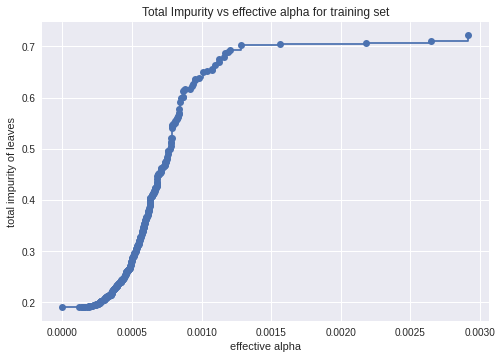

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_)
path =dtc_.cost_complexity_pruning_path(train_d1_k0, y_d1_k0[cols[0]])
ccp_alphas, impurities = path.ccp_alphas, path.impurities
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(**dtc_random.best_params_, ccp_alpha=ccp_alpha)
    clf.fit(train_d1_k0, y_d1_k0[cols[0]])
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 3 with ccp_alpha: 0.003623798954356272


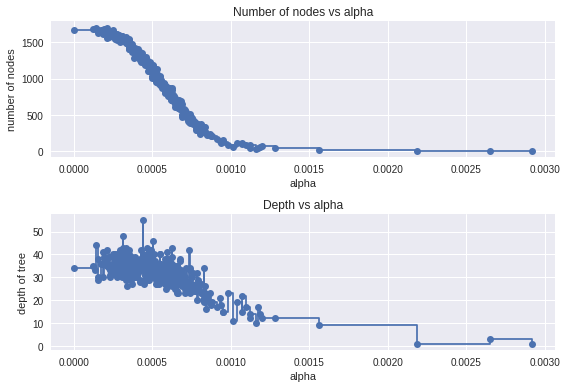

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()


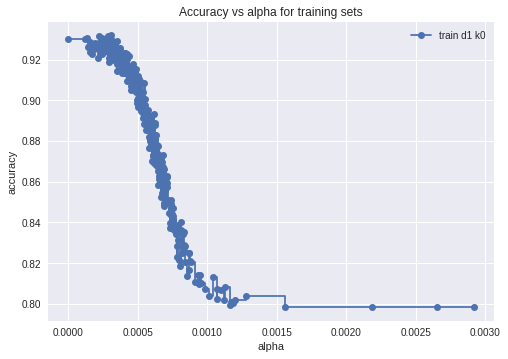

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
train_scores = [clf.score(train_d1_k0, y_d1_k0[cols[0]]) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train d1 k0",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_, ccp_alpha=ccp_alphas[np.argmax(train_scores)])
calib_dtc = CalibratedClassifierCV(dtc_, method='sigmoid', cv=20)
calib_dtc.fit(train_d1_k0, y_d1_k0[cols[0]])

CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(ccp_alpha=0.00031045478901252246,
                                                             class_weight=None,
                                                             criterion='entropy',
                                                             max_depth=None,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=2,
                                                             min_samples_split=10,
                                                             min_weight_fraction_leaf=0.0,
                                                             presort='dep

In [ ]:
d2_greet_dtc = calib_dtc.predict_proba(train_d2)

In [ ]:
d2_greet_roc = roc_auc_score(y_d2[cols[0]], d2_greet_dtc[:,1], average='micro')
d2_greet_f1 = f1_score(y_d2[cols[0]], np.round(d2_greet_dtc[:,1]), average='micro')
d2_greet_hamm = hamming_loss(y_d2[cols[0]], np.round(d2_greet_dtc[:,1]))
d2_greet_brier = brier_score_loss(y_d2[cols[0]], d2_greet_dtc[:,1])

print(f'\nROC d2 Greeting: {d2_greet_roc}')
print(f'\nF1 d2 Greeting: {d2_greet_f1}')
print(f'\nHamming Loss d2 Greeting: {d2_greet_hamm}')
print(f'\nBrier Loss d2 Greeting: {d2_greet_brier}')


ROC d2 Greeting: 0.683421984973342

F1 d2 Greeting: 0.7978358405911851

Hamming Loss d2 Greeting: 0.202164159408815

Brier Loss d2 Greeting: 0.15879969322622065


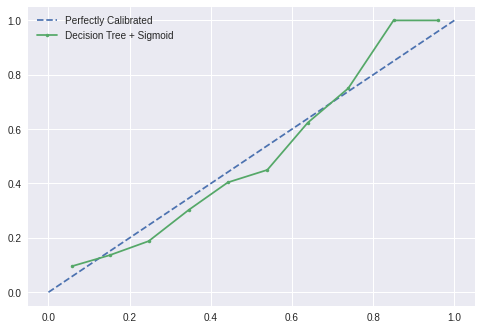

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[0]], d2_greet_dtc[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Decision Tree + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_dtc, 'calib_dtc_greet.sav')

['calib_dtc_greet.sav']

In [ ]:
from google.colab import files
files.download('calib_dtc_greet.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 1 Classifier 2 - Random Forest with Random Search and Calibration on Backstory

In [ ]:
rf = RandomForestClassifier(n_jobs=-1)

In [ ]:
random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230],
               'criterion': ['gini', 'entropy']}

rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring='roc_auc',
                               cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(train_d1_k1, y_d1_k1[cols[0]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  1.2min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rf_random.best_params_

{'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': 80,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 130}

In [ ]:
rf_ = RandomForestClassifier(**rf_random.best_params_, n_jobs=-1)
calib_d1_greetrf = CalibratedClassifierCV(rf_, method='sigmoid', cv=5)
calib_d1_greetrf.fit(train_d1_k1, y_d1_k1[cols[0]])

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='entropy',
                                                             max_depth=80,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=2,
                                                             min_samples_split=2,
                             

In [ ]:
d2_greet_rf = calib_d1_greetrf.predict_proba(train_d2)

In [ ]:
d2_greetrf_roc = roc_auc_score(y_d2[cols[0]], d2_greet_rf[:,1], average='micro')
d2_greetrf_f1 = f1_score(y_d2[cols[0]], np.round(d2_greet_rf[:,1]), average='micro')
d2_greetrf_hamm = hamming_loss(y_d2[cols[0]], np.round(d2_greet_rf[:,1]))
d2_greetrf_brier = brier_score_loss(y_d2[cols[0]], d2_greet_rf[:,1])

print(f'\nROC d2 Greeting: {d2_greetrf_roc}')
print(f'\nF1 d2 Greeting: {d2_greetrf_f1}')
print(f'\nHamming Loss d2 Greeting: {d2_greetrf_hamm}')
print(f'\nBrier Loss d2 Greeting: {d2_greetrf_brier}')


ROC d2 Greeting: 0.7372722962077509

F1 d2 Greeting: 0.8155186064924782

Hamming Loss d2 Greeting: 0.18448139350752177

Brier Loss d2 Greeting: 0.13806580304947802


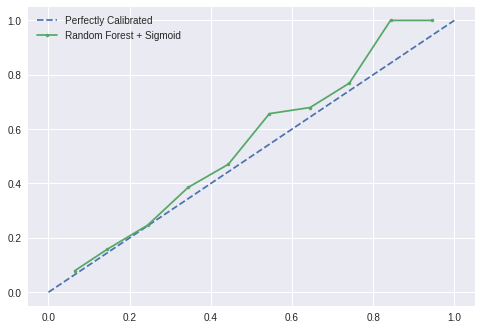

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[0]], d2_greet_rf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Random Forest + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_d1_greetrf, 'calib_d1_greetrf.sav')

['calib_d1_greetrf.sav']

In [ ]:
from google.colab import files
files.download('calib_d1_greetrf.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import hyperopt as hp

#### Class 1 Classifier 3 - XGBoost w/ Hyperopt and Calibration

In [ ]:
xgb = XGBClassifier(n_thread=-1)

In [ ]:
from hyperopt import hp, fmin, tpe

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_d1_k2,y_d1_k2[cols[0]])
    y_pred = model.predict_proba(train_d2)
    score=roc_auc_score(y_d2[cols[0]],y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.8, 'max_depth': 9, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.8, 'max_depth': 11, 'min_child_weight': 1, 'n_estimators': 300, 'reg

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
xgb_d1_best = get_params_space(best)
print(xgb_d1_best)

{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'subsample': 0.5}


In [ ]:
calib_d1xgb_greet= CalibratedClassifierCV(XGBClassifier(**xgb_d1_best, n_thread=-1), method='sigmoid', cv=5)
calib_d1xgb_greet.fit(train_d1_k2, y_d1_k2[cols[0]])

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1,
                                                    eta=0.025, gamma=0.05,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=4,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=300, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='bina

In [ ]:
d2_greet_xgb = calib_d1xgb_greet.predict_proba(train_d2)

In [ ]:
d2_greetxgb_roc = roc_auc_score(y_d2[cols[0]], d2_greet_xgb[:,1], average='micro')
d2_greetxgb_f1 = f1_score(y_d2[cols[0]], np.round(d2_greet_xgb[:,1]), average='micro')
d2_greetxgb_hamm = hamming_loss(y_d2[cols[0]], np.round(d2_greet_xgb[:,1]))
d2_greetxgb_brier = brier_score_loss(y_d2[cols[0]], d2_greet_xgb[:,1])

print(f'\nROC d2 Greeting: {d2_greetxgb_roc}')
print(f'\nF1 d2 Greeting: {d2_greetxgb_f1}')
print(f'\nHamming Loss d2 Greeting: {d2_greetxgb_hamm}')
print(f'\nBrier Loss d2 Greeting: {d2_greetxgb_brier}')


ROC d2 Greeting: 0.7082030585355615

F1 d2 Greeting: 0.8007389812615467

Hamming Loss d2 Greeting: 0.19926101873845342

Brier Loss d2 Greeting: 0.1462211698262601


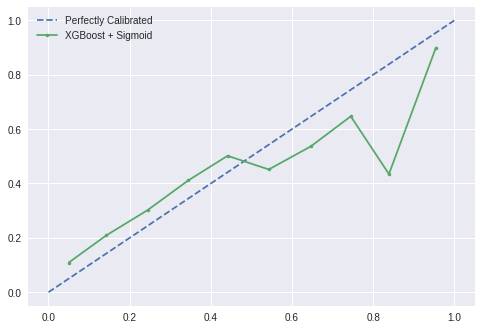

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[0]], d2_greet_xgb[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','XGBoost + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_d1xgb_greet, 'calib_d1xgb_greet.sav')
files.download('calib_d1xgb_greet.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from catboost.utils import eval_metric

#### Class 1 - Classifier 4 - CatBoost with Hyperopt and Calibration on Rant Class

In [ ]:
train_pool = catboost.Pool(train_d1_k3, y_d1_k3[cols[0]])

In [ ]:
# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin

def hyperopt_objective(params):
    print(params)
    model = catboost.CatBoostClassifier(**params, task_type='GPU')
    model.fit(train_pool)
    y_pred = model.predict_proba(train_d2)
    return -eval_metric(y_d2[cols[0]], y_pred[:, 1], 'AUC')[0]

space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'depth': hp.choice('depth', [3, 10]),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'boosting_type': hp.choice('boosting_type', ['Ordered', 'Plain']),
    'max_ctr_complexity': hp.choice('max_ctr_complexity', [0, 8])}

best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=5,
    rstate=np.random.RandomState(seed=123))

Streaming output truncated to the last 5000 lines.
5:	learn: 0.5580696	total: 1.43s	remaining: 3m 57s
6:	learn: 0.5467971	total: 1.53s	remaining: 3m 36s
7:	learn: 0.5370447	total: 1.56s	remaining: 3m 13s
8:	learn: 0.5298834	total: 1.59s	remaining: 2m 55s
9:	learn: 0.5220104	total: 2.01s	remaining: 3m 18s
10:	learn: 0.5168479	total: 2.04s	remaining: 3m 3s
11:	learn: 0.5113248	total: 2.08s	remaining: 2m 51s
12:	learn: 0.5072839	total: 2.11s	remaining: 2m 40s
13:	learn: 0.5030117	total: 2.17s	remaining: 2m 32s
14:	learn: 0.5000152	total: 2.45s	remaining: 2m 40s
15:	learn: 0.4976821	total: 2.49s	remaining: 2m 33s
16:	learn: 0.4939669	total: 2.91s	remaining: 2m 48s
17:	learn: 0.4925560	total: 2.94s	remaining: 2m 40s
18:	learn: 0.4893817	total: 3.36s	remaining: 2m 53s
19:	learn: 0.4863278	total: 3.78s	remaining: 3m 5s
20:	learn: 0.4835817	total: 4.2s	remaining: 3m 15s
21:	learn: 0.4818890	total: 4.36s	remaining: 3m 13s
22:	learn: 0.4798617	total: 4.78s	remaining: 3m 22s
23:	learn: 0.4782485	

In [ ]:
def get_space(space_params):
  space = {
    'learning_rate': [0.01, 0.1],
    'depth': [3, 10],
    'l2_leaf_reg': [1, 10],
    'boosting_type': ['Ordered', 'Plain'],
    'max_ctr_complexity':  [0, 8],
    }

  param_dict = dict()
  for key in space_params.keys():
    if isinstance(space_params.get(key), float):
      param_dict[key] = space_params.get(key)
    else:
      get_list = space_params.get(key)
      param_dict[key] = space.get(key)[get_list]
  return param_dict

In [ ]:
cat_d1_best = get_space(best)
print(cat_d1_best)

{'boosting_type': 'Plain', 'depth': 10, 'l2_leaf_reg': 8.555879516541207, 'learning_rate': 0.012200281335930548, 'max_ctr_complexity': 8}


In [ ]:
calib_catd1_greet = CalibratedClassifierCV(catboost.CatBoostClassifier(**cat_d1_best), method='sigmoid', cv=5)
calib_catd1_greet.fit(train_d1_k3, y_d1_k3[cols[0]])

Streaming output truncated to the last 5000 lines.
0:	learn: 0.6881378	total: 306ms	remaining: 5m 5s
1:	learn: 0.6832817	total: 574ms	remaining: 4m 46s
2:	learn: 0.6784603	total: 843ms	remaining: 4m 40s
3:	learn: 0.6738137	total: 1.11s	remaining: 4m 35s
4:	learn: 0.6691297	total: 1.38s	remaining: 4m 33s
5:	learn: 0.6646772	total: 1.65s	remaining: 4m 32s
6:	learn: 0.6603894	total: 1.91s	remaining: 4m 31s
7:	learn: 0.6562599	total: 2.18s	remaining: 4m 30s
8:	learn: 0.6520745	total: 2.45s	remaining: 4m 29s
9:	learn: 0.6481126	total: 2.72s	remaining: 4m 28s
10:	learn: 0.6442533	total: 2.98s	remaining: 4m 28s
11:	learn: 0.6405382	total: 3.25s	remaining: 4m 27s
12:	learn: 0.6369489	total: 3.52s	remaining: 4m 27s
13:	learn: 0.6330709	total: 3.79s	remaining: 4m 26s
14:	learn: 0.6295899	total: 4.06s	remaining: 4m 26s
15:	learn: 0.6261079	total: 4.33s	remaining: 4m 26s
16:	learn: 0.6227093	total: 4.6s	remaining: 4m 26s
17:	learn: 0.6192353	total: 4.88s	remaining: 4m 26s
18:	learn: 0.6160202	tota

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7fc45c0175d0>,
                       cv=5, method='sigmoid')

In [ ]:
calib_catd1_greet.base_estimator.get_params(deep=True)

In [ ]:
d2_greet_cat = calib_catd1_greet.predict_proba(train_d2)

In [ ]:
d2_greetcat_roc = roc_auc_score(y_d2[cols[0]], d2_greet_cat[:,1], average='micro')
d2_greetcat_f1 = f1_score(y_d2[cols[0]], np.round(d2_greet_cat[:,1]), average='micro')
d2_greetcat_hamm = hamming_loss(y_d2[cols[0]], np.round(d2_greet_cat[:,1]))
d2_greetcat_brier = brier_score_loss(y_d2[cols[0]], d2_greet_cat[:,1])

print(f'\nROC d2 Greeting: {d2_greetcat_roc}')
print(f'\nF1 d2 Greeting: {d2_greetcat_f1}')
print(f'\nHamming Loss d2 Greeting: {d2_greetcat_hamm}')
print(f'\nBrier Loss d2 Greeting: {d2_greetcat_brier}')

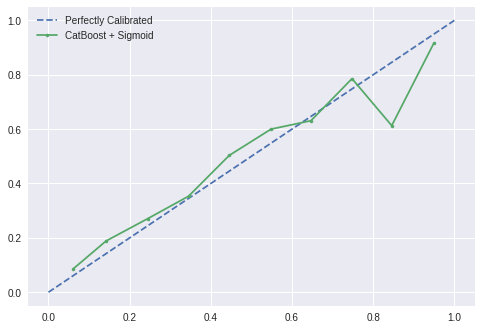

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[0]], d2_greet_cat[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','CatBoost + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_catd1_greet, 'calib_catd1_greet.sav')
files.download('calib_catd1_greet.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 1 - Classsifier 5 - SGD with Random Search and Calibration on Gratitude Class

In [ ]:
import random

In [ ]:
sgd = SGDClassifier()

sgd_params = {'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
              'penalty': ['l2', 'l1', 'elasticnet'],
              'learning_rate': ['adaptive', 'optimal', 'invscaling', 'constant'],
              'early_stopping':[True, False],
              'validation_fraction':[0.4,0.3,0.2,0.1],
              'eta0' : [random.uniform(0,1)],
              }
sgd_random = RandomizedSearchCV(sgd, param_distributions=sgd_params, n_iter=50, scoring='f1_micro',refit=True,cv=5,n_jobs=-1)
sgd_random.fit(train_d1_k4, y_d1_k4[cols[0]])

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SGDClassifier(alpha=0.0001, average=False,
                                           class_weight=None,
                                           early_stopping=False, epsilon=0.1,
                                           eta0=0.0, fit_intercept=True,
                                           l1_ratio=0.15,
                                           learning_rate='optimal',
                                           loss='hinge', max_iter=1000,
                                           n_iter_no_change=5, n_jobs=None,
                                           penalty='l2', power_t=0.5,
                                           random_state=None, shuffle=True,
                                           tol=0.001, validation_fractio...
                   param_distributions={'early_stopping': [True, False],
                                        'eta0': [0.4238461818871433],
                                  

In [ ]:
sgd_random.best_params_

{'early_stopping': True,
 'eta0': 0.4238461818871433,
 'learning_rate': 'adaptive',
 'loss': 'hinge',
 'penalty': 'l1',
 'validation_fraction': 0.2}

In [ ]:
sgd_random.best_score_

0.7983637677751944

In [ ]:
calib_sgdd1_greet = CalibratedClassifierCV(SGDClassifier(**sgd_random.best_params_), method='sigmoid', cv=5)
calib_sgdd1_greet.fit(train_d1_k4, y_d1_k4[cols[0]])

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=0.0001, average=False,
                                                    class_weight=None,
                                                    early_stopping=True,
                                                    epsilon=0.1,
                                                    eta0=0.4238461818871433,
                                                    fit_intercept=True,
                                                    l1_ratio=0.15,
                                                    learning_rate='adaptive',
                                                    loss='hinge', max_iter=1000,
                                                    n_iter_no_change=5,
                                                    n_jobs=None, penalty='l1',
                                                    power_t=0.5,
                                                    random_state=None,
                                                

In [ ]:
d2_greet_sgd = calib_sgdd1_greet.predict_proba(train_d2)

In [ ]:
d2_greet_roc = roc_auc_score(y_d2[cols[0]], d2_greet_sgd[:,1], average='micro')
d2_greet_f1 = f1_score(y_d2[cols[0]], np.round(d2_greet_sgd[:,1]), average='micro')
d2_greet_hamm = hamming_loss(y_d2[cols[0]], np.round(d2_greet_sgd[:,1]))
d2_greet_brier = brier_score_loss(y_d2[cols[0]], d2_greet_sgd[:,1])

print(f'\nROC d2 Greeeting: {d2_greet_roc}')
print(f'\nF1 d2 Greeting: {d2_greet_f1}')
print(f'\nHamming Loss d2 Greeting: {d2_greet_hamm}')
print(f'\nBrier Loss d2 Greeting: {d2_greet_brier}')


ROC d2 Greeeting: 0.4915199743653746

F1 d2 Greeting: 0.7978358405911851

Hamming Loss d2 Greeting: 0.202164159408815

Brier Loss d2 Greeting: 0.1611303030812127


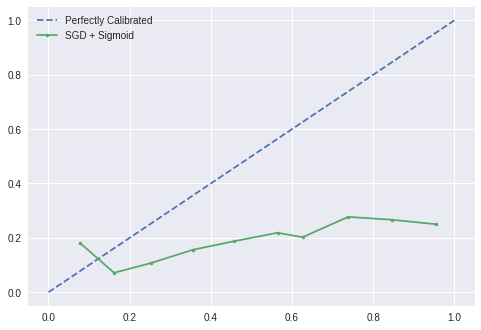

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[0]], d2_greet_sgd[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SGD + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_sgdd1_greet,'calib_sgdd1_greet.sav')
files.download('calib_sgdd1_greet.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 1 - Classifier 6 - SVM with RBF kernel with RandomSearch and Calibration

In [ ]:
svm = SVC(kernel='rbf')

In [ ]:


svm_params = {'C': [1e-3,1e-2,1e-1,0,1,10,100],
              'degree':[i for i in range(1,5)],
              'probability':[True, False],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1],
              }
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, scoring='roc_auc',refit=True,cv=5,n_jobs=-1)
svm_random.fit(train_d1_k5, y_d1_k5[cols[0]])

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight=None, coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [0.001, 0.01, 0.1, 0, 1, 10, 100],
                                        'degree': [1, 2, 3, 4],
                                        'probability': [True, False],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispatch='2*n_jobs', random_state=None, refit=True,
                   return_train_s

In [ ]:
svm_random.best_params_

{'C': 1, 'degree': 4, 'probability': False, 'shrinking': False, 'tol': 0.01}

In [ ]:
svm_random.best_score_

0.5577903095122345

In [ ]:
cols = y_train_multi.columns

In [ ]:
calib_svmrbf_d1_greet = CalibratedClassifierCV(SVC(**svm_random.best_params_), method='sigmoid', cv=5)
calib_svmrbf_d1_greet.fit(train_d1_k5, y_d1_k5[cols[0]])

CalibratedClassifierCV(base_estimator=SVC(C=1, break_ties=False, cache_size=200,
                                          class_weight=None, coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=4, gamma='scale', kernel='rbf',
                                          max_iter=-1, probability=False,
                                          random_state=None, shrinking=False,
                                          tol=0.01, verbose=False),
                       cv=5, method='sigmoid')

In [ ]:
d2_greet_svmrbf = calib_svmrbf_d1_greet.predict_proba(train_d2)

In [ ]:
d2_greet_svmrbf_roc = roc_auc_score(y_d2[cols[0]], d2_greet_svmrbf[:,1], average='micro')
d2_greet_svmrbf_f1 = f1_score(y_d2[cols[0]], np.round(d2_greet_svmrbf[:,1]), average='micro')
d2_greet_svmrbf_hamm = hamming_loss(y_d2[cols[0]], np.round(d2_greet_svmrbf[:,1]))
d2_greet_svmrbf_brier = brier_score_loss(y_d2[cols[0]], d2_greet_svmrbf[:,1])

print(f'\nROC d2 Greeting: {d2_greet_svmrbf_roc}')
print(f'\nF1 d2 Greeting: {d2_greet_svmrbf_f1}')
print(f'\nHamming Loss d2 Greeting: {d2_greet_svmrbf_hamm}')
print(f'\nBrier Loss d2 Greeting: {d2_greet_svmrbf_brier}')


ROC d2 Greeting: 0.5552081560948309

F1 d2 Greeting: 0.7980997624703088

Hamming Loss d2 Greeting: 0.20190023752969122

Brier Loss d2 Greeting: 0.15962966375206222


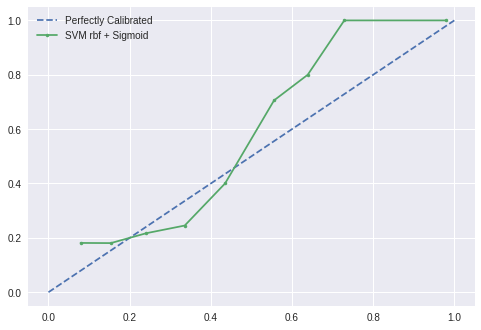

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[0]], d2_greet_svmrbf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM rbf + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_svmrbf_d1_greet, 'calib_svmrbf_d1_greet.sav')
files.download('calib_svmrbf_d1_greet.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Class 1 - Classifier 7 - SVM with randomsearch and calibration 

In [ ]:
svm = SVC(class_weight='balanced')

In [ ]:
svm_params = {'kernel': ['poly','sigmoid', 'linear'],
              'C': [1e-5,1e-4,1e-3,1e-2,1e-1,0,1,10,100,1000],
              'degree':[i for i in range(1,5)],
              'probability':[True],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1]}
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, verbose=2, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k6, y_d1_k6[cols[0]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  8.6min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight='balanced', coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [1e-05, 0.0001, 0.001, 0.01, 0.1,
                                              0, 1, 10, 100, 1000],
                                        'degree': [1, 2, 3, 4],
                                        'kernel': ['poly', 'sigmoid', 'linear'],
                                        'probability': [True],
                                        'shrinking': [True, False],
                                     

In [ ]:
svm_random.best_params_

{'C': 1,
 'degree': 4,
 'kernel': 'poly',
 'probability': True,
 'shrinking': False,
 'tol': 0.001}

In [ ]:
calib_svm_d1_greet = CalibratedClassifierCV(SVC(**svm_random.best_params_, class_weight='balanced'), method='sigmoid', cv=3)
calib_svm_d1_greet.fit(train_d1_k6, y_d1_k6[cols[0]])

CalibratedClassifierCV(base_estimator=SVC(C=1, break_ties=False, cache_size=200,
                                          class_weight='balanced', coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=4, gamma='scale',
                                          kernel='poly', max_iter=-1,
                                          probability=True, random_state=None,
                                          shrinking=False, tol=0.001,
                                          verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_svm_greet = calib_svm_d1_greet.predict_proba(train_d2)

In [ ]:
d2_svmgreet_roc = roc_auc_score(y_d2[cols[0]], d2_svm_greet[:,1], average='micro')
d2_svmgreet_f1 = f1_score(y_d2[cols[0]], np.round(d2_svm_greet[:,1]), average='micro')
d2_svmgreet_hamm = hamming_loss(y_d2[cols[0]], np.round(d2_svm_greet[:,1]))
d2_svmgreet_brier = brier_score_loss(y_d2[cols[0]], d2_svm_greet[:,1])

print(f'\nROC d2 Greeting: {d2_svmgreet_roc}')
print(f'\nF1 d2 Greeting: {d2_svmgreet_f1}')
print(f'\nHamming Loss d2 Greeting: {d2_svmgreet_hamm}')
print(f'\nBrier Loss d2 Greeting: {d2_svmgreet_brier}')


ROC d2 Greeting: 0.5583119711454998

F1 d2 Greeting: 0.7978358405911851

Hamming Loss d2 Greeting: 0.202164159408815

Brier Loss d2 Greeting: 0.16007250631025147


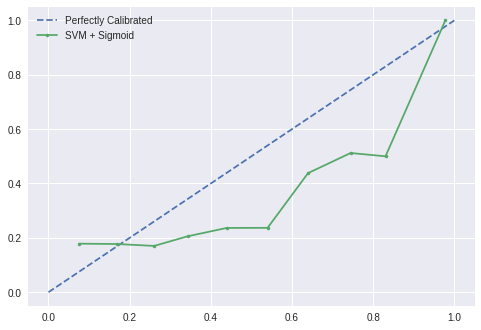

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[0]], d2_svm_greet[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_svm_d1_greet, 'calib_svm_d1_greet.sav',)
files.download('calib_svm_d1_greet.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
calib_catd1_greet = pickle.load(open('content/greet models/calib_catd1_greet.pkl', 'rb'))
calib_d1_greetrf = pickle.load(open('content/greet models/calib_d1_greetrf.pkl', 'rb'))
calib_d1xgb_greet = pickle.load(open('content/greet models/calib_d1xgb_greet.pkl', 'rb'))
calib_dtc_greet = pickle.load(open('content/greet models/calib_dtc_greet.pkl', 'rb'))
calib_sgdd1_greet = pickle.load(open('content/greet models/calib_sgdd1_greet.pkl', 'rb'))
calib_svm_d1_greet = pickle.load(open('content/greet models/calib_svm_d1_greet.pkl', 'rb'))
calib_svmrbf_d1_greet = pickle.load(open('content/greet models/calib_svmrbf_d1_greet.pkl', 'rb'))

In [ ]:
d2_cat = calib_catd1_greet.predict_proba(train_d2)[:,1]
d2_rf = calib_d1_greetrf.predict_proba(train_d2)[:,1]
d2_xgb = calib_d1xgb_greet.predict_proba(train_d2)[:,1]
d2_dtc = calib_dtc.predict_proba(train_d2)[:,1]
d2_sgd = calib_sgdd1_greet.predict_proba(train_d2)[:,1]
d2_svm = calib_svm_d1_greet.predict_proba(train_d2)[:,1]
d2_svmrbf = calib_svmrbf_d1_greet.predict_proba(train_d2)[:,1]

In [ ]:
d2_meta = np.hstack((d2_cat.reshape(-1,1), d2_rf.reshape(-1,1), d2_xgb.reshape(-1,1), d2_dtc.reshape(-1,1), d2_sgd.reshape(-1,1), d2_svm.reshape(-1,1), d2_svmrbf.reshape(-1,1)))

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from scipy.stats import loguniform
cols = y_train_multi.columns
meta_model1 = LogisticRegression()
# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)
# define search
search = RandomizedSearchCV(meta_model1, space,verbose=2, n_iter=50, refit=True, scoring='accuracy', n_jobs=-1, cv=cv, random_state=1)
# execute search
result = search.fit(d2_meta, y_d2[cols[0]])
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Fitting 30 folds for each of 50 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 1372 tasks      | elapsed:   11.4s


Best Score: 0.8174114596222417
Best Hyperparameters: {'C': 0.008301451461243866, 'penalty': 'none', 'solver': 'newton-cg'}


[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed:   14.1s finished


In [ ]:
calib_meta_lr = CalibratedClassifierCV(LogisticRegression(**search.best_params_), method='sigmoid', cv=3)
calib_meta_lr.fit(d2_meta, y_d2[cols[0]])

CalibratedClassifierCV(base_estimator=LogisticRegression(C=0.008301451461243866,
                                                         class_weight=None,
                                                         dual=False,
                                                         fit_intercept=True,
                                                         intercept_scaling=1,
                                                         l1_ratio=None,
                                                         max_iter=100,
                                                         multi_class='auto',
                                                         n_jobs=None,
                                                         penalty='none',
                                                         random_state=None,
                                                         solver='newton-cg',
                                                         tol=0.0001, verbose=0,
                       

In [ ]:
d2_meta_greet = calib_meta_lr.predict_proba(d2_meta)

In [ ]:
d2_meta_roc = roc_auc_score(y_d2[cols[0]], d2_meta_greet[:,1], average='micro')
d2_meta_f1 = f1_score(y_d2[cols[0]], np.round(d2_meta_greet[:,1]), average='micro')
d2_meta_hamm = hamming_loss(y_d2[cols[0]], np.round(d2_meta_greet[:,1]))
d2_meta_brier = brier_score_loss(y_d2[cols[0]], d2_meta_greet[:,1])

print(f'\nROC d2 Greeting: {d2_meta_roc}')
print(f'\nF1 d2 Greeting: {d2_meta_f1}')
print(f'\nHamming Loss d2 Greeting: {d2_meta_hamm}')
print(f'\nBrier Loss d2 Greeting: {d2_meta_brier}')


ROC d2 Greeting: 0.7402110365353871

F1 d2 Greeting: 0.816970176827659

Hamming Loss d2 Greeting: 0.18302982317234098

Brier Loss d2 Greeting: 0.13719716561255021


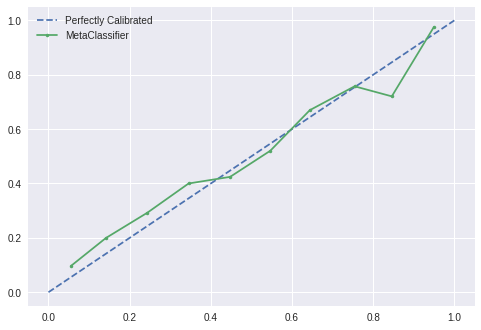

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fraction_of_positives, mean_predicted_values = calibration_curve(y_d2[cols[0]], d2_meta_greet[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mean_predicted_values, fraction_of_positives, marker='.')
plt.legend(['Perfectly Calibrated','MetaClassifier'])
plt.show()

In [ ]:
from google.colab import files
joblib.dump(calib_meta_lr, 'calib_meta_lrgreet.sav')
files.download('calib_meta_lrgreet.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Backstory - Stacking Classifier

#### Class 2, Classifier 1 - Decision Tree w/ RandomizedSearch, Pruning and Calibration 

In [ ]:
print(f'Greeting Class samples: {np.count_nonzero(y_d1_k0[cols[0]].values==1)}')
print(f'Backstory Class samples: {np.count_nonzero(y_d1_k0[cols[1]].values==1)}')
print(f'Justification Class samples: {np.count_nonzero(y_d1_k0[cols[2]].values==1)}')
print(f'Rant Class samples: {np.count_nonzero(y_d1_k0[cols[3]].values==1)}')
print(f'Gratitude Class samples: {np.count_nonzero(y_d1_k0[cols[4]].values==1)}')
print(f'Other Class samples: {np.count_nonzero(y_d1_k0[cols[5]].values==1)}')
print(f'Express Emotion Class samples: {np.count_nonzero(y_d1_k0[cols[6]].values==1)}')

Greeting Class samples: 1528
Backstory Class samples: 4115
Justification Class samples: 157
Rant Class samples: 521
Gratitude Class samples: 1069
Other Class samples: 3050
Express Emotion Class samples: 231


In [ ]:
dtc = DecisionTreeClassifier(class_weight='balanced')

random_grid = {'splitter': ['best', 'random'],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'criterion': ['gini', 'entropy']}

dtc_random = RandomizedSearchCV(estimator = dtc, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 50, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
dtc_random.fit(train_d1_k0, y_d1_k0[cols[1]])

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 143 out of 150 | elapsed:    2.5s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    2.6s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight='balanced',
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
    

In [ ]:
dtc_random.best_params_

{'criterion': 'gini',
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'splitter': 'random'}

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

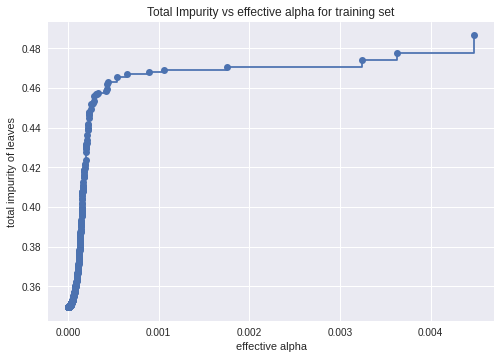

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_)
path =dtc_.cost_complexity_pruning_path(train_d1_k0, y_d1_k0[cols[1]])
ccp_alphas, impurities = path.ccp_alphas, path.impurities
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(**dtc_random.best_params_, ccp_alpha=ccp_alpha)
    clf.fit(train_d1_k0, y_d1_k0[cols[1]])
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.009786692088366078


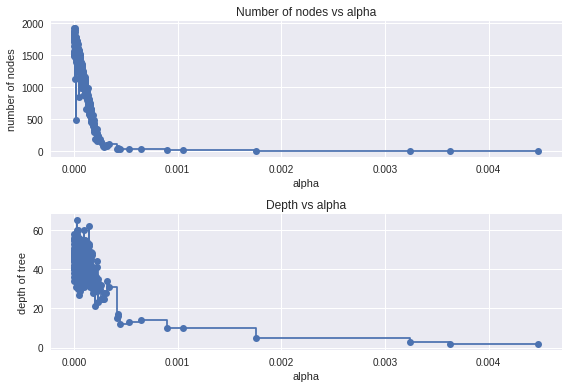

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()


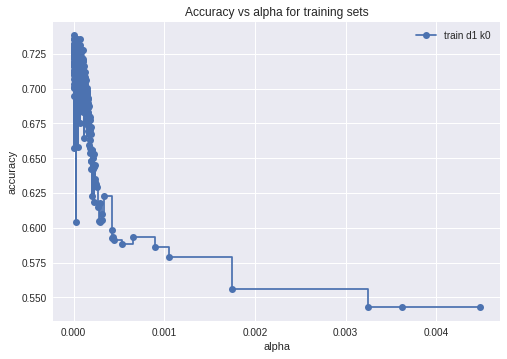

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
train_scores = [clf.score(train_d1_k0, y_d1_k0[cols[1]]) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train d1 k0",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
ccp_alphas[np.argmax(train_scores)]

4.398697985396227e-06

In [ ]:
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_, class_weight='balanced', ccp_alpha=ccp_alphas[np.argmax(train_scores)])
calib_dtc_back = CalibratedClassifierCV(dtc_, method='sigmoid', cv=3)
calib_dtc_back.fit(train_d1_k0, y_d1_k0[cols[1]])

CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(ccp_alpha=4.398697985396227e-06,
                                                             class_weight='balanced',
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=10,
                                                             min_weight_fraction_leaf=0.0,
                                                             presort='d

In [ ]:
d2_back_dtc = calib_dtc_back.predict_proba(train_d2)

In [ ]:
d2_back_roc = roc_auc_score(y_d2[cols[1]], d2_back_dtc[:,1], average='micro')
d2_back_f1 = f1_score(y_d2[cols[1]], np.round(d2_back_dtc[:,1]), average='micro')
d2_back_hamm = hamming_loss(y_d2[cols[1]], np.round(d2_back_dtc[:,1]))
d2_back_brier = brier_score_loss(y_d2[cols[1]], d2_back_dtc[:,1])

print(f'\nROC d2 Backstory: {d2_back_roc}')
print(f'\nF1 d2 Backstory: {d2_back_f1}')
print(f'\nHamming Loss d2 Backstory: {d2_back_hamm}')
print(f'\nBrier Loss d2 Backstory: {d2_back_brier}')


ROC d2 Backstory: 0.6230856355124247

F1 d2 Backstory: 0.5865663763525997

Hamming Loss d2 Backstory: 0.4134336236474004

Brier Loss d2 Backstory: 0.2393174529596323


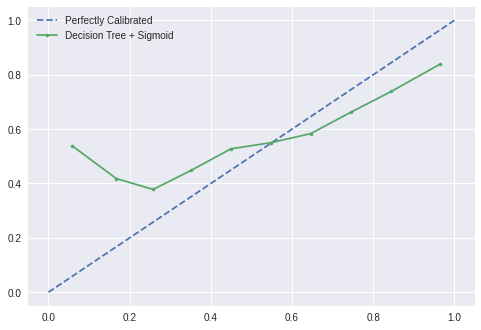

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[1]], d2_back_dtc[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Decision Tree + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_dtc_back, 'calib_dtc_back.sav')

['calib_dtc_back.sav']

In [ ]:
from google.colab import files
files.download('calib_dtc_back.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 1 Classifier 2 - Random Forest with Random Search and Calibration on Backstory

In [ ]:
rf = RandomForestClassifier(n_jobs=-1, class_weight='balanced')

In [ ]:
random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230],
               'criterion': ['gini', 'entropy']}

rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 10, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(train_d1_k1, y_d1_k1[cols[1]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  1.1min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight='balanced',
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
         

In [ ]:
rf_random.best_params_

{'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': 80,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 130}

In [ ]:
rf_ = RandomForestClassifier(**rf_random.best_params_, class_weight='balanced', n_jobs=-1)
calib_d1_backrf = CalibratedClassifierCV(rf_, method='sigmoid', cv=3)
calib_d1_backrf.fit(train_d1_k1, y_d1_k1[cols[1]])

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight='balanced',
                                                             criterion='entropy',
                                                             max_depth=80,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=2,
                                                             min_samples_split=2,
                       

In [ ]:
d2_back_rf = calib_d1_backrf.predict_proba(train_d2)

In [ ]:
d2_backrf_roc = roc_auc_score(y_d2[cols[1]], d2_back_rf[:,1], average='micro')
d2_backrf_f1 = f1_score(y_d2[cols[1]], np.round(d2_back_rf[:,1]), average='micro')
d2_backrf_hamm = hamming_loss(y_d2[cols[1]], np.round(d2_back_rf[:,1]))
d2_backrf_brier = brier_score_loss(y_d2[cols[1]], d2_back_rf[:,1])

print(f'\nROC d2 Backstory: {d2_backrf_roc}')
print(f'\nF1 d2 Backstory: {d2_backrf_f1}')
print(f'\nHamming Loss d2 Backstory: {d2_backrf_hamm}')
print(f'\nBrier Loss d2 Backstory: {d2_backrf_brier}')


ROC d2 Backstory: 0.7234863487178027

F1 d2 Backstory: 0.6631037212984956

Hamming Loss d2 Backstory: 0.33689627870150435

Brier Loss d2 Backstory: 0.21067349049336018


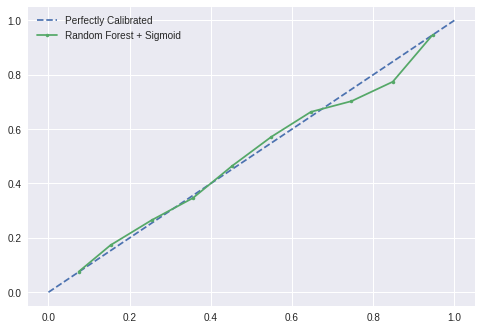

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[1]], d2_back_rf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Random Forest + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_d1_backrf, 'calib_d1_backrf.sav')

['calib_d1_backrf.sav']

In [ ]:
from google.colab import files
files.download('calib_d1_backrf.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import hyperopt as hp

#### Class 1 Classifier 3 - XGBoost w/ Hyperopt and Calibration

In [ ]:
xgb = XGBClassifier(n_thread=-1)

In [ ]:
from hyperopt import hp, fmin, tpe

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_d1_k2,y_d1_k2[cols[1]])
    y_pred = model.predict_proba(train_d2)
    score=roc_auc_score(y_d2[cols[1]],y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
         'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 6, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 0.05, 'eta': 0.5, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.5, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 12, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 99, 'subsample': 0.05}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'scale_pos_weight': 1000, 'subsample': 0.05}
{'colsample_bytree': 0.05, '

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
xgb_d1_best = get_params_space(best)
print(xgb_d1_best)

{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 50, 'subsample': 1}


In [ ]:
calib_d1xgb_back= CalibratedClassifierCV(XGBClassifier(**xgb_d1_best, n_thread=-1), method='isotonic', cv=3)
calib_d1xgb_back.fit(train_d1_k2, y_d1_k2[cols[1]])

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1,
                                                    eta=0.025, gamma=1,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=8,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='binary:

In [ ]:
d2_back_xgb = calib_d1xgb_back.predict_proba(train_d2)

In [ ]:
d2_backxgb_roc = roc_auc_score(y_d2[cols[1]], d2_back_xgb[:,1], average='micro')
d2_backxgb_f1 = f1_score(y_d2[cols[1]], np.round(d2_back_xgb[:,1]), average='micro')
d2_backxgb_hamm = hamming_loss(y_d2[cols[1]], np.round(d2_back_xgb[:,1]))
d2_backxgb_brier = brier_score_loss(y_d2[cols[1]], d2_back_xgb[:,1])

print(f'\nROC d2 Backstory: {d2_backxgb_roc}')
print(f'\nF1 d2 Backstory: {d2_backxgb_f1}')
print(f'\nHamming Loss d2 Backstory: {d2_backxgb_hamm}')
print(f'\nBrier Loss d2 Backstory: {d2_backxgb_brier}')


ROC d2 Backstory: 0.7096587507455533

F1 d2 Backstory: 0.6481921351280021

Hamming Loss d2 Backstory: 0.3518078648719979

Brier Loss d2 Backstory: 0.21586160527815645


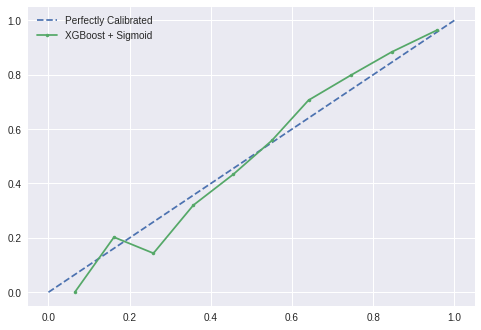

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[1]], d2_back_xgb[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','XGBoost + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_d1xgb_back,'calib_d1xgb_back.sav')
files.download('calib_d1xgb_back.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from catboost.utils import eval_metric

#### Class 1 - Classifier 4 - CatBoost with Hyperopt and Calibration

In [ ]:
cols = y_train_multi.columns
train_pool = catboost.Pool(train_d1_k3, y_d1_k3[cols[1]])

In [ ]:
# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin

def hyperopt_objective(params):
    print(params)
    model = catboost.CatBoostClassifier(**params, task_type='GPU')
    model.fit(train_pool)
    y_pred = model.predict_proba(train_d2)
    return -eval_metric(y_d2[cols[1]], y_pred[:, 1], 'AUC')[0]

space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
     'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
    'depth': hp.choice('depth', [3, 10]),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'boosting_type': hp.choice('boosting_type', ['Ordered', 'Plain']),
    'max_ctr_complexity': hp.choice('max_ctr_complexity', [0, 8])}

best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=5,
    rstate=np.random.RandomState(seed=123))

Streaming output truncated to the last 5000 lines.
5:	learn: 0.2199934	total: 95.4ms	remaining: 15.8s
6:	learn: 0.1887656	total: 112ms	remaining: 15.8s
7:	learn: 0.1642855	total: 128ms	remaining: 15.8s
8:	learn: 0.1448347	total: 143ms	remaining: 15.7s
9:	learn: 0.1293600	total: 158ms	remaining: 15.7s
10:	learn: 0.1169892	total: 174ms	remaining: 15.6s
11:	learn: 0.1071037	total: 188ms	remaining: 15.5s
12:	learn: 0.0990246	total: 204ms	remaining: 15.5s
13:	learn: 0.0925175	total: 221ms	remaining: 15.5s
14:	learn: 0.0871781	total: 237ms	remaining: 15.5s
15:	learn: 0.0827411	total: 252ms	remaining: 15.5s
16:	learn: 0.0790765	total: 267ms	remaining: 15.4s
17:	learn: 0.0760769	total: 281ms	remaining: 15.4s
18:	learn: 0.0735435	total: 296ms	remaining: 15.3s
19:	learn: 0.0714103	total: 312ms	remaining: 15.3s
20:	learn: 0.0695972	total: 327ms	remaining: 15.3s
21:	learn: 0.0680747	total: 343ms	remaining: 15.2s
22:	learn: 0.0668508	total: 356ms	remaining: 15.1s
23:	learn: 0.0658053	total: 370ms	r

In [ ]:
def get_space(space_params):
  space = {
    'learning_rate': [0.01, 0.1],
    'depth': [3, 10],
    'l2_leaf_reg': [1, 10],
    'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000],
    'boosting_type': ['Ordered', 'Plain'],
    'max_ctr_complexity':  [0, 8],
    }

  param_dict = dict()
  for key in space_params.keys():
    if isinstance(space_params.get(key), float):
      param_dict[key] = space_params.get(key)
    else:
      get_list = space_params.get(key)
      param_dict[key] = space.get(key)[get_list]
  return param_dict

In [ ]:
cat_d1_best = get_space(best)
print(cat_d1_best)

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 1.7872262817346178, 'learning_rate': 0.04308614773826791, 'max_ctr_complexity': 0, 'scale_pos_weight': 1}


In [ ]:
calib_catd1_back = CalibratedClassifierCV(catboost.CatBoostClassifier(**cat_d1_best), method='sigmoid', cv=5)
calib_catd1_back.fit(train_d1_k3, y_d1_k3[cols[1]])

Streaming output truncated to the last 5000 lines.
0:	learn: 0.6893743	total: 36.6ms	remaining: 36.6s
1:	learn: 0.6855146	total: 60.1ms	remaining: 30s
2:	learn: 0.6822687	total: 83.7ms	remaining: 27.8s
3:	learn: 0.6792047	total: 107ms	remaining: 26.5s
4:	learn: 0.6765149	total: 133ms	remaining: 26.5s
5:	learn: 0.6737173	total: 158ms	remaining: 26.1s
6:	learn: 0.6714034	total: 181ms	remaining: 25.6s
7:	learn: 0.6689957	total: 204ms	remaining: 25.2s
8:	learn: 0.6668988	total: 229ms	remaining: 25.2s
9:	learn: 0.6644221	total: 255ms	remaining: 25.3s
10:	learn: 0.6623693	total: 278ms	remaining: 25s
11:	learn: 0.6604619	total: 301ms	remaining: 24.8s
12:	learn: 0.6590011	total: 326ms	remaining: 24.7s
13:	learn: 0.6578062	total: 350ms	remaining: 24.6s
14:	learn: 0.6561953	total: 371ms	remaining: 24.4s
15:	learn: 0.6550689	total: 393ms	remaining: 24.2s
16:	learn: 0.6537366	total: 417ms	remaining: 24.1s
17:	learn: 0.6526162	total: 443ms	remaining: 24.1s
18:	learn: 0.6516237	total: 467ms	remainin

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7f4ca7900b90>,
                       cv=5, method='sigmoid')

In [ ]:
calib_catd1_back.base_estimator.get_params(deep=True)

{'boosting_type': 'Ordered',
 'depth': 3,
 'l2_leaf_reg': 1.7872262817346178,
 'learning_rate': 0.04308614773826791,
 'max_ctr_complexity': 0,
 'scale_pos_weight': 1}

In [ ]:
d2_back_cat = calib_catd1_back.predict_proba(train_d2)

In [ ]:
d2_backcat_roc = roc_auc_score(y_d2[cols[1]], d2_back_cat[:,1], average='micro')
d2_backcat_f1 = f1_score(y_d2[cols[1]], np.round(d2_back_cat[:,1]), average='micro')
d2_backcat_hamm = hamming_loss(y_d2[cols[1]], np.round(d2_back_cat[:,1]))
d2_backcat_brier = brier_score_loss(y_d2[cols[1]], d2_back_cat[:,1])

print(f'\nROC d2 Backstory: {d2_backcat_roc}')
print(f'\nF1 d2 Backstory: {d2_backcat_f1}')
print(f'\nHamming Loss d2 Backstory: {d2_backcat_hamm}')
print(f'\nBrier Loss d2 Backstory: {d2_backcat_brier}')


ROC d2 Backstory: 0.7130711590962557

F1 d2 Backstory: 0.6539984164687253

Hamming Loss d2 Backstory: 0.34600158353127475

Brier Loss d2 Backstory: 0.21375061776953375


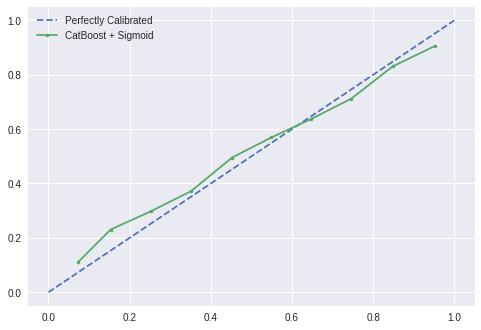

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[1]], d2_back_cat[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','CatBoost + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files
joblib.dump(calib_catd1_back, 'calib_catd1_back.sav')
files.download('calib_catd1_back.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 1 - Classsifier 5 - SGD with Random Search and Calibration on Gratitude Class

In [ ]:
import random

In [ ]:
sgd = SGDClassifier(class_weight='balanced')

sgd_params = {'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
              'penalty': ['l2', 'l1', 'elasticnet'],
              'learning_rate': ['adaptive', 'optimal', 'invscaling', 'constant'],
              'early_stopping':[True, False],
              'validation_fraction':[0.4,0.3,0.2,0.1],
              'eta0' : [random.uniform(0,1)]
              }
sgd_random = RandomizedSearchCV(sgd, param_distributions=sgd_params, n_iter=50, scoring='f1_micro',refit=True,cv=5,n_jobs=-1)
sgd_random.fit(train_d1_k4, y_d1_k4[cols[1]])

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SGDClassifier(alpha=0.0001, average=False,
                                           class_weight='balanced',
                                           early_stopping=False, epsilon=0.1,
                                           eta0=0.0, fit_intercept=True,
                                           l1_ratio=0.15,
                                           learning_rate='optimal',
                                           loss='hinge', max_iter=1000,
                                           n_iter_no_change=5, n_jobs=None,
                                           penalty='l2', power_t=0.5,
                                           random_state=None, shuffle=True,
                                           tol=0.001, validation_f...
                   param_distributions={'early_stopping': [True, False],
                                        'eta0': [0.9515316433910398],
                                  

In [ ]:
sgd_random.best_params_

{'early_stopping': True,
 'eta0': 0.9515316433910398,
 'learning_rate': 'invscaling',
 'loss': 'hinge',
 'penalty': 'elasticnet',
 'validation_fraction': 0.2}

In [ ]:
sgd_random.best_score_

0.5896028283567143

In [ ]:
calib_sgdd1_back = CalibratedClassifierCV(SGDClassifier(**sgd_random.best_params_), method='sigmoid', cv=3)
calib_sgdd1_back.fit(train_d1_k4, y_d1_k4[cols[1]])

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=0.0001, average=False,
                                                    class_weight=None,
                                                    early_stopping=True,
                                                    epsilon=0.1,
                                                    eta0=0.9515316433910398,
                                                    fit_intercept=True,
                                                    l1_ratio=0.15,
                                                    learning_rate='invscaling',
                                                    loss='hinge', max_iter=1000,
                                                    n_iter_no_change=5,
                                                    n_jobs=None,
                                                    penalty='elasticnet',
                                                    power_t=0.5,
                                                    rando

In [ ]:
d2_back_sgd = calib_sgdd1_back.predict_proba(train_d2)

In [ ]:
d2_back_roc = roc_auc_score(y_d2[cols[1]], d2_back_sgd[:,1], average='micro')
d2_back_f1 = f1_score(y_d2[cols[1]], np.round(d2_back_sgd[:,1]), average='micro')
d2_back_hamm = hamming_loss(y_d2[cols[1]], np.round(d2_back_sgd[:,1]))
d2_back_brier = brier_score_loss(y_d2[cols[1]], d2_back_sgd[:,1])

print(f'\nROC d2 Backstory: {d2_back_roc}')
print(f'\nF1 d2 Backstory: {d2_back_f1}')
print(f'\nHamming Loss d2 Backstory: {d2_back_hamm}')
print(f'\nBrier Loss d2 Backstory: {d2_back_brier}')


ROC d2 Backstory: 0.6347748171118494

F1 d2 Backstory: 0.5969912905779889

Hamming Loss d2 Backstory: 0.40300870942201106

Brier Loss d2 Backstory: 0.2348532818550595


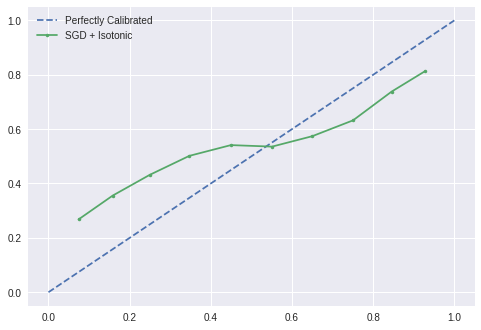

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[1]], d2_back_sgd[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SGD + Isotonic'])
plt.show()

In [ ]:
joblib.dump(calib_sgdd1_back,'calib_sgdd1_back.sav')
files.download('calib_sgdd1_back.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 1 - Classifier 6 - SVM with RBF kernel with RandomSearch and Calibration

In [ ]:
svm = SVC(kernel='rbf', class_weight='balanced')

In [ ]:


svm_params = {'C': [1e-5,1e-4,1e-3,1e-2,1e-1,0,1,10,100,1000],
              'degree':[i for i in range(1,5)],
              'probability':[True, False],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1],
              }
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, n_iter=10,verbose=3, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k5, y_d1_k5[cols[1]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  6.0min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight='balanced', coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [1e-05, 0.0001, 0.001, 0.01, 0.1,
                                              0, 1, 10, 100, 1000],
                                        'degree': [1, 2, 3, 4],
                                        'probability': [True, False],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispatch='2*

In [ ]:
svm_random.best_params_

{'C': 1, 'degree': 2, 'probability': False, 'shrinking': False, 'tol': 0.1}

In [ ]:
svm_random.best_score_

0.6486908445398526

In [ ]:
cols = y_train_multi.columns

In [ ]:
calib_svmrbf_d1_back = CalibratedClassifierCV(SVC(**svm_random.best_params_, class_weight='balanced'), method='sigmoid', cv=3)
calib_svmrbf_d1_back.fit(train_d1_k5, y_d1_k5[cols[1]])

CalibratedClassifierCV(base_estimator=SVC(C=1, break_ties=False, cache_size=200,
                                          class_weight=None, coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=2, gamma='scale', kernel='rbf',
                                          max_iter=-1, probability=False,
                                          random_state=None, shrinking=False,
                                          tol=0.1, verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_back_svmrbf = calib_svmrbf_d1_back.predict_proba(train_d2)

In [ ]:
d2_back_svmrbf_roc = roc_auc_score(y_d2[cols[1]], d2_back_svmrbf[:,1], average='micro')
d2_back_svmrbf_f1 = f1_score(y_d2[cols[1]], np.round(d2_back_svmrbf[:,1]), average='micro')
d2_back_svmrbf_hamm = hamming_loss(y_d2[cols[1]], np.round(d2_back_svmrbf[:,1]))
d2_back_svmrbf_brier = brier_score_loss(y_d2[cols[1]], d2_back_svmrbf[:,1])

print(f'\nROC d2 Backstory: {d2_back_svmrbf_roc}')
print(f'\nF1 d2 Backstory: {d2_back_svmrbf_f1}')
print(f'\nHamming Loss d2 Backstory: {d2_back_svmrbf_hamm}')
print(f'\nBrier Loss d2 Backstory: {d2_back_svmrbf_brier}')


ROC d2 Backstory: 0.6419568960200696

F1 d2 Backstory: 0.6012140406439694

Hamming Loss d2 Backstory: 0.3987859593560306

Brier Loss d2 Backstory: 0.23306654967946694


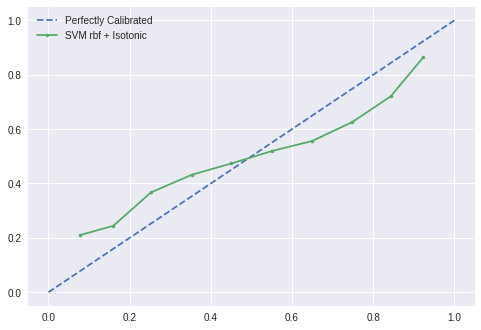

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[1]], d2_back_svmrbf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM rbf + Isotonic'])
plt.show()

In [ ]:
joblib.dump(calib_svmrbf_d1_back, 'calib_svmrbf_d1_back.sav')
files.download('calib_svmrbf_d1_back.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Class 7 - Classifier 7 - SVM with randomsearch and calibration on Backstory

In [ ]:
svm = SVC(class_weight='balanced')

In [ ]:
svm_params = {'kernel': ['poly','sigmoid', 'linear'],
              'C': [1e-5,1e-4,1e-3,1e-2,1e-1,0,1,10,100,1000],
              'degree':[i for i in range(1,5)],
              'probability':[True],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1]}
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, verbose=3, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k6, y_d1_k6[cols[1]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed: 12.9min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight='balanced', coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [1e-05, 0.0001, 0.001, 0.01, 0.1,
                                              0, 1, 10, 100, 1000],
                                        'degree': [1, 2, 3, 4],
                                        'kernel': ['poly', 'sigmoid', 'linear'],
                                        'probability': [True],
                                        'shrinking': [True, False],
                                     

In [ ]:
svm_random.best_params_

{'C': 0.1,
 'degree': 4,
 'kernel': 'poly',
 'probability': True,
 'shrinking': True,
 'tol': 0.0001}

In [ ]:
calib_svm_d1_back = CalibratedClassifierCV(SVC(**svm_random.best_params_, class_weight='balanced'), method='sigmoid', cv=3)
calib_svm_d1_back.fit(train_d1_k6, y_d1_k6[cols[1]])

CalibratedClassifierCV(base_estimator=SVC(C=0.1, break_ties=False,
                                          cache_size=200,
                                          class_weight='balanced', coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=4, gamma='scale',
                                          kernel='poly', max_iter=-1,
                                          probability=True, random_state=None,
                                          shrinking=True, tol=0.0001,
                                          verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_svm_back = calib_svm_d1_back.predict_proba(train_d2)

In [ ]:
d2_svmback_roc = roc_auc_score(y_d2[cols[1]], d2_svm_back[:,1], average='micro')
d2_svmback_f1 = f1_score(y_d2[cols[1]], np.round(d2_svm_back[:,1]), average='micro')
d2_svmback_hamm = hamming_loss(y_d2[cols[1]], np.round(d2_svm_back[:,1]))
d2_svmback_brier = brier_score_loss(y_d2[cols[1]], d2_svm_back[:,1])

print(f'\nROC d2 Backstory: {d2_svmback_roc}')
print(f'\nF1 d2 Backstory: {d2_svmback_f1}')
print(f'\nHamming Loss d2 Backstory: {d2_svmback_hamm}')
print(f'\nBrier Loss d2 Backstory: {d2_svmback_brier}')


ROC d2 Backstory: 0.6429059000674743

F1 d2 Backstory: 0.6059646344681974

Hamming Loss d2 Backstory: 0.3940353655318026

Brier Loss d2 Backstory: 0.23323849177715514


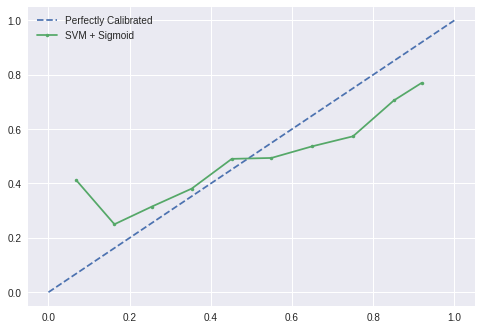

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[1]], d2_svm_back[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_svm_d1_back, 'calib_svm_d1_back.sav')
files.download('calib_svm_d1_back.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!gdown --id '1uQRLi6CAD19AHUfyEuJRg0cmwIcKG_A_'
!unzip 'greet stacked.zip' -d '/content/'

Downloading...
From: https://drive.google.com/uc?id=1uQRLi6CAD19AHUfyEuJRg0cmwIcKG_A_
To: /content/greet stacked.zip
226MB [00:00, 247MB/s]
Archive:  greet stacked.zip
  inflating: /content/calib_sgdd1_greet (2)/calib_catd1_greet.pkl  
  inflating: /content/calib_sgdd1_greet (2)/calib_d1_greetrf.pkl  
  inflating: /content/calib_sgdd1_greet (2)/calib_d1xgb_greet.pkl  
  inflating: /content/calib_sgdd1_greet (2)/calib_dtc_greet.pkl  
  inflating: /content/calib_sgdd1_greet (2)/calib_sgdd1_greet.pkl  
  inflating: /content/calib_sgdd1_greet (2)/calib_svm_d1_greet.pkl  
  inflating: /content/calib_sgdd1_greet (2)/calib_svmrbf_d1_greet.pkl  


In [ ]:
d2back_cat = calib_catd1_back.predict_proba(train_d2)[:,1]
d2back_rf = calib_d1_backrf.predict_proba(train_d2)[:,1]
d2back_xgb = calib_d1xgb_back.predict_proba(train_d2)[:,1]
d2back_dtc = calib_dtc_back.predict_proba(train_d2)[:,1]
d2back_sgd = calib_sgdd1_back.predict_proba(train_d2)[:,1]
d2back_svm = calib_svm_d1_back.predict_proba(train_d2)[:,1]
d2back_svmrbf = calib_svmrbf_d1_back.predict_proba(train_d2)[:,1]

In [ ]:
d2back_meta = np.hstack((d2back_cat.reshape(-1,1), d2back_rf.reshape(-1,1), d2back_xgb.reshape(-1,1), d2back_dtc.reshape(-1,1),
                         d2back_sgd.reshape(-1,1), d2back_svm.reshape(-1,1), d2back_svmrbf.reshape(-1,1)))

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from scipy.stats import loguniform

meta_model2 = LogisticRegression(class_weight='balanced')
# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)
# define search
search = RandomizedSearchCV(meta_model2, space,verbose=2, n_iter=50, refit=True, scoring='accuracy', n_jobs=-1, cv=cv, random_state=1)
# execute search
result = search.fit(d2back_meta, y_d2[cols[1]])
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Fitting 30 folds for each of 50 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    1.3s


Best Score: 0.6692615041785319
Best Hyperparameters: {'C': 23.61232066855036, 'penalty': 'l2', 'solver': 'lbfgs'}


[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed:   12.3s finished


In [ ]:
calib_meta2_lrback = CalibratedClassifierCV(LogisticRegression(**search.best_params_, class_weight='balanced'), method='isotonic', cv=3)
calib_meta2_lrback.fit(d2back_meta, y_d2[cols[1]])

CalibratedClassifierCV(base_estimator=LogisticRegression(C=23.61232066855036,
                                                         class_weight='balanced',
                                                         dual=False,
                                                         fit_intercept=True,
                                                         intercept_scaling=1,
                                                         l1_ratio=None,
                                                         max_iter=100,
                                                         multi_class='auto',
                                                         n_jobs=None,
                                                         penalty='l2',
                                                         random_state=None,
                                                         solver='lbfgs',
                                                         tol=0.0001, verbose=0,
                          

In [ ]:
d2_meta_back = calib_meta2_lrback.predict_proba(d2back_meta)

In [ ]:
d2back_meta_roc = roc_auc_score(y_d2[cols[1]], d2_meta_back[:,1], average='micro')
d2back_meta_f1 = f1_score(y_d2[cols[1]], np.round(d2_meta_back[:,1]), average='micro')
d2back_meta_hamm = hamming_loss(y_d2[cols[1]], np.round(d2_meta_back[:,1]))
d2back_meta_brier = brier_score_loss(y_d2[cols[1]], d2_meta_back[:,1])

print(f'\nROC d2 Backstory: {d2back_meta_roc}')
print(f'\nF1 d2 Backstory: {d2back_meta_f1}')
print(f'\nHamming Loss d2 Backstory: {d2back_meta_hamm}')
print(f'\nBrier Loss d2 Backstory: {d2back_meta_brier}')


ROC d2 Backstory: 0.736786683240677

F1 d2 Backstory: 0.673528635523885

Hamming Loss d2 Backstory: 0.3264713644761151

Brier Loss d2 Backstory: 0.20519764267392038


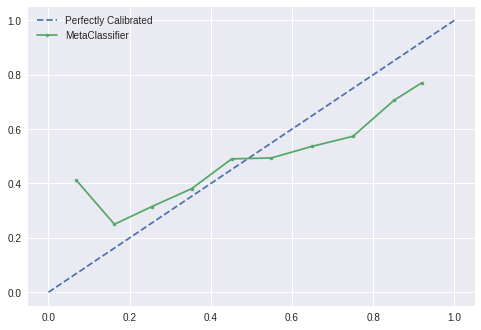

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fraction_of_positives, mean_predicted_values = calibration_curve(y_d2[cols[1]], d2_meta_back[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','MetaClassifier'])
plt.show()

In [ ]:
joblib.dump(calib_meta2_lrback, 'calib_meta2_lrback.sav')
files.download('calib_meta2_lrback.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Justification - Stacking Classifier


#### Class 3, Classifier 1 - Decision Tree w/ RandomizedSearch, Pruning and Calibration on Justification Class

In [ ]:
print(f'Greeting Class samples: {np.count_nonzero(y_d1_k0[cols[0]].values==1)}')
print(f'Backstory Class samples: {np.count_nonzero(y_d1_k0[cols[1]].values==1)}')
print(f'Justification Class samples: {np.count_nonzero(y_d1_k0[cols[2]].values==1)}')
print(f'Rant Class samples: {np.count_nonzero(y_d1_k0[cols[3]].values==1)}')
print(f'Gratitude Class samples: {np.count_nonzero(y_d1_k0[cols[4]].values==1)}')
print(f'Other Class samples: {np.count_nonzero(y_d1_k0[cols[5]].values==1)}')
print(f'Express Emotion Class samples: {np.count_nonzero(y_d1_k0[cols[6]].values==1)}')

Greeting Class samples: 1528
Backstory Class samples: 4115
Justification Class samples: 157
Rant Class samples: 521
Gratitude Class samples: 1069
Other Class samples: 3050
Express Emotion Class samples: 231


In [ ]:
dtc = DecisionTreeClassifier()

random_grid = {'splitter': ['best', 'random'],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'criterion': ['gini', 'entropy']
               }

dtc_random = RandomizedSearchCV(estimator = dtc, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 50, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
dtc_random.fit(train_d1_k0, y_d1_k0[cols[2]])

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    2.0s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
          

In [ ]:
dtc_random.best_params_

{'criterion': 'gini',
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'splitter': 'best'}

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

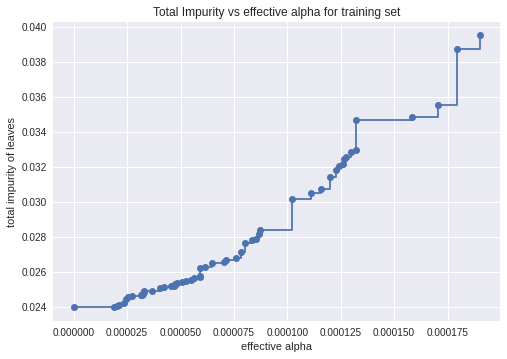

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_)
path =dtc_.cost_complexity_pruning_path(train_d1_k0, y_d1_k0[cols[2]])
ccp_alphas, impurities = path.ccp_alphas, path.impurities
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(**dtc_random.best_params_, ccp_alpha=ccp_alpha)
    clf.fit(train_d1_k0, y_d1_k0[cols[2]])
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 35 with ccp_alpha: 0.00021314844431081503


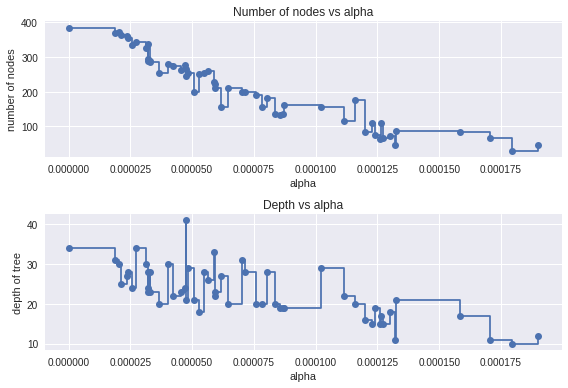

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()


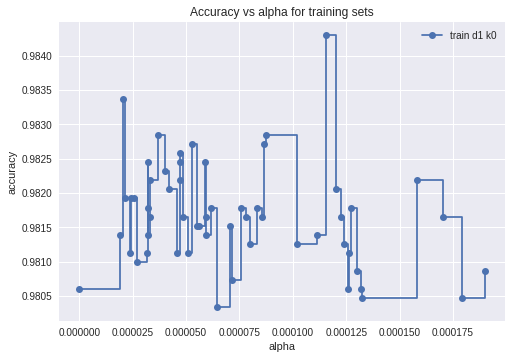

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
train_scores = [clf.score(train_d1_k0, y_d1_k0[cols[2]]) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train d1 k0",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
ccp_alphas[np.argmax(train_scores)]

0.005581254481981879

In [ ]:
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_,ccp_alpha=ccp_alphas[np.argmax(train_scores)])
calib_dtc_justifn = CalibratedClassifierCV(dtc_, method='isotonic', cv=20)
calib_dtc_justifn.fit(train_d1_k0, y_d1_k0[cols[2]])

CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(ccp_alpha=0.00011571959315427247,
                                                             class_weight=None,
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=2,
                                                             min_weight_fraction_leaf=0.0,
                                                             presort='depreca

In [ ]:
d2_justifn_dtc = calib_dtc_justifn.predict_proba(train_d2)

In [ ]:
d2_justifn_roc = roc_auc_score(y_d2[cols[2]], d2_justifn_dtc[:,1], average='micro')
d2_justifn_f1 = f1_score(y_d2[cols[2]], np.round(d2_justifn_dtc[:,1]), average='micro')
d2_justifn_hamm = hamming_loss(y_d2[cols[2]], np.round(d2_justifn_dtc[:,1]))
d2_justifn_brier = brier_score_loss(y_d2[cols[2]], d2_justifn_dtc[:,1])

print(f'\nROC d2 Justification: {d2_justifn_roc}')
print(f'\nF1 d2 Justification: {d2_justifn_f1}')
print(f'\nHamming Loss d2 Justification: {d2_justifn_hamm}')
print(f'\nBrier Loss d2 Justification: {d2_justifn_brier}')


ROC d2 Justification: 0.6656581596096762

F1 d2 Justification: 0.9791501715492215

Hamming Loss d2 Justification: 0.020849828450778568

Brier Loss d2 Justification: 0.02025533734107067


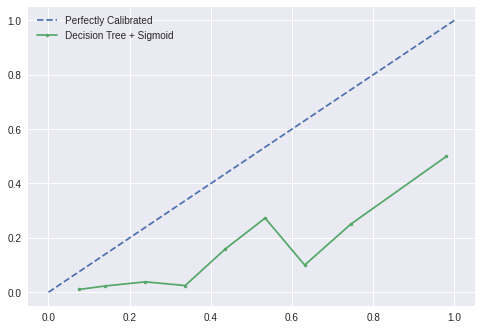

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[2]], d2_justifn_dtc[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Decision Tree + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_dtc_justifn, 'calib_dtc_justifn.sav')

['calib_dtc_justifn.sav']

In [ ]:
from google.colab import files
files.download('calib_dtc_justifn.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 1 Classifier 2 - Random Forest with Random Search and Calibration on Backstory

In [ ]:
rf = RandomForestClassifier(n_jobs=-1, class_weight='balanced')

In [ ]:
random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230],
               'criterion': ['gini', 'entropy']}

rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 10, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(train_d1_k1, y_d1_k1[cols[2]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.9s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight='balanced',
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
         

In [ ]:
rf_random.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': 100,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 10,
 'n_estimators': 130}

In [ ]:
rf_ = RandomForestClassifier(**rf_random.best_params_,class_weight='balanced', n_jobs=-1)
calib_d1_justifnrf = CalibratedClassifierCV(rf_, method='sigmoid', cv=20)
calib_d1_justifnrf.fit(train_d1_k1, y_d1_k1[cols[2]])

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=True,
                                                             ccp_alpha=0.0,
                                                             class_weight='balanced',
                                                             criterion='entropy',
                                                             max_depth=100,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=2,
                                                             min_samples_split=10,
                      

In [ ]:
d2_justifn_rf = calib_d1_justifnrf.predict_proba(train_d2)

In [ ]:
d2_justifnrf_roc = roc_auc_score(y_d2[cols[2]], d2_justifn_rf[:,1], average='micro')
d2_justifnrf_f1 = f1_score(y_d2[cols[2]], np.round(d2_justifn_rf[:,1]), average='micro')
d2_justifnrf_hamm = hamming_loss(y_d2[cols[2]], np.round(d2_justifn_rf[:,1]))
d2_justifnrf_brier = brier_score_loss(y_d2[cols[2]], d2_justifn_rf[:,1])

print(f'\nROC d2 Justification: {d2_justifnrf_roc}')
print(f'\nF1 d2 Justification: {d2_justifnrf_f1}')
print(f'\nHamming Loss d2 Justification: {d2_justifnrf_hamm}')
print(f'\nBrier Loss d2 Justification: {d2_justifnrf_brier}')


ROC d2 Justification: 0.7441050530553754

F1 d2 Justification: 0.9802058590657166

Hamming Loss d2 Justification: 0.01979414093428345

Brier Loss d2 Justification: 0.019021261591628365


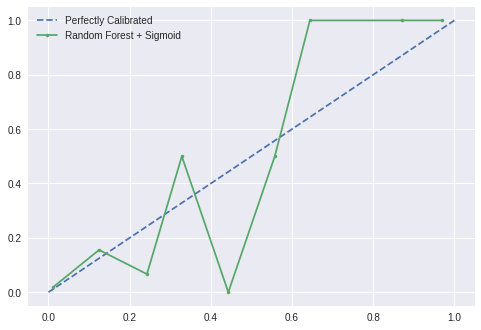

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[2]], d2_justifn_rf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Random Forest + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_d1_justifnrf, 'calib_d1_justifnrf.sav')

['calib_d1_justifnrf.sav']

In [ ]:
from google.colab import files
files.download('calib_d1_justifnrf.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import hyperopt as hp

#### Class 1 Classifier 3 - XGBoost w/ Hyperopt and Calibration

In [ ]:
xgb = XGBClassifier(n_thread=-1)

In [ ]:
from hyperopt import hp, fmin, tpe

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_d1_k2,y_d1_k2[cols[2]])
    y_pred = model.predict_proba(train_d2)
    score=roc_auc_score(y_d2[cols[2]],y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
         'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 6, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 0.05, 'eta': 0.5, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.5, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 12, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 99, 'subsample': 0.05}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'scale_pos_weight': 1000, 'subsample': 0.05}
{'colsample_bytree': 0.05, '

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9],
         'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
xgb_d1_best = get_params_space(best)
print(xgb_d1_best)

{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 50, 'subsample': 1}


In [ ]:
calib_d1xgb_justifn= CalibratedClassifierCV(XGBClassifier(**xgb_d1_best, n_thread=-1), method='sigmoid', cv=3)
calib_d1xgb_justifn.fit(train_d1_k2, y_d1_k2[cols[2]])

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1,
                                                    eta=0.025, gamma=1,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=8,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='binary:

In [ ]:
d2_justifn_xgb = calib_d1xgb_justifn.predict_proba(train_d2)

In [ ]:
d2_justifnxgb_roc = roc_auc_score(y_d2[cols[2]], d2_justifn_xgb[:,1], average='micro')
d2_justifnxgb_f1 = f1_score(y_d2[cols[2]], np.round(d2_justifn_xgb[:,1]), average='micro')
d2_justifnxgb_hamm = hamming_loss(y_d2[cols[2]], np.round(d2_justifn_xgb[:,1]))
d2_justifnxgb_brier = brier_score_loss(y_d2[cols[2]], d2_justifn_xgb[:,1])

print(f'\nROC d2 Justification: {d2_justifnxgb_roc}')
print(f'\nF1 d2 Justification: {d2_justifnxgb_f1}')
print(f'\nHamming Loss d2 Justification: {d2_justifnxgb_hamm}')
print(f'\nBrier Loss d2 Justification: {d2_justifnxgb_brier}')


ROC d2 Justification: 0.8109842539834181

F1 d2 Justification: 0.9802058590657166

Hamming Loss d2 Justification: 0.01979414093428345

Brier Loss d2 Justification: 0.018852791870689205


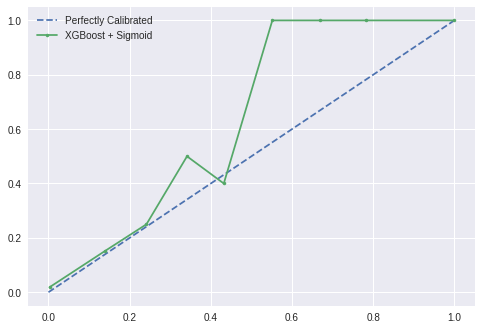

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[2]], d2_justifn_xgb[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','XGBoost + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_d1xgb_justifn, 'calib_d1xgb_justifn.sav')
files.download('calib_d1xgb_justifn.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from catboost.utils import eval_metric

#### Class 3 - Classifier 4 - CatBoost with Hyperopt and Calibration

In [ ]:
cols = y_train_multi.columns
train_pool = catboost.Pool(train_d1_k3, y_d1_k3[cols[2]])

In [ ]:
# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin

def hyperopt_objective(params):
    print(params)
    model = catboost.CatBoostClassifier(**params, task_type='GPU')
    model.fit(train_pool)
    y_pred = model.predict_proba(train_d2)
    return -eval_metric(y_d2[cols[2]], y_pred[:, 1], 'AUC')[0]

space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'depth': hp.choice('depth', [3, 10]),
    'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'boosting_type': hp.choice('boosting_type', ['Ordered', 'Plain']),
    'max_ctr_complexity': hp.choice('max_ctr_complexity', [0, 8])}

best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=5,
    rstate=np.random.RandomState(seed=123))

Streaming output truncated to the last 5000 lines.
5:	learn: 0.6371381	total: 97.6ms	remaining: 16.2s
6:	learn: 0.6310101	total: 113ms	remaining: 16s
7:	learn: 0.6225501	total: 128ms	remaining: 15.9s
8:	learn: 0.6155337	total: 144ms	remaining: 15.8s
9:	learn: 0.6108983	total: 159ms	remaining: 15.8s
10:	learn: 0.6058702	total: 174ms	remaining: 15.7s
11:	learn: 0.5981957	total: 190ms	remaining: 15.6s
12:	learn: 0.5924303	total: 205ms	remaining: 15.6s
13:	learn: 0.5845073	total: 223ms	remaining: 15.7s
14:	learn: 0.5792385	total: 238ms	remaining: 15.7s
15:	learn: 0.5761216	total: 254ms	remaining: 15.6s
16:	learn: 0.5729484	total: 270ms	remaining: 15.6s
17:	learn: 0.5683254	total: 285ms	remaining: 15.5s
18:	learn: 0.5608552	total: 300ms	remaining: 15.5s
19:	learn: 0.5550834	total: 315ms	remaining: 15.4s
20:	learn: 0.5498691	total: 330ms	remaining: 15.4s
21:	learn: 0.5475328	total: 346ms	remaining: 15.4s
22:	learn: 0.5449064	total: 361ms	remaining: 15.3s
23:	learn: 0.5417845	total: 377ms	rem

In [ ]:
def get_space(space_params):
  space = {
    'learning_rate': [0.01, 0.1],
    'depth': [3, 10],
    'l2_leaf_reg': [1, 10],
    'boosting_type': ['Ordered', 'Plain'],
    'max_ctr_complexity':  [0, 8],
    'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]
    }

  param_dict = dict()
  for key in space_params.keys():
    if isinstance(space_params.get(key), float):
      param_dict[key] = space_params.get(key)
    else:
      get_list = space_params.get(key)
      param_dict[key] = space.get(key)[get_list]
  return param_dict

In [ ]:
cat_d1_best = get_space(best)
print(cat_d1_best)

{'boosting_type': 'Plain', 'depth': 10, 'l2_leaf_reg': 8.527981223754098, 'learning_rate': 0.07867792270156927, 'max_ctr_complexity': 0, 'scale_pos_weight': 1000}


In [ ]:
calib_catd1_justifn = CalibratedClassifierCV(catboost.CatBoostClassifier(**cat_d1_best), method='sigmoid', cv=3)
calib_catd1_justifn.fit(train_d1_k3, y_d1_k3[cols[2]])

In [ ]:
calib_catd1_justifn.base_estimator.get_params(deep=True)

{'boosting_type': 'Plain',
 'depth': 10,
 'l2_leaf_reg': 8.527981223754098,
 'learning_rate': 0.07867792270156927,
 'max_ctr_complexity': 0,
 'scale_pos_weight': 1000}

In [ ]:
d2_justifn_cat = calib_catd1_justifn.predict_proba(train_d2)

In [ ]:
d2_justifncat_roc = roc_auc_score(y_d2[cols[2]], d2_justifn_cat[:,1], average='micro')
d2_justifncat_f1 = f1_score(y_d2[cols[2]], np.round(d2_justifn_cat[:,1]), average='micro')
d2_justifncat_hamm = hamming_loss(y_d2[cols[2]], np.round(d2_justifn_cat[:,1]))
d2_justifncat_brier = brier_score_loss(y_d2[cols[2]], d2_justifn_cat[:,1])

print(f'\nROC d2 Justification: {d2_justifncat_roc}')
print(f'\nF1 d2 Justification: {d2_justifncat_f1}')
print(f'\nHamming Loss d2 Justification: {d2_justifncat_hamm}')
print(f'\nBrier Loss d2 Justification: {d2_justifncat_brier}')


ROC d2 Justification: 0.7378100583438534

F1 d2 Justification: 0.9791501715492215

Hamming Loss d2 Justification: 0.020849828450778568

Brier Loss d2 Justification: 0.01989825308527348


In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[2]], d2_justifn_cat[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','CatBoost + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_catd1_justifn,'calib_catd1_justifn.sav')
files.download('calib_catd1_justifn.sav')

#### Class 1 - Classsifier 5 - SGD with Random Search and Calibration on Gratitude Class

In [ ]:
sgd = SGDClassifier()

sgd_params = {'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
              'penalty': ['l2', 'l1', 'elasticnet'],
              'learning_rate': ['adaptive', 'optimal', 'invscaling', 'constant'],
              'early_stopping':[True, False],
              'validation_fraction':[0.4,0.3,0.2,0.1],
              'eta0' : [random.uniform(0,1)],
              }
sgd_random = RandomizedSearchCV(sgd, param_distributions=sgd_params, n_iter=50, scoring='accuracy',random_state=42, refit=True,cv=5,n_jobs=-1)
sgd_random.fit(train_d1_k4, y_d1_k4[cols[2]])

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SGDClassifier(alpha=0.0001, average=False,
                                           class_weight=None,
                                           early_stopping=False, epsilon=0.1,
                                           eta0=0.0, fit_intercept=True,
                                           l1_ratio=0.15,
                                           learning_rate='optimal',
                                           loss='hinge', max_iter=1000,
                                           n_iter_no_change=5, n_jobs=None,
                                           penalty='l2', power_t=0.5,
                                           random_state=None, shuffle=True,
                                           tol=0.001, validation_fractio...
                   param_distributions={'early_stopping': [True, False],
                                        'eta0': [0.489975450090562],
                                   

In [ ]:
sgd_random.best_params_

{'early_stopping': True,
 'eta0': 0.489975450090562,
 'learning_rate': 'optimal',
 'loss': 'log',
 'penalty': 'l2',
 'validation_fraction': 0.3}

In [ ]:
sgd_random.best_score_

0.9792821999878087

In [ ]:
calib_sgdd1_justifn = CalibratedClassifierCV(SGDClassifier(**sgd_random.best_params_, random_state=42), method='sigmoid', cv=3)
calib_sgdd1_justifn.fit(train_d1_k4, y_d1_k4[cols[2]])

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=0.0001, average=False,
                                                    class_weight=None,
                                                    early_stopping=True,
                                                    epsilon=0.1,
                                                    eta0=0.489975450090562,
                                                    fit_intercept=True,
                                                    l1_ratio=0.15,
                                                    learning_rate='optimal',
                                                    loss='log', max_iter=1000,
                                                    n_iter_no_change=5,
                                                    n_jobs=None, penalty='l2',
                                                    power_t=0.5,
                                                    random_state=42,
                                                    sh

In [ ]:
d2_justifn_sgd = calib_sgdd1_justifn.predict_proba(train_d2)

In [ ]:
d2_justifn_roc = roc_auc_score(y_d2[cols[2]], d2_justifn_sgd[:,1], average='micro')
d2_justifn_f1 = f1_score(y_d2[cols[2]], np.round(d2_justifn_sgd[:,1]), average='micro')
d2_justifn_hamm = hamming_loss(y_d2[cols[2]], np.round(d2_justifn_sgd[:,1]))
d2_justifn_brier = brier_score_loss(y_d2[cols[2]], d2_justifn_sgd[:,1])

print(f'\nROC d2 Justification: {d2_justifn_roc}')
print(f'\nF1 d2 Justification: {d2_justifn_f1}')
print(f'\nHamming Loss d2 Justification: {d2_justifn_hamm}')
print(f'\nBrier Loss d2 Justification: {d2_justifn_brier}')


ROC d2 Justification: 0.5281449384148214

F1 d2 Justification: 0.9791501715492215

Hamming Loss d2 Justification: 0.020849828450778568

Brier Loss d2 Justification: 0.020411850214121532


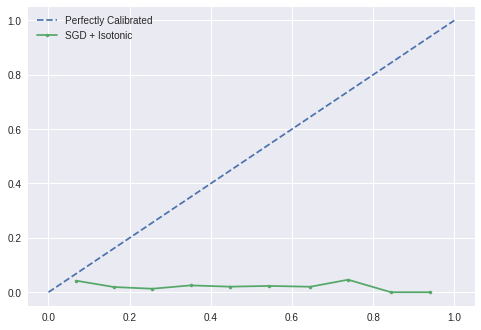

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[2]], d2_justifn_sgd[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SGD + Isotonic'])
plt.show()

In [ ]:
joblib.dump(calib_sgdd1_justifn, 'calib_sgdd1_justifn.sav')
files.download('calib_sgdd1_justifn.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 3 - Classifier 6 - SVM with RBF kernel with RandomSearch and Calibration

In [ ]:
svm = SVC(kernel='rbf', class_weight='balanced')

In [ ]:


svm_params = {'C': [1e-5,1e-4,1e-3,1e-2,1e-1,0,1,10,100,1000],
              'degree':[i for i in range(1,5)],
              'probability':[True, False],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1],
              }
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, n_iter=10, scoring='roc_auc',refit=True,cv=5,n_jobs=-1)
svm_random.fit(train_d1_k5, y_d1_k5[cols[2]])

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight='balanced', coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [1e-05, 0.0001, 0.001, 0.01, 0.1,
                                              0, 1, 10, 100, 1000],
                                        'degree': [1, 2, 3, 4],
                                        'probability': [True, False],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispatch='2*

In [ ]:
svm_random.best_params_

{'C': 1000,
 'degree': 3,
 'probability': False,
 'shrinking': False,
 'tol': 0.0001}

In [ ]:
svm_random.best_score_

0.6042194557741575

In [ ]:
cols = y_train_multi.columns

In [ ]:
calib_svmrbf_d1_justifn = CalibratedClassifierCV(SVC(**svm_random.best_params_), method='sigmoid', cv=3)
calib_svmrbf_d1_justifn.fit(train_d1_k5, y_d1_k5[cols[2]])

CalibratedClassifierCV(base_estimator=SVC(C=1000, break_ties=False,
                                          cache_size=200, class_weight=None,
                                          coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=3, gamma='scale', kernel='rbf',
                                          max_iter=-1, probability=False,
                                          random_state=None, shrinking=False,
                                          tol=0.0001, verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_justifn_svmrbf = calib_svmrbf_d1_justifn.predict_proba(train_d2)

In [ ]:
d2_justifn_svmrbf_roc = roc_auc_score(y_d2[cols[2]], d2_justifn_svmrbf[:,1], average='micro')
d2_justifn_svmrbf_f1 = f1_score(y_d2[cols[2]], np.round(d2_justifn_svmrbf[:,1]), average='micro')
d2_justifn_svmrbf_hamm = hamming_loss(y_d2[cols[2]], np.round(d2_justifn_svmrbf[:,1]))
d2_justifn_svmrbf_brier = brier_score_loss(y_d2[cols[2]], d2_justifn_svmrbf[:,1])

print(f'\nROC d2 Justification: {d2_justifn_svmrbf_roc}')
print(f'\nF1 d2 Justification: {d2_justifn_svmrbf_f1}')
print(f'\nHamming Loss d2 Justification: {d2_justifn_svmrbf_hamm}')
print(f'\nBrier Loss d2 Justification: {d2_justifn_svmrbf_brier}')


ROC d2 Justification: 0.6187911563001125

F1 d2 Justification: 0.9791501715492215

Hamming Loss d2 Justification: 0.020849828450778568

Brier Loss d2 Justification: 0.020106010147136855


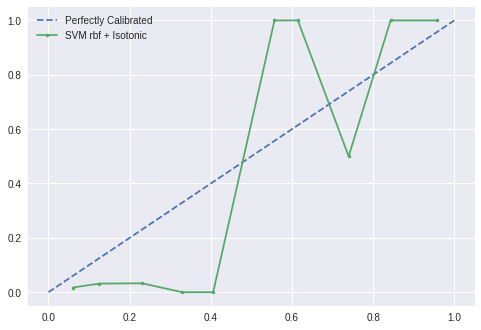

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[2]], d2_justifn_svmrbf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM rbf + Isotonic'])
plt.show()

In [ ]:
joblib.dump(calib_svmrbf_d1_justifn, 'calib_svmrbf_d1_justifn.sav')
files.download('calib_svmrbf_d1_justifn.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Class 3 - Classifier 7 - SVM with randomsearch and calibration 

In [ ]:
svm = SVC()

In [ ]:
svm_params = {'kernel': ['poly','sigmoid', 'linear'],
              'C': [1e-5,1e-4,1e-3,1e-2,1e-1,0,1,10,100,1000],
              'degree':[i for i in range(1,5)],
              'probability':[True],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1]}
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, verbose=2, random_state=42, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k6, y_d1_k6[cols[2]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed: 42.1min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight=None, coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [1e-05, 0.0001, 0.001, 0.01, 0.1,
                                              0, 1, 10, 100, 1000],
                                        'degree': [1, 2, 3, 4],
                                        'kernel': ['poly', 'sigmoid', 'linear'],
                                        'probability': [True],
                                        'shrinking': [True, False],
                                        'to

In [ ]:
svm_random.best_params_

{'C': 1000,
 'degree': 2,
 'kernel': 'poly',
 'probability': True,
 'shrinking': False,
 'tol': 0.001}

In [ ]:
calib_svm_d1_justifn = CalibratedClassifierCV(SVC(**svm_random.best_params_), method='sigmoid', cv=3)
calib_svm_d1_justifn.fit(train_d1_k6, y_d1_k6[cols[2]])

CalibratedClassifierCV(base_estimator=SVC(C=1000, break_ties=False,
                                          cache_size=200, class_weight=None,
                                          coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=2, gamma='scale',
                                          kernel='poly', max_iter=-1,
                                          probability=True, random_state=None,
                                          shrinking=False, tol=0.001,
                                          verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_svm_justifn = calib_svm_d1_justifn.predict_proba(train_d2)

In [ ]:
d2_svmjustifn_roc = roc_auc_score(y_d2[cols[1]], d2_svm_justifn[:,1], average='micro')
d2_svmjustifn_f1 = f1_score(y_d2[cols[1]], np.round(d2_svm_justifn[:,1]), average='micro')
d2_svmjustifn_hamm = hamming_loss(y_d2[cols[1]], np.round(d2_svm_justifn[:,1]))
d2_svmjustifn_brier = brier_score_loss(y_d2[cols[1]], d2_svm_justifn[:,1])

print(f'\nROC d2 Justification: {d2_svmjustifn_roc}')
print(f'\nF1 d2 Justification: {d2_svmjustifn_f1}')
print(f'\nHamming Loss d2 Justification: {d2_svmjustifn_hamm}')
print(f'\nBrier Loss d2 Justification: {d2_svmjustifn_brier}')


ROC d2 Justification: 0.5553134439129557

F1 d2 Justification: 0.45750857746107154

Hamming Loss d2 Justification: 0.5424914225389285

Brier Loss d2 Justification: 0.5198079829547839


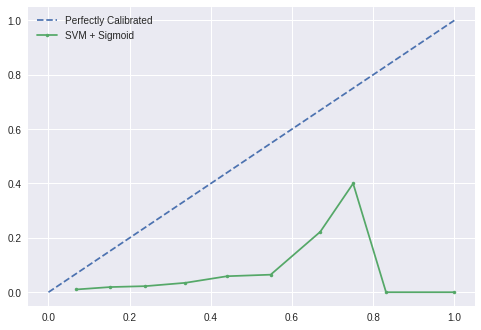

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[2]], d2_svm_justifn[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_svm_d1_justifn, 'calib_svm_d1_justifn.sav')
files.download('calib_svm_d1_justifn.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
d2justifn_cat = calib_catd1_justifn.predict_proba(train_d2)[:,1]
d2justifn_rf = calib_d1_justifnrf.predict_proba(train_d2)[:,1]
d2justifn_xgb = calib_d1xgb_justifn.predict_proba(train_d2)[:,1]
d2justifn_dtc = calib_dtc_justifn.predict_proba(train_d2)[:,1]
d2justifn_sgd = calib_sgdd1_justifn.predict_proba(train_d2)[:,1]
d2justifn_svm = calib_svm_d1_justifn.predict_proba(train_d2)[:,1]
d2justifn_svmrbf = calib_svmrbf_d1_justifn.predict_proba(train_d2)[:,1]

In [ ]:
d2justifn_meta = np.hstack((d2justifn_cat.reshape(-1,1), d2justifn_rf.reshape(-1,1), d2justifn_xgb.reshape(-1,1), d2justifn_dtc.reshape(-1,1),
                         d2justifn_sgd.reshape(-1,1), d2justifn_svm.reshape(-1,1), d2justifn_svmrbf.reshape(-1,1)))

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from scipy.stats import loguniform

meta_model3 = LogisticRegression()
# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)
# define search
search = RandomizedSearchCV(meta_model3, space,verbose=2, n_iter=50, refit=True, scoring='roc_auc', n_jobs=-1, cv=cv, random_state=42)
# execute search
result = search.fit(d2justifn_meta, y_d2[cols[2]])
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Fitting 30 folds for each of 50 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:    1.3s


Best Score: 0.8113581910751722
Best Hyperparameters: {'C': 0.13774775007214832, 'penalty': 'l1', 'solver': 'liblinear'}


[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed:    9.5s finished


In [ ]:
calib_meta2_lrjustifn = CalibratedClassifierCV(LogisticRegression(**search.best_params_), method='sigmoid', cv=10)
calib_meta2_lrjustifn.fit(d2justifn_meta, y_d2[cols[2]])

CalibratedClassifierCV(base_estimator=LogisticRegression(C=0.13774775007214832,
                                                         class_weight=None,
                                                         dual=False,
                                                         fit_intercept=True,
                                                         intercept_scaling=1,
                                                         l1_ratio=None,
                                                         max_iter=100,
                                                         multi_class='auto',
                                                         n_jobs=None,
                                                         penalty='l1',
                                                         random_state=None,
                                                         solver='liblinear',
                                                         tol=0.0001, verbose=0,
                          

In [ ]:
d2_meta_justifn = calib_meta2_lrjustifn.predict_proba(d2justifn_meta)

In [ ]:
d2justifn_meta_roc = roc_auc_score(y_d2[cols[2]], d2_meta_justifn[:,1], average='micro')
d2justifn_meta_f1 = f1_score(y_d2[cols[2]], np.round(d2_meta_justifn[:,1]), average='micro')
d2justifn_meta_hamm = hamming_loss(y_d2[cols[2]], np.round(d2_meta_justifn[:,1]))
d2justifn_meta_brier = brier_score_loss(y_d2[cols[2]], d2_meta_justifn[:,1])

print(f'\nROC d2 Justification: {d2justifn_meta_roc}')
print(f'\nF1 d2 Justification: {d2justifn_meta_f1}')
print(f'\nHamming Loss d2 Justification: {d2justifn_meta_hamm}')
print(f'\nBrier Loss d2 Justification: {d2justifn_meta_brier}')


ROC d2 Justification: 0.8118154832986455

F1 d2 Justification: 0.9809976247030879

Hamming Loss d2 Justification: 0.019002375296912115

Brier Loss d2 Justification: 0.01817171812002864


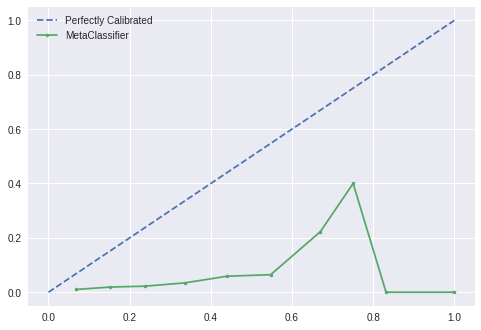

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fraction_of_positives, mean_predicted_values = calibration_curve(y_d2[cols[2]], d2_meta_justifn[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','MetaClassifier'])
plt.show()

In [ ]:
joblib.dump(calib_meta2_lrjustifn, 'calib_meta2_lrjustifn.sav')
files.download('calib_meta2_lrjustifn.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Rant - Stacking Classifier


#### Class 4, Classifier 1 - Decision Tree w/ RandomizedSearch, Pruning and Calibration on Justification Class

In [ ]:
print(f'Greeting Class samples: {np.count_nonzero(y_d1_k0[cols[0]].values==1)}')
print(f'Backstory Class samples: {np.count_nonzero(y_d1_k0[cols[1]].values==1)}')
print(f'Justification Class samples: {np.count_nonzero(y_d1_k0[cols[2]].values==1)}')
print(f'Rant Class samples: {np.count_nonzero(y_d1_k0[cols[3]].values==1)}')
print(f'Gratitude Class samples: {np.count_nonzero(y_d1_k0[cols[4]].values==1)}')
print(f'Other Class samples: {np.count_nonzero(y_d1_k0[cols[5]].values==1)}')
print(f'Express Emotion Class samples: {np.count_nonzero(y_d1_k0[cols[6]].values==1)}')

Greeting Class samples: 1528
Backstory Class samples: 4115
Justification Class samples: 157
Rant Class samples: 521
Gratitude Class samples: 1069
Other Class samples: 3050
Express Emotion Class samples: 231


In [ ]:
cols = y_train_multi.columns

In [ ]:
dtc = DecisionTreeClassifier()

random_grid = {'splitter': ['best', 'random'],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'criterion': ['gini', 'entropy']
               }

dtc_random = RandomizedSearchCV(estimator = dtc, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 50, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
dtc_random.fit(train_d1_k0, y_d1_k0[cols[3]])

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    3.6s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
          

In [ ]:
dtc_random.best_params_

{'criterion': 'gini',
 'max_features': 'auto',
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'splitter': 'best'}

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

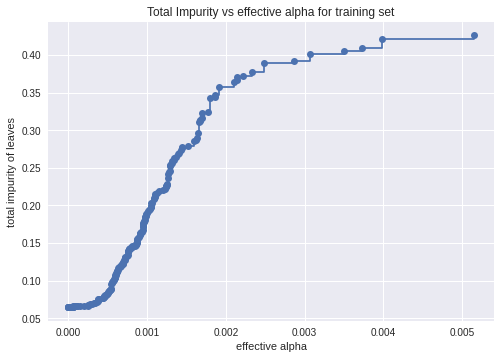

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_, class_weight='balanced')
path =dtc_.cost_complexity_pruning_path(train_d1_k0, y_d1_k0[cols[3]])
ccp_alphas, impurities = path.ccp_alphas, path.impurities
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(**dtc_random.best_params_,class_weight='balanced', ccp_alpha=ccp_alpha)
    clf.fit(train_d1_k0, y_d1_k0[cols[3]])
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.07385309370834436


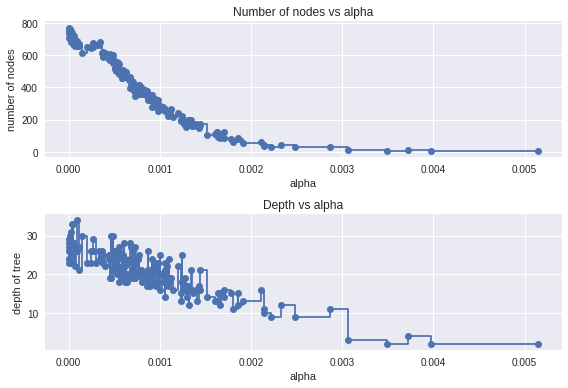

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()


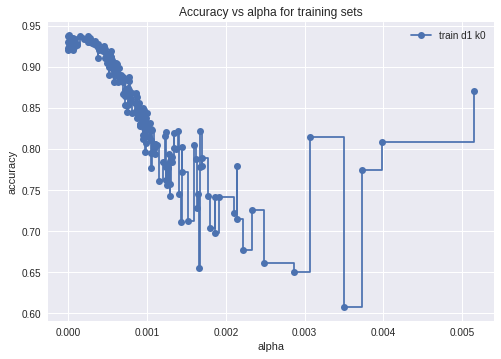

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
train_scores = [clf.score(train_d1_k0, y_d1_k0[cols[3]]) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train d1 k0",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
ccp_alphas[np.argmax(train_scores)]

1.4910124593976769e-05

In [ ]:
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_, class_weight='balanced',ccp_alpha=ccp_alphas[np.argmax(train_scores)])
calib_dtc_rant = CalibratedClassifierCV(dtc_, method='sigmoid', cv=20)
calib_dtc_rant.fit(train_d1_k0, y_d1_k0[cols[3]])

CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(ccp_alpha=1.4910124593976769e-05,
                                                             class_weight='balanced',
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=10,
                                                             min_weight_fraction_leaf=0.0,
                                                             presort='

In [ ]:
d2_rant_dtc = calib_dtc_rant.predict_proba(train_d2)

In [ ]:
d2_rant_roc = roc_auc_score(y_d2[cols[3]], d2_rant_dtc[:,1], average='micro')
d2_rant_f1 = f1_score(y_d2[cols[3]], np.round(d2_rant_dtc[:,1]), average='micro')
d2_rant_hamm = hamming_loss(y_d2[cols[3]], np.round(d2_rant_dtc[:,1]))
d2_rant_brier = brier_score_loss(y_d2[cols[3]], d2_rant_dtc[:,1])

print(f'\nROC d2 Rant: {d2_rant_roc}')
print(f'\nF1 d2 Rant: {d2_rant_f1}')
print(f'\nHamming Loss d2 Rant: {d2_rant_hamm}')
print(f'\nBrier Loss d2 Rant: {d2_rant_brier}')


ROC d2 Rant: 0.8044497413791936

F1 d2 Rant: 0.9309844286091317

Hamming Loss d2 Rant: 0.06901557139086831

Brier Loss d2 Rant: 0.059276471845409504


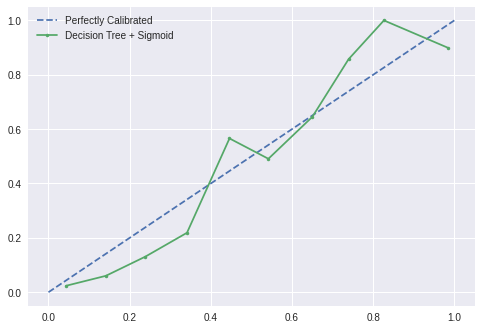

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[3]], d2_rant_dtc[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Decision Tree + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_dtc_rant, 'calib_dtc_rant.sav')

['calib_dtc_rant.sav']

In [ ]:
from google.colab import files
files.download('calib_dtc_rant.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 4 Classifier 2 - Random Forest with Random Search and Calibration on Backstory

In [ ]:
rf = RandomForestClassifier(n_jobs=-1, class_weight='balanced')

In [ ]:
random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230],
               'criterion': ['gini', 'entropy']}

rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 10, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(train_d1_k1, y_d1_k1[cols[3]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   57.9s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight='balanced',
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
         

In [ ]:
rf_random.best_params_

{'bootstrap': False,
 'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'n_estimators': 180}

In [ ]:
rf_ = RandomForestClassifier(**rf_random.best_params_,class_weight='balanced', n_jobs=-1)
calib_d1_rantrf = CalibratedClassifierCV(rf_, method='sigmoid', cv=3)
calib_d1_rantrf.fit(train_d1_k1, y_d1_k1[cols[3]])

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight='balanced',
                                                             criterion='gini',
                                                             max_depth=20,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=10,
                         

In [ ]:
d2_rant_rf = calib_d1_rantrf.predict_proba(train_d2)

In [ ]:
d2_rantrf_roc = roc_auc_score(y_d2[cols[3]], d2_rant_rf[:,1], average='micro')
d2_rantrf_f1 = f1_score(y_d2[cols[3]], np.round(d2_rant_rf[:,1]), average='micro')
d2_rantrf_hamm = hamming_loss(y_d2[cols[3]], np.round(d2_rant_rf[:,1]))
d2_rantrf_brier = brier_score_loss(y_d2[cols[3]], d2_rant_rf[:,1])

print(f'\nROC d2 Rant: {d2_rantrf_roc}')
print(f'\nF1 d2 Rant: {d2_rantrf_f1}')
print(f'\nHamming Loss d2 Rant: {d2_rantrf_hamm}')
print(f'\nBrier Loss d2 Rant: {d2_rantrf_brier}')


ROC d2 Rant: 0.837007234878102

F1 d2 Rant: 0.942596991290578

Hamming Loss d2 Rant: 0.05740300870942201

Brier Loss d2 Rant: 0.04914180787950261


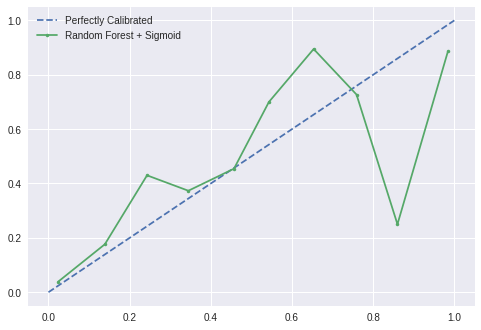

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[3]], d2_rant_rf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Random Forest + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_d1_rantrf, 'calib_d1_rantrf.sav')

['calib_d1_rantrf.sav']

In [ ]:
from google.colab import files
files.download('calib_d1_rantrf.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import hyperopt as hp

#### Class 4 Classifier 3 - XGBoost w/ Hyperopt and Calibration

In [ ]:
xgb = XGBClassifier(n_thread=-1)

In [ ]:
from hyperopt import hp, fmin, tpe

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_d1_k2,y_d1_k2[cols[3]])
    y_pred = model.predict_proba(train_d2)
    score=roc_auc_score(y_d2[cols[3]],y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
         'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 6, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 0.05, 'eta': 0.5, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.5, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 12, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 99, 'subsample': 0.05}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'scale_pos_weight': 1000, 'subsample': 0.05}
{'colsample_bytree': 0.05, '

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9],
         'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
xgb_d1_best = get_params_space(best)
print(xgb_d1_best)

{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 50, 'subsample': 1}


In [ ]:
calib_d1xgb_rant= CalibratedClassifierCV(XGBClassifier(**xgb_d1_best, n_thread=-1), method='sigmoid', cv=3)
calib_d1xgb_rant.fit(train_d1_k2, y_d1_k2[cols[3]])

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1,
                                                    eta=0.025, gamma=1,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=8,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='binary:

In [ ]:
d2_rant_xgb = calib_d1xgb_rant.predict_proba(train_d2)

In [ ]:
d2_rantxgb_roc = roc_auc_score(y_d2[cols[3]], d2_rant_xgb[:,1], average='micro')
d2_rantxgb_f1 = f1_score(y_d2[cols[3]], np.round(d2_rant_xgb[:,1]), average='micro')
d2_rantxgb_hamm = hamming_loss(y_d2[cols[3]], np.round(d2_rant_xgb[:,1]))
d2_rantxgb_brier = brier_score_loss(y_d2[cols[3]], d2_rant_xgb[:,1])

print(f'\nROC d2 Rant: {d2_rantxgb_roc}')
print(f'\nF1 d2 Rant: {d2_rantxgb_f1}')
print(f'\nHamming Loss d2 Rant: {d2_rantxgb_hamm}')
print(f'\nBrier Loss d2 Rant: {d2_rantxgb_brier}')


ROC d2 Rant: 0.8464292441388543

F1 d2 Rant: 0.9443124835048825

Hamming Loss d2 Rant: 0.055687516495117446

Brier Loss d2 Rant: 0.046899274345981096


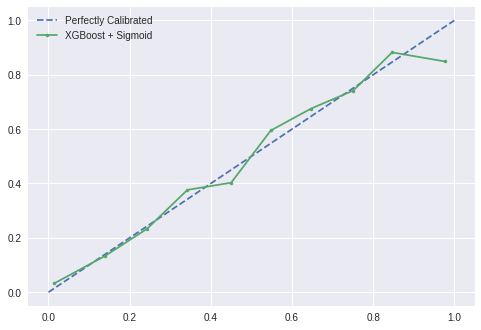

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[3]], d2_rant_xgb[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','XGBoost + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_d1xgb_rant, 'calib_d1xgb_rant.sav')
files.download('calib_d1xgb_rant.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from catboost.utils import eval_metric

#### Class 4 - Classifier 4 - CatBoost with Hyperopt and Calibration

In [ ]:
train_pool = catboost.Pool(train_d1_k3, y_d1_k3[cols[3]])

In [ ]:
# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin

def hyperopt_objective(params):
    print(params)
    model = catboost.CatBoostClassifier(**params, task_type='CPU')
    model.fit(train_pool)
    y_pred = model.predict_proba(train_d2)
    return -eval_metric(y_d2[cols[3]], y_pred[:, 1], 'AUC')[0]

space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'depth': hp.choice('depth', [3, 10]),
    'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'boosting_type': hp.choice('boosting_type', ['Ordered', 'Plain']),
    'max_ctr_complexity': hp.choice('max_ctr_complexity', [0, 8])}

best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=5,
    rstate=np.random.RandomState(seed=123))

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 3.134356934526143, 'learning_rate': 0.06313971035362703, 'max_ctr_complexity': 0, 'scale_pos_weight': 75}
  0%|          | 0/5 [00:00<?, ?it/s, best loss: ?]0:	learn: 0.6458708	total: 17.1ms	remaining: 17.1s
1:	learn: 0.6038180	total: 33.7ms	remaining: 16.8s
2:	learn: 0.5680321	total: 53.1ms	remaining: 17.7s


Custom logger is already specified. Specify more than one logger at same time is not thread safe.

Streaming output truncated to the last 5000 lines.
5:	learn: 0.4893511	total: 105ms	remaining: 17.4s
6:	learn: 0.4698146	total: 121ms	remaining: 17.2s
7:	learn: 0.4533010	total: 139ms	remaining: 17.2s
8:	learn: 0.4383548	total: 158ms	remaining: 17.4s
9:	learn: 0.4286336	total: 175ms	remaining: 17.3s
10:	learn: 0.4179549	total: 192ms	remaining: 17.3s
11:	learn: 0.4090802	total: 209ms	remaining: 17.2s
12:	learn: 0.4024084	total: 228ms	remaining: 17.3s
13:	learn: 0.3960607	total: 245ms	remaining: 17.2s
14:	learn: 0.3892334	total: 263ms	remaining: 17.3s
15:	learn: 0.3828054	total: 281ms	remaining: 17.3s
16:	learn: 0.3746427	total: 298ms	remaining: 17.2s
17:	learn: 0.3713163	total: 318ms	remaining: 17.3s
18:	learn: 0.3678329	total: 337ms	remaining: 17.4s
19:	learn: 0.3635550	total: 353ms	remaining: 17.3s
20:	learn: 0.3600336	total: 369ms	remaining: 17.2s
21:	learn: 0.3558449	total: 386ms	remaining: 17.2s
22:	learn: 0.3534761	total: 407ms	remaining: 17.3s
23:	learn: 0.3515480	total: 426ms	re

In [ ]:
def get_space(space_params):
  space = {
    'learning_rate': [0.01, 0.1],
    'depth': [3, 10],
    'l2_leaf_reg': [1, 10],
    'boosting_type': ['Ordered', 'Plain'],
    'max_ctr_complexity':  [0, 8],
    'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]
    }

  param_dict = dict()
  for key in space_params.keys():
    if isinstance(space_params.get(key), float):
      param_dict[key] = space_params.get(key)
    else:
      get_list = space_params.get(key)
      param_dict[key] = space.get(key)[get_list]
  return param_dict

In [ ]:
cat_d1_best = get_space(best)
print(cat_d1_best)

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 1.7872262817346178, 'learning_rate': 0.04308614773826791, 'max_ctr_complexity': 0, 'scale_pos_weight': 1}


In [ ]:
calib_catd1_rant = CalibratedClassifierCV(catboost.CatBoostClassifier(**cat_d1_best, task_type="CPU"), method='sigmoid', cv=5)
calib_catd1_rant.fit(train_d1_k3, y_d1_k3[cols[3]])

Streaming output truncated to the last 5000 lines.
0:	learn: 0.6387629	total: 16.4ms	remaining: 16.4s
1:	learn: 0.5906740	total: 30.5ms	remaining: 15.2s
2:	learn: 0.5490115	total: 46.6ms	remaining: 15.5s
3:	learn: 0.5119512	total: 61.5ms	remaining: 15.3s
4:	learn: 0.4782598	total: 76ms	remaining: 15.1s
5:	learn: 0.4486199	total: 90.4ms	remaining: 15s
6:	learn: 0.4230502	total: 105ms	remaining: 14.9s
7:	learn: 0.4007351	total: 119ms	remaining: 14.8s
8:	learn: 0.3809508	total: 133ms	remaining: 14.7s
9:	learn: 0.3621772	total: 147ms	remaining: 14.6s
10:	learn: 0.3467434	total: 161ms	remaining: 14.5s
11:	learn: 0.3316759	total: 176ms	remaining: 14.5s
12:	learn: 0.3186489	total: 190ms	remaining: 14.5s
13:	learn: 0.3064603	total: 205ms	remaining: 14.4s
14:	learn: 0.2971159	total: 221ms	remaining: 14.5s
15:	learn: 0.2882476	total: 236ms	remaining: 14.5s
16:	learn: 0.2803321	total: 251ms	remaining: 14.5s
17:	learn: 0.2731574	total: 266ms	remaining: 14.5s
18:	learn: 0.2664648	total: 282ms	remai

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7f55e666e490>,
                       cv=5, method='sigmoid')

In [ ]:
calib_catd1_rant.base_estimator.get_params(deep=True)

{'boosting_type': 'Ordered',
 'depth': 3,
 'l2_leaf_reg': 1.7872262817346178,
 'learning_rate': 0.04308614773826791,
 'max_ctr_complexity': 0,
 'scale_pos_weight': 1,
 'task_type': 'GPU'}

In [ ]:
d2_rant_cat = calib_catd1_rant.predict_proba(train_d2)

In [ ]:
d2_rantcat_roc = roc_auc_score(y_d2[cols[3]], d2_rant_cat[:,1], average='micro')
d2_rantcat_f1 = f1_score(y_d2[cols[3]], np.round(d2_rant_cat[:,1]), average='micro')
d2_rantcat_hamm = hamming_loss(y_d2[cols[3]], np.round(d2_rant_cat[:,1]))
d2_rantcat_brier = brier_score_loss(y_d2[cols[3]], d2_rant_cat[:,1])

print(f'\nROC d2 Rant: {d2_rantcat_roc}')
print(f'\nF1 d2 Rant: {d2_rantcat_f1}')
print(f'\nHamming Loss d2 Rant: {d2_rantcat_hamm}')
print(f'\nBrier Loss d2 Rant: {d2_rantcat_brier}')


ROC d2 Rant: 0.804914134097971

F1 d2 Rant: 0.9419371865927686

Hamming Loss d2 Rant: 0.05806281340723146

Brier Loss d2 Rant: 0.051092478757712285


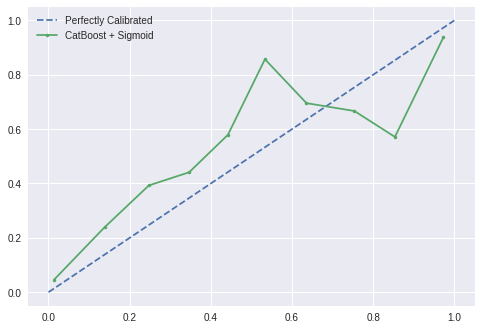

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[3]], d2_rant_cat[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','CatBoost + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_catd1_rant,'calib_catd1_rant.sav')
files.download('calib_catd1_rant.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 4 - Classsifier 5 - SGD with Random Search and Calibration on Gratitude Class

In [ ]:
import random

In [ ]:
sgd = SGDClassifier(random_state=42)

sgd_params = {'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
              'penalty': ['l2', 'l1', 'elasticnet'],
              'learning_rate': ['adaptive', 'optimal', 'invscaling', 'constant'],
              'early_stopping':[True, False],
              'validation_fraction':[0.4,0.3,0.2,0.1],
              'eta0' : [random.uniform(0,1)],
              }
sgd_random = RandomizedSearchCV(sgd, param_distributions=sgd_params, n_iter=50, scoring='accuracy',random_state=42, refit=True,cv=5,n_jobs=-1)
sgd_random.fit(train_d1_k4, y_d1_k4[cols[3]])

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SGDClassifier(alpha=0.0001, average=False,
                                           class_weight=None,
                                           early_stopping=False, epsilon=0.1,
                                           eta0=0.0, fit_intercept=True,
                                           l1_ratio=0.15,
                                           learning_rate='optimal',
                                           loss='hinge', max_iter=1000,
                                           n_iter_no_change=5, n_jobs=None,
                                           penalty='l2', power_t=0.5,
                                           random_state=42, shuffle=True,
                                           tol=0.001, validation_fraction=...
                   param_distributions={'early_stopping': [True, False],
                                        'eta0': [0.16568194220312504],
                                 

In [ ]:
sgd_random.best_params_

{'early_stopping': False,
 'eta0': 0.16568194220312504,
 'learning_rate': 'optimal',
 'loss': 'hinge',
 'penalty': 'l2',
 'validation_fraction': 0.3}

In [ ]:
sgd_random.best_score_

0.9382424654074907

In [ ]:
calib_sgdd1_rant = CalibratedClassifierCV(SGDClassifier(**sgd_random.best_params_,class_weight='balanced', random_state=42), method='sigmoid', cv=10)
calib_sgdd1_rant.fit(train_d1_k4, y_d1_k4[cols[3]])

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=0.0001, average=False,
                                                    class_weight='balanced',
                                                    early_stopping=False,
                                                    epsilon=0.1,
                                                    eta0=0.16568194220312504,
                                                    fit_intercept=True,
                                                    l1_ratio=0.15,
                                                    learning_rate='optimal',
                                                    loss='hinge', max_iter=1000,
                                                    n_iter_no_change=5,
                                                    n_jobs=None, penalty='l2',
                                                    power_t=0.5,
                                                    random_state=42,
                                           

In [ ]:
d2_rant_sgd = calib_sgdd1_rant.predict_proba(train_d2)

In [ ]:
d2_rantsgd_roc = roc_auc_score(y_d2[cols[3]], d2_rant_sgd[:,1], average='micro')
d2_rantsgd_f1 = f1_score(y_d2[cols[3]], np.round(d2_rant_sgd[:,1]), average='micro')
d2_rantsgd_hamm = hamming_loss(y_d2[cols[3]], np.round(d2_rant_sgd[:,1]))
d2_rantsgd_brier = brier_score_loss(y_d2[cols[3]], d2_rant_sgd[:,1])

print(f'\nROC d2 Rant: {d2_rantsgd_roc}')
print(f'\nF1 d2 Rant: {d2_rantsgd_f1}')
print(f'\nHamming Loss d2 Rant: {d2_rantsgd_hamm}')
print(f'\nBrier Loss d2 Rant: {d2_rantsgd_brier}')


ROC d2 Rant: 0.7202689060143398

F1 d2 Rant: 0.9313803114278174

Hamming Loss d2 Rant: 0.06861968857218263

Brier Loss d2 Rant: 0.058635440128001565


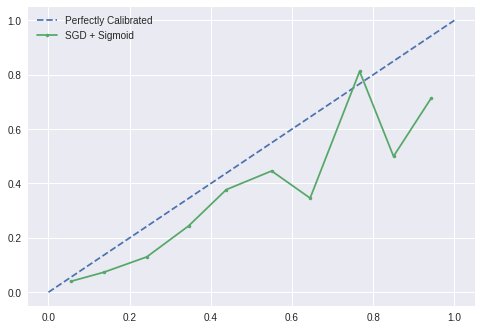

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[3]], d2_rant_sgd[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SGD + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_sgdd1_rant, 'calib_sgdd1_rant.sav')
files.download('calib_sgdd1_rant.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 4 - Classifier 6 - SVM with RBF kernel with RandomSearch and Calibration

In [ ]:
svm = SVC(kernel='rbf', class_weight='balanced')

In [ ]:


svm_params = {'C': [1e-5,1e-4,1e-3,1e-2,1e-1,0,1,10,100,1000],
              'degree':[i for i in range(1,5)],
              'probability':[True, False],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1],
              }
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, n_iter=10, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k5, y_d1_k5[cols[3]])

RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight='balanced', coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [1e-05, 0.0001, 0.001, 0.01, 0.1,
                                              0, 1, 10, 100, 1000],
                                        'degree': [1, 2, 3, 4],
                                        'probability': [True, False],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispatch='2*

In [ ]:
svm_random.best_params_

{'C': 0.1,
 'degree': 1,
 'probability': False,
 'shrinking': False,
 'tol': 0.0001}

In [ ]:
svm_random.best_score_

0.7403338681688769

In [ ]:
cols = y_train_multi.columns

In [ ]:
calib_svmrbf_d1_rant = CalibratedClassifierCV(SVC(**svm_random.best_params_, class_weight='balanced'), method='sigmoid', cv=3)
calib_svmrbf_d1_rant.fit(train_d1_k5, y_d1_k5[cols[3]])

CalibratedClassifierCV(base_estimator=SVC(C=0.1, break_ties=False,
                                          cache_size=200,
                                          class_weight='balanced', coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=1, gamma='scale', kernel='rbf',
                                          max_iter=-1, probability=False,
                                          random_state=None, shrinking=False,
                                          tol=0.0001, verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_rant_svmrbf = calib_svmrbf_d1_rant.predict_proba(train_d2)

In [ ]:
d2_rant_svmrbf_roc = roc_auc_score(y_d2[cols[3]], d2_rant_svmrbf[:,1], average='micro')
d2_rant_svmrbf_f1 = f1_score(y_d2[cols[3]], np.round(d2_rant_svmrbf[:,1]), average='micro')
d2_rant_svmrbf_hamm = hamming_loss(y_d2[cols[3]], np.round(d2_rant_svmrbf[:,1]))
d2_rant_svmrbf_brier = brier_score_loss(y_d2[cols[3]], d2_rant_svmrbf[:,1])

print(f'\nROC d2 Rant: {d2_rant_svmrbf_roc}')
print(f'\nF1 d2 Rant: {d2_rant_svmrbf_f1}')
print(f'\nHamming Loss d2 Rant: {d2_rant_svmrbf_hamm}')
print(f'\nBrier Loss d2 Rant: {d2_rant_svmrbf_brier}')


ROC d2 Rant: 0.746700399618946

F1 d2 Rant: 0.9309844286091317

Hamming Loss d2 Rant: 0.06901557139086831

Brier Loss d2 Rant: 0.05728427116912511


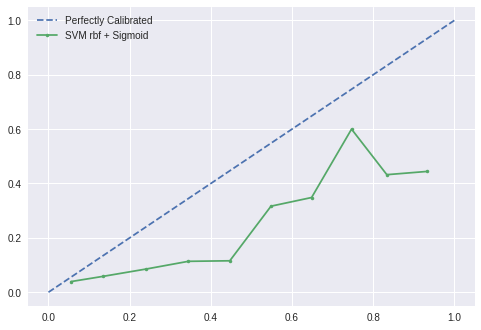

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[3]], d2_rant_svmrbf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM rbf + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_svmrbf_d1_rant, 'calib_svmrbf_d1_rant.sav')
files.download('calib_svmrbf_d1_rant.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Class 4 - Classifier 7 - SVM with randomsearch and calibration 

In [ ]:
svm = SVC(class_weight='balanced', random_state=42)

In [ ]:
svm_params = {'kernel': ['poly','sigmoid', 'linear'],
              'C': [1e-3,1e-2,1e-1,0,1,10,100],
              'degree':[i for i in range(1,3)],
              'probability':[True],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1]}
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, verbose=2, random_state=42, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k6, y_d1_k6[cols[3]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  7.2min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight='balanced', coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=42,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [0.001, 0.01, 0.1, 0, 1, 10, 100],
                                        'degree': [1, 2],
                                        'kernel': ['poly', 'sigmoid', 'linear'],
                                        'probability': [True],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispatch='2*n

In [ ]:
svm_random.best_params_

{'C': 0.01,
 'degree': 2,
 'kernel': 'poly',
 'probability': True,
 'shrinking': True,
 'tol': 0.0001}

In [ ]:
calib_svm_d1_rant = CalibratedClassifierCV(SVC(**svm_random.best_params_, class_weight='balanced'), method='sigmoid', cv=3)
calib_svm_d1_rant.fit(train_d1_k6, y_d1_k6[cols[3]])

CalibratedClassifierCV(base_estimator=SVC(C=0.01, break_ties=False,
                                          cache_size=200,
                                          class_weight='balanced', coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=2, gamma='scale',
                                          kernel='poly', max_iter=-1,
                                          probability=True, random_state=None,
                                          shrinking=True, tol=0.0001,
                                          verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_svm_rant = calib_svm_d1_rant.predict_proba(train_d2)

In [ ]:
d2_svmrant_roc = roc_auc_score(y_d2[cols[3]], d2_svm_rant[:,1], average='micro')
d2_svmrant_f1 = f1_score(y_d2[cols[3]], np.round(d2_svm_rant[:,1]), average='micro')
d2_svmrant_hamm = hamming_loss(y_d2[cols[3]], np.round(d2_svm_rant[:,1]))
d2_svmrant_brier = brier_score_loss(y_d2[cols[3]], d2_svm_rant[:,1])

print(f'\nROC d2 Rant: {d2_svmrant_roc}')
print(f'\nF1 d2 Rant: {d2_svmrant_f1}')
print(f'\nHamming Loss d2 Rant: {d2_svmrant_hamm}')
print(f'\nBrier Loss d2 Rant: {d2_svmrant_brier}')


ROC d2 Rant: 0.7369938193895818

F1 d2 Rant: 0.9309844286091317

Hamming Loss d2 Rant: 0.06901557139086831

Brier Loss d2 Rant: 0.057286432956778585


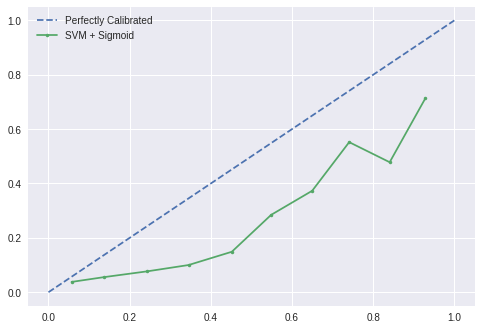

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[3]], d2_svm_rant[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_svm_d1_rant, 'calib_svm_d1_rant.sav')
files.download('calib_svm_d1_rant.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#!gdown --id '1uQRLi6CAD19AHUfyEuJRg0cmwIcKG_A_'
#!unzip 'greet stacked.zip' -d '/content/'

In [ ]:
d2rant_cat = calib_catd1_rant.predict_proba(train_d2)[:,1]
d2rant_rf = calib_d1_rantrf.predict_proba(train_d2)[:,1]
d2rant_xgb = calib_d1xgb_rant.predict_proba(train_d2)[:,1]
d2rant_dtc = calib_dtc_rant.predict_proba(train_d2)[:,1]
d2rant_sgd = calib_sgdd1_rant.predict_proba(train_d2)[:,1]
d2rant_svm = calib_svm_d1_rant.predict_proba(train_d2)[:,1]
d2rant_svmrbf = calib_svmrbf_d1_rant.predict_proba(train_d2)[:,1]

In [ ]:
d2rant_meta = np.hstack((d2rant_cat.reshape(-1,1), d2rant_rf.reshape(-1,1), d2rant_xgb.reshape(-1,1), d2rant_dtc.reshape(-1,1),
                         d2rant_sgd.reshape(-1,1), d2rant_svm.reshape(-1,1), d2rant_svmrbf.reshape(-1,1)))

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from scipy.stats import loguniform

meta_model3 = LogisticRegression(class_weight='balanced')
# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)
# define search
search = RandomizedSearchCV(meta_model3, space,verbose=2, n_iter=50, refit=True, scoring='roc_auc', n_jobs=-1, cv=cv, random_state=42)
# execute search
result = search.fit(d2rant_meta, y_d2[cols[3]])
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Fitting 30 folds for each of 50 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.8s


Best Score: 0.850146107206738
Best Hyperparameters: {'C': 1.1274742920425183, 'penalty': 'l2', 'solver': 'liblinear'}


[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed:    9.6s finished


In [ ]:
calib_meta2_lrrant = CalibratedClassifierCV(LogisticRegression(**search.best_params_, class_weight='balanced'), method='sigmoid', cv=10)
calib_meta2_lrrant.fit(d2rant_meta, y_d2[cols[3]])

CalibratedClassifierCV(base_estimator=LogisticRegression(C=1.1274742920425183,
                                                         class_weight='balanced',
                                                         dual=False,
                                                         fit_intercept=True,
                                                         intercept_scaling=1,
                                                         l1_ratio=None,
                                                         max_iter=100,
                                                         multi_class='auto',
                                                         n_jobs=None,
                                                         penalty='l2',
                                                         random_state=None,
                                                         solver='liblinear',
                                                         tol=0.0001, verbose=0,
                     

In [ ]:
d2_meta_rant = calib_meta2_lrrant.predict_proba(d2rant_meta)

In [ ]:
d2rant_meta_roc = roc_auc_score(y_d2[cols[2]], d2_meta_rant[:,1], average='micro')
d2rant_meta_f1 = f1_score(y_d2[cols[2]], np.round(d2_meta_rant[:,1]), average='micro')
d2rant_meta_hamm = hamming_loss(y_d2[cols[2]], np.round(d2_meta_rant[:,1]))
d2rant_meta_brier = brier_score_loss(y_d2[cols[2]], d2_meta_rant[:,1])

print(f'\nROC d2 Rant: {d2rant_meta_roc}')
print(f'\nF1 d2 Rant: {d2rant_meta_f1}')
print(f'\nHamming Loss d2 Rant: {d2rant_meta_hamm}')
print(f'\nBrier Loss d2 Rant: {d2rant_meta_brier}')


ROC d2 Rant: 0.49160923265891027

F1 d2 Rant: 0.953417788334653

Hamming Loss d2 Rant: 0.04658221166534706

Brier Loss d2 Rant: 0.04151546611439125


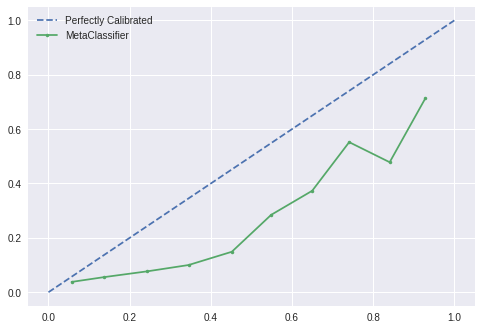

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fraction_of_positives, mean_predicted_values = calibration_curve(y_d2[cols[3]], d2_meta_rant[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','MetaClassifier'])
plt.show()

In [ ]:
joblib.dump(calib_meta2_lrrant, 'calib_meta2_lrrant.sav')
files.download('calib_meta2_lrrant.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Gratitude - Stacking Classifier


#### Class 5, Classifier 1 - Decision Tree w/ RandomizedSearch, Pruning and Calibration on Justification Class

In [ ]:
print(f'Greeting Class samples: {np.count_nonzero(y_d1_k0[cols[0]].values==1)}')
print(f'Backstory Class samples: {np.count_nonzero(y_d1_k0[cols[1]].values==1)}')
print(f'Justification Class samples: {np.count_nonzero(y_d1_k0[cols[2]].values==1)}')
print(f'Rant Class samples: {np.count_nonzero(y_d1_k0[cols[3]].values==1)}')
print(f'Gratitude Class samples: {np.count_nonzero(y_d1_k0[cols[4]].values==1)}')
print(f'Other Class samples: {np.count_nonzero(y_d1_k0[cols[5]].values==1)}')
print(f'Express Emotion Class samples: {np.count_nonzero(y_d1_k0[cols[6]].values==1)}')

Greeting Class samples: 1528
Backstory Class samples: 4115
Justification Class samples: 157
Rant Class samples: 521
Gratitude Class samples: 1069
Other Class samples: 3050
Express Emotion Class samples: 231


In [ ]:
dtc = DecisionTreeClassifier()

random_grid = {'splitter': ['best', 'random'],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'criterion': ['gini', 'entropy']
               }

dtc_random = RandomizedSearchCV(estimator = dtc, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 50, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
dtc_random.fit(train_d1_k0, y_d1_k0[cols[4]])

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    2.1s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
          

In [ ]:
dtc_random.best_params_

{'criterion': 'entropy',
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'splitter': 'best'}

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

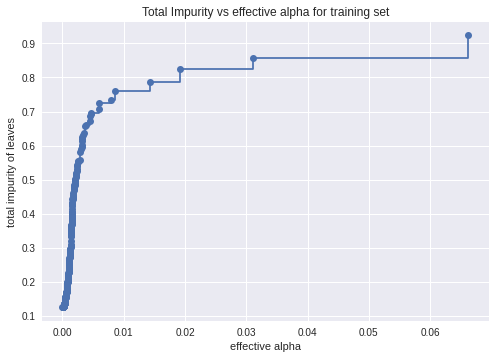

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_, class_weight='balanced')
path =dtc_.cost_complexity_pruning_path(train_d1_k0, y_d1_k0[cols[4]])
ccp_alphas, impurities = path.ccp_alphas, path.impurities
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(**dtc_random.best_params_,class_weight='balanced', ccp_alpha=ccp_alpha)
    clf.fit(train_d1_k0, y_d1_k0[cols[4]])
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.07644277597644511


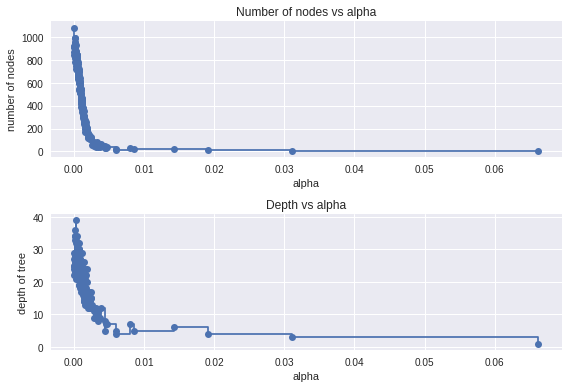

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()


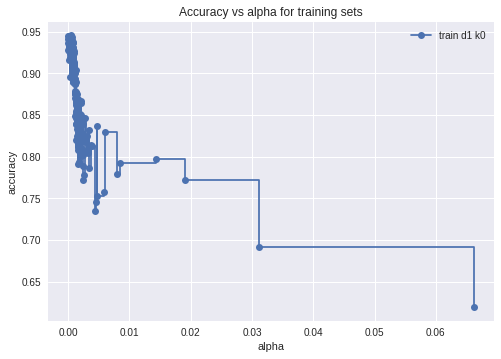

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
train_scores = [clf.score(train_d1_k0, y_d1_k0[cols[4]]) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train d1 k0",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
ccp_alphas[np.argmax(train_scores)]

0.0005438449234713211

In [ ]:
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_, class_weight='balanced',ccp_alpha=ccp_alphas[np.argmax(train_scores)])
calib_dtc_grat = CalibratedClassifierCV(dtc_, method='sigmoid', cv=20)
calib_dtc_grat.fit(train_d1_k0, y_d1_k0[cols[4]])

CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0005438449234713211,
                                                             class_weight='balanced',
                                                             criterion='entropy',
                                                             max_depth=None,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=2,
                                                             min_weight_fraction_leaf=0.0,
                                                             presort=

In [ ]:
d2_grat_dtc = calib_dtc_grat.predict_proba(train_d2)

In [ ]:
d2_grat_roc = roc_auc_score(y_d2[cols[4]], d2_grat_dtc[:,1], average='micro')
d2_grat_f1 = f1_score(y_d2[cols[4]], np.round(d2_grat_dtc[:,1]), average='micro')
d2_grat_hamm = hamming_loss(y_d2[cols[4]], np.round(d2_grat_dtc[:,1]))
d2_grat_brier = brier_score_loss(y_d2[cols[4]], d2_grat_dtc[:,1])

print(f'\nROC d2 Gratitude: {d2_grat_roc}')
print(f'\nF1 d2 Gratitude: {d2_grat_f1}')
print(f'\nHamming Loss d2 Gratitude: {d2_grat_hamm}')
print(f'\nBrier Loss d2 Gratitude: {d2_grat_brier}')


ROC d2 Gratitude: 0.927984567036755

F1 d2 Gratitude: 0.8632884666138823

Hamming Loss d2 Gratitude: 0.13671153338611772

Brier Loss d2 Gratitude: 0.07982411433735005


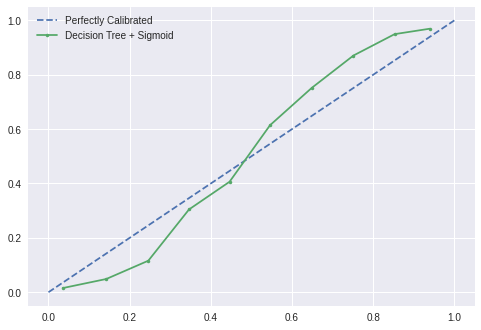

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[4]], d2_grat_dtc[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Decision Tree + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_dtc_grat, 'calib_dtc_grat.sav')

['calib_dtc_grat.sav']

In [ ]:
from google.colab import files
files.download('calib_dtc_grat.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 5 Classifier 2 - Random Forest with Random Search and Calibration

In [ ]:
rf = RandomForestClassifier(n_jobs=-1, class_weight='balanced')

In [ ]:
random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230],
               'criterion': ['gini', 'entropy']}

rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring='roc_auc',
                                cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(train_d1_k1, y_d1_k1[cols[4]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   53.0s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight='balanced',
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
         

In [ ]:
rf_random.best_params_

{'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': 80,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 130}

In [ ]:
rf_ = RandomForestClassifier(**rf_random.best_params_,class_weight='balanced', n_jobs=-1)
calib_d1_gratrf = CalibratedClassifierCV(rf_, method='sigmoid', cv=3)
calib_d1_gratrf.fit(train_d1_k1, y_d1_k1[cols[4]])

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight='balanced',
                                                             criterion='entropy',
                                                             max_depth=80,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=2,
                                                             min_samples_split=2,
                       

In [ ]:
d2_grat_rf = calib_d1_gratrf.predict_proba(train_d2)

In [ ]:
d2_gratrf_roc = roc_auc_score(y_d2[cols[4]], d2_grat_rf[:,1], average='micro')
d2_gratrf_f1 = f1_score(y_d2[cols[4]], np.round(d2_grat_rf[:,1]), average='micro')
d2_gratrf_hamm = hamming_loss(y_d2[cols[4]], np.round(d2_grat_rf[:,1]))
d2_gratrf_brier = brier_score_loss(y_d2[cols[4]], d2_grat_rf[:,1])

print(f'\nROC d2 Gratitude: {d2_gratrf_roc}')
print(f'\nF1 d2 Gratitude: {d2_gratrf_f1}')
print(f'\nHamming Loss d2 Gratitude: {d2_gratrf_hamm}')
print(f'\nBrier Loss d2 Gratitude: {d2_gratrf_brier}')


ROC d2 Gratitude: 0.9393360759842776

F1 d2 Gratitude: 0.9304565848508841

Hamming Loss d2 Gratitude: 0.06954341514911586

Brier Loss d2 Gratitude: 0.05269305139062191


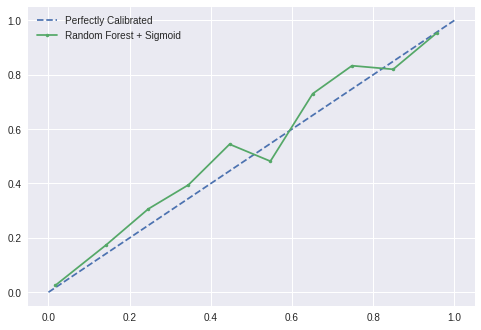

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[4]], d2_grat_rf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Random Forest + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_d1_gratrf, 'calib_d1_gratrf.sav')

['calib_d1_gratrf.sav']

In [ ]:
from google.colab import files
files.download('calib_d1_gratrf.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import hyperopt as hp

#### Class 4 Classifier 3 - XGBoost w/ Hyperopt and Calibration

In [ ]:
xgb = XGBClassifier(n_thread=-1)

In [ ]:
from hyperopt import hp, fmin, tpe

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_d1_k2,y_d1_k2[cols[4]])
    y_pred = model.predict_proba(train_d2)
    score=roc_auc_score(y_d2[cols[4]],y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
         'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 6, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 0.05, 'eta': 0.5, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.5, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 12, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 99, 'subsample': 0.05}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'scale_pos_weight': 1000, 'subsample': 0.05}
{'colsample_bytree': 0.05, '

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9],
         'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
xgb_d1_best = get_params_space(best)
print(xgb_d1_best)

{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 50, 'subsample': 1}


In [ ]:
calib_d1xgb_grat= CalibratedClassifierCV(XGBClassifier(**xgb_d1_best, n_thread=-1), method='sigmoid', cv=3)
calib_d1xgb_grat.fit(train_d1_k2, y_d1_k2[cols[4]])

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1,
                                                    eta=0.025, gamma=1,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=8,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='binary:

In [ ]:
d2_grat_xgb = calib_d1xgb_grat.predict_proba(train_d2)

In [ ]:
d2_gratxgb_roc = roc_auc_score(y_d2[cols[4]], d2_grat_xgb[:,1], average='micro')
d2_gratxgb_f1 = f1_score(y_d2[cols[4]], np.round(d2_grat_xgb[:,1]), average='micro')
d2_gratxgb_hamm = hamming_loss(y_d2[cols[4]], np.round(d2_grat_xgb[:,1]))
d2_gratxgb_brier = brier_score_loss(y_d2[cols[4]], d2_grat_xgb[:,1])

print(f'\nROC d2 Gratitude: {d2_gratxgb_roc}')
print(f'\nF1 d2 Gratitude: {d2_gratxgb_f1}')
print(f'\nHamming Loss d2 Gratitude: {d2_gratxgb_hamm}')
print(f'\nBrier Loss d2 Gratitude: {d2_gratxgb_brier}')


ROC d2 Gratitude: 0.9636720051175774

F1 d2 Gratitude: 0.9464238585378728

Hamming Loss d2 Gratitude: 0.05357614146212721

Brier Loss d2 Gratitude: 0.04187653596591654


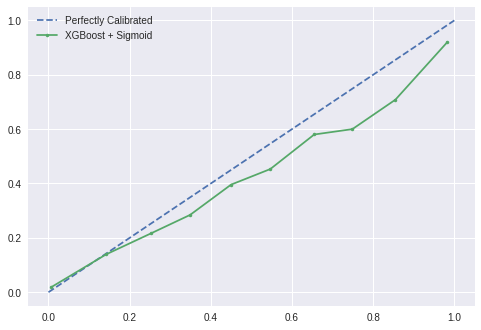

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[4]], d2_grat_xgb[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','XGBoost + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_d1xgb_grat, 'calib_d1xgb_grat.sav')
files.download('calib_d1xgb_grat.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from catboost.utils import eval_metric

#### Class 5 - Classifier 4 - CatBoost with Hyperopt and Calibration

In [ ]:
train_pool = catboost.Pool(train_d1_k3, y_d1_k3[cols[4]])

In [ ]:
# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin

def hyperopt_objective(params):
    print(params)
    model = catboost.CatBoostClassifier(**params, task_type='GPU')
    model.fit(train_pool)
    y_pred = model.predict_proba(train_d2)
    return -eval_metric(y_d2[cols[4]], y_pred[:, 1], 'AUC')[0]

space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'depth': hp.choice('depth', [3, 10]),
    'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'boosting_type': hp.choice('boosting_type', ['Ordered', 'Plain']),
    'max_ctr_complexity': hp.choice('max_ctr_complexity', [0, 8])}

best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=5,
    rstate=np.random.RandomState(seed=123))

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 3.134356934526143, 'learning_rate': 0.06313971035362703, 'max_ctr_complexity': 0, 'scale_pos_weight': 75}
  0%|          | 0/5 [00:00<?, ?it/s, best loss: ?]0:	learn: 0.6237289	total: 41ms	remaining: 41s
1:	learn: 0.5697474	total: 75.1ms	remaining: 37.5s
2:	learn: 0.5215511	total: 112ms	remaining: 37.1s


Custom logger is already specified. Specify more than one logger at same time is not thread safe.

Streaming output truncated to the last 5000 lines.
5:	learn: 0.4162090	total: 224ms	remaining: 37s
6:	learn: 0.3916196	total: 261ms	remaining: 37s
7:	learn: 0.3705661	total: 298ms	remaining: 36.9s
8:	learn: 0.3544649	total: 334ms	remaining: 36.8s
9:	learn: 0.3396752	total: 371ms	remaining: 36.7s
10:	learn: 0.3273765	total: 408ms	remaining: 36.7s
11:	learn: 0.3117896	total: 443ms	remaining: 36.5s
12:	learn: 0.2985832	total: 478ms	remaining: 36.3s
13:	learn: 0.2893020	total: 515ms	remaining: 36.3s
14:	learn: 0.2797628	total: 548ms	remaining: 36s
15:	learn: 0.2691502	total: 586ms	remaining: 36.1s
16:	learn: 0.2621416	total: 625ms	remaining: 36.2s
17:	learn: 0.2543646	total: 660ms	remaining: 36s
18:	learn: 0.2515157	total: 696ms	remaining: 35.9s
19:	learn: 0.2461478	total: 735ms	remaining: 36s
20:	learn: 0.2429702	total: 771ms	remaining: 35.9s
21:	learn: 0.2397863	total: 810ms	remaining: 36s
22:	learn: 0.2351436	total: 847ms	remaining: 36s
23:	learn: 0.2312333	total: 885ms	remaining: 36s
2

In [ ]:
def get_space(space_params):
  space = {
    'learning_rate': [0.01, 0.1],
    'depth': [3, 10],
    'l2_leaf_reg': [1, 10],
    'boosting_type': ['Ordered', 'Plain'],
    'max_ctr_complexity':  [0, 8],
    'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]
    }

  param_dict = dict()
  for key in space_params.keys():
    if isinstance(space_params.get(key), float):
      param_dict[key] = space_params.get(key)
    else:
      get_list = space_params.get(key)
      param_dict[key] = space.get(key)[get_list]
  return param_dict

In [ ]:
cat_d1_best = get_space(best)
print(cat_d1_best)

{'boosting_type': 'Ordered', 'depth': 3, 'l2_leaf_reg': 1.7872262817346178, 'learning_rate': 0.04308614773826791, 'max_ctr_complexity': 0, 'scale_pos_weight': 1}


In [ ]:
calib_catd1_grat = CalibratedClassifierCV(catboost.CatBoostClassifier(**cat_d1_best), method='sigmoid', cv=5)
calib_catd1_grat.fit(train_d1_k3, y_d1_k3[cols[4]])

Streaming output truncated to the last 5000 lines.
0:	learn: 0.6505494	total: 29.2ms	remaining: 29.2s
1:	learn: 0.6085124	total: 57.6ms	remaining: 28.7s
2:	learn: 0.5717265	total: 85.7ms	remaining: 28.5s
3:	learn: 0.5369150	total: 115ms	remaining: 28.6s
4:	learn: 0.5097984	total: 143ms	remaining: 28.4s
5:	learn: 0.4842322	total: 170ms	remaining: 28.2s
6:	learn: 0.4611516	total: 198ms	remaining: 28.1s
7:	learn: 0.4424652	total: 225ms	remaining: 27.8s
8:	learn: 0.4232738	total: 254ms	remaining: 28s
9:	learn: 0.4084758	total: 285ms	remaining: 28.2s
10:	learn: 0.3957092	total: 312ms	remaining: 28s
11:	learn: 0.3810507	total: 339ms	remaining: 27.9s
12:	learn: 0.3670698	total: 368ms	remaining: 27.9s
13:	learn: 0.3543458	total: 399ms	remaining: 28.1s
14:	learn: 0.3450858	total: 428ms	remaining: 28.1s
15:	learn: 0.3366707	total: 457ms	remaining: 28.1s
16:	learn: 0.3277548	total: 485ms	remaining: 28.1s
17:	learn: 0.3211579	total: 511ms	remaining: 27.9s
18:	learn: 0.3139275	total: 539ms	remainin

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7f51ef98aad0>,
                       cv=5, method='sigmoid')

In [ ]:
calib_catd1_grat.base_estimator.get_params(deep=True)

{'boosting_type': 'Ordered',
 'depth': 3,
 'l2_leaf_reg': 1.7872262817346178,
 'learning_rate': 0.04308614773826791,
 'max_ctr_complexity': 0,
 'scale_pos_weight': 1}

In [ ]:
d2_grat_cat = calib_catd1_grat.predict_proba(train_d2)

In [ ]:
d2_gratcat_roc = roc_auc_score(y_d2[cols[4]], d2_grat_cat[:,1], average='micro')
d2_gratcat_f1 = f1_score(y_d2[cols[4]], np.round(d2_grat_cat[:,1]), average='micro')
d2_gratcat_hamm = hamming_loss(y_d2[cols[4]], np.round(d2_grat_cat[:,1]))
d2_gratcat_brier = brier_score_loss(y_d2[cols[4]], d2_grat_cat[:,1])

print(f'\nROC d2 Gratitude: {d2_gratcat_roc}')
print(f'\nF1 d2 Gratitude: {d2_gratcat_f1}')
print(f'\nHamming Loss d2 Gratitude: {d2_gratcat_hamm}')
print(f'\nBrier Loss d2 Gratitude: {d2_gratcat_brier}')


ROC d2 Gratitude: 0.9536273266030217

F1 d2 Gratitude: 0.9365267880707311

Hamming Loss d2 Gratitude: 0.06347321192926894

Brier Loss d2 Gratitude: 0.048699218719486174


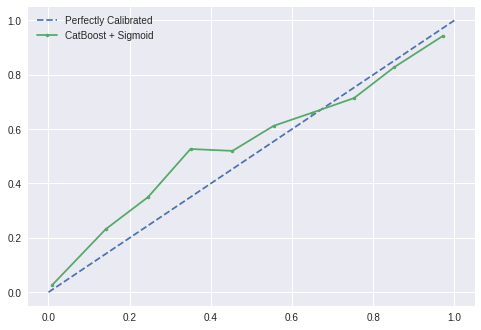

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[4]], d2_grat_cat[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','CatBoost + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_catd1_grat,'calib_catd1_grat.sav')
files.download('calib_catd1_grat.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 5 - Classsifier 5 - SGD with Random Search and Calibration on Gratitude Class

In [ ]:
sgd = SGDClassifier(random_state=42)

sgd_params = {'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
              'penalty': ['l2', 'l1', 'elasticnet'],
              'learning_rate': ['adaptive', 'optimal', 'invscaling', 'constant'],
              'early_stopping':[True, False],
              'validation_fraction':[0.4,0.3,0.2,0.1],
              'eta0' : [random.uniform(0,1)],
              }
sgd_random = RandomizedSearchCV(sgd, param_distributions=sgd_params, n_iter=50, scoring='accuracy',random_state=42, refit=True,cv=5,n_jobs=-1)
sgd_random.fit(train_d1_k4, y_d1_k4[cols[4]])

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SGDClassifier(alpha=0.0001, average=False,
                                           class_weight=None,
                                           early_stopping=False, epsilon=0.1,
                                           eta0=0.0, fit_intercept=True,
                                           l1_ratio=0.15,
                                           learning_rate='optimal',
                                           loss='hinge', max_iter=1000,
                                           n_iter_no_change=5, n_jobs=None,
                                           penalty='l2', power_t=0.5,
                                           random_state=42, shuffle=True,
                                           tol=0.001, validation_fraction=...
                   param_distributions={'early_stopping': [True, False],
                                        'eta0': [0.6121305194557297],
                                  

In [ ]:
sgd_random.best_params_

{'early_stopping': False,
 'eta0': 0.6121305194557297,
 'learning_rate': 'optimal',
 'loss': 'hinge',
 'penalty': 'l2',
 'validation_fraction': 0.3}

In [ ]:
sgd_random.best_score_

0.8589339672753555

In [ ]:
calib_sgdd1_grat = CalibratedClassifierCV(SGDClassifier(**sgd_random.best_params_,class_weight='balanced', random_state=42), method='sigmoid', cv=10)
calib_sgdd1_grat.fit(train_d1_k4, y_d1_k4[cols[4]])

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=0.0001, average=False,
                                                    class_weight='balanced',
                                                    early_stopping=False,
                                                    epsilon=0.1,
                                                    eta0=0.6121305194557297,
                                                    fit_intercept=True,
                                                    l1_ratio=0.15,
                                                    learning_rate='optimal',
                                                    loss='hinge', max_iter=1000,
                                                    n_iter_no_change=5,
                                                    n_jobs=None, penalty='l2',
                                                    power_t=0.5,
                                                    random_state=42,
                                            

In [ ]:
d2_grat_sgd = calib_sgdd1_grat.predict_proba(train_d2)

In [ ]:
d2_gratsgd_roc = roc_auc_score(y_d2[cols[4]], d2_grat_sgd[:,1], average='micro')
d2_gratsgd_f1 = f1_score(y_d2[cols[4]], np.round(d2_grat_sgd[:,1]), average='micro')
d2_gratsgd_hamm = hamming_loss(y_d2[cols[4]], np.round(d2_grat_sgd[:,1]))
d2_gratsgd_brier = brier_score_loss(y_d2[cols[4]], d2_grat_sgd[:,1])

print(f'\nROC d2 Gratitude: {d2_gratsgd_roc}')
print(f'\nF1 d2 Gratitude: {d2_gratsgd_f1}')
print(f'\nHamming Loss d2 Gratitude: {d2_gratsgd_hamm}')
print(f'\nBrier Loss d2 Gratitude: {d2_gratsgd_brier}')


ROC d2 Gratitude: 0.7488110443396828

F1 d2 Gratitude: 0.857878068091845

Hamming Loss d2 Gratitude: 0.1421219319081552

Brier Loss d2 Gratitude: 0.1085443861375988


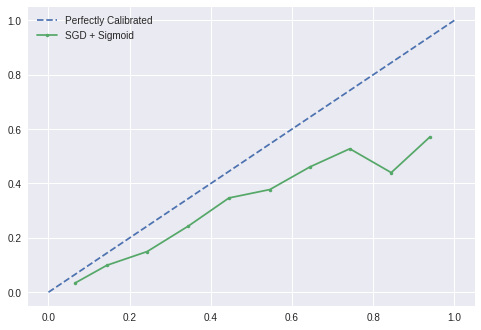

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[4]], d2_grat_sgd[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SGD + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_sgdd1_grat, 'calib_sgdd1_grat.sav')
files.download('calib_sgdd1_grat.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 5 - Classifier 6 - SVM with RBF kernel with RandomSearch and Calibration

In [ ]:
svm = SVC(kernel='rbf', class_weight='balanced')

In [ ]:
cols = y_train_multi.columns

In [ ]:


svm_params = {'C': [1e-5,1e-4,1e-3,1e-2,1e-1,0,1,10,100,1000],
              'degree':[i for i in range(1,5)],
              'probability':[True, False],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1],
              }
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k5, y_d1_k5[cols[4]])

RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight='balanced', coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [1e-05, 0.0001, 0.001, 0.01, 0.1,
                                              0, 1, 10, 100, 1000],
                                        'degree': [1, 2, 3, 4],
                                        'probability': [True, False],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispatch='2*

In [ ]:
svm_random.best_params_

{'C': 1, 'degree': 2, 'probability': True, 'shrinking': True, 'tol': 0.1}

In [ ]:
svm_random.best_score_

0.7338686790663242

In [ ]:
cols = y_train_multi.columns

In [ ]:
calib_svmrbf_d1_grat = CalibratedClassifierCV(SVC(**svm_random.best_params_, class_weight='balanced'), method='sigmoid', cv=3)
calib_svmrbf_d1_grat.fit(train_d1_k5, y_d1_k5[cols[4]])

CalibratedClassifierCV(base_estimator=SVC(C=1, break_ties=False, cache_size=200,
                                          class_weight='balanced', coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=2, gamma='scale', kernel='rbf',
                                          max_iter=-1, probability=True,
                                          random_state=None, shrinking=True,
                                          tol=0.1, verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_grat_svmrbf = calib_svmrbf_d1_grat.predict_proba(train_d2)

In [ ]:
d2_grat_svmrbf_roc = roc_auc_score(y_d2[cols[4]], d2_grat_svmrbf[:,1], average='micro')
d2_grat_svmrbf_f1 = f1_score(y_d2[cols[4]], np.round(d2_grat_svmrbf[:,1]), average='micro')
d2_grat_svmrbf_hamm = hamming_loss(y_d2[cols[4]], np.round(d2_grat_svmrbf[:,1]))
d2_grat_svmrbf_brier = brier_score_loss(y_d2[cols[4]], d2_grat_svmrbf[:,1])

print(f'\nROC d2 Gratitude: {d2_grat_svmrbf_roc}')
print(f'\nF1 d2 Gratitude: {d2_grat_svmrbf_f1}')
print(f'\nHamming Loss d2 Gratitude: {d2_grat_svmrbf_hamm}')
print(f'\nBrier Loss d2 Gratitude: {d2_grat_svmrbf_brier}')


ROC d2 Gratitude: 0.7577096405159699

F1 d2 Gratitude: 0.8582739509105305

Hamming Loss d2 Gratitude: 0.1417260490894695

Brier Loss d2 Gratitude: 0.10761495627174936


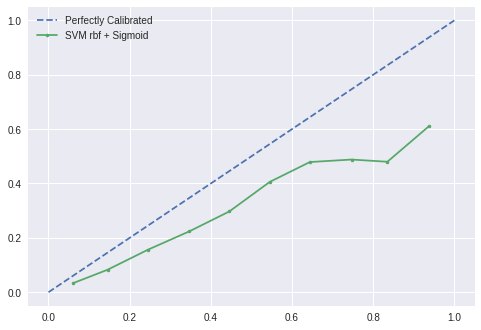

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[4]], d2_grat_svmrbf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM rbf + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files
joblib.dump(calib_svmrbf_d1_grat, 'calib_svmrbf_d1_grat.sav')
files.download('calib_svmrbf_d1_grat.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Class 5 - Classifier 7 - SVM with randomsearch and calibration 

In [ ]:
svm = SVC(class_weight='balanced', random_state=42)

In [ ]:
svm_params = {'kernel': ['poly','sigmoid', 'linear'],
              'C': [1e-5,1e-4,1e-3,1e-2,1e-1,0,1,10,100,1000],
              'degree':[i for i in range(1,5)],
              'probability':[True],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1]}
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, verbose=3, random_state=42, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k6, y_d1_k6[cols[4]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed: 12.8min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight='balanced', coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=42,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [1e-05, 0.0001, 0.001, 0.01, 0.1,
                                              0, 1, 10, 100, 1000],
                                        'degree': [1, 2, 3, 4],
                                        'kernel': ['poly', 'sigmoid', 'linear'],
                                        'probability': [True],
                                        'shrinking': [True, False],
                                       

In [ ]:
svm_random.best_params_

{'C': 0.1,
 'degree': 4,
 'kernel': 'linear',
 'probability': True,
 'shrinking': False,
 'tol': 0.001}

In [ ]:
calib_svm_d1_grat = CalibratedClassifierCV(SVC(**svm_random.best_params_, class_weight='balanced'), method='sigmoid', cv=3)
calib_svm_d1_grat.fit(train_d1_k6, y_d1_k6[cols[4]])

CalibratedClassifierCV(base_estimator=SVC(C=0.1, break_ties=False,
                                          cache_size=200,
                                          class_weight='balanced', coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=4, gamma='scale',
                                          kernel='linear', max_iter=-1,
                                          probability=True, random_state=None,
                                          shrinking=False, tol=0.001,
                                          verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_svm_grat = calib_svm_d1_grat.predict_proba(train_d2)

In [ ]:
d2_svmgrat_roc = roc_auc_score(y_d2[cols[4]], d2_svm_grat[:,1], average='micro')
d2_svmgrat_f1 = f1_score(y_d2[cols[4]], np.round(d2_svm_grat[:,1]), average='micro')
d2_svmgrat_hamm = hamming_loss(y_d2[cols[4]], np.round(d2_svm_grat[:,1]))
d2_svmgrat_brier = brier_score_loss(y_d2[cols[4]], d2_svm_grat[:,1])

print(f'\nROC d2 Gratitude: {d2_svmgrat_roc}')
print(f'\nF1 d2 Gratitude: {d2_svmgrat_f1}')
print(f'\nHamming Loss d2 Gratitude: {d2_svmgrat_hamm}')
print(f'\nBrier Loss d2 Gratitude: {d2_svmgrat_brier}')


ROC d2 Gratitude: 0.7446244304152014

F1 d2 Gratitude: 0.8586698337292161

Hamming Loss d2 Gratitude: 0.14133016627078385

Brier Loss d2 Gratitude: 0.10875846891970192


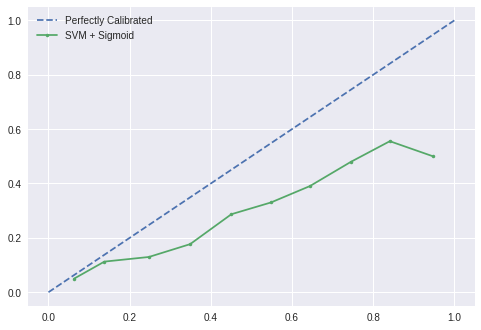

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[4]], d2_svm_grat[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_svm_d1_grat, 'calib_svm_d1_grat.sav')
files.download('calib_svm_d1_grat.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#!gdown --id '1uQRLi6CAD19AHUfyEuJRg0cmwIcKG_A_'
#!unzip 'greet stacked.zip' -d '/content/'

In [ ]:
d2grat_cat = calib_catd1_grat.predict_proba(train_d2)[:,1]
d2grat_rf = calib_d1_gratrf.predict_proba(train_d2)[:,1]
d2grat_xgb = calib_d1xgb_grat.predict_proba(train_d2)[:,1]
d2grat_dtc = calib_dtc_grat.predict_proba(train_d2)[:,1]
d2grat_sgd = calib_sgdd1_grat.predict_proba(train_d2)[:,1]
d2grat_svm = calib_svm_d1_grat.predict_proba(train_d2)[:,1]
d2grat_svmrbf = calib_svmrbf_d1_grat.predict_proba(train_d2)[:,1]

In [ ]:
d2grat_meta = np.hstack((d2grat_cat.reshape(-1,1), d2grat_rf.reshape(-1,1), d2grat_xgb.reshape(-1,1), d2grat_dtc.reshape(-1,1),
                         d2grat_sgd.reshape(-1,1), d2grat_svm.reshape(-1,1), d2grat_svmrbf.reshape(-1,1)))

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from scipy.stats import loguniform

meta_model4 = LogisticRegression()
# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)
# define search
search = RandomizedSearchCV(meta_model4, space,verbose=2, n_iter=50, refit=True, scoring='roc_auc', n_jobs=-1, cv=cv, random_state=42)
# execute search
result = search.fit(d2grat_meta, y_d2[cols[4]])
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Fitting 30 folds for each of 50 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    1.6s


Best Score: 0.9640183040569937
Best Hyperparameters: {'C': 0.13774775007214832, 'penalty': 'l1', 'solver': 'liblinear'}


[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed:   10.2s finished


In [ ]:
calib_meta2_lrgrat = CalibratedClassifierCV(LogisticRegression(**search.best_params_), method='sigmoid', cv=10)
calib_meta2_lrgrat.fit(d2grat_meta, y_d2[cols[4]])

CalibratedClassifierCV(base_estimator=LogisticRegression(C=0.13774775007214832,
                                                         class_weight=None,
                                                         dual=False,
                                                         fit_intercept=True,
                                                         intercept_scaling=1,
                                                         l1_ratio=None,
                                                         max_iter=100,
                                                         multi_class='auto',
                                                         n_jobs=None,
                                                         penalty='l1',
                                                         random_state=None,
                                                         solver='liblinear',
                                                         tol=0.0001, verbose=0,
                          

In [ ]:
d2_meta_grat = calib_meta2_lrgrat.predict_proba(d2grat_meta)

In [ ]:
d2grat_meta_roc = roc_auc_score(y_d2[cols[4]], d2_meta_grat[:,1], average='micro')
d2grat_meta_f1 = f1_score(y_d2[cols[4]], np.round(d2_meta_grat[:,1]), average='micro')
d2grat_meta_hamm = hamming_loss(y_d2[cols[4]], np.round(d2_meta_grat[:,1]))
d2grat_meta_brier = brier_score_loss(y_d2[cols[4]], d2_meta_grat[:,1])

print(f'\nROC d2 Gratitude: {d2grat_meta_roc}')
print(f'\nF1 d2 Gratitude: {d2grat_meta_f1}')
print(f'\nHamming Loss d2 Gratitude: {d2grat_meta_hamm}')
print(f'\nBrier Loss d2 Gratitude: {d2grat_meta_brier}')


ROC d2 Gratitude: 0.964021653713933

F1 d2 Gratitude: 0.9466877804169965

Hamming Loss d2 Gratitude: 0.05331221958300343

Brier Loss d2 Gratitude: 0.04260826092658


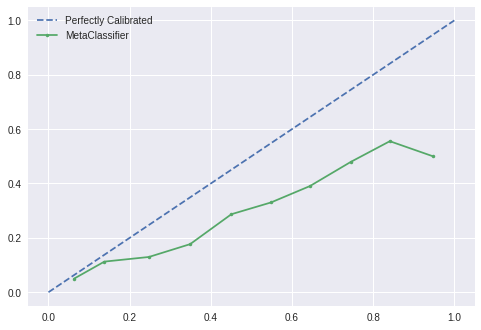

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fraction_of_positives, mean_predicted_values = calibration_curve(y_d2[cols[4]], d2_meta_grat[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','MetaClassifier'])
plt.show()

In [ ]:
joblib.dump(calib_meta2_lrgrat, 'calib_meta2_lrgrat.sav')
files.download('calib_meta2_lrgrat.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Other Class - Stacking Classifier


#### Class 6, Classifier 1 - Decision Tree w/ RandomizedSearch, Pruning and Calibration on Justification Class

In [ ]:
print(f'Greeting Class samples: {np.count_nonzero(y_d1_k0[cols[0]].values==1)}')
print(f'Backstory Class samples: {np.count_nonzero(y_d1_k0[cols[1]].values==1)}')
print(f'Justification Class samples: {np.count_nonzero(y_d1_k0[cols[2]].values==1)}')
print(f'Rant Class samples: {np.count_nonzero(y_d1_k0[cols[3]].values==1)}')
print(f'Gratitude Class samples: {np.count_nonzero(y_d1_k0[cols[4]].values==1)}')
print(f'Other Class samples: {np.count_nonzero(y_d1_k0[cols[5]].values==1)}')
print(f'Express Emotion Class samples: {np.count_nonzero(y_d1_k0[cols[6]].values==1)}')

Greeting Class samples: 1528
Backstory Class samples: 4115
Justification Class samples: 157
Rant Class samples: 521
Gratitude Class samples: 1069
Other Class samples: 3050
Express Emotion Class samples: 231


In [ ]:
dtc = DecisionTreeClassifier()

random_grid = {'splitter': ['best', 'random'],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'criterion': ['gini', 'entropy']
               }

dtc_random = RandomizedSearchCV(estimator = dtc, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 50, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
dtc_random.fit(train_d1_k0, y_d1_k0[cols[5]])

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 143 out of 150 | elapsed:    3.3s remaining:    0.2s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    3.3s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
          

In [ ]:
dtc_random.best_params_

{'criterion': 'entropy',
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 10,
 'splitter': 'best'}

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

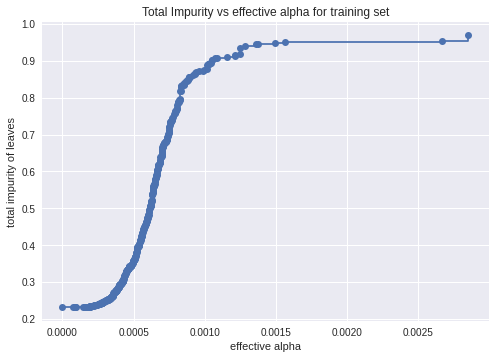

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_)
path =dtc_.cost_complexity_pruning_path(train_d1_k0, y_d1_k0[cols[5]])
ccp_alphas, impurities = path.ccp_alphas, path.impurities
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(**dtc_random.best_params_, ccp_alpha=ccp_alpha)
    clf.fit(train_d1_k0, y_d1_k0[cols[5]])
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.003576627756961104


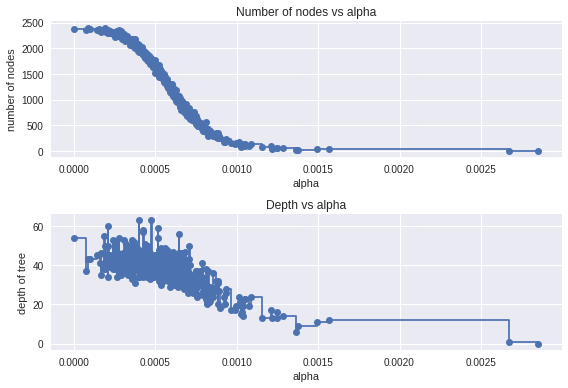

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()


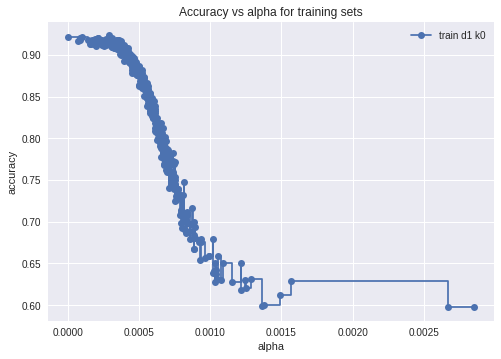

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
train_scores = [clf.score(train_d1_k0, y_d1_k0[cols[5]]) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train d1 k0",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
ccp_alphas[np.argmax(train_scores)]

0.0002846622060134925

In [ ]:
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_,ccp_alpha=ccp_alphas[np.argmax(train_scores)])
calib_dtc_other = CalibratedClassifierCV(dtc_, method='sigmoid', cv=3)
calib_dtc_other.fit(train_d1_k0, y_d1_k0[cols[6]])

CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0002846622060134925,
                                                             class_weight=None,
                                                             criterion='entropy',
                                                             max_depth=None,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=1,
                                                             min_samples_split=10,
                                                             min_weight_fraction_leaf=0.0,
                                                             presort='depr

In [ ]:
d2_other_dtc = calib_dtc_other.predict_proba(train_d2)

In [ ]:
d2_other_roc = roc_auc_score(y_d2[cols[5]], d2_other_dtc[:,1], average='micro')
d2_other_f1 = f1_score(y_d2[cols[5]], np.round(d2_other_dtc[:,1]), average='micro')
d2_other_hamm = hamming_loss(y_d2[cols[5]], np.round(d2_other_dtc[:,1]))
d2_other_brier = brier_score_loss(y_d2[cols[5]], d2_other_dtc[:,1])

print(f'\nROC d2 Other: {d2_other_roc}')
print(f'\nF1 d2 Other: {d2_other_f1}')
print(f'\nHamming Loss d2 Other: {d2_other_hamm}')
print(f'\nBrier Loss d2 Other: {d2_other_brier}')


ROC d2 Other: 0.5084656135599818

F1 d2 Other: 0.5972552124571127

Hamming Loss d2 Other: 0.4027447875428873

Brier Loss d2 Other: 0.3790115862693535


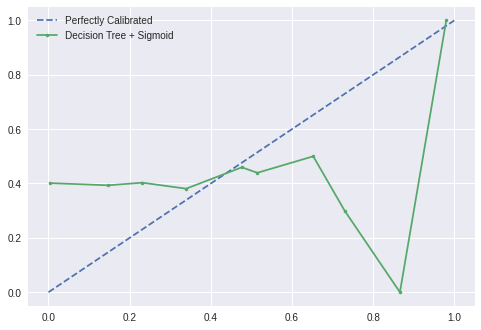

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[5]], d2_other_dtc[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Decision Tree + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_dtc_other, 'calib_dtc_other.sav')

['calib_dtc_other.sav']

In [ ]:
from google.colab import files
files.download('calib_dtc_other.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 5 Classifier 2 - Random Forest with Random Search and Calibration

In [ ]:
rf = RandomForestClassifier(n_jobs=-1)

In [ ]:
random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230],
               'criterion': ['gini', 'entropy']}

rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring='roc_auc',
                                cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(train_d1_k1, y_d1_k1[cols[5]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  1.4min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [ ]:
rf_random.best_params_

{'bootstrap': False,
 'criterion': 'entropy',
 'max_depth': 80,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 130}

In [ ]:
rf_ = RandomForestClassifier(**rf_random.best_params_, n_jobs=-1)
calib_d1_otherrf = CalibratedClassifierCV(rf_, method='sigmoid', cv=3)
calib_d1_otherrf.fit(train_d1_k1, y_d1_k1[cols[5]])

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=False,
                                                             ccp_alpha=0.0,
                                                             class_weight=None,
                                                             criterion='entropy',
                                                             max_depth=80,
                                                             max_features='auto',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=2,
                                                             min_samples_split=2,
                             

In [ ]:
d2_other_rf = calib_d1_otherrf.predict_proba(train_d2)

In [ ]:
d2_otherrf_roc = roc_auc_score(y_d2[cols[5]], d2_other_rf[:,1], average='micro')
d2_otherrf_f1 = f1_score(y_d2[cols[5]], np.round(d2_other_rf[:,1]), average='micro')
d2_otherrf_hamm = hamming_loss(y_d2[cols[5]], np.round(d2_other_rf[:,1]))
d2_otherrf_brier = brier_score_loss(y_d2[cols[5]], d2_other_rf[:,1])

print(f'\nROC d2 Other: {d2_otherrf_roc}')
print(f'\nF1 d2 Other: {d2_otherrf_f1}')
print(f'\nHamming Loss d2 Other: {d2_otherrf_hamm}')
print(f'\nBrier Loss d2 Other: {d2_otherrf_brier}')


ROC d2 Other: 0.7406551284583206

F1 d2 Other: 0.692662971760359

Hamming Loss d2 Other: 0.30733702823964104

Brier Loss d2 Other: 0.2012050377178574


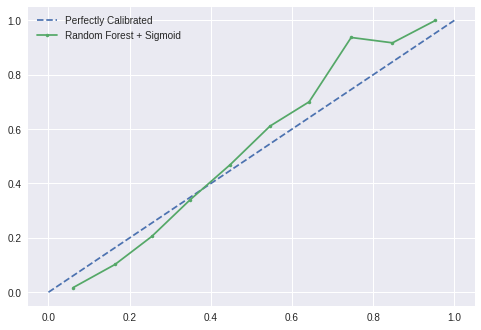

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[5]], d2_other_rf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Random Forest + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_d1_otherrf, 'calib_d1_otherrf.sav')

['calib_d1_otherrf.sav']

In [ ]:
from google.colab import files
files.download('calib_d1_otherrf.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import hyperopt as hp

#### Class 4 Classifier 3 - XGBoost w/ Hyperopt and Calibration

In [ ]:
xgb = XGBClassifier(n_thread=-1)

In [ ]:
from hyperopt import hp, fmin, tpe

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_d1_k2,y_d1_k2[cols[5]])
    y_pred = model.predict_proba(train_d2)
    score=roc_auc_score(y_d2[cols[5]],y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
         'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 6, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 0.05, 'eta': 0.5, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.5, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 12, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 99, 'subsample': 0.05}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'scale_pos_weight': 1000, 'subsample': 0.05}
{'colsample_bytree': 0.05, '

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9],
         'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
xgb_d1_best = get_params_space(best)
print(xgb_d1_best)

{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 50, 'subsample': 1}


In [ ]:
calib_d1xgb_other= CalibratedClassifierCV(XGBClassifier(**xgb_d1_best, n_thread=-1), method='sigmoid', cv=3)
calib_d1xgb_other.fit(train_d1_k2, y_d1_k2[cols[5]])

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1,
                                                    eta=0.025, gamma=1,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=8,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='binary:

In [ ]:
d2_other_xgb = calib_d1xgb_other.predict_proba(train_d2)

In [ ]:
d2_otherxgb_roc = roc_auc_score(y_d2[cols[5]], d2_other_xgb[:,1], average='micro')
d2_otherxgb_f1 = f1_score(y_d2[cols[5]], np.round(d2_other_xgb[:,1]), average='micro')
d2_otherxgb_hamm = hamming_loss(y_d2[cols[5]], np.round(d2_other_xgb[:,1]))
d2_otherxgb_brier = brier_score_loss(y_d2[cols[5]], d2_other_xgb[:,1])

print(f'\nROC d2 Other: {d2_otherxgb_roc}')
print(f'\nF1 d2 Other: {d2_otherxgb_f1}')
print(f'\nHamming Loss d2 Other: {d2_otherxgb_hamm}')
print(f'\nBrier Loss d2 Other: {d2_otherxgb_brier}')


ROC d2 Other: 0.6739925978864507

F1 d2 Other: 0.5972552124571127

Hamming Loss d2 Other: 0.4027447875428873

Brier Loss d2 Other: 0.2259528415384628


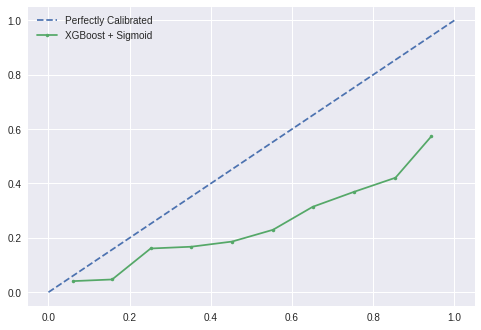

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[5]], d2_other_xgb[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','XGBoost + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_d1xgb_other, 'calib_d1xgb_other.sav')
files.download('calib_d1xgb_other.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from catboost.utils import eval_metric

#### Class 5 - Classifier 4 - CatBoost with Hyperopt and Calibration

In [ ]:
train_pool = catboost.Pool(train_d1_k3, y_d1_k3[cols[5]])

In [ ]:
# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin

def hyperopt_objective(params):
    print(params)
    model = catboost.CatBoostClassifier(**params, task_type='GPU')
    model.fit(train_pool)
    y_pred = model.predict_proba(train_d2)
    return -eval_metric(y_d2[cols[5]], y_pred[:, 1], 'AUC')[0]

space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'depth': hp.choice('depth', [3, 10]),
    'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'boosting_type': hp.choice('boosting_type', ['Ordered', 'Plain']),
    'max_ctr_complexity': hp.choice('max_ctr_complexity', [0, 8])}

best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=20,
    rstate=np.random.RandomState(seed=123))

Streaming output truncated to the last 5000 lines.
5:	learn: 0.6826363	total: 37.5ms	remaining: 6.22s
6:	learn: 0.6814751	total: 43.7ms	remaining: 6.2s
7:	learn: 0.6803822	total: 49ms	remaining: 6.07s
8:	learn: 0.6792513	total: 53.3ms	remaining: 5.87s
9:	learn: 0.6779782	total: 57.5ms	remaining: 5.7s
10:	learn: 0.6770224	total: 61.7ms	remaining: 5.55s
11:	learn: 0.6760655	total: 68.1ms	remaining: 5.61s
12:	learn: 0.6751247	total: 72.5ms	remaining: 5.5s
13:	learn: 0.6740071	total: 77.1ms	remaining: 5.43s
14:	learn: 0.6731346	total: 82.1ms	remaining: 5.39s
15:	learn: 0.6722343	total: 88.3ms	remaining: 5.43s
16:	learn: 0.6714740	total: 92.3ms	remaining: 5.34s
17:	learn: 0.6706355	total: 97ms	remaining: 5.29s
18:	learn: 0.6700821	total: 101ms	remaining: 5.23s
19:	learn: 0.6692338	total: 107ms	remaining: 5.22s
20:	learn: 0.6688228	total: 111ms	remaining: 5.18s
21:	learn: 0.6681890	total: 117ms	remaining: 5.19s
22:	learn: 0.6675751	total: 123ms	remaining: 5.22s
23:	learn: 0.6670734	total: 12

In [ ]:
def get_space(space_params):
  space = {
    'learning_rate': [0.01, 0.1],
    'depth': [3, 10],
    'l2_leaf_reg': [1, 10],
    'boosting_type': ['Ordered', 'Plain'],
    'max_ctr_complexity':  [0, 8],
    'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]
    }

  param_dict = dict()
  for key in space_params.keys():
    if isinstance(space_params.get(key), float):
      param_dict[key] = space_params.get(key)
    else:
      get_list = space_params.get(key)
      param_dict[key] = space.get(key)[get_list]
  return param_dict

In [ ]:
cat_d1_best = get_space(best)
print(cat_d1_best)

{'boosting_type': 'Plain', 'depth': 10, 'l2_leaf_reg': 5.126337791313275, 'learning_rate': 0.09334530699474519, 'max_ctr_complexity': 0, 'scale_pos_weight': 10}


In [ ]:
calib_catd1_other = CalibratedClassifierCV(catboost.CatBoostClassifier(**cat_d1_best, task_type="CPU"), method='sigmoid', cv=5)
calib_catd1_other.fit(train_d1_k3, y_d1_k3[cols[5]])

Streaming output truncated to the last 5000 lines.
0:	learn: 0.6301911	total: 337ms	remaining: 5m 37s
1:	learn: 0.5797791	total: 646ms	remaining: 5m 22s
2:	learn: 0.5393887	total: 952ms	remaining: 5m 16s
3:	learn: 0.5070935	total: 1.26s	remaining: 5m 14s
4:	learn: 0.4815348	total: 1.57s	remaining: 5m 13s
5:	learn: 0.4608536	total: 1.89s	remaining: 5m 12s
6:	learn: 0.4440270	total: 2.21s	remaining: 5m 13s
7:	learn: 0.4308110	total: 2.55s	remaining: 5m 16s
8:	learn: 0.4200960	total: 2.88s	remaining: 5m 17s
9:	learn: 0.4117299	total: 3.21s	remaining: 5m 17s
10:	learn: 0.4040924	total: 3.54s	remaining: 5m 18s
11:	learn: 0.3983954	total: 3.88s	remaining: 5m 19s
12:	learn: 0.3938360	total: 4.21s	remaining: 5m 19s
13:	learn: 0.3895224	total: 4.54s	remaining: 5m 19s
14:	learn: 0.3860988	total: 4.87s	remaining: 5m 19s
15:	learn: 0.3830033	total: 5.19s	remaining: 5m 19s
16:	learn: 0.3808979	total: 5.53s	remaining: 5m 19s
17:	learn: 0.3787279	total: 5.85s	remaining: 5m 19s
18:	learn: 0.3762568	to

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7f5618c72f50>,
                       cv=5, method='sigmoid')

In [ ]:
calib_catd1_grat.base_estimator.get_params(deep=True)

{'boosting_type': 'Ordered',
 'depth': 3,
 'l2_leaf_reg': 1.7872262817346178,
 'learning_rate': 0.04308614773826791,
 'max_ctr_complexity': 0,
 'scale_pos_weight': 1}

In [ ]:
d2_other_cat = calib_catd1_other.predict_proba(train_d2)

In [ ]:
d2_othercat_roc = roc_auc_score(y_d2[cols[5]], d2_other_cat[:,1], average='micro')
d2_othercat_f1 = f1_score(y_d2[cols[5]], np.round(d2_other_cat[:,1]), average='micro')
d2_othercat_hamm = hamming_loss(y_d2[cols[5]], np.round(d2_other_cat[:,1]))
d2_othercat_brier = brier_score_loss(y_d2[cols[5]], d2_other_cat[:,1])

print(f'\nROC d2 Other: {d2_othercat_roc}')
print(f'\nF1 d2 Other: {d2_othercat_f1}')
print(f'\nHamming Loss d2 Other: {d2_othercat_hamm}')
print(f'\nBrier Loss d2 Other: {d2_othercat_brier}')


ROC d2 Other: 0.7114087152777979

F1 d2 Other: 0.672340987067828

Hamming Loss d2 Other: 0.3276590129321721

Brier Loss d2 Other: 0.21338724435372863


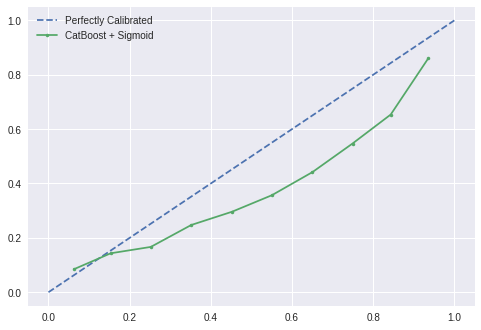

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[5]], d2_other_cat[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','CatBoost + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_catd1_other,'calib_catd1_other.sav')
files.download('calib_catd1_other.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 5 - Classsifier 5 - SGD with Random Search and Calibration on Gratitude Class

In [ ]:
sgd = SGDClassifier()

sgd_params = {'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
              'penalty': ['l2', 'l1', 'elasticnet'],
              'learning_rate': ['adaptive', 'optimal', 'invscaling', 'constant'],
              'early_stopping':[True, False],
              'validation_fraction':[0.4,0.3,0.2,0.1],
              'eta0' : [random.uniform(0,1)],
              }
sgd_random = RandomizedSearchCV(sgd, param_distributions=sgd_params, scoring='roc_auc',random_state=42, refit=True,cv=5,n_jobs=-1)
sgd_random.fit(train_d1_k4, y_d1_k4[cols[5]])

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SGDClassifier(alpha=0.0001, average=False,
                                           class_weight=None,
                                           early_stopping=False, epsilon=0.1,
                                           eta0=0.0, fit_intercept=True,
                                           l1_ratio=0.15,
                                           learning_rate='optimal',
                                           loss='hinge', max_iter=1000,
                                           n_iter_no_change=5, n_jobs=None,
                                           penalty='l2', power_t=0.5,
                                           random_state=None, shuffle=True,
                                           tol=0.001, validation_fractio...
                   param_distributions={'early_stopping': [True, False],
                                        'eta0': [0.27783810071780357],
                                 

In [ ]:
sgd_random.best_params_

{'early_stopping': False,
 'eta0': 0.27783810071780357,
 'learning_rate': 'invscaling',
 'loss': 'modified_huber',
 'penalty': 'elasticnet',
 'validation_fraction': 0.2}

In [ ]:
sgd_random.best_score_

0.5166842683291837

In [ ]:
calib_sgdd1_other = CalibratedClassifierCV(SGDClassifier(**sgd_random.best_params_, random_state=42), method='sigmoid', cv=3)
calib_sgdd1_other.fit(train_d1_k4, y_d1_k4[cols[5]])

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=0.0001, average=False,
                                                    class_weight=None,
                                                    early_stopping=False,
                                                    epsilon=0.1,
                                                    eta0=0.27783810071780357,
                                                    fit_intercept=True,
                                                    l1_ratio=0.15,
                                                    learning_rate='invscaling',
                                                    loss='modified_huber',
                                                    max_iter=1000,
                                                    n_iter_no_change=5,
                                                    n_jobs=None,
                                                    penalty='elasticnet',
                                                    power_t

In [ ]:
d2_other_sgd = calib_sgdd1_other.predict_proba(train_d2)

In [ ]:
d2_othersgd_roc = roc_auc_score(y_d2[cols[5]], d2_other_sgd[:,1], average='micro')
d2_othersgd_f1 = f1_score(y_d2[cols[5]], np.round(d2_other_sgd[:,1]), average='micro')
d2_othersgd_hamm = hamming_loss(y_d2[cols[5]], np.round(d2_other_sgd[:,1]))
d2_othersgd_brier = brier_score_loss(y_d2[cols[5]], d2_other_sgd[:,1])

print(f'\nROC d2 Other: {d2_othersgd_roc}')
print(f'\nF1 d2 Other: {d2_othersgd_f1}')
print(f'\nHamming Loss d2 Other: {d2_othersgd_hamm}')
print(f'\nBrier Loss d2 Other: {d2_othersgd_brier}')


ROC d2 Other: 0.5224660893315395

F1 d2 Other: 0.5972552124571127

Hamming Loss d2 Other: 0.4027447875428873

Brier Loss d2 Other: 0.2401871679068028


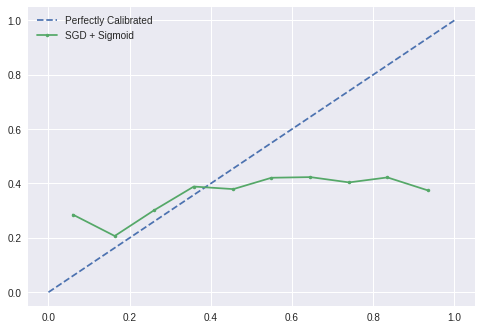

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[5]], d2_other_sgd[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SGD + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_sgdd1_other, 'calib_sgdd1_other.sav')
files.download('calib_sgdd1_other.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 6 - Classifier 6 - SVM with RBF kernel with RandomSearch and Calibration

In [ ]:
svm = SVC(kernel='rbf')

In [ ]:
cols = y_train_multi.columns

In [ ]:


svm_params = {'C': [1e-3,1e-2,1e-1,0,1,10,100],
              'degree':[i for i in range(1,5)],
              'probability':[True, False],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1],
              }
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params,verbose=3, scoring='roc_auc',refit=True,cv=5,n_jobs=-1)
svm_random.fit(train_d1_k5, y_d1_k5[cols[5]])

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:  9.1min finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight=None, coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [0.001, 0.01, 0.1, 0, 1, 10, 100],
                                        'degree': [1, 2, 3, 4],
                                        'probability': [True, False],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispatch='2*n_jobs', random_state=None, refit=True,
                   return_train_s

In [ ]:
svm_random.best_params_

{'C': 10, 'degree': 1, 'probability': False, 'shrinking': False, 'tol': 0.001}

In [ ]:
svm_random.best_score_

0.5669235650464364

In [ ]:
cols = y_train_multi.columns

In [ ]:
calib_svmrbf_d1_other = CalibratedClassifierCV(SVC(**svm_random.best_params_), method='sigmoid', cv=3)
calib_svmrbf_d1_other.fit(train_d1_k5, y_d1_k5[cols[5]])

CalibratedClassifierCV(base_estimator=SVC(C=10, break_ties=False,
                                          cache_size=200, class_weight=None,
                                          coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=1, gamma='scale', kernel='rbf',
                                          max_iter=-1, probability=False,
                                          random_state=None, shrinking=False,
                                          tol=0.001, verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_other_svmrbf = calib_svmrbf_d1_other.predict_proba(train_d2)

In [ ]:
d2_other_svmrbf_roc = roc_auc_score(y_d2[cols[5]], d2_other_svmrbf[:,1], average='micro')
d2_other_svmrbf_f1 = f1_score(y_d2[cols[5]], np.round(d2_other_svmrbf[:,1]), average='micro')
d2_other_svmrbf_hamm = hamming_loss(y_d2[cols[5]], np.round(d2_other_svmrbf[:,1]))
d2_other_svmrbf_brier = brier_score_loss(y_d2[cols[5]], d2_other_svmrbf[:,1])

print(f'\nROC d2 Other: {d2_other_svmrbf_roc}')
print(f'\nF1 d2 Other: {d2_other_svmrbf_f1}')
print(f'\nHamming Loss d2 Other: {d2_other_svmrbf_hamm}')
print(f'\nBrier Loss d2 Other: {d2_other_svmrbf_brier}')


ROC d2 Other: 0.5697974684204095

F1 d2 Other: 0.5997624703087886

Hamming Loss d2 Other: 0.4002375296912114

Brier Loss d2 Other: 0.23750463508316005


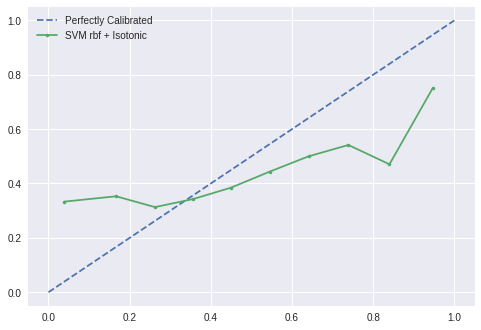

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[5]], d2_other_svmrbf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM rbf + Isotonic'])
plt.show()

In [ ]:
from google.colab import files
joblib.dump(calib_svmrbf_d1_other, 'calib_svmrbf_d1_other.sav')
files.download('calib_svmrbf_d1_other.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Class 6 - Classifier 7 - SVM with randomsearch and calibration 

In [ ]:
svm = SVC(class_weight='balanced')

In [ ]:
svm_params = {'kernel': ['poly','sigmoid', 'linear'],
              'C': [1e-3,1e-2,1e-1,0,1,10,100],
              'degree':[i for i in range(1,5)],
              'probability':[True],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1]}
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, verbose=3, random_state=42, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k6, y_d1_k6[cols[5]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  6.0min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight='balanced', coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [0.001, 0.01, 0.1, 0, 1, 10, 100],
                                        'degree': [1, 2, 3, 4],
                                        'kernel': ['poly', 'sigmoid', 'linear'],
                                        'probability': [True],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispa

In [ ]:
svm_random.best_params_

{'C': 10,
 'degree': 1,
 'kernel': 'poly',
 'probability': True,
 'shrinking': True,
 'tol': 0.001}

In [ ]:
calib_svm_d1_other = CalibratedClassifierCV(SVC(**svm_random.best_params_, class_weight='balanced'), method='sigmoid', cv=3)
calib_svm_d1_other.fit(train_d1_k6, y_d1_k6[cols[5]])

CalibratedClassifierCV(base_estimator=SVC(C=10, break_ties=False,
                                          cache_size=200,
                                          class_weight='balanced', coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=1, gamma='scale',
                                          kernel='poly', max_iter=-1,
                                          probability=True, random_state=None,
                                          shrinking=True, tol=0.001,
                                          verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_svm_other = calib_svm_d1_other.predict_proba(train_d2)

In [ ]:
d2_svmother_roc = roc_auc_score(y_d2[cols[5]], d2_svm_other[:,1], average='micro')
d2_svmother_f1 = f1_score(y_d2[cols[5]], np.round(d2_svm_other[:,1]), average='micro')
d2_svmother_hamm = hamming_loss(y_d2[cols[5]], np.round(d2_svm_other[:,1]))
d2_svmother_brier = brier_score_loss(y_d2[cols[5]], d2_svm_other[:,1])

print(f'\nROC d2 Other: {d2_svmother_roc}')
print(f'\nF1 d2 Other: {d2_svmother_f1}')
print(f'\nHamming Loss d2 Other: {d2_svmother_hamm}')
print(f'\nBrier Loss d2 Other: {d2_svmother_brier}')


ROC d2 Other: 0.5253054436026824

F1 d2 Other: 0.5972552124571127

Hamming Loss d2 Other: 0.4027447875428873

Brier Loss d2 Other: 0.24022948230067886


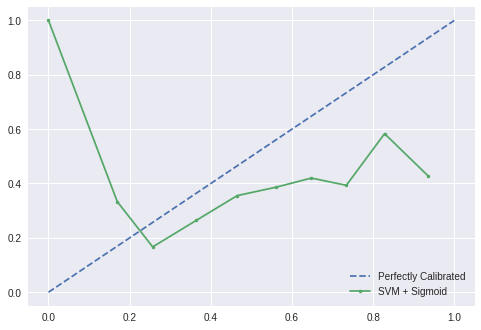

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[5]], d2_svm_other[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_svm_d1_other, 'calib_svm_d1_other.sav')
files.download('calib_svm_d1_other.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#!gdown --id '1uQRLi6CAD19AHUfyEuJRg0cmwIcKG_A_'
#!unzip 'greet stacked.zip' -d '/content/'

In [ ]:
calib_catd1_other = joblib.load('calib_catd1_other.sav')
calib_d1_otherrf = joblib.load('calib_d1_otherrf.sav')
calib_d1xgb_other = joblib.load('calib_d1xgb_other.sav')
calib_dtc_other = joblib.load('calib_dtc_other.sav')
calib_sgdd1_other = joblib.load('calib_sgdd1_other.sav')
calib_svm_d1_other = joblib.load('calib_svm_d1_other.sav')
calib_svmrbf_d1_other = joblib.load('calib_svmrbf_d1_other.sav')

In [ ]:
d2other_cat = calib_catd1_other.predict_proba(train_d2)[:,1]
d2other_rf = calib_d1_otherrf.predict_proba(train_d2)[:,1]
d2other_xgb = calib_d1xgb_other.predict_proba(train_d2)[:,1]
d2other_dtc = calib_dtc_other.predict_proba(train_d2)[:,1]
d2other_sgd = calib_sgdd1_other.predict_proba(train_d2)[:,1]
d2other_svm = calib_svm_d1_other.predict_proba(train_d2)[:,1]
d2other_svmrbf = calib_svmrbf_d1_other.predict_proba(train_d2)[:,1]

In [ ]:
d2other_meta = np.hstack((d2other_cat.reshape(-1,1), d2other_rf.reshape(-1,1), d2other_xgb.reshape(-1,1), d2other_dtc.reshape(-1,1),
                         d2other_sgd.reshape(-1,1), d2other_svm.reshape(-1,1), d2other_svmrbf.reshape(-1,1)))

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from scipy.stats import loguniform

meta_model5 = LogisticRegression(class_weight='balanced')
# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)
# define search
search = RandomizedSearchCV(meta_model5, space,verbose=2, n_iter=50, refit=True, scoring='roc_auc', n_jobs=-1, cv=cv, random_state=42)
# execute search
result = search.fit(d2other_meta, y_d2[cols[5]])
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Fitting 30 folds for each of 50 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.5s


Best Score: 0.7438184891387383
Best Hyperparameters: {'C': 63.38473335975546, 'penalty': 'l2', 'solver': 'newton-cg'}


[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed:    8.5s finished


In [ ]:
calib_meta2_lrother = CalibratedClassifierCV(LogisticRegression(**search.best_params_, class_weight='balanced'), method='sigmoid', cv=10)
calib_meta2_lrother.fit(d2other_meta, y_d2[cols[5]])

CalibratedClassifierCV(base_estimator=LogisticRegression(C=63.38473335975546,
                                                         class_weight='balanced',
                                                         dual=False,
                                                         fit_intercept=True,
                                                         intercept_scaling=1,
                                                         l1_ratio=None,
                                                         max_iter=100,
                                                         multi_class='auto',
                                                         n_jobs=None,
                                                         penalty='l2',
                                                         random_state=None,
                                                         solver='newton-cg',
                                                         tol=0.0001, verbose=0,
                      

In [ ]:
d2_meta_other = calib_meta2_lrother.predict_proba(d2other_meta)

In [ ]:
d2other_meta_roc = roc_auc_score(y_d2[cols[5]], d2_meta_other[:,1], average='micro')
d2other_meta_f1 = f1_score(y_d2[cols[5]], np.round(d2_meta_other[:,1]), average='micro')
d2other_meta_hamm = hamming_loss(y_d2[cols[5]], np.round(d2_meta_other[:,1]))
d2other_meta_brier = brier_score_loss(y_d2[cols[5]], d2_meta_other[:,1])

print(f'\nROC d2 Other: {d2other_meta_roc}')
print(f'\nF1 d2 Other: {d2other_meta_f1}')
print(f'\nHamming Loss d2 Other: {d2other_meta_hamm}')
print(f'\nBrier Loss d2 Other: {d2other_meta_brier}')


ROC d2 Other: 0.7444726667357786

F1 d2 Other: 0.6946423858537872

Hamming Loss d2 Other: 0.3053576141462127

Brier Loss d2 Other: 0.19702430192714132


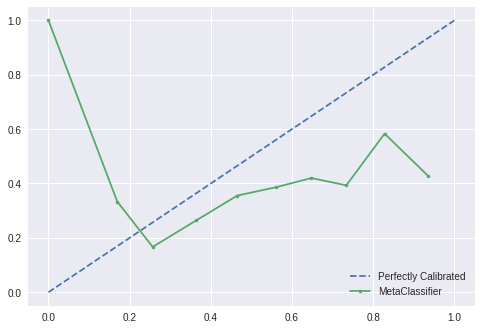

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fraction_of_positives, mean_predicted_values = calibration_curve(y_d2[cols[5]], d2_meta_other[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','MetaClassifier'])
plt.show()

In [ ]:
joblib.dump(calib_meta2_lrother, 'calib_meta2_lrother.sav')
files.download('calib_meta2_lrother.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Express Emotion Class - Stacking Classifier


#### Class 6, Classifier 1 - Decision Tree w/ RandomizedSearch, Pruning and Calibration on Justification Class

In [ ]:
print(f'Greeting Class samples: {np.count_nonzero(y_d1_k0[cols[0]].values==1)}')
print(f'Backstory Class samples: {np.count_nonzero(y_d1_k0[cols[1]].values==1)}')
print(f'Justification Class samples: {np.count_nonzero(y_d1_k0[cols[2]].values==1)}')
print(f'Rant Class samples: {np.count_nonzero(y_d1_k0[cols[3]].values==1)}')
print(f'Gratitude Class samples: {np.count_nonzero(y_d1_k0[cols[4]].values==1)}')
print(f'Other Class samples: {np.count_nonzero(y_d1_k0[cols[5]].values==1)}')
print(f'Express Emotion Class samples: {np.count_nonzero(y_d1_k0[cols[6]].values==1)}')

Greeting Class samples: 1528
Backstory Class samples: 4115
Justification Class samples: 157
Rant Class samples: 521
Gratitude Class samples: 1069
Other Class samples: 3050
Express Emotion Class samples: 231


In [ ]:
dtc = DecisionTreeClassifier(class_weight='balanced')

random_grid = {'splitter': ['best', 'random'],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'criterion': ['gini', 'entropy']
               }

dtc_random = RandomizedSearchCV(estimator = dtc, param_distributions = random_grid, scoring='roc_auc',
                               n_iter = 50, cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
dtc_random.fit(train_d1_k0, y_d1_k0[cols[6]])

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    1.9s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                    class_weight='balanced',
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features=None,
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    presort='deprecated',
                                                    random_state=None,
    

In [ ]:
dtc_random.best_params_

{'criterion': 'gini',
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'splitter': 'best'}

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

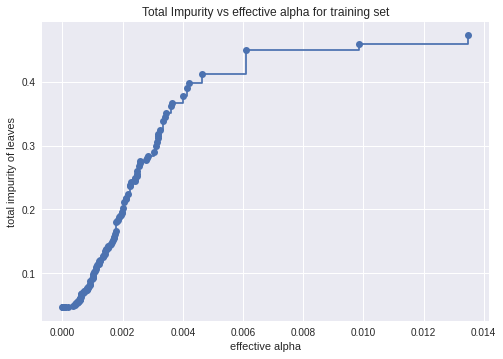

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_, class_weight='balanced')
path =dtc_.cost_complexity_pruning_path(train_d1_k0, y_d1_k0[cols[6]])
ccp_alphas, impurities = path.ccp_alphas, path.impurities
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(**dtc_random.best_params_,class_weight='balanced', ccp_alpha=ccp_alpha)
    clf.fit(train_d1_k0, y_d1_k0[cols[6]])
    clfs.append(clf)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.027282436443415103


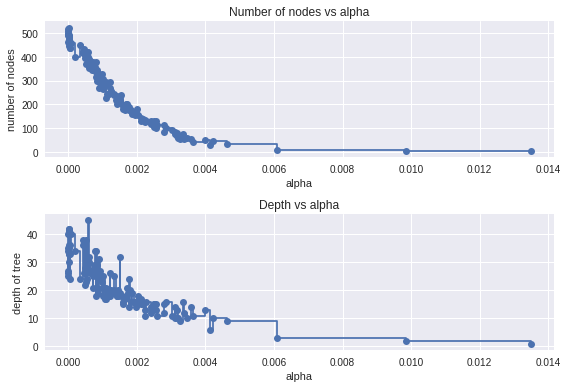

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()


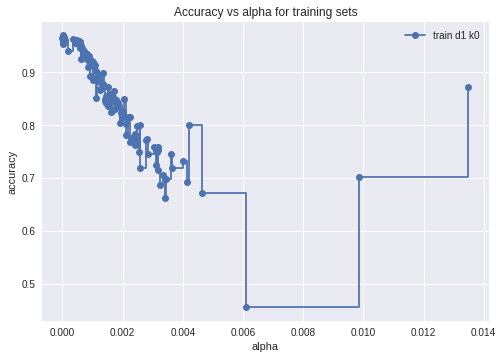

In [ ]:
# Ref: https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html#sphx-glr-auto-examples-tree-plot-cost-complexity-pruning-py
train_scores = [clf.score(train_d1_k0, y_d1_k0[cols[6]]) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train d1 k0",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [ ]:
ccp_alphas[np.argmax(train_scores)]

8.21200890053559e-06

In [ ]:
dtc_ = DecisionTreeClassifier(**dtc_random.best_params_, class_weight='balanced',ccp_alpha=ccp_alphas[np.argmax(train_scores)])
calib_dtc_expemo = CalibratedClassifierCV(dtc_, method='sigmoid', cv=20)
calib_dtc_expemo.fit(train_d1_k0, y_d1_k0[cols[6]])

CalibratedClassifierCV(base_estimator=DecisionTreeClassifier(ccp_alpha=8.21200890053559e-06,
                                                             class_weight='balanced',
                                                             criterion='gini',
                                                             max_depth=None,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=10,
                                                             min_weight_fraction_leaf=0.0,
                                                             presort='de

In [ ]:
d2_expemo_dtc = calib_dtc_expemo.predict_proba(train_d2)

In [ ]:
d2_expemo_roc = roc_auc_score(y_d2[cols[6]], d2_expemo_dtc[:,1], average='micro')
d2_expemo_f1 = f1_score(y_d2[cols[6]], np.round(d2_expemo_dtc[:,1]), average='micro')
d2_expemo_hamm = hamming_loss(y_d2[cols[6]], np.round(d2_expemo_dtc[:,1]))
d2_expemo_brier = brier_score_loss(y_d2[cols[6]], d2_expemo_dtc[:,1])

print(f'\nROC d2 Express Emotion: {d2_expemo_roc}')
print(f'\nF1 d2 Express Emotion: {d2_expemo_f1}')
print(f'\nHamming Loss d2 Express Emotion: {d2_expemo_hamm}')
print(f'\nBrier Loss d2 Express Emotion: {d2_expemo_brier}')


ROC d2 Express Emotion: 0.7046622508652585

F1 d2 Express Emotion: 0.9699129057798892

Hamming Loss d2 Express Emotion: 0.030087094220110848

Brier Loss d2 Express Emotion: 0.028846465882663496


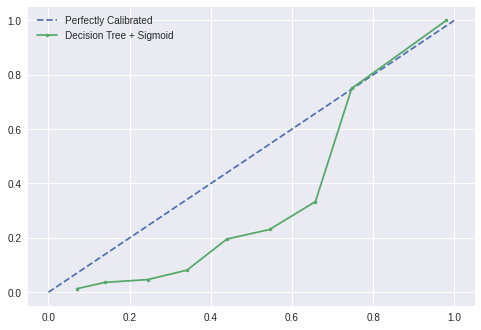

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[6]], d2_expemo_dtc[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Decision Tree + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_dtc_expemo, 'calib_dtc_expemo.sav')

['calib_dtc_expemo.sav']

In [ ]:
from google.colab import files
files.download('calib_dtc_expemo.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 6 Classifier 2 - Random Forest with Random Search and Calibration

In [ ]:
rf = RandomForestClassifier(n_jobs=-1, class_weight='balanced')

In [ ]:
random_grid = {'bootstrap': [True, False],
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110],
               'max_features': ['auto', 'sqrt'],
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10],
               'n_estimators': [130, 180, 230],
               'criterion': ['gini', 'entropy']}

rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, scoring='roc_auc',
                                cv = 3,refit=True, verbose=3, random_state=42, n_jobs = -1)

In [ ]:
rf_random.fit(train_d1_k1, y_d1_k1[cols[6]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   45.6s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight='balanced',
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
         

In [ ]:
rf_random.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': 50,
 'max_features': 'sqrt',
 'min_samples_leaf': 4,
 'min_samples_split': 5,
 'n_estimators': 230}

In [ ]:
rf_ = RandomForestClassifier(**rf_random.best_params_,class_weight='balanced', n_jobs=-1)
calib_d1_expemorf = CalibratedClassifierCV(rf_, method='sigmoid', cv=3)
calib_d1_expemorf.fit(train_d1_k1, y_d1_k1[cols[6]])

CalibratedClassifierCV(base_estimator=RandomForestClassifier(bootstrap=True,
                                                             ccp_alpha=0.0,
                                                             class_weight='balanced',
                                                             criterion='entropy',
                                                             max_depth=50,
                                                             max_features='sqrt',
                                                             max_leaf_nodes=None,
                                                             max_samples=None,
                                                             min_impurity_decrease=0.0,
                                                             min_impurity_split=None,
                                                             min_samples_leaf=4,
                                                             min_samples_split=5,
                        

In [ ]:
d2_expemo_rf = calib_d1_expemorf.predict_proba(train_d2)

In [ ]:
d2_expemorf_roc = roc_auc_score(y_d2[cols[6]], d2_expemo_rf[:,1], average='micro')
d2_expemorf_f1 = f1_score(y_d2[cols[6]], np.round(d2_expemo_rf[:,1]), average='micro')
d2_expemorf_hamm = hamming_loss(y_d2[cols[6]], np.round(d2_expemo_rf[:,1]))
d2_expemorf_brier = brier_score_loss(y_d2[cols[6]], d2_expemo_rf[:,1])

print(f'\nROC d2 Express Emotion: {d2_expemorf_roc}')
print(f'\nF1 d2 Express Emotion: {d2_expemorf_f1}')
print(f'\nHamming Loss d2 Express Emotion: {d2_expemorf_hamm}')
print(f'\nBrier Loss d2 Express Emotion: {d2_expemorf_brier}')


ROC d2 Express Emotion: 0.8435851533595894

F1 d2 Express Emotion: 0.9708366323568224

Hamming Loss d2 Express Emotion: 0.029163367643177618

Brier Loss d2 Express Emotion: 0.026478138866242076


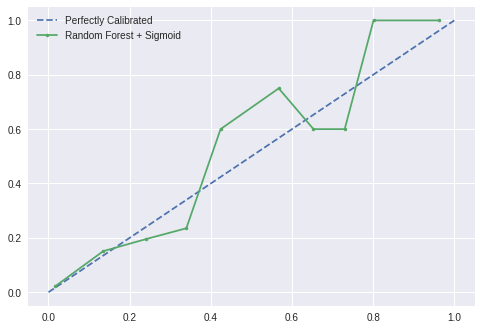

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[6]], d2_expemo_rf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','Random Forest + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_d1_expemorf, 'calib_d1_expemorf.sav')

['calib_d1_expemorf.sav']

In [ ]:
from google.colab import files
files.download('calib_d1_expemorf.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import hyperopt as hp

#### Class 7 Classifier 3 - XGBoost w/ Hyperopt and Calibration

In [ ]:
xgb = XGBClassifier(n_thread=-1)

In [ ]:
from hyperopt import hp, fmin, tpe

In [ ]:

# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin
cols = y_train_multi.columns
def hyperopt_objective(params):
    print(params)
    model = XGBClassifier(**params, n_thread=-1, random_state=42)
    model.fit(train_d1_k2,y_d1_k2[cols[6]])
    y_pred = model.predict_proba(train_d2)
    score=roc_auc_score(y_d2[cols[6]],y_pred[:,1], average='micro')
    return -score

space = {
        'n_estimators': hp.choice('n_estimators', [100, 200,300,400]),
        'eta': hp.choice('eta', [0.025, 0.5, 0.025]),
         'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
        'max_depth':  hp.choice('max_depth', [i for i in range(1, 14)]),
        'min_child_weight': hp.choice('min_child_weight', [1, 6, 1]),
        'subsample': hp.choice('subsample', [0.5, 1, 0.05]),
        'gamma': hp.choice('gamma', [0.5, 1, 0.05]),
        'colsample_bytree': hp.choice('colsample_bytree', [0.5, 1, 0.05]),
         'reg_lambda'  : hp.choice('reg_lambda',[2,5]),
         'learning_rate': hp.choice('learning_rate',[0.1, 0.4, 0.5, 0.7,0.8,0.9])}


best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=10,
    rstate=np.random.RandomState(seed=123))

{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 6, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 0.05, 'eta': 0.5, 'gamma': 1, 'learning_rate': 0.5, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.5}
{'colsample_bytree': 1, 'eta': 0.5, 'gamma': 0.5, 'learning_rate': 0.1, 'max_depth': 12, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 99, 'subsample': 0.05}
{'colsample_bytree': 0.5, 'eta': 0.025, 'gamma': 0.05, 'learning_rate': 0.7, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 300, 'reg_lambda': 2, 'scale_pos_weight': 1, 'subsample': 0.05}
{'colsample_bytree': 0.05, 'eta': 0.025, 'gamma': 0.5, 'learning_rate': 0.9, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 400, 'reg_lambda': 5, 'scale_pos_weight': 1000, 'subsample': 0.05}
{'colsample_bytree': 0.05, '

In [ ]:
def get_params_space(params):
  space_dict = {
        'n_estimators': [100, 200,300,400],
        'eta': [0.025, 0.5, 0.025],
        'max_depth':  [i for i in range(1, 14)],
        'min_child_weight': [1, 6, 1],
        'subsample': [0.5, 1, 0.05],
        'gamma': [0.5, 1, 0.05],
        'colsample_bytree': [0.5, 1, 0.05],
         'reg_lambda'  : [2,5],
         'learning_rate': [0.1, 0.4, 0.5, 0.7,0.8,0.9],
         'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]}
  param_dict = dict()
  for key in params.keys():
    if key in space_dict.keys():
      get_list = space_dict.get(key)
      param_dict[key] = get_list[params.get(key)]
  return param_dict

In [ ]:
xgb_d1_best = get_params_space(best)
print(xgb_d1_best)

{'colsample_bytree': 1, 'eta': 0.025, 'gamma': 1, 'learning_rate': 0.1, 'max_depth': 8, 'min_child_weight': 1, 'n_estimators': 100, 'reg_lambda': 2, 'scale_pos_weight': 50, 'subsample': 1}


In [ ]:
calib_d1xgb_expemo= CalibratedClassifierCV(XGBClassifier(**xgb_d1_best, n_thread=-1), method='sigmoid', cv=3)
calib_d1xgb_expemo.fit(train_d1_k2, y_d1_k2[cols[6]])

CalibratedClassifierCV(base_estimator=XGBClassifier(base_score=0.5,
                                                    booster='gbtree',
                                                    colsample_bylevel=1,
                                                    colsample_bynode=1,
                                                    colsample_bytree=1,
                                                    eta=0.025, gamma=1,
                                                    learning_rate=0.1,
                                                    max_delta_step=0,
                                                    max_depth=8,
                                                    min_child_weight=1,
                                                    missing=None,
                                                    n_estimators=100, n_jobs=1,
                                                    n_thread=-1, nthread=None,
                                                    objective='binary:

In [ ]:
d2_expemo_xgb = calib_d1xgb_expemo.predict_proba(train_d2)

In [ ]:
d2_expemoxgb_roc = roc_auc_score(y_d2[cols[6]], d2_expemo_xgb[:,1], average='micro')
d2_expemoxgb_f1 = f1_score(y_d2[cols[6]], np.round(d2_expemo_xgb[:,1]), average='micro')
d2_expemoxgb_hamm = hamming_loss(y_d2[cols[6]], np.round(d2_expemo_xgb[:,1]))
d2_expemoxgb_brier = brier_score_loss(y_d2[cols[6]], d2_expemo_xgb[:,1])

print(f'\nROC d2 Express Emotion: {d2_expemoxgb_roc}')
print(f'\nF1 d2 Express Emotion: {d2_expemoxgb_f1}')
print(f'\nHamming Loss d2 Express Emotion: {d2_expemoxgb_hamm}')
print(f'\nBrier Loss d2 Express Emotion: {d2_expemoxgb_brier}')


ROC d2 Express Emotion: 0.8334634204559017

F1 d2 Express Emotion: 0.9716283979941938

Hamming Loss d2 Express Emotion: 0.028371602005806282

Brier Loss d2 Express Emotion: 0.026263705423041715


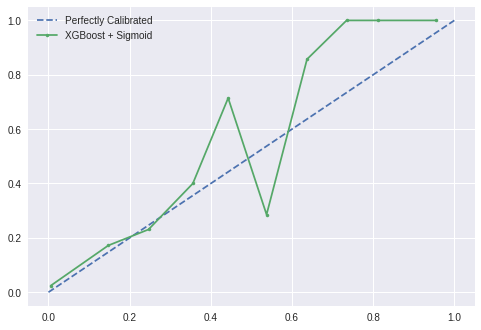

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[6]], d2_expemo_xgb[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','XGBoost + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_d1xgb_expemo, 'calib_d1xgb_expemo.sav')
files.download('calib_d1xgb_expemo.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from catboost.utils import eval_metric

#### Class 7 - Classifier 4 - CatBoost with Hyperopt and Calibration

In [ ]:
train_pool = catboost.Pool(train_d1_k3, y_d1_k3[cols[6]])

In [ ]:
# Ref: https://github.com/hyperopt/hyperopt/wiki/FMin

def hyperopt_objective(params):
    print(params)
    model = catboost.CatBoostClassifier(**params, task_type='GPU')
    model.fit(train_pool)
    y_pred = model.predict_proba(train_d2)
    return -eval_metric(y_d2[cols[6]], y_pred[:, 1], 'AUC')[0]

space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.1),
    'depth': hp.choice('depth', [3, 10]),
    'scale_pos_weight':hp.choice('scale_pos_weight',[1, 10, 25, 50, 75, 99, 100, 1000]),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'boosting_type': hp.choice('boosting_type', ['Ordered', 'Plain']),
    'max_ctr_complexity': hp.choice('max_ctr_complexity', [0, 8])}

best = fmin(hyperopt_objective,
    space=space,
    algo=tpe.suggest,
    max_evals=5,
    rstate=np.random.RandomState(seed=123))

Streaming output truncated to the last 5000 lines.
5:	learn: 0.6019973	total: 95.2ms	remaining: 15.8s
6:	learn: 0.5888679	total: 111ms	remaining: 15.7s
7:	learn: 0.5770665	total: 126ms	remaining: 15.7s
8:	learn: 0.5678676	total: 142ms	remaining: 15.6s
9:	learn: 0.5572542	total: 158ms	remaining: 15.6s
10:	learn: 0.5490966	total: 173ms	remaining: 15.6s
11:	learn: 0.5426683	total: 190ms	remaining: 15.6s
12:	learn: 0.5335737	total: 205ms	remaining: 15.6s
13:	learn: 0.5273654	total: 221ms	remaining: 15.6s
14:	learn: 0.5222601	total: 237ms	remaining: 15.5s
15:	learn: 0.5127801	total: 252ms	remaining: 15.5s
16:	learn: 0.5079167	total: 267ms	remaining: 15.4s
17:	learn: 0.5040629	total: 282ms	remaining: 15.4s
18:	learn: 0.5006631	total: 297ms	remaining: 15.3s
19:	learn: 0.4971198	total: 312ms	remaining: 15.3s
20:	learn: 0.4928588	total: 326ms	remaining: 15.2s
21:	learn: 0.4896868	total: 341ms	remaining: 15.2s
22:	learn: 0.4836355	total: 357ms	remaining: 15.2s
23:	learn: 0.4806525	total: 372ms	r

In [ ]:
def get_space(space_params):
  space = {
    'learning_rate': [0.01, 0.1],
    'depth': [3, 10],
    'l2_leaf_reg': [1, 10],
    'boosting_type': ['Ordered', 'Plain'],
    'max_ctr_complexity':  [0, 8],
    'scale_pos_weight':[1, 10, 25, 50, 75, 99, 100, 1000]
    }

  param_dict = dict()
  for key in space_params.keys():
    if isinstance(space_params.get(key), float):
      param_dict[key] = space_params.get(key)
    else:
      get_list = space_params.get(key)
      param_dict[key] = space.get(key)[get_list]
  return param_dict

In [ ]:
cat_d1_best = get_space(best)
print(cat_d1_best)

{'boosting_type': 'Plain', 'depth': 10, 'l2_leaf_reg': 8.527981223754098, 'learning_rate': 0.07867792270156927, 'max_ctr_complexity': 0, 'scale_pos_weight': 1000}


In [ ]:
calib_catd1_expemo = CalibratedClassifierCV(catboost.CatBoostClassifier(**cat_d1_best, task_type="CPU"), method='sigmoid', cv=3)
calib_catd1_expemo.fit(train_d1_k3, y_d1_k3[cols[6]])

0:	learn: 0.5752618	total: 301ms	remaining: 5m
1:	learn: 0.4823498	total: 565ms	remaining: 4m 41s
2:	learn: 0.4087770	total: 834ms	remaining: 4m 37s
3:	learn: 0.3513658	total: 1.1s	remaining: 4m 34s
4:	learn: 0.3062229	total: 1.37s	remaining: 4m 32s
5:	learn: 0.2688256	total: 1.63s	remaining: 4m 30s
6:	learn: 0.2410647	total: 1.9s	remaining: 4m 29s
7:	learn: 0.2192268	total: 2.18s	remaining: 4m 29s
8:	learn: 0.1997200	total: 2.45s	remaining: 4m 29s
9:	learn: 0.1854423	total: 2.72s	remaining: 4m 28s
10:	learn: 0.1737994	total: 2.98s	remaining: 4m 28s
11:	learn: 0.1649103	total: 3.25s	remaining: 4m 27s
12:	learn: 0.1574755	total: 3.51s	remaining: 4m 26s
13:	learn: 0.1515944	total: 3.79s	remaining: 4m 26s
14:	learn: 0.1461485	total: 4.05s	remaining: 4m 26s
15:	learn: 0.1400105	total: 4.32s	remaining: 4m 25s
16:	learn: 0.1362239	total: 4.58s	remaining: 4m 25s
17:	learn: 0.1336057	total: 4.86s	remaining: 4m 25s
18:	learn: 0.1313134	total: 5.13s	remaining: 4m 24s
19:	learn: 0.1294396	total: 

CalibratedClassifierCV(base_estimator=<catboost.core.CatBoostClassifier object at 0x7f50b30235d0>,
                       cv=3, method='sigmoid')

In [ ]:
calib_catd1_expemo.base_estimator.get_params(deep=True)

{'boosting_type': 'Plain',
 'depth': 10,
 'l2_leaf_reg': 8.527981223754098,
 'learning_rate': 0.07867792270156927,
 'max_ctr_complexity': 0,
 'scale_pos_weight': 1000,
 'task_type': 'CPU'}

In [ ]:
d2_expemo_cat = calib_catd1_expemo.predict_proba(train_d2)

In [ ]:
d2_expemocat_roc = roc_auc_score(y_d2[cols[6]], d2_expemo_cat[:,1], average='micro')
d2_expemocat_f1 = f1_score(y_d2[cols[6]], np.round(d2_expemo_cat[:,1]), average='micro')
d2_expemocat_hamm = hamming_loss(y_d2[cols[6]], np.round(d2_expemo_cat[:,1]))
d2_expemocat_brier = brier_score_loss(y_d2[cols[6]], d2_expemo_cat[:,1])

print(f'\nROC d2 Express Emotion: {d2_expemocat_roc}')
print(f'\nF1 d2 Express Emotion: {d2_expemocat_f1}')
print(f'\nHamming Loss d2 Express Emotion: {d2_expemocat_hamm}')
print(f'\nBrier Loss d2 Express Emotion: {d2_expemocat_brier}')


ROC d2 Express Emotion: 0.7575862274734454

F1 d2 Express Emotion: 0.9699129057798892

Hamming Loss d2 Express Emotion: 0.030087094220110848

Brier Loss d2 Express Emotion: 0.028266595930127224


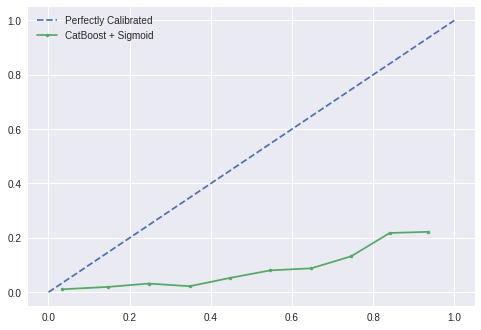

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[6]], d2_expemo_cat[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','CatBoost + Sigmoid'])
plt.show()

In [ ]:
joblib.dump(calib_catd1_expemo,'calib_catd1_expemo.sav')
files.download('calib_catd1_expemo.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 7 - Classsifier 5 - SGD with Random Search and Calibration on Gratitude Class

In [ ]:
import random

In [ ]:
sgd = SGDClassifier(random_state=42)
cols = y_train_multi.columns
sgd_params = {'loss': ['hinge', 'log', 'modified_huber', 'squared_hinge', 'perceptron'],
              'penalty': ['l2', 'l1', 'elasticnet'],
              'learning_rate': ['adaptive', 'optimal', 'invscaling', 'constant'],
              'early_stopping':[True, False],
              'validation_fraction':[0.4,0.3,0.2,0.1],
              'eta0' : [random.uniform(0,1)],
              }
sgd_random = RandomizedSearchCV(sgd, param_distributions=sgd_params, n_iter=50, scoring='accuracy',random_state=42, refit=True,cv=5,n_jobs=-1)
sgd_random.fit(train_d1_k4, y_d1_k4[cols[6]])

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=SGDClassifier(alpha=0.0001, average=False,
                                           class_weight=None,
                                           early_stopping=False, epsilon=0.1,
                                           eta0=0.0, fit_intercept=True,
                                           l1_ratio=0.15,
                                           learning_rate='optimal',
                                           loss='hinge', max_iter=1000,
                                           n_iter_no_change=5, n_jobs=None,
                                           penalty='l2', power_t=0.5,
                                           random_state=42, shuffle=True,
                                           tol=0.001, validation_fraction=...
                   param_distributions={'early_stopping': [True, False],
                                        'eta0': [0.02935058633755805],
                                 

In [ ]:
sgd_random.best_params_

{'early_stopping': True,
 'eta0': 0.02935058633755805,
 'learning_rate': 'optimal',
 'loss': 'log',
 'penalty': 'l1',
 'validation_fraction': 0.3}

In [ ]:
sgd_random.best_score_

0.9696489807292075

In [ ]:
calib_sgdd1_expemo = CalibratedClassifierCV(SGDClassifier(**sgd_random.best_params_), method='sigmoid', cv=3)
calib_sgdd1_expemo.fit(train_d1_k4, y_d1_k4[cols[6]])

CalibratedClassifierCV(base_estimator=SGDClassifier(alpha=0.0001, average=False,
                                                    class_weight=None,
                                                    early_stopping=True,
                                                    epsilon=0.1,
                                                    eta0=0.02935058633755805,
                                                    fit_intercept=True,
                                                    l1_ratio=0.15,
                                                    learning_rate='optimal',
                                                    loss='log', max_iter=1000,
                                                    n_iter_no_change=5,
                                                    n_jobs=None, penalty='l1',
                                                    power_t=0.5,
                                                    random_state=None,
                                                  

In [ ]:
d2_expemo_sgd = calib_sgdd1_expemo.predict_proba(train_d2)

In [ ]:
d2_expemosgd_roc = roc_auc_score(y_d2[cols[6]], d2_expemo_sgd[:,1], average='micro')
d2_expemosgd_f1 = f1_score(y_d2[cols[6]], np.round(d2_expemo_sgd[:,1]), average='micro')
d2_expemosgd_hamm = hamming_loss(y_d2[cols[6]], np.round(d2_expemo_sgd[:,1]))
d2_expemosgd_brier = brier_score_loss(y_d2[cols[6]], d2_expemo_sgd[:,1])

print(f'\nROC d2 Express Emotion: {d2_expemosgd_roc}')
print(f'\nF1 d2 Express Emotion: {d2_expemosgd_f1}')
print(f'\nHamming Loss d2 Express Emotion: {d2_expemosgd_hamm}')
print(f'\nBrier Loss d2 Express Emotion: {d2_expemosgd_brier}')


ROC d2 Express Emotion: 0.6580039384174722

F1 d2 Express Emotion: 0.9699129057798892

Hamming Loss d2 Express Emotion: 0.030087094220110848

Brier Loss d2 Express Emotion: 0.028897393597042752


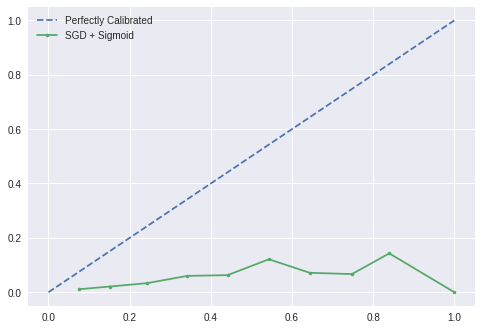

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[6]], d2_expemo_sgd[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SGD + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files
joblib.dump(calib_sgdd1_expemo, 'calib_sgdd1_expemo.sav')
files.download('calib_sgdd1_expemo.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#### Class 7 - Classifier 6 - SVM with RBF kernel with RandomSearch and Calibration

In [ ]:
svm = SVC(kernel='rbf')

In [ ]:
cols = y_train_multi.columns

In [ ]:
svm_params = {'C': [1e-3,1e-2,1e-1,0,1,10,100],
              'degree':[i for i in range(1,5)],
              'probability':[True, False],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1],
              }
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params,verbose=3,scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k5, y_d1_k5[cols[6]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  1.5min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight=None, coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=None,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [0.001, 0.01, 0.1, 0, 1, 10, 100],
                                        'degree': [1, 2, 3, 4],
                                        'probability': [True, False],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispatch='2*n_jobs', random_state=None, refit=True,
                   return_train_s

In [ ]:
svm_random.best_params_

{'C': 100, 'degree': 3, 'probability': False, 'shrinking': True, 'tol': 0.1}

In [ ]:
svm_random.best_score_

0.6740678676162547

In [ ]:
cols = y_train_multi.columns

In [ ]:
calib_svmrbf_d1_expemo = CalibratedClassifierCV(SVC(**svm_random.best_params_), method='sigmoid', cv=3)
calib_svmrbf_d1_expemo.fit(train_d1_k5, y_d1_k5[cols[6]])

CalibratedClassifierCV(base_estimator=SVC(C=100, break_ties=False,
                                          cache_size=200, class_weight=None,
                                          coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=3, gamma='scale', kernel='rbf',
                                          max_iter=-1, probability=False,
                                          random_state=None, shrinking=True,
                                          tol=0.1, verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_expemo_svmrbf = calib_svmrbf_d1_expemo.predict_proba(train_d2)

In [ ]:
d2_expemo_svmrbf_roc = roc_auc_score(y_d2[cols[6]], d2_expemo_svmrbf[:,1], average='micro')
d2_expemo_svmrbf_f1 = f1_score(y_d2[cols[6]], np.round(d2_expemo_svmrbf[:,1]), average='micro')
d2_expemo_svmrbf_hamm = hamming_loss(y_d2[cols[6]], np.round(d2_expemo_svmrbf[:,1]))
d2_expemo_svmrbf_brier = brier_score_loss(y_d2[cols[6]], d2_expemo_svmrbf[:,1])

print(f'\nROC d2 Express Emotion: {d2_expemo_svmrbf_roc}')
print(f'\nF1 d2 Express Emotion: {d2_expemo_svmrbf_f1}')
print(f'\nHamming Loss d2 Express Emotion: {d2_expemo_svmrbf_hamm}')
print(f'\nBrier Loss d2 Express Emotion: {d2_expemo_svmrbf_brier}')


ROC d2 Express Emotion: 0.6833864422962167

F1 d2 Express Emotion: 0.970044866719451

Hamming Loss d2 Express Emotion: 0.029955133280548957

Brier Loss d2 Express Emotion: 0.028067984860918476


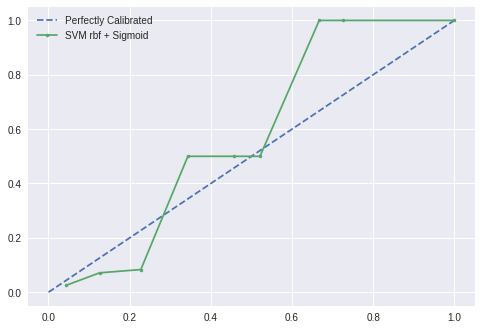

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[6]], d2_expemo_svmrbf[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM rbf + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files
joblib.dump(calib_svmrbf_d1_expemo, 'calib_svmrbf_d1_expemo.sav')
files.download('calib_svmrbf_d1_expemo.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Class 7 - Classifier 7 - SVM with randomsearch and calibration 

In [ ]:
svm = SVC(random_state=42)

In [ ]:
svm_params = {'kernel': ['poly','sigmoid', 'linear'],
              'C': [1e-3,1e-2,1e-1,0,1,10,100],
              'degree':[i for i in range(1,5)],
              'probability':[True],
              'shrinking' : [True, False],
              'tol':[1e-4,1e-3,1e-2,1e-1]}
svm_random = RandomizedSearchCV(svm, param_distributions=svm_params, verbose=3, random_state=42, scoring='roc_auc',refit=True,cv=3,n_jobs=-1)
svm_random.fit(train_d1_k6, y_d1_k6[cols[6]])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:  2.9min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                                 class_weight=None, coef0=0.0,
                                 decision_function_shape='ovr', degree=3,
                                 gamma='scale', kernel='rbf', max_iter=-1,
                                 probability=False, random_state=42,
                                 shrinking=True, tol=0.001, verbose=False),
                   iid='deprecated', n_iter=10, n_jobs=-1,
                   param_distributions={'C': [0.001, 0.01, 0.1, 0, 1, 10, 100],
                                        'degree': [1, 2, 3, 4],
                                        'kernel': ['poly', 'sigmoid', 'linear'],
                                        'probability': [True],
                                        'shrinking': [True, False],
                                        'tol': [0.0001, 0.001, 0.01, 0.1]},
                   pre_dispatch='2*n

In [ ]:
svm_random.best_params_

{'C': 100,
 'degree': 3,
 'kernel': 'sigmoid',
 'probability': True,
 'shrinking': False,
 'tol': 0.1}

In [ ]:
calib_svm_d1_expemo = CalibratedClassifierCV(SVC(**svm_random.best_params_), method='sigmoid', cv=3)
calib_svm_d1_expemo.fit(train_d1_k6, y_d1_k6[cols[6]])

CalibratedClassifierCV(base_estimator=SVC(C=100, break_ties=False,
                                          cache_size=200, class_weight=None,
                                          coef0=0.0,
                                          decision_function_shape='ovr',
                                          degree=3, gamma='scale',
                                          kernel='sigmoid', max_iter=-1,
                                          probability=True, random_state=None,
                                          shrinking=False, tol=0.1,
                                          verbose=False),
                       cv=3, method='sigmoid')

In [ ]:
d2_svm_expemo = calib_svm_d1_expemo.predict_proba(train_d2)

In [ ]:
d2_svmexpemo_roc = roc_auc_score(y_d2[cols[6]], d2_svm_expemo[:,1], average='micro')
d2_svmexpemo_f1 = f1_score(y_d2[cols[6]], np.round(d2_svm_expemo[:,1]), average='micro')
d2_svmexpemo_hamm = hamming_loss(y_d2[cols[6]], np.round(d2_svm_expemo[:,1]))
d2_svmexpemo_brier = brier_score_loss(y_d2[cols[6]], d2_svm_expemo[:,1])

print(f'\nROC d2 Express Emotion: {d2_svmexpemo_roc}')
print(f'\nF1 d2 Express Emotion: {d2_svmexpemo_f1}')
print(f'\nHamming Loss d2 Express Emotion: {d2_svmexpemo_hamm}')
print(f'\nBrier Loss d2 Express Emotion: {d2_svmexpemo_brier}')


ROC d2 Express Emotion: 0.594545291800931

F1 d2 Express Emotion: 0.9699129057798892

Hamming Loss d2 Express Emotion: 0.030087094220110848

Brier Loss d2 Express Emotion: 0.029154183154651847


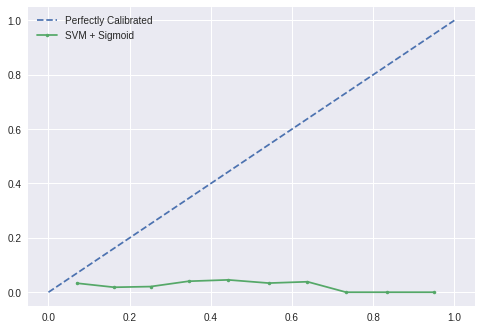

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fop, mpv = calibration_curve(y_d2[cols[6]], d2_svm_expemo[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','SVM + Sigmoid'])
plt.show()

In [ ]:
from google.colab import files

joblib.dump(calib_svm_d1_expemo, 'calib_svm_d1_expemo.sav')
files.download('calib_svm_d1_expemo.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#!gdown --id '1uQRLi6CAD19AHUfyEuJRg0cmwIcKG_A_'
#!unzip 'greet stacked.zip' -d '/content/'

In [ ]:
calib_catd1_expemo = joblib.load('calib_catd1_expemo.sav')
calib_d1_expemorf = joblib.load('calib_d1_expemorf.sav')
calib_d1xgb_expemo = joblib.load('calib_d1xgb_expemo.sav')
calib_dtc_expemo = joblib.load('calib_dtc_expemo.sav')
calib_sgdd1_expemo = joblib.load('calib_sgdd1_expemo.sav')
calib_svm_d1_expemo = joblib.load('calib_svm_d1_expemo.sav')
calib_svmrbf_d1_expemo = joblib.load('calib_svmrbf_d1_expemo.sav')

In [ ]:
d2expemo_cat = calib_catd1_expemo.predict_proba(train_d2)[:,1]
d2expemo_rf = calib_d1_expemorf.predict_proba(train_d2)[:,1]
d2expemo_xgb = calib_d1xgb_expemo.predict_proba(train_d2)[:,1]
d2expemo_dtc = calib_dtc_expemo.predict_proba(train_d2)[:,1]
d2expemo_sgd = calib_sgdd1_expemo.predict_proba(train_d2)[:,1]
d2expemo_svm = calib_svm_d1_expemo.predict_proba(train_d2)[:,1]
d2expemo_svmrbf = calib_svmrbf_d1_expemo.predict_proba(train_d2)[:,1]

In [ ]:
d2expemo_meta = np.hstack((d2expemo_cat.reshape(-1,1), d2expemo_rf.reshape(-1,1), d2expemo_xgb.reshape(-1,1), d2expemo_dtc.reshape(-1,1),
                         d2expemo_sgd.reshape(-1,1), d2expemo_svm.reshape(-1,1), d2expemo_svmrbf.reshape(-1,1)))

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from scipy.stats import loguniform

meta_model6 = LogisticRegression()
# define evaluation
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define search space
space = dict()
space['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
space['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
space['C'] = loguniform(1e-5, 100)
# define search
search = RandomizedSearchCV(meta_model6, space,verbose=2, n_iter=50, refit=True, scoring='roc_auc', n_jobs=-1, cv=cv, random_state=42)
# execute search
result = search.fit(d2expemo_meta, y_d2[cols[6]])
# summarize result
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Fitting 30 folds for each of 50 candidates, totalling 1500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  44 tasks      | elapsed:    1.8s


Best Score: 0.8502502397533453
Best Hyperparameters: {'C': 0.13774775007214832, 'penalty': 'l1', 'solver': 'liblinear'}


[Parallel(n_jobs=-1)]: Done 1493 out of 1500 | elapsed:   12.4s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 1500 out of 1500 | elapsed:   12.4s finished


In [ ]:
calib_meta2_lrexpemo = CalibratedClassifierCV(LogisticRegression(**search.best_params_), method='sigmoid', cv=10)
calib_meta2_lrexpemo.fit(d2expemo_meta, y_d2[cols[6]])

CalibratedClassifierCV(base_estimator=LogisticRegression(C=0.13774775007214832,
                                                         class_weight=None,
                                                         dual=False,
                                                         fit_intercept=True,
                                                         intercept_scaling=1,
                                                         l1_ratio=None,
                                                         max_iter=100,
                                                         multi_class='auto',
                                                         n_jobs=None,
                                                         penalty='l1',
                                                         random_state=None,
                                                         solver='liblinear',
                                                         tol=0.0001, verbose=0,
                          

In [ ]:
d2_meta_expemo = calib_meta2_lrexpemo.predict_proba(d2expemo_meta)

In [ ]:
d2expemo_meta_roc = roc_auc_score(y_d2[cols[6]], d2_meta_expemo[:,1], average='micro')
d2expemo_meta_f1 = f1_score(y_d2[cols[6]], np.round(d2_meta_expemo[:,1]), average='micro')
d2expemo_meta_hamm = hamming_loss(y_d2[cols[6]], np.round(d2_meta_expemo[:,1]))
d2expemo_meta_brier = brier_score_loss(y_d2[cols[6]], d2_meta_expemo[:,1])

print(f'\nROC d2 Express Emotion: {d2expemo_meta_roc}')
print(f'\nF1 d2 Express Emotion: {d2expemo_meta_f1}')
print(f'\nHamming Loss d2 Express Emotion: {d2expemo_meta_hamm}')
print(f'\nBrier Loss d2 Express Emotion: {d2expemo_meta_brier}')


ROC d2 Express Emotion: 0.8507429287504474

F1 d2 Express Emotion: 0.9714964370546318

Hamming Loss d2 Express Emotion: 0.028503562945368172

Brier Loss d2 Express Emotion: 0.026721038908020352


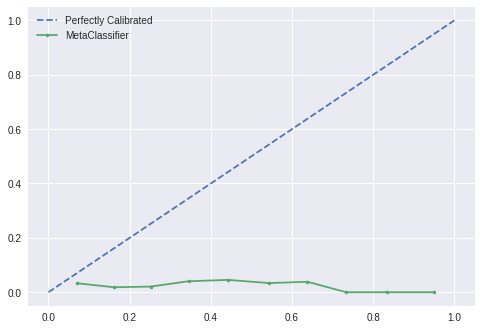

In [ ]:
from sklearn.calibration import calibration_curve

# reliability diagram
fraction_of_positives, mean_predicted_values = calibration_curve(y_d2[cols[6]], d2_meta_expemo[:,1], n_bins=10, normalize=True)
# plot perfectly calibrated
plt.plot([0, 1], [0, 1], linestyle='--')
# plot calibrated reliability
plt.plot(mpv, fop, marker='.')
plt.legend(['Perfectly Calibrated','MetaClassifier'])
plt.show()

In [ ]:
joblib.dump(calib_meta2_lrexpemo, 'calib_meta2_lrexpemo.sav')
files.download('calib_meta2_lrexpemo.sav')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!gdown --id '1aQ7Ns6DYhq3MKSoeQEG3gl7OLKgtRT44'
!unzip 'greet models.zip' -d '/content/'

Downloading...
From: https://drive.google.com/uc?id=1aQ7Ns6DYhq3MKSoeQEG3gl7OLKgtRT44
To: /content/greet models.zip
43.2MB [00:01, 42.5MB/s]
Archive:  greet models.zip
  inflating: /content/greet models/calib_catd1_greet.sav  
  inflating: /content/greet models/calib_d1_greetrf.sav  
  inflating: /content/greet models/calib_d1xgb_greet.sav  
  inflating: /content/greet models/calib_dtc_greet.sav  
  inflating: /content/greet models/calib_meta_lrgreet.sav  
  inflating: /content/greet models/calib_sgdd1_greet.sav  
  inflating: /content/greet models/calib_svm_d1_greet.sav  
  inflating: /content/greet models/calib_svmrbf_d1_greet.sav  


In [ ]:
!gdown --id '1Lz-bjuFshJY8LiXFgKpTZodqJqq6IYGX'
!unzip 'backstory models.zip' -d '/content/'

Downloading...
From: https://drive.google.com/uc?id=1Lz-bjuFshJY8LiXFgKpTZodqJqq6IYGX
To: /content/backstory models.zip
23.4MB [00:00, 30.6MB/s]
Archive:  backstory models.zip
  inflating: /content/backstory models/calib_catd1_back.sav  
  inflating: /content/backstory models/calib_d1_backrf.sav  
  inflating: /content/backstory models/calib_d1xgb_back.sav  
  inflating: /content/backstory models/calib_dtc_back.sav  
  inflating: /content/backstory models/calib_meta2_lrback.sav  
  inflating: /content/backstory models/calib_sgdd1_back.sav  
  inflating: /content/backstory models/calib_svm_d1_back.sav  
  inflating: /content/backstory models/calib_svmrbf_d1_back.sav  


In [ ]:
!gdown --id '1rja_wtez5BrfowiXIP91mveDAukMJTjH'
!unzip 'justifn models.zip' -d '/content/'

Downloading...
From: https://drive.google.com/uc?id=1rja_wtez5BrfowiXIP91mveDAukMJTjH
To: /content/justifn models.zip
20.7MB [00:00, 25.3MB/s]
Archive:  justifn models.zip
  inflating: /content/justifn models/calib_catd1_justifn.sav  
  inflating: /content/justifn models/calib_d1_justifnrf.sav  
  inflating: /content/justifn models/calib_d1xgb_justifn.sav  
  inflating: /content/justifn models/calib_dtc_justifn.sav  
  inflating: /content/justifn models/calib_meta2_lrjustifn.sav  
  inflating: /content/justifn models/calib_sgdd1_justifn.sav  
  inflating: /content/justifn models/calib_svm_d1_justifn.sav  
  inflating: /content/justifn models/calib_svmrbf_d1_justifn.sav  


In [ ]:
!gdown --id '1jyhHrzV4n26bamkj9Tlx-C-hI6SSy0DJ'
!unzip 'Rant models.zip' -d '/content/'

Downloading...
From: https://drive.google.com/uc?id=1jyhHrzV4n26bamkj9Tlx-C-hI6SSy0DJ
To: /content/Rant models.zip
14.8MB [00:00, 69.0MB/s]
Archive:  Rant models.zip
  inflating: /content/Rant models/calib_catd1_rant.sav  
  inflating: /content/Rant models/calib_d1_rantrf.sav  
  inflating: /content/Rant models/calib_d1xgb_rant.sav  
  inflating: /content/Rant models/calib_dtc_rant.sav  
  inflating: /content/Rant models/calib_meta2_lrrant.sav  
  inflating: /content/Rant models/calib_sgdd1_rant.sav  
  inflating: /content/Rant models/calib_svm_d1_rant.sav  
  inflating: /content/Rant models/calib_svmrbf_d1_rant.sav  
  inflating: /content/Rant models/gcapi.dll  


In [ ]:
!gdown --id '19iQ0Weweam2gT5_9P8G6rry6U6fjYpSf'
!unzip 'grat models.zip' -d '/content/'

Downloading...
From: https://drive.google.com/uc?id=19iQ0Weweam2gT5_9P8G6rry6U6fjYpSf
To: /content/grat models.zip
14.8MB [00:01, 8.39MB/s]
Archive:  grat models.zip
replace /content/grat models/calib_catd1_grat.sav? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: /content/grat models/calib_catd1_grat.sav  
  inflating: /content/grat models/calib_d1_gratrf.sav  
  inflating: /content/grat models/calib_d1xgb_grat.sav  
  inflating: /content/grat models/calib_dtc_grat.sav  
  inflating: /content/grat models/calib_meta2_lrgrat (1).sav  
  inflating: /content/grat models/calib_meta2_lrgrat.sav  
  inflating: /content/grat models/calib_sgdd1_grat.sav  
  inflating: /content/grat models/calib_svm_d1_grat.sav  
  inflating: /content/grat models/calib_svmrbf_d1_grat.sav  


In [ ]:
!gdown --id '1IVi2cGx66iXuyx-Q8UzdW55VtSf-E-ul'
!unzip 'other models.zip' -d '/content/'

Downloading...
From: https://drive.google.com/uc?id=1IVi2cGx66iXuyx-Q8UzdW55VtSf-E-ul
To: /content/other models.zip
26.7MB [00:00, 85.0MB/s]
Archive:  other models.zip
  inflating: /content/other models/calib_catd1_other.sav  
  inflating: /content/other models/calib_d1_otherrf.sav  
  inflating: /content/other models/calib_d1xgb_other.sav  
  inflating: /content/other models/calib_dtc_other.sav  
  inflating: /content/other models/calib_meta2_lrother.sav  
  inflating: /content/other models/calib_sgdd1_other.sav  
  inflating: /content/other models/calib_svm_d1_other.sav  
  inflating: /content/other models/calib_svmrbf_d1_other.sav  


In [ ]:
!gdown --id '1pWLS_D8qPkbGHVL7TI0h_KNiVCjTKgdJ'
!unzip 'expemo models.zip' -d '/content/'

Downloading...
From: https://drive.google.com/uc?id=1pWLS_D8qPkbGHVL7TI0h_KNiVCjTKgdJ
To: /content/expemo models.zip
8.06MB [00:00, 22.2MB/s]
Archive:  expemo models.zip
  inflating: /content/expemo models/calib_catd1_expemo.sav  
  inflating: /content/expemo models/calib_d1_expemorf.sav  
  inflating: /content/expemo models/calib_d1xgb_expemo.sav  
  inflating: /content/expemo models/calib_dtc_expemo.sav  
  inflating: /content/expemo models/calib_meta2_lrexpemo.sav  
  inflating: /content/expemo models/calib_sgdd1_expemo.sav  
  inflating: /content/expemo models/calib_svm_d1_expemo.sav  
  inflating: /content/expemo models/calib_svmrbf_d1_expemo.sav  


In [ ]:
# Load models
# Express Emotion Models
calib_catd1_expemo = joblib.load('/content/expemo models/calib_catd1_expemo.sav')  
calib_d1_expemorf = joblib.load('/content/expemo models/calib_d1_expemorf.sav')  
calib_d1xgb_expemo = joblib.load('/content/expemo models/calib_d1xgb_expemo.sav')  
calib_dtc_expemo = joblib.load("/content/expemo models/calib_dtc_expemo.sav") 
calib_meta2_lrexpemo = joblib.load('/content/expemo models/calib_meta2_lrexpemo.sav')  
calib_sgdd1_expemo = joblib.load('/content/expemo models/calib_sgdd1_expemo.sav')  
calib_svm_d1_expemo = joblib.load('/content/expemo models/calib_svm_d1_expemo.sav') 
calib_svmrbf_d1_expemo = joblib.load('/content/expemo models/calib_svmrbf_d1_expemo.sav')

# Load models
# Other Models
calib_catd1_other = joblib.load('/content/other models/calib_catd1_other.sav')  
calib_d1_otherrf = joblib.load('/content/other models/calib_d1_otherrf.sav')  
calib_d1xgb_other = joblib.load('/content/other models/calib_d1xgb_other.sav')  
calib_dtc_other = joblib.load("/content/other models/calib_dtc_other.sav") 
calib_meta2_lrother = joblib.load('/content/other models/calib_meta2_lrother.sav')  
calib_sgdd1_other = joblib.load('/content/other models/calib_sgdd1_other.sav')  
calib_svm_d1_other = joblib.load('/content/other models/calib_svm_d1_other.sav') 
calib_svmrbf_d1_other = joblib.load('/content/other models/calib_svmrbf_d1_other.sav')

# Load models
# Gratitude Models
calib_catd1_grat = joblib.load('/content/grat models/calib_catd1_grat.sav')  
calib_d1_gratrf = joblib.load('/content/grat models/calib_d1_gratrf.sav')  
calib_d1xgb_grat = joblib.load('/content/grat models/calib_d1xgb_grat.sav')  
calib_dtc_grat = joblib.load("/content/grat models/calib_dtc_grat.sav") 
calib_meta2_lrgrat = joblib.load('/content/grat models/calib_meta2_lrgrat.sav')  
calib_sgdd1_grat = joblib.load('/content/grat models/calib_sgdd1_grat.sav')  
calib_svm_d1_grat = joblib.load('/content/grat models/calib_svm_d1_grat.sav') 
calib_svmrbf_d1_grat = joblib.load('/content/grat models/calib_svmrbf_d1_grat.sav')

# Load models
# Rant Models
calib_catd1_rant = joblib.load('/content/Rant models/calib_catd1_rant.sav')  
calib_d1_rantrf = joblib.load('/content/Rant models/calib_d1_rantrf.sav')  
calib_d1xgb_rant = joblib.load('/content/Rant models/calib_d1xgb_rant.sav')  
calib_dtc_rant = joblib.load("/content/Rant models/calib_dtc_rant.sav") 
calib_meta2_lrrant = joblib.load('/content/Rant models/calib_meta2_lrrant.sav')  
calib_sgdd1_rant = joblib.load('/content/Rant models/calib_sgdd1_rant.sav')  
calib_svm_d1_rant = joblib.load('/content/Rant models/calib_svm_d1_rant.sav') 
calib_svmrbf_d1_rant = joblib.load('/content/Rant models/calib_svmrbf_d1_rant.sav')

# Load models
# Justifn Models
calib_catd1_justifn = joblib.load('/content/justifn models/calib_catd1_justifn.sav')  
calib_d1_justifnrf = joblib.load('/content/justifn models/calib_d1_justifnrf.sav')  
calib_d1xgb_justifn = joblib.load('/content/justifn models/calib_d1xgb_justifn.sav')  
calib_dtc_justifn = joblib.load("/content/justifn models/calib_dtc_justifn.sav") 
calib_meta2_lrjustifn = joblib.load('/content/justifn models/calib_meta2_lrjustifn.sav')  
calib_sgdd1_justifn = joblib.load('/content/justifn models/calib_sgdd1_justifn.sav')  
calib_svm_d1_justifn = joblib.load('/content/justifn models/calib_svm_d1_justifn.sav') 
calib_svmrbf_d1_justifn = joblib.load('/content/justifn models/calib_svmrbf_d1_justifn.sav')

# Load models
# Backstory Models
calib_catd1_back = joblib.load('/content/backstory models/calib_catd1_back.sav')  
calib_d1_backrf = joblib.load('/content/backstory models/calib_d1_backrf.sav')  
calib_d1xgb_back = joblib.load('/content/backstory models/calib_d1xgb_back.sav')  
calib_dtc_back = joblib.load("/content/backstory models/calib_dtc_back.sav") 
calib_meta2_lrback = joblib.load('/content/backstory models/calib_meta2_lrback.sav')  
calib_sgdd1_back = joblib.load('/content/backstory models/calib_sgdd1_back.sav')  
calib_svm_d1_back = joblib.load('/content/backstory models/calib_svm_d1_back.sav') 
calib_svmrbf_d1_back = joblib.load('/content/backstory models/calib_svmrbf_d1_back.sav')

# Load models
# Greeting Models
calib_catd1_greet = joblib.load('/content/greet models/calib_catd1_greet.sav')  
calib_d1_greetrf = joblib.load('/content/greet models/calib_d1_greetrf.sav')  
calib_d1xgb_greet = joblib.load('/content/greet models/calib_d1xgb_greet.sav')  
calib_dtc_greet = joblib.load("/content/greet models/calib_dtc_greet.sav") 
calib_meta2_lrgreet = joblib.load('/content/greet models/calib_meta_lrgreet.sav')  
calib_sgdd1_greet = joblib.load('/content/greet models/calib_sgdd1_greet.sav')  
calib_svm_d1_greet = joblib.load('/content/greet models/calib_svm_d1_greet.sav') 
calib_svmrbf_d1_greet = joblib.load('/content/greet models/calib_svmrbf_d1_greet.sav')

In [ ]:
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, hamming_loss, brier_score_loss, f1_score
from prettytable import PrettyTable

In [ ]:
def get_cls_report(data, model, name):
  x = PrettyTable()
  feat, labels = data
  model_cat, model_rf, model_xgb, model_dtc, model_sgd, model_svm, model_svmrbf, meta_model = model
  cat_preds = model_cat.predict_proba(feat)[:,1]
  rf_preds = model_rf.predict_proba(feat)[:,1]
  xgb_preds = model_xgb.predict_proba(feat)[:,1]
  dtc_preds = model_dtc.predict_proba(feat)[:,1]
  sgd_preds = model_sgd.predict_proba(feat)[:,1]
  svm_preds = model_svm.predict_proba(feat)[:,1]
  svmrbf_preds = model_svmrbf.predict_proba(feat)[:,1]
  meta_ = np.hstack((cat_preds.reshape(-1,1), rf_preds.reshape(-1,1), xgb_preds.reshape(-1,1), dtc_preds.reshape(-1,1),
                         sgd_preds.reshape(-1,1), svm_preds.reshape(-1,1), svmrbf_preds.reshape(-1,1)))
  meta_preds  = meta_model.predict_proba(meta_)[:,1]

  auc = roc_auc_score(labels, meta_preds, average='micro')
  f1 = f1_score(labels, np.round(meta_preds), average='micro')
  hamm = hamming_loss(labels, np.round(meta_preds))
  br_loss = brier_score_loss(labels, meta_preds)
  prec = precision_score(labels, np.round(meta_preds), average='micro')
  rec = recall_score(labels, np.round(meta_preds), average='micro')
  acc = accuracy_score(labels, np.round(meta_preds))
  print(f"Classification Report for {name} Class")
  x.field_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score', 'Hamming Loss', 'Brier Loss', 'AUC']
  x.add_row([acc, prec, rec, f1, hamm, br_loss, auc])
  print(x)
  return


In [ ]:
greeting_models = [calib_catd1_greet, calib_d1_greetrf, calib_d1xgb_greet, calib_dtc_greet, calib_sgdd1_greet, calib_svm_d1_greet, calib_svmrbf_d1_greet, calib_meta2_lrgreet]
get_cls_report([cv_norm_multi, y_cv_multi[cols[0]]], greeting_models, 'Greeting')

Classification Report for Greeting Class
+-------------------+-------------------+-------------------+-------------------+---------------------+---------------------+--------------------+
|      Accuracy     |     Precision     |       Recall      |      F1 Score     |     Hamming Loss    |      Brier Loss     |        AUC         |
+-------------------+-------------------+-------------------+-------------------+---------------------+---------------------+--------------------+
| 0.772289156626506 | 0.772289156626506 | 0.772289156626506 | 0.772289156626506 | 0.22771084337349398 | 0.17515213583519498 | 0.5905713617845456 |
+-------------------+-------------------+-------------------+-------------------+---------------------+---------------------+--------------------+


In [ ]:
back_models = [calib_catd1_back, calib_d1_backrf, calib_d1xgb_back, calib_dtc_back, calib_sgdd1_back, calib_svm_d1_back, calib_svmrbf_d1_back, calib_meta2_lrback]
get_cls_report([cv_norm_multi, y_cv_multi[cols[1]]], back_models, 'Backstory')

Classification Report for Backstory Class
+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss    |     Brier Loss     |        AUC         |
+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+--------------------+
| 0.6373493975903615 | 0.6373493975903615 | 0.6373493975903615 | 0.6373493975903615 | 0.36265060240963853 | 0.2299083631416638 | 0.6844335218364075 |
+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+--------------------+


In [ ]:
justifn_models = [calib_catd1_justifn, calib_d1_justifnrf, calib_d1xgb_justifn, calib_dtc_justifn, calib_sgdd1_justifn, calib_svm_d1_justifn, calib_svmrbf_d1_justifn, calib_meta2_lrjustifn]
get_cls_report([cv_norm_multi, y_cv_multi[cols[2]]], justifn_models, 'Justification')

Classification Report for Justification Class
+--------------------+--------------------+--------------------+--------------------+----------------------+----------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss     |      Brier Loss      |        AUC         |
+--------------------+--------------------+--------------------+--------------------+----------------------+----------------------+--------------------+
| 0.9783132530120482 | 0.9783132530120482 | 0.9783132530120482 | 0.9783132530120482 | 0.021686746987951807 | 0.021220265621640304 | 0.5020525451559934 |
+--------------------+--------------------+--------------------+--------------------+----------------------+----------------------+--------------------+


In [ ]:
rant_models = [calib_catd1_rant, calib_d1_rantrf, calib_d1xgb_rant, calib_dtc_rant, calib_sgdd1_rant, calib_svm_d1_rant, calib_svmrbf_d1_rant, calib_meta2_lrrant]
get_cls_report([cv_norm_multi, y_cv_multi[cols[3]]], rant_models, 'Rant')

Classification Report for Rant Class
+--------------------+--------------------+--------------------+--------------------+---------------------+----------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss    |      Brier Loss      |        AUC         |
+--------------------+--------------------+--------------------+--------------------+---------------------+----------------------+--------------------+
| 0.9337349397590361 | 0.9337349397590361 | 0.9337349397590361 | 0.9337349397590361 | 0.06626506024096386 | 0.058378245137525805 | 0.7821202423912303 |
+--------------------+--------------------+--------------------+--------------------+---------------------+----------------------+--------------------+


In [ ]:
grat_models = [calib_catd1_grat, calib_d1_gratrf, calib_d1xgb_grat, calib_dtc_grat, calib_sgdd1_grat, calib_svm_d1_grat, calib_svmrbf_d1_grat, calib_meta2_lrgrat]
get_cls_report([cv_norm_multi, y_cv_multi[cols[4]]], grat_models, 'Gratitude')

Classification Report for Gratitude Class
+--------------------+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |    Hamming Loss    |      Brier Loss     |        AUC         |
+--------------------+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+
| 0.9180722891566265 | 0.9180722891566265 | 0.9180722891566265 | 0.9180722891566265 | 0.0819277108433735 | 0.06831823110973297 | 0.9017654650478016 |
+--------------------+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+


In [ ]:
other_models = [calib_catd1_other, calib_d1_otherrf, calib_d1xgb_other, calib_dtc_other, calib_sgdd1_other, calib_svm_d1_other, calib_svmrbf_d1_other, calib_meta2_lrother]
get_cls_report([cv_norm_multi, y_cv_multi[cols[5]]], other_models, 'Other')

Classification Report for Other Class
+--------------------+--------------------+--------------------+--------------------+---------------------+---------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss    |      Brier Loss     |        AUC         |
+--------------------+--------------------+--------------------+--------------------+---------------------+---------------------+--------------------+
| 0.6132530120481928 | 0.6132530120481928 | 0.6132530120481928 | 0.6132530120481928 | 0.38674698795180723 | 0.24029391336489958 | 0.6249343410311393 |
+--------------------+--------------------+--------------------+--------------------+---------------------+---------------------+--------------------+


In [ ]:
expemo_models = [calib_catd1_expemo, calib_d1_expemorf, calib_d1xgb_expemo, calib_dtc_expemo, calib_sgdd1_expemo, calib_svm_d1_expemo, calib_svmrbf_d1_expemo, calib_meta2_lrexpemo]
get_cls_report([cv_norm_multi, y_cv_multi[cols[6]]], expemo_models, 'Express Emotion')


Classification Report for Express Emotion Class
+--------------------+--------------------+--------------------+--------------------+---------------------+---------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss    |      Brier Loss     |        AUC         |
+--------------------+--------------------+--------------------+--------------------+---------------------+---------------------+--------------------+
| 0.9626506024096385 | 0.9626506024096385 | 0.9626506024096385 | 0.9626506024096385 | 0.03734939759036145 | 0.03560709123474373 | 0.7140780814728087 |
+--------------------+--------------------+--------------------+--------------------+---------------------+---------------------+--------------------+


### Report on Test Data

In [ ]:
greeting_models = [calib_catd1_greet, calib_d1_greetrf, calib_d1xgb_greet, calib_dtc_greet, calib_sgdd1_greet, calib_svm_d1_greet, calib_svmrbf_d1_greet, calib_meta2_lrgreet]
get_cls_report([test_norm_multi, y_test_multi[cols[0]]], greeting_models, 'Greeting')

Classification Report for Greeting Class
+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss    |     Brier Loss     |        AUC         |
+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+--------------------+
| 0.7740112994350282 | 0.7740112994350282 | 0.7740112994350282 | 0.7740112994350282 | 0.22598870056497175 | 0.1664096601259212 | 0.6558384878173581 |
+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+--------------------+


In [ ]:
back_models = [calib_catd1_back, calib_d1_backrf, calib_d1xgb_back, calib_dtc_back, calib_sgdd1_back, calib_svm_d1_back, calib_svmrbf_d1_back, calib_meta2_lrback]
get_cls_report([test_norm_multi, y_test_multi[cols[1]]], back_models, 'Backstory')

Classification Report for Backstory Class
+-------------------+-------------------+-------------------+-------------------+--------------------+---------------------+--------------------+
|      Accuracy     |     Precision     |       Recall      |      F1 Score     |    Hamming Loss    |      Brier Loss     |        AUC         |
+-------------------+-------------------+-------------------+-------------------+--------------------+---------------------+--------------------+
| 0.632768361581921 | 0.632768361581921 | 0.632768361581921 | 0.632768361581921 | 0.3672316384180791 | 0.23195693074357346 | 0.6899274206880369 |
+-------------------+-------------------+-------------------+-------------------+--------------------+---------------------+--------------------+


In [ ]:
justifn_models = [calib_catd1_justifn, calib_d1_justifnrf, calib_d1xgb_justifn, calib_dtc_justifn, calib_sgdd1_justifn, calib_svm_d1_justifn, calib_svmrbf_d1_justifn, calib_meta2_lrjustifn]
get_cls_report([test_norm_multi, y_test_multi[cols[2]]], justifn_models, 'Justification')

Classification Report for Justification Class
+--------------------+--------------------+--------------------+--------------------+---------------------+----------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss    |      Brier Loss      |        AUC         |
+--------------------+--------------------+--------------------+--------------------+---------------------+----------------------+--------------------+
| 0.9846650524616626 | 0.9846650524616626 | 0.9846650524616626 | 0.9846650524616626 | 0.01533494753833737 | 0.015124969445138707 | 0.5455996548748921 |
+--------------------+--------------------+--------------------+--------------------+---------------------+----------------------+--------------------+


In [ ]:
rant_models = [calib_catd1_rant, calib_d1_rantrf, calib_d1xgb_rant, calib_dtc_rant, calib_sgdd1_rant, calib_svm_d1_rant, calib_svmrbf_d1_rant, calib_meta2_lrrant]
get_cls_report([test_norm_multi, y_test_multi[cols[3]]], rant_models, 'Rant')

Classification Report for Rant Class
+--------------------+--------------------+--------------------+--------------------+---------------------+---------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss    |      Brier Loss     |        AUC         |
+--------------------+--------------------+--------------------+--------------------+---------------------+---------------------+--------------------+
| 0.9136400322841001 | 0.9136400322841001 | 0.9136400322841001 | 0.9136400322841001 | 0.08635996771589992 | 0.07352895807139471 | 0.7880250223413763 |
+--------------------+--------------------+--------------------+--------------------+---------------------+---------------------+--------------------+


In [ ]:
grat_models = [calib_catd1_grat, calib_d1_gratrf, calib_d1xgb_grat, calib_dtc_grat, calib_sgdd1_grat, calib_svm_d1_grat, calib_svmrbf_d1_grat, calib_meta2_lrgrat]
get_cls_report([test_norm_multi, y_test_multi[cols[4]]], grat_models, 'Gratitude')

Classification Report for Gratitude Class
+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss    |     Brier Loss     |        AUC         |
+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+--------------------+
| 0.9241323648103309 | 0.9241323648103309 | 0.9241323648103309 | 0.9241323648103309 | 0.07586763518966909 | 0.0644817670732211 | 0.9279986727865951 |
+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+--------------------+


In [ ]:
other_models = [calib_catd1_other, calib_d1_otherrf, calib_d1xgb_other, calib_dtc_other, calib_sgdd1_other, calib_svm_d1_other, calib_svmrbf_d1_other, calib_meta2_lrother]
get_cls_report([test_norm_multi, y_test_multi[cols[5]]], other_models, 'Other')

Classification Report for Other Class
+--------------------+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |    Hamming Loss    |      Brier Loss     |        AUC         |
+--------------------+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+
| 0.6037126715092817 | 0.6037126715092817 | 0.6037126715092817 | 0.6037126715092817 | 0.3962873284907183 | 0.25380383135517476 | 0.5789646630605126 |
+--------------------+--------------------+--------------------+--------------------+--------------------+---------------------+--------------------+


In [ ]:
expemo_models = [calib_catd1_expemo, calib_d1_expemorf, calib_d1xgb_expemo, calib_dtc_expemo, calib_sgdd1_expemo, calib_svm_d1_expemo, calib_svmrbf_d1_expemo, calib_meta2_lrexpemo]
get_cls_report([test_norm_multi, y_test_multi[cols[6]]], expemo_models, 'Express Emotion')


Classification Report for Express Emotion Class
+--------------------+--------------------+--------------------+--------------------+----------------------+---------------------+--------------------+
|      Accuracy      |     Precision      |       Recall       |      F1 Score      |     Hamming Loss     |      Brier Loss     |        AUC         |
+--------------------+--------------------+--------------------+--------------------+----------------------+---------------------+--------------------+
| 0.9685230024213075 | 0.9685230024213075 | 0.9685230024213075 | 0.9685230024213075 | 0.031476997578692496 | 0.02894952360662382 | 0.6800254174153119 |
+--------------------+--------------------+--------------------+--------------------+----------------------+---------------------+--------------------+


In [ ]:
def get_overall_report(data, model):
  x = PrettyTable()
  feat, labels = data
  model_cat, model_rf, model_xgb, model_dtc, model_sgd, model_svm, model_svmrbf, meta_model = model
  cat_preds = model_cat.predict_proba(feat)[:,1]
  rf_preds = model_rf.predict_proba(feat)[:,1]
  xgb_preds = model_xgb.predict_proba(feat)[:,1]
  dtc_preds = model_dtc.predict_proba(feat)[:,1]
  sgd_preds = model_sgd.predict_proba(feat)[:,1]
  svm_preds = model_svm.predict_proba(feat)[:,1]
  svmrbf_preds = model_svmrbf.predict_proba(feat)[:,1]
  meta_ = np.hstack((cat_preds.reshape(-1,1), rf_preds.reshape(-1,1), xgb_preds.reshape(-1,1), dtc_preds.reshape(-1,1),
                         sgd_preds.reshape(-1,1), svm_preds.reshape(-1,1), svmrbf_preds.reshape(-1,1)))
  meta_preds  = meta_model.predict_proba(meta_)[:,1]

  auc = roc_auc_score(labels, meta_preds, average='micro')
  f1 = f1_score(labels, np.round(meta_preds), average='micro')
  hamm = hamming_loss(labels, np.round(meta_preds))
  br_loss = brier_score_loss(labels, meta_preds)
  prec = precision_score(labels, np.round(meta_preds), average='micro')
  rec = recall_score(labels, np.round(meta_preds), average='micro')
  acc = accuracy_score(labels, np.round(meta_preds))
  
  return np.round(acc*100, 3), np.round(prec*100,3), np.round(rec*100, 3), np.round(f1*100,3), np.round(auc*100,3), np.round(hamm,3), np.round(br_loss,3)


In [ ]:
classes = [greeting_models,back_models, justifn_models, rant_models, grat_models, other_models, expemo_models]
accuracy = []
precision = []
recall = []
F1 = []
rocauc = []
hamming = []
brier = []

for i in tqdm(range(len(classes))):
  acc, prec, rec, f1, auc, hamm, br_loss = get_overall_report([test_norm_multi, y_test_multi[cols[i]]], classes[i])
  accuracy.append(acc)
  precision.append(prec)
  recall.append(rec)
  F1.append(f1)
  rocauc.append(auc)
  hamming.append(hamm)
  brier.append(br_loss)

In [ ]:
x = PrettyTable()
x.field_names = ['Class','Accuracy','Precision', 'Recall', 'F1 Score', 'AUC Score','Hamming Loss', 'Brier Loss']
x.add_row(['Greeting', accuracy[0], precision[0],recall[0],F1[0],rocauc[0],hamming[0],brier[0]])
x.add_row(['Backstory', accuracy[1], precision[1],recall[1],F1[1],rocauc[1],hamming[1],brier[1]])
x.add_row(['Justification', accuracy[2], precision[2],recall[2],F1[2],rocauc[2],hamming[2],brier[2]])
x.add_row(['Rant', accuracy[3], precision[3],recall[3],F1[3],rocauc[3],hamming[3],brier[3]])
x.add_row(['Gratitude', accuracy[4], precision[4],recall[4],F1[4],rocauc[4],hamming[4],brier[4]])
x.add_row(['Other', accuracy[5], precision[5],recall[5],F1[5],rocauc[5],hamming[5],brier[5]])
x.add_row(['Express Emotion', accuracy[6], precision[6],recall[6],F1[6],rocauc[6],hamming[6],brier[6]])
x.add_row(['Overall', np.round(np.mean(accuracy),3),np.round(np.mean(precision),3), np.round(np.mean(recall),3),np.round(np.mean(F1),3),np.round(np.mean(rocauc),3),np.round(np.mean(hamming),3),np.round(np.mean(brier),3)])
print(x)

+-----------------+----------+-----------+--------+----------+-----------+--------------+------------+
|      Class      | Accuracy | Precision | Recall | F1 Score | AUC Score | Hamming Loss | Brier Loss |
+-----------------+----------+-----------+--------+----------+-----------+--------------+------------+
|     Greeting    |  77.401  |   77.401  | 77.401 |  77.401  |   65.584  |    0.226     |   0.166    |
|    Backstory    |  63.277  |   63.277  | 63.277 |  63.277  |   68.993  |    0.367     |   0.232    |
|  Justification  |  98.467  |   98.467  | 98.467 |  98.467  |   54.56   |    0.015     |   0.015    |
|       Rant      |  91.364  |   91.364  | 91.364 |  91.364  |   78.803  |    0.086     |   0.074    |
|    Gratitude    |  92.413  |   92.413  | 92.413 |  92.413  |    92.8   |    0.076     |   0.064    |
|      Other      |  60.371  |   60.371  | 60.371 |  60.371  |   57.896  |    0.396     |   0.254    |
| Express Emotion |  96.852  |   96.852  | 96.852 |  96.852  |   68.003  